In [1]:
import sys
sys.path.append(r'C:\Users\moallemie\EMAworkbench-master')
sys.path.append(r'C:\Users\moallemie\GitHub')

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from ema_workbench import load_results, ema_logging

## Load the targets and prepare input data

In [3]:
# Set the number of experiments you have per each scenario
number_sc = 10000


# Specify SSP-RCP scenarios to analyse
scenarios = ['SSP1-26', 'SSP2-45', 'SSP3-70','SSP4-60','SSP5-85']


# Read the indicators from the Scenario Framework spreadsheet
directory = 'C:/Users/moallemie/GitHub/Scenario_Modelling/Model/'

# Read the indicators, their targets, and the historical data from the Scenario Framework spreadsheet
df_hist = pd.read_excel(directory+'ScenarioFramework.xlsx', sheet_name='SDG_indicator_metadata')
df_ind1 = pd.read_excel(directory+'ScenarioFramework.xlsx', sheet_name='SDG_indicator_target')

ind1_vars = df_ind1['Target indicator'].to_list()

# Save the entire list of indicators.
indicator_list = ind1_vars


# Read the targets from Scenario Framework spreadsheet
targets_2030 = {}
targets_2050 = {}
targets_2100 = {}

for i, ind in enumerate(ind1_vars):
    targets_2030[ind] = [df_ind1['Ambitious target 2030'][i], df_ind1['Moderate target 2030'][i], 
                    df_ind1['Weak target 2030'][i], df_ind1['Worst value 2030'][i],  df_ind1['Model reference value'][i], df_ind1['Indicator improvement'][i]]
    targets_2050[ind] = [df_ind1['Ambitious target 2050'][i], df_ind1['Moderate target 2050'][i], 
                    df_ind1['Weak target 2050'][i], df_ind1['Worst value 2050'][i], df_ind1['Model reference value'][i], df_ind1['Indicator improvement'][i]]
    targets_2100[ind] = [df_ind1['Ambitious target 2100'][i], df_ind1['Moderate target 2100'][i], 
                    df_ind1['Weak target 2100'][i], df_ind1['Worst value 2100'][i], df_ind1['Model reference value'][i], df_ind1['Indicator improvement'][i]]

    
# Specify indicators units for y_label later for plotting in form of a dictionary
inds_unit = {**dict(zip(df_ind1['Target indicator'], df_ind1['Unit']))}

# Define SDG and SSP colours with HEX codes
sdg_colors = {'2':'#dda63a','3':'#4c9f38','4':'#c5192d','7':'#fcc30b','8':'#a21942',
              '12':'#bf8b2e','13':'#3f7e44','15':'#56c02b'}

sdg_names = {'2':'SDG2','3':'SDG3','4':'SDG4','7':'SDG7','8':'SDG8',
              '12':'SDG12','13':'SDG13','15':'SDG15'}

sc_colors = {'SSP1-26': '#519872','SSP2-45':'#797a7e','SSP3-70':'#d1478c', 'SSP4-60':'#6a51a3', 'SSP5-85':'#fddb3a', 'Historical':'black'}
sc_lines = {'SSP1-26': 'dashed','SSP2-45':'solid','SSP3-70':'dashdot', 'SSP4-60':(0, (3, 5, 1, 5, 1, 5)), 'SSP5-85':'dotted', 'Historical':'black'}



## Load experiments

In [4]:
directory = 'C:/Users/moallemie/GitHub/Scenario_Modelling/Results/Exploration_results/'

results = {}
experiments = {}
outcomes = {}
for s, scenario in enumerate(scenarios):
    results[scenario] = load_results(directory+'SDG_{}_exploration_sc{}.tar.gz'.format(scenario, number_sc))
    experiments[scenario], outcomes[scenario] = results[scenario]

## SSPs % change from baseline (SSP2-45)

In [5]:
# Flatten 2D arrays in outcomes[indicator] to 1D array and create a long-format dataframe for plotting the uncertainty
# Why we convert outcomes to long-format dataframe? because it's the accepted format of sns.lineplot which draws uncertainty

# Process outcomes for envelope plots
outcomes_dict_e = {}
for i in scenarios:
    outcomes_df_e = pd.DataFrame(columns=(['TIME']+indicator_list))
    for key in (['TIME']+indicator_list): 
        outcomes_df_e[key] = outcomes[i][key][:, 115:].ravel() # Plot timeseries data from 2000 (100:)
    outcomes_dict_e[i] = outcomes_df_e

# Process outcomes for box plots
outcomes_dict_b = {}
for sc in scenarios:
    outcomes_df_b = pd.DataFrame(columns=(['TIME']+indicator_list))
    for key in (['TIME']+indicator_list): 
        if key == 'TIME':
            outcomes_df_b[key] = outcomes[sc][key][:, 115:].ravel() # timeseries data from 2000 (100:)
        else:
            out_temp = ((outcomes[sc][key]-outcomes['SSP2-45'][key])/outcomes['SSP2-45'][key])*100
            outcomes_df_b[key] = out_temp[:, 115:].ravel() # timeseries data from 2000 (100:)
    outcomes_dict_b[sc] = outcomes_df_b
    
# Create a long-format dataframe of all timesteps and all scenarios for change from baseline (SSP2-45) for box plots
outcomes_dict_list = []
for s, sc in enumerate(['SSP1-26', 'SSP3-70', 'SSP4-60', 'SSP5-85']):
    outcomes_dict_temp = outcomes_dict_b[sc]
    outcomes_dict_temp['Scenario'] = sc
    outcomes_dict_list.append(outcomes_dict_temp)
outcomes_dict_2 = pd.concat(outcomes_dict_list)

'''# Create a dictionary of long-format dataframes of all timesteps per each scenario
outcomes_dict_2_f = {}
for s, sc in enumerate(scenarios):
    outcomes_dict_2_f[sc] = outcomes_dict_2[(outcomes_dict_2['Scenario']==sc)]

# Compute % change in each scenario from SSP2-4.5 (baseline)
outcomes_sc_df = {}
for s, sc in enumerate(scenarios):
    outcomes_sc_df[sc] = (outcomes_dict_2_f[sc].iloc[:,0:-1]-outcomes_dict_2_f['SSP2-45'].iloc[:,0:-1])/outcomes_dict_2_f['SSP2-45'].iloc[:,0:-1]'''

C:\ProgramData\Anaconda3\envs\python37\lib\site-packages\ipykernel_launcher.py:20: RuntimeWarning: invalid value encountered in true_divide


"# Create a dictionary of long-format dataframes of all timesteps per each scenario\noutcomes_dict_2_f = {}\nfor s, sc in enumerate(scenarios):\n    outcomes_dict_2_f[sc] = outcomes_dict_2[(outcomes_dict_2['Scenario']==sc)]\n\n# Compute % change in each scenario from SSP2-4.5 (baseline)\noutcomes_sc_df = {}\nfor s, sc in enumerate(scenarios):\n    outcomes_sc_df[sc] = (outcomes_dict_2_f[sc].iloc[:,0:-1]-outcomes_dict_2_f['SSP2-45'].iloc[:,0:-1])/outcomes_dict_2_f['SSP2-45'].iloc[:,0:-1]"

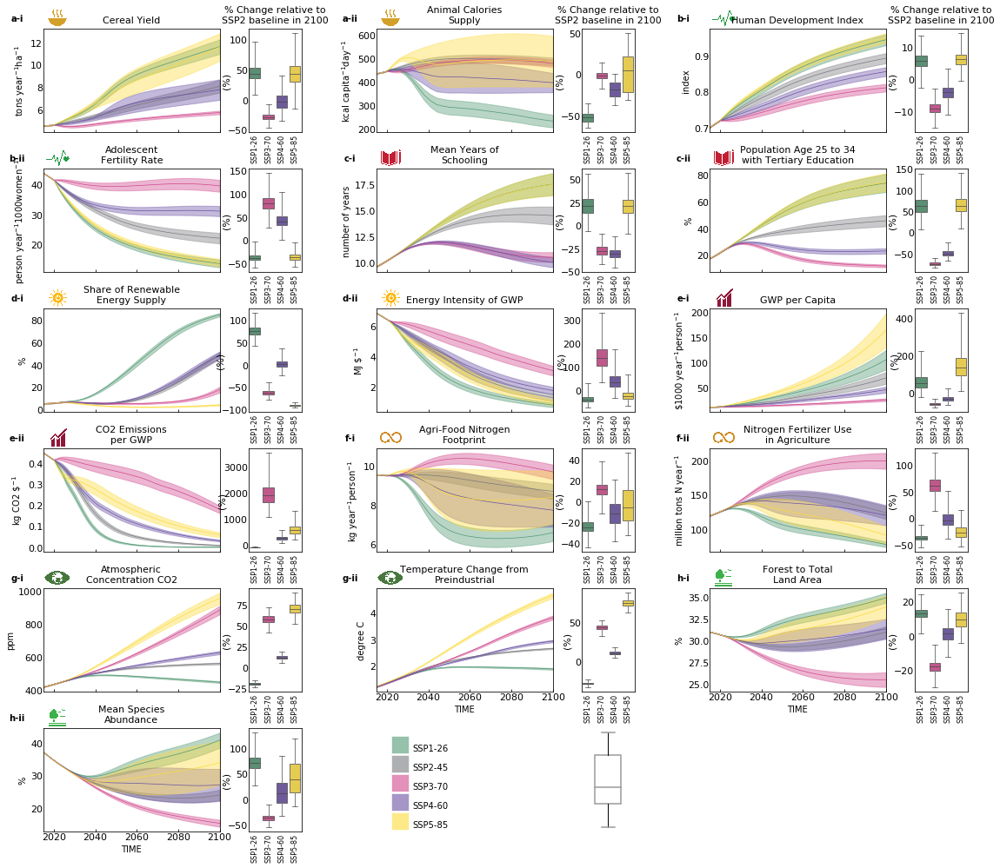

In [32]:
from textwrap import wrap
import matplotlib.image as mpimg
from matplotlib.offsetbox import TextArea, DrawingArea, OffsetImage, AnnotationBbox
import string
from matplotlib.lines import Line2D

unit_keys = {'Cereal Yield':'tons $\mathregular{year^{-1} ha^{-1}}$', 
             'Animal Food supply':'kcal $\mathregular{capita^{-1} day^{-1}}$',
             'Human Development Index':'index',
              'Adolescent Fertility Rate':'person $\mathregular{year^{-1} 1000women^{-1}}$', 
              'Mean Years of Schooling': 'number of years',
             'Population Age 25 to 34 with Tertiary Education':'%', 
              'Share of Renewable Energy Supply':'%', 
              'Energy Intensity of GWP':'MJ $\mathregular{\$^{-1}}$',
             'GWP per Capita':'\$1000 $\mathregular{year^{-1} person^{-1}}$', 
              'CO2 Emissions per GWP':'kg CO2 $\mathregular{\$^{-1}}$', 
              'Agro Food Nitrogen Production Footprint':'kg $\mathregular{year^{-1} person^{-1}}$', 
            'Nitrogen Fertilizer Use in Agriculture':'million tons N $\mathregular{year^{-1}}$',
             'Atmospheric Concentration CO2':'ppm', 
              'Temperature Change from Preindustrial':'degree C',  
              'Forest to Total Land Area':'%', 
             'Mean Species Abundance':'%'}

ssp_names = {'SSP1-26': 'SSP1-26', 'SSP2-45': 'SSP2-45', 
             'SSP3-70': 'SSP3-70', 'SSP4-60': 'SSP4-60', 'SSP5-85': 'SSP5-85'}


"""
First, create figure, grid space, and subplots
"""


# Create grids and axes
fig = plt.figure(figsize=(20, 17))

# The plots will be in n column and am number of rows, depending on the number of indicators
fig_rows = 6
fig_cols = 3

# Set the width ratio of subplots (main plot, colorbar, and gap between horizontal plots)
width_ratios = [5, 1.5, .5]*fig_cols
grid = plt.GridSpec(fig_rows, fig_cols*3, hspace=0.35, wspace=0.35, width_ratios=width_ratios)

axes = {}

# Create subplots
for i in range(fig_rows):
    for j in range(fig_cols):
        axes[i,j*3] = fig.add_subplot(grid[i, j*3])
        axes[i,j*3].tick_params(axis='both', direction='in', pad=0.8, labelsize=11, left=False)
        axes[i,j*3+1] = fig.add_subplot(grid[i, j*3+1])
        axes[i,j*3+1].tick_params( bottom=False,  
                                  axis='x', pad=-2, rotation=90, labelsize=8)
        axes[i,j*3+1].tick_params(axis='y', direction='in', pad=.9, labelsize=11, left=False)
        #axes[i,j*3+1].yaxis.tick_right()
        
        if i in [0,1,2,3]:
            axes[i,j*3].tick_params(axis='x', direction='in', labelbottom=False)
        if i == 4 and j == 0:
            axes[i,j*3].tick_params(axis='x', direction='in', labelbottom=False)
            
for j in [1,2]:
    axes[5,j*3].axis('off')
    axes[5,j*3+1].axis('off')
    
    
"""
First, Develop envelope plots and box plots
"""

# For iterating between SDG icons
sdg_ind_no = [2,4,6,8,10,12,14,16] # Cumulative number of indicators per SDGs
sdg_n = [2, 3, 4, 7, 8, 12, 13, 15]
g = 0
    
    
# For iterating between  subplot labels
fig_sdg = list(string.ascii_lowercase)
fig_ind = ['-i', '-ii', '-iii', '-iv', '-v', '-vi', '-vii', '-viii', '-ix', '-x']
ind = 0


# Filter 2100 data for boxplots
data_sc = outcomes_dict_2[outcomes_dict_2['TIME'].isin(['2100'])] 

# For marking target lines
target_yr_val = {2030: targets_2030, 2050: targets_2050, 2100: targets_2100}
            
# For iterating betweeing subplots
i = 0
j = 0

for v, var in enumerate(indicator_list): #['Vegetal Food supply','Animal Food supply',]
    if j == fig_cols:
        j = 0
        i += 1
        
    for s, sc in enumerate(scenarios):
        ax = sns.lineplot(x='TIME', y=var, ci='sd', data=outcomes_dict_e[sc], ax=axes[i,j*3], marker='', 
                     color=sc_colors[sc], lw=.7,
                     err_kws={'alpha':.4})
        #ax.lines[s].set_linestyle(sc_lines[sc])
        
        if v in [2, 5,6,7,10,11,12, 13]:
            lim = 24
        else:
            lim = 15
        
        # Temprary code to correct two subplot title. This should be removed once it's corrected in the model var name in Vensim
        if var in ['Vegetal Food supply']:
            axes[i,j*3].set_title('\n'.join(wrap('Vegetal Calories Supply', lim)), fontsize=11, pad=7)
        elif var in ['Animal Food supply']:
            axes[i,j*3].set_title('\n'.join(wrap('Animal Calories Supply', lim)), fontsize=11, pad=7)
        elif var in ['Agro Food Nitrogen Production Footprint']:
            axes[i,j*3].set_title('\n'.join(wrap('Agri-Food Nitrogen Footprint', lim)), fontsize=11, pad=7)
        else:
            axes[i,j*3].set_title('\n'.join(wrap(var, lim)), fontsize=11, pad=7)
        
        axes[i,j*3].yaxis.set_label_text(unit_keys[var], fontsize=10)

        
       
    # Remove the whitespace at the beginning and end of  x and y axes
    axes[i,j*3].margins(x=0)
    #axes[i,j*3].margins(y=0)
    
    
    
    # Draw boxplots for % change of all scenarios from baseline (SSP2-RCP4.5)
    sns.boxplot(x="Scenario", y=var, data=data_sc,  whis= (0,100),  width=0.8, linewidth=.7, ax=axes[i,j*3+1],
        palette=['#519872','#d1478c', '#6a51a3', '#fddb3a'],  showfliers=False, 
                whiskerprops=dict(linestyle='-',linewidth=1, color='grey'))

    axes[0,j*3+1].set_title('\n'.join(wrap('% Change relative to SSP2 baseline in 2100', 22)), fontsize=11, pad=7)
    axes[i,j*3+1].set_ylabel('(%)', size=11, labelpad=-4)
    axes[i,j*3+1].set_xlabel('')
    
    
    # Print the SDG icon and add subplot labels
    img_dir = 'C:/Users/moallemie/GitHub/Scenario_Modelling/Fig/SDG_icons/'

    if v > sdg_ind_no[g]-1:
        g = g+1
        ind = 0

    img = mpimg.imread(img_dir+str(sdg_n[g])+'.png')
    imagebox = OffsetImage(img, zoom=0.013)
    ab = AnnotationBbox(imagebox, (.08, 1.1), xycoords='axes fraction', frameon=False) 
    axes[i,j*3].add_artist(ab)

    #Add subplot label text
    axes[i,j*3].text(-.15, 1.1, fig_sdg[g]+fig_ind[ind], fontsize=10, fontweight='semibold', rotation=0,
                     horizontalalignment='center', verticalalignment='center', transform=axes[i,j*3].transAxes)

    ind += 1 # Iterate between subplot lables under each SDG
    
    j += 1
    

# Create legends
legend_elements_2 = []

for i in scenarios:
    legend_elements_2.append(Line2D([0], [0], marker="s", color='none', label=ssp_names[i], 
                                  markersize=20, markeredgecolor='white', markerfacecolor=sc_colors[i], alpha=.6))

fig.legend(handles=legend_elements_2, loc='upper left', bbox_to_anchor=(.4, .17, .4, .05), frameon=False, 
           bbox_transform=fig.transFigure, ncol=1, 
           handlelength=1, columnspacing=1, handletextpad=.9, labelspacing=.01, fontsize=10, handleheight=3)



# For drawing piechart and boxplot legend, we use a hidden subplot and map them as norma piechart and boxplots
axes[5,6].set_xlim([0,1])
axes[5,6].set_ylim([0,1])

# Create a fake dataframe for legend boxplot. 
data_temp = outcomes_dict_2[(outcomes_dict_2['TIME'].isin(['2050'])) & (outcomes_dict_2['Scenario']=='SSP5-85')]
sns.boxplot(x="Scenario", y='Mean Species Abundance', data=data_temp,  palette=['white'],
            whis= (0,100),  width=0.5, linewidth=1.5,ax=axes[5,4],showfliers=False, 
            whiskerprops=dict(linestyle='-',linewidth=1, color='black'))


# Save figures
plt.savefig('{}/SSPs_SDGs_evaluation_300dpi.png'.format(r'C:/Users/moallemie/GitHub/Scenario_Modelling/Fig/'), dpi=300,  bbox_inches='tight') 
plt.savefig('{}/SSPs_SDGs_evaluation.png'.format(r'C:/Users/moallemie/GitHub/Scenario_Modelling/Fig/'), dpi=600,  bbox_inches='tight') 
plt.savefig('{}/SSPs_SDGs_evaluation.pdf'.format(r'C:/Users/moallemie/GitHub/Scenario_Modelling/Fig/'), dpi=600,  bbox_inches='tight') 


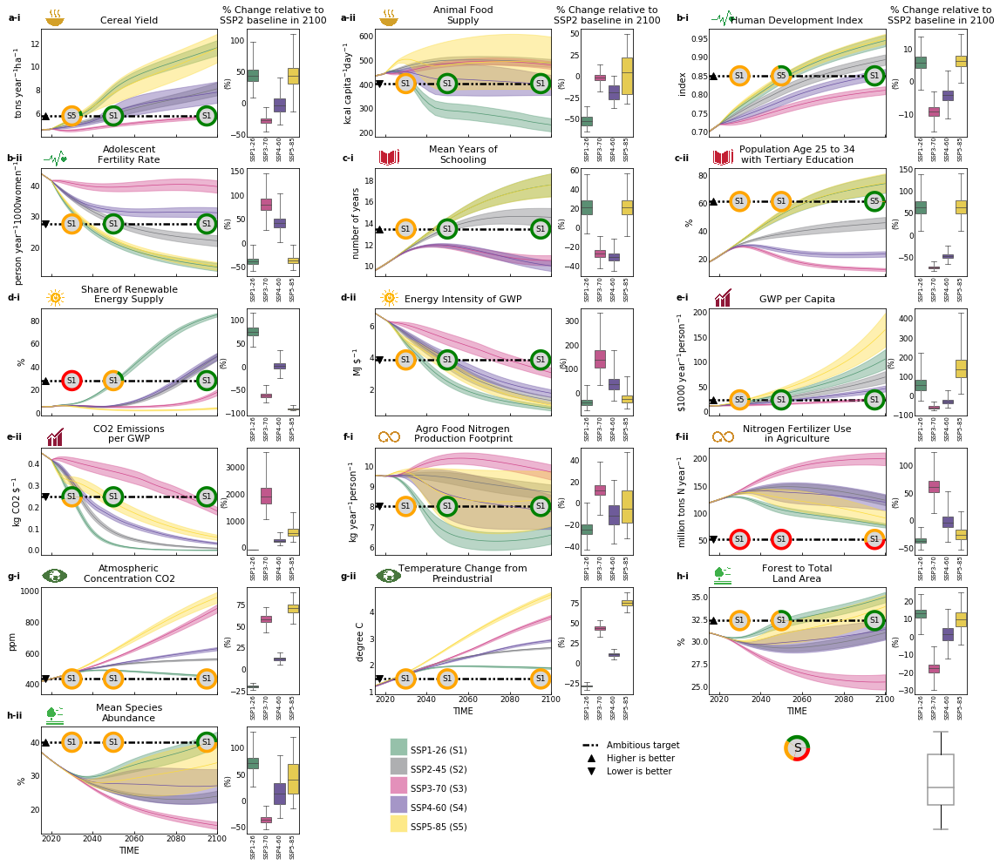

In [12]:
from textwrap import wrap
import matplotlib.image as mpimg
from matplotlib.offsetbox import TextArea, DrawingArea, OffsetImage, AnnotationBbox
import string
from matplotlib.lines import Line2D


# Function for drawing pie chart scatter plot
def draw_pie(dist, 
             xpos, 
             ypos, 
             size,
             alpha, zorder,
             ax=None):
    if ax is None:
        fig, ax = plt.subplots(figsize=(10,8))

    # for incremental pie slices
    cumsum = np.cumsum(dist)
    cumsum = cumsum/ cumsum[-1]
    pie = [0] + cumsum.tolist()

    i = 0
    for r1, r2 in zip(pie[:-1], pie[1:]):
        angles = np.linspace(2 * np.pi * r1, 2 * np.pi * r2)
        x = [0] + np.cos(angles).tolist()
        y = [0] + np.sin(angles).tolist()

        xy = np.column_stack([x, y])
        slice_color = {0:'green', 1:'orange', 2:'red'}
        #{0:'green', 1:'#D8D8D8'}
        ax.scatter([xpos], [ypos], marker=xy, color=slice_color[i], edgecolors='none', alpha=alpha, s=size,  zorder=zorder) #
        ax.scatter([xpos], [ypos], marker=xy, color='#D8D8D8', edgecolors='none', alpha=alpha, s=size/2,  zorder=zorder)
        i += 1

    return ax 



unit_keys = {'Cereal Yield':'tons $\mathregular{year^{-1} ha^{-1}}$', 
             'Animal Food supply':'kcal $\mathregular{capita^{-1} day^{-1}}$',
             'Human Development Index':'index',
              'Adolescent Fertility Rate':'person $\mathregular{year^{-1} 1000women^{-1}}$', 
              'Mean Years of Schooling': 'number of years',
             'Population Age 25 to 34 with Tertiary Education':'%', 
              'Share of Renewable Energy Supply':'%', 
              'Energy Intensity of GWP':'MJ $\mathregular{\$^{-1}}$',
             'GWP per Capita':'\$1000 $\mathregular{year^{-1} person^{-1}}$', 
              'CO2 Emissions per GWP':'kg CO2 $\mathregular{\$^{-1}}$', 
              'Agro Food Nitrogen Production Footprint':'kg $\mathregular{year^{-1} person^{-1}}$', 
            'Nitrogen Fertilizer Use in Agriculture':'million tons N $\mathregular{year^{-1}}$',
             'Atmospheric Concentration CO2':'ppm', 
              'Temperature Change from Preindustrial':'degree C',  
              'Forest to Total Land Area':'%', 
             'Mean Species Abundance':'%'}

ssp_names = {'SSP1-26': 'SSP1-26 (S1)', 'SSP2-45': 'SSP2-45 (S2)', 
             'SSP3-70': 'SSP3-70 (S3)', 'SSP4-60': 'SSP4-60 (S4)', 'SSP5-85': 'SSP5-85 (S5)'}


"""
First, create figure, grid space, and subplots
"""


# Create grids and axes
fig = plt.figure(figsize=(20, 17))

# The plots will be in n column and am number of rows, depending on the number of indicators
fig_rows = 6
fig_cols = 3

# Set the width ratio of subplots (main plot, colorbar, and gap between horizontal plots)
width_ratios = [5, 1.5, .5]*fig_cols
grid = plt.GridSpec(fig_rows, fig_cols*3, hspace=0.3, wspace=0.35, width_ratios=width_ratios)

axes = {}

# Create subplots
for i in range(fig_rows):
    for j in range(fig_cols):
        axes[i,j*3] = fig.add_subplot(grid[i, j*3])
        axes[i,j*3].tick_params(axis='both', direction='in', pad=0.8, labelsize=9, left=False)
        axes[i,j*3+1] = fig.add_subplot(grid[i, j*3+1])
        axes[i,j*3+1].tick_params( bottom=False,  
                                  axis='x', rotation=90, direction='in', pad=-.5, labelsize=7)
        axes[i,j*3+1].tick_params(axis='y', direction='in', pad=.9, labelsize=9, left=False)
        #axes[i,j*3+1].yaxis.tick_right()
        
        if i in [0,1,2,3]:
            axes[i,j*3].tick_params(axis='x', direction='in', labelbottom=False)
        if i == 4 and j == 0:
            axes[i,j*3].tick_params(axis='x', direction='in', labelbottom=False)
            
for j in [1,2]:
    axes[5,j*3].axis('off')
    axes[5,j*3+1].axis('off')
    
    
"""
First, Develop envelope plots and box plots
"""

# For iterating between SDG icons
sdg_ind_no = [2,4,6,8,10,12,14,16] # Cumulative number of indicators per SDGs
sdg_n = [2, 3, 4, 7, 8, 12, 13, 15]
g = 0
    
    
# For iterating between  subplot labels
fig_sdg = list(string.ascii_lowercase)
fig_ind = ['-i', '-ii', '-iii', '-iv', '-v', '-vi', '-vii', '-viii', '-ix', '-x']
ind = 0


# Filter 2100 data for boxplots
data_sc = outcomes_dict_2[outcomes_dict_2['TIME'].isin(['2100'])] 

# For marking target lines
target_yr_val = {2030: targets_2030, 2050: targets_2050, 2100: targets_2100}
            
# For iterating betweeing subplots
i = 0
j = 0

for v, var in enumerate(indicator_list): #['Vegetal Food supply','Animal Food supply',]
    if j == fig_cols:
        j = 0
        i += 1
        
    for s, sc in enumerate(scenarios):
        ax = sns.lineplot(x='TIME', y=var, ci='sd', data=outcomes_dict_e[sc], ax=axes[i,j*3], marker='', 
                     color=sc_colors[sc], lw=.7,
                     err_kws={'alpha':.4})
        #ax.lines[s].set_linestyle(sc_lines[sc])
        
        if v in [2, 5,6,7,10,11,12, 13]:
            lim = 24
        else:
            lim = 15
        
        # Temprary code to correct two subplot title. This should be removed once it's corrected in the model var name in Vensim
        if var in ['Vegetal Food supply']:
            axes[i,j*3].set_title('\n'.join(wrap('Vegetal Food Supply', lim)), fontsize=11, pad=7)
        elif var in ['Animal Food supply']:
            axes[i,j*3].set_title('\n'.join(wrap('Animal Food Supply', lim)), fontsize=11, pad=7) 
        else:
            axes[i,j*3].set_title('\n'.join(wrap(var, lim)), fontsize=11, pad=7)
        
        axes[i,j*3].yaxis.set_label_text(unit_keys[var], fontsize=10)

        
       
    # Remove the whitespace at the beginning and end of  x and y axes
    axes[i,j*3].margins(x=0)
    #axes[i,j*3].margins(y=0)
    
    
    
    # Draw boxplots for % change of all scenarios from baseline (SSP2-RCP4.5)
    sns.boxplot(x="Scenario", y=var, data=data_sc,  whis= (0,100),  width=0.8, linewidth=.7, ax=axes[i,j*3+1],
        palette=['#519872','#d1478c', '#6a51a3', '#fddb3a'],  showfliers=False, 
                whiskerprops=dict(linestyle='-',linewidth=1, color='grey'))

    axes[0,j*3+1].set_title('\n'.join(wrap('% Change relative to SSP2 baseline in 2100', 22)), fontsize=11, pad=7)
    axes[i,j*3+1].set_ylabel('(%)', size=8, labelpad=-4)
    axes[i,j*3+1].set_xlabel('')
            

    """
    Third, Annotate the target levels
    """
    
    # Only 2030 targets at the ambitious level
    targets_value = [target_yr_val[2030][var][0]]
    targets_year = [2017]

    # For indicators where reduction in indicator value is desired
    if targets_2030[var][5] == 'lower is better':
        axes[i,j*3].axhline(y=targets_value, xmin=0, xmax=1, dashes=(3, 1, 1, 1, 1, 1),  
                            alpha=1, lw=2.5, c='black', zorder=1)
        axes[i,j*3].plot(targets_year, targets_value, linestyle="None", marker='v', alpha=1, markersize=8 ,
                         color='black')
    # For indicators where increase in value is desired
    if targets_2030[var][5] == 'higher is better':
        axes[i,j*3].axhline(y=targets_value, xmin=0, xmax=1, dashes=(3, 1, 1, 1, 1, 1), 
                            alpha=1, lw=2.5, c='black', zorder=1)
        axes[i,j*3].plot(targets_year, targets_value, linestyle="None", marker='^', alpha=1, markersize=8 ,
                         color='black')

    
    
    """
    Fourth, develop pie charts for the highest number of SOWs at each time (2030, 2050, 2100) for all SSPs excpet SSP2
    """
    # Count how many SOWs meet target
    s_names = {'SSP1-26': 'S1', 
             'SSP3-70': 'S3', 'SSP4-60': 'S4', 'SSP5-85': 'S5'}
    
    for year in [2030, 2050, 2100]:
        sow_green = {}
        sow_orange = {}
        sow_red = {}
        for sc in ['SSP1-26','SSP3-70','SSP4-60','SSP5-85']: # We excluded SSP2-45 from representation in pie charts as its our baseline
            x = outcomes_dict_e[sc][outcomes_dict_e[sc]['TIME']==year]
            if targets_2030[var][5] == 'lower is better':
                y1 = x[x[var] <= targets_value[0]]
                y2 = x[(x[var] <= targets_value[0]*1.5) & (x[var] > targets_value[0])]
                y3 = x[x[var] > targets_value[0]*1.5]
            if targets_2030[var][5] == 'higher is better':
                y1 = x[x[var] >= targets_value[0]]
                y2 = x[(x[var] >= targets_value[0]*.5) & (x[var] < targets_value[0])]
                y3 = x[x[var] < targets_value[0]*0.5]
            sow_green[sc] = (len(y1.index)/10000)*100
            sow_orange[sc] = (len(y2.index)/10000)*100
            sow_red[sc] = (len(y3.index)/10000)*100
 
        # The best case progress is the highest number of SOWs meeting the ambitious target (green) among the SSPs.
        max_ssp = max(sow_green.values())
        max_ssp_key = max(sow_green, key=sow_green.get)
        # If other SSPs result in the same number of SOW to SSP1, then choose SSP1
        if (max_ssp_key != 'SSP1-26' and max_ssp == sow_green['SSP1-26']):
            max_ssp = sow_green['SSP1-26']
            max_ssp_key = 'SSP1-26' 

        if year == 2100:
            year = 2095
        draw_pie([sow_green[max_ssp_key], sow_orange[max_ssp_key], sow_red[max_ssp_key]], year, targets_value ,600, alpha=1, ax=axes[i,j*3], zorder=10)
        axes[i,j*3].text(year, targets_value[0], s_names[max_ssp_key], fontsize=9, color='black', alpha=1, 
                       fontweight='normal', rotation=0, horizontalalignment='center', verticalalignment='center', zorder=10)
    
    
    # Print the SDG icon and add subplot labels
    img_dir = 'C:/Users/moallemie/GitHub/Scenario_Modelling/Fig/SDG_icons/'

    if v > sdg_ind_no[g]-1:
        g = g+1
        ind = 0

    img = mpimg.imread(img_dir+str(sdg_n[g])+'.png')
    imagebox = OffsetImage(img, zoom=0.013)
    ab = AnnotationBbox(imagebox, (.08, 1.1), xycoords='axes fraction', frameon=False) 
    axes[i,j*3].add_artist(ab)

    #Add subplot label text
    axes[i,j*3].text(-.15, 1.1, fig_sdg[g]+fig_ind[ind], fontsize=10, fontweight='semibold', rotation=0,
                     horizontalalignment='center', verticalalignment='center', transform=axes[i,j*3].transAxes)

    ind += 1 # Iterate between subplot lables under each SDG
    
    j += 1
    

# Create legends
legend_elements_2 = []

for i in scenarios:
    legend_elements_2.append(Line2D([0], [0], marker="s", color='none', label=ssp_names[i], 
                                  markersize=20, markeredgecolor='white', markerfacecolor=sc_colors[i], alpha=.6))

fig.legend(handles=legend_elements_2, loc='upper left', bbox_to_anchor=(.4, .17, .4, .05), frameon=False, 
           bbox_transform=fig.transFigure, ncol=1, 
           handlelength=1, columnspacing=1, handletextpad=.9, labelspacing=.01, fontsize=10, handleheight=3)
legend_elements = [Line2D([0], [0], color='black', lw=2.5, dashes=(3, 1, 1, 1, 1, 1), label='Ambitious target'), 
                   Line2D([0], [0], color='black', linestyle="None", marker='^', markersize=8 ,label='Higher is better'),
                   Line2D([0], [0], color='black', linestyle="None", marker='v', markersize=8 ,label='Lower is better')]


fig.legend(handles=legend_elements, loc='upper left', bbox_to_anchor=(.55, .22),  
           bbox_transform=fig.transFigure, frameon=False, ncol=1)

# For drawing piechart and boxplot legend, we use a hidden subplot and map them as norma piechart and boxplots
axes[5,6].set_xlim([0,1])
axes[5,6].set_ylim([0,1])
draw_pie([40, 30, 30], 0.5, .8, 900, alpha=1, ax=axes[5,6], zorder=10)
axes[5,6].text(.5, .8, 'S', fontsize=14, color='black', alpha=1, 
                       fontweight='normal', rotation=0, horizontalalignment='center', verticalalignment='center', zorder=10)

# Create a fake dataframe for legend boxplot. 
data_temp = outcomes_dict_2[(outcomes_dict_2['TIME'].isin(['2050'])) & (outcomes_dict_2['Scenario']=='SSP5-85')]
sns.boxplot(x="Scenario", y='Mean Species Abundance', data=data_temp,  palette=['white'],
            whis= (0,100),  width=0.5, linewidth=1.5,ax=axes[5,7],showfliers=False, 
            whiskerprops=dict(linestyle='-',linewidth=1, color='black'))


# Save figures
#plt.savefig('{}/SSPs_SDGs_evaluation_300dpi.png'.format(r'C:/Users/moallemie/GitHub/Scenario_Modelling/Fig/'), dpi=300,  bbox_inches='tight') 
#plt.savefig('{}/SSPs_SDGs_evaluation.png'.format(r'C:/Users/moallemie/GitHub/Scenario_Modelling/Fig/'), dpi=600,  bbox_inches='tight') 
plt.savefig('{}/SSPs_SDGs_evaluation.pdf'.format(r'C:/Users/moallemie/GitHub/Scenario_Modelling/Fig/'), dpi=600,  bbox_inches='tight') 


## Archive

## SSPs % change from 2015 baseline values

In [116]:
# Convert outcome values to % change from 2015, then;
# Flatten 2D arrays in outcomes[indicator] to 1D array and create a long-format dataframe for plotting;
# Why we convert outcomes to long-format dataframe? because it's the accepted format of sns plots

outcomes_dict = {}

for i in scenarios:
    outcomes_df = pd.DataFrame(columns=(['TIME']+indicator_list))
    for key in (['TIME']+indicator_list): 
        vector = outcomes[i][key][:, 115]
        data = outcomes[i][key]
        out_change = ((data - vector[:,None]) / vector[:,None])*100
        if key == 'TIME':
            outcomes_df[key] = outcomes[i][key][:, 100:].ravel() # timeseries data from 2000 (100:)
        else:
            outcomes_df[key] = out_change[:, 100:].ravel() # timeseries data from 2000 (100:)
    outcomes_dict[i] = outcomes_df 

# Create a long-format dataframe of all timesteps and all scenarios 
outcomes_dict_list = []
for s, sc in enumerate(scenarios):
    outcomes_dict_temp = outcomes_dict[sc]
    outcomes_dict_temp['Scenario'] = sc
    outcomes_dict_list.append(outcomes_dict_temp)
outcomes_dict_2 = pd.concat(outcomes_dict_list)

# Create a dictionary of long-format dataframes of all timesteps per each scenario
outcomes_dict_2_f = {}
for s, sc in enumerate(scenarios):
    outcomes_dict_2_f[sc] = outcomes_dict_2[(outcomes_dict_2['Scenario']==sc)]

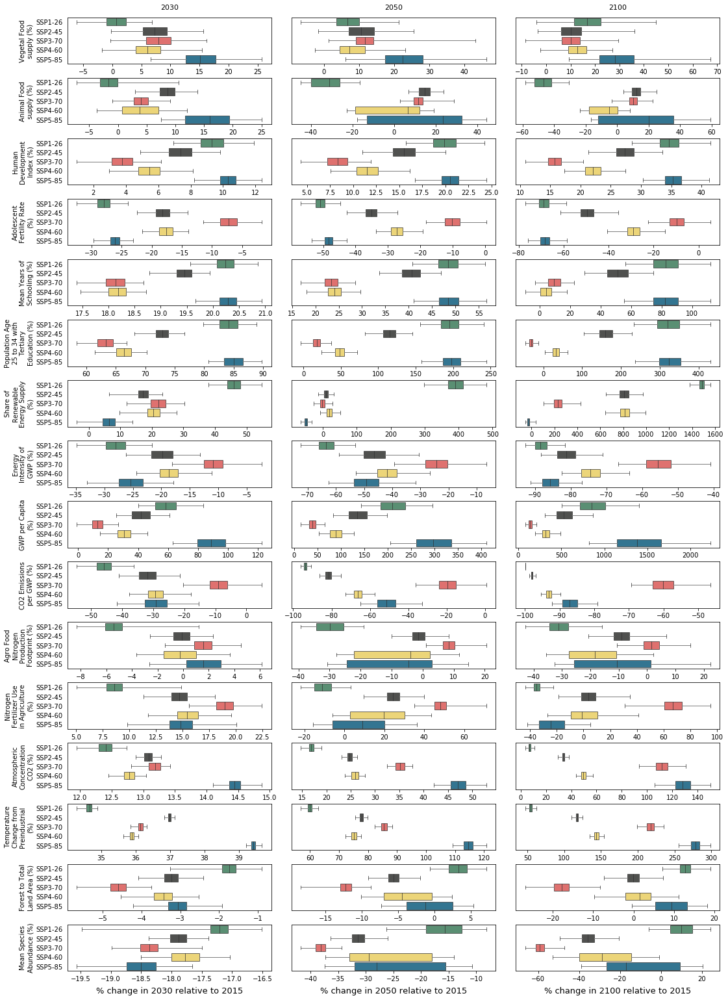

In [165]:
from textwrap import wrap
"""
First, create figure, grid space, and subplots
"""

fig = plt.figure(figsize=(18, 27))

# The plots will be in n column and m number of rows
fig_rows = 16
fig_cols = 3

# Set the width ratio of subplots if there is any
grid = plt.GridSpec(fig_rows, fig_cols, hspace=0.3, wspace=0.1)

axes = {}

# Create the reference axes for subplots.
for i in range(fig_rows):
    axes[i,0] = fig.add_subplot(grid[i,0])
    axes[i,0].tick_params(left=False)    
    

# Create other subplots with the shared axis with the reference subplots.
for i in range(fig_rows):
    for j in range(fig_cols):
        if j > 0:
            axes[i,j] = fig.add_subplot(grid[i,j], sharey=axes[i,0])
            axes[i,j].tick_params(left=False, labelleft=False)
            
            
for y, year in enumerate([2030, 2050, 2100]):
    
    # Filter 2030, 2050, and 2100 data from the data
    data_sc = outcomes_dict_2[outcomes_dict_2['TIME'].isin([year])]
    
    for v, var in enumerate(indicator_list):
        sns.boxplot(x=var, y="Scenario", data=data_sc, whis= (0,100),  width=0.8, linewidth=.7, ax=axes[v,y],
            palette=['#519872','#50514f','#f25f5c', '#ffe066', '#247ba0'], showfliers=False, 
                    whiskerprops=dict(linestyle='-',linewidth=1, color='grey'))
        
        axes[15,y].set_xlabel('% change in '+str(year)+' relative to 2015', size=13, labelpad=7.5)
        axes[v,0].set_ylabel('\n'.join(wrap(var+' (%)', 15)) , size=10, labelpad=3.5)
        axes[v,1].set_ylabel('')
        axes[v,2].set_ylabel('')
        # Set plots title only for the first row
        axes[0,y].set_title(year, fontsize=11, color='black', pad=12) 

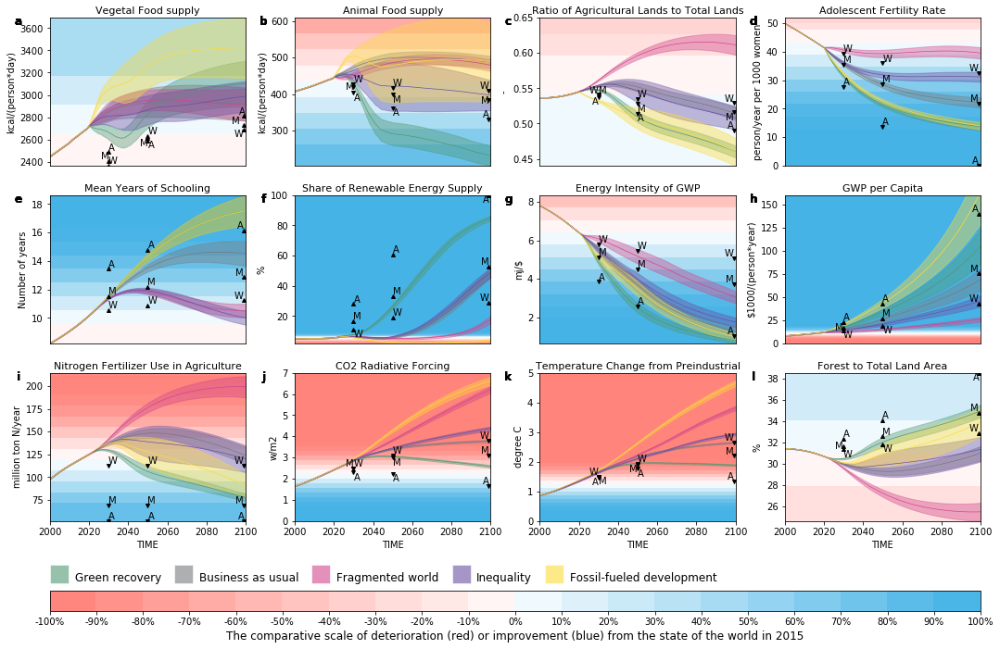

In [12]:
from textwrap import wrap
import math
from adjustText import adjust_text
from matplotlib.lines import Line2D
import matplotlib as mpl
import matplotlib.ticker as mticker
import string

'''# Class to Change offset in scientific axis label format in y axis in plots
class Labeloffset():
    def __init__(self,  ax, label="", axis="y"):
        self.axis = {"y":ax.yaxis, "x":ax.xaxis}[axis]
        self.label=label
        ax.callbacks.connect(axis+'lim_changed', self.update)
        ax.figure.canvas.draw()
        self.update(None)

    def update(self, lim):
        fmt = self.axis.get_major_formatter()
        self.axis.offsetText.set_visible(False)
        ax.set_ylabel(self.label + " "+ fmt.get_offset() , size=9, labelpad=1)'''


# Specify the major indicators for plotting in the main text.
inds_list = ['Vegetal Food supply', 'Animal Food supply',
             'Ratio of Agricultural Lands to Total Lands', 
             'Adolescent Fertility Rate', 
             'Mean Years of Schooling', 
             'Share of Renewable Energy Supply', 'Energy Intensity of GWP', 
             'GWP per Capita', 
             'Nitrogen Fertilizer Use in Agriculture', 
             'CO2 Radiative Forcing', 'Temperature Change from Preindustrial', 
             'Forest to Total Land Area'
            ]
    
# The plots will be in 4 column and a certain number of rows, depending on the number of indicators
fig_rows = 3
fig_cols = 4

fig, axes = plt.subplots(fig_rows, fig_cols, figsize=(18, 10), sharex='col')
fig.subplots_adjust(hspace=0.2, wspace=0.25)

# For iterating betweeing subplots
i = 0
j = 0


for v, var in enumerate(inds_list): #inds_list
    if j == fig_cols:
        j = 0
        i += 1
        
    for s, sc in enumerate(scenarios):
        ax = sns.lineplot(x='TIME', y=var, ci='sd', data=outcomes_dict[sc], ax=axes[i,j], marker='', 
                     color=sc_colors[sc], lw=.7,
                     err_kws={'alpha':.4})
        #ax.lines[s].set_linestyle(sc_lines[sc])
        
        axes[i,j].set_title(var, fontsize=11, pad=4)
        axes[i,j].yaxis.set_label_text(inds_unit[var], fontsize=10)
        
        # Manually adjust the y min and max for better visualsiation of improvement and deterioration.
        if var == 'CO2 Radiative Forcing':
            ax.set_ylim(ymin=0, ymax=7)
        if var == 'Temperature Change from Preindustrial':
            ax.set_ylim(ymin=0, ymax=5)
        if var == 'GWP per Capita':
            ax.set_ylim(ymin=0, ymax=160)
            
        # Add all subplot labels
        fig_label = list(string.ascii_lowercase)    
        ax.text(-.16, .97, fig_label[v], fontsize=12, fontweight='semibold', rotation=0,
                            horizontalalignment='center', verticalalignment='center', transform=ax.transAxes)
        
       
    # Remove the whitespace at the beginning and end of  x and y axes
    axes[i,j].margins(x=0)
    axes[i,j].margins(y=0)

    # Annotate the target levels
    x_val = []
    y_val = []
    for y in range(3):
        targets_value = [targets_2030[var][y], targets_2050[var][y], targets_2100[var][y]]
        targets_year = [2030, 2050, 2099]
        
        # For indicators where reduction in indicator value is desired
        if targets_2030[var][5] == 'lower is better':
            axes[i,j].plot(targets_year, targets_value, linestyle="None", marker='v', alpha=1, markersize=4 ,color='black')
        # For indicators where increase in value is desired
        if targets_2030[var][5] == 'higher is better':
            axes[i,j].plot(targets_year, targets_value, linestyle="None", marker='^', alpha=1, markersize=4 ,color='black')


        x_val = x_val + targets_year
        y_val = y_val + targets_value
        
    text = ['A', 'A', 'A', 'M', 'M', 'M', 'W', 'W', 'W']        
    texts = []
    for x, y, s in zip(x_val, y_val, text):
        texts.append(axes[i,j].text(x, y, s))
    adjust_text(texts, ax= axes[i,j],  expand_text= (1,1) , expand_points=(1,1) , 
                only_move={'points':'xy', 'texts':'xy'}, force_text=(.3, .3), 
                force_points=(.3, .3))
    
    
    # To correct the formarting of the y-axis to appear with scietific format
    #axes[i,j].ticklabel_format(style='sci',axis='y',scilimits=(-2,3))
    #axes[i,j].yaxis.offsetText.set_visible(False)
    #formatter = mticker.ScalarFormatter(useMathText=True)
    #formatter.set_powerlimits((-2,3))
    #axes[i,j].yaxis.set_major_formatter(formatter)
    
    
    
    
    # This is  a temporary change to replace and change the scientific unit of this individual indicator only in plots instead of running the experiments again with a new name and new unit.
    '''if var == 'Total Plant Meat Food Production':
        axes[i,j].yaxis.offsetText.set_visible(False)
        axes[i,j].yaxis.set_label_text('10 billion ton/year')
        axes[i,j].set_title('Plant based plus meat based food', fontsize=11, pad=4)
    elif var == 'Nitrogen Fertilizer Use in Agriculture':
        axes[i,j].yaxis.offsetText.set_visible(False)
        axes[i,j].yaxis.set_label_text('100 million ton/year')
        axes[i,j].set_title(var, fontsize=11, pad=4)
    elif var == 'Phosphorous Fertilizer Use in Agriculture':
        axes[i,j].yaxis.offsetText.set_visible(False)
        axes[i,j].yaxis.set_label_text('10 million ton/year')
        axes[i,j].set_title(var, fontsize=11, pad=4)
    else:
        axes[i,j].set_title(var, fontsize=11, pad=4)
        lo = Labeloffset(axes[i,j], label=inds_unit[var], axis="y")'''


    j += 1


# Removing ticks for inner plots                
for i in range(fig_rows-1):
    for j in range(fig_cols):
        axes[i, j].tick_params(bottom=False)

# Draw the shaded increment boxes in the background of each subplot
i = 0
j = 0
for v, var in enumerate(inds_list): 
    if var in indicator_list:
        if j == fig_cols:
            j = 0
            i += 1
        
        # Create 10% improvement (increase or decrease) increment from the model reference value.
        improv_incr = targets_2030[var][4]*.1
        
        # Get the min and max of each subplot
        y_min = axes[i,j].get_ylim()[0]
        y_max = axes[i,j].get_ylim()[1]
        
        # For indicators where reduction in indicator value is desired
        if targets_2030[var][5] == 'lower is better':
            
            # Color the increment steps up to 10 steps with blue
            for c in range(10):
                if (targets_2030[var][4]-improv_incr*(c+1)) > y_min:
                    axes[i,j].axhspan(targets_2030[var][4]-improv_incr*(c+1), targets_2030[var][4]-improv_incr*(c), 
                                      facecolor='#46b3e6', alpha=0.08+(0.1*c), zorder=-100)
                    axes[i,j].axhspan(y_min, targets_2030[var][4]-improv_incr*(c+1), facecolor='#46b3e6', 
                                      alpha=0.08+(0.1*c), zorder=-100)
                else:
                    if c == 0:
                        axes[i,j].axhspan(y_min, targets_2030[var][4]-improv_incr*(c), facecolor='#46b3e6', 
                                          alpha=0.08+(0.1*c), zorder=-100)
            # Color the increment steps up to 10 steps with red
            for c in range(10):
                if (targets_2030[var][4]+improv_incr*c) < y_max:
                    axes[i,j].axhspan(targets_2030[var][4]+improv_incr*c, targets_2030[var][4]+improv_incr*(c+1), 
                                      facecolor='#ff847c', alpha=0.08+(0.1*c), zorder=-100)
                    axes[i,j].axhspan(targets_2030[var][4]+improv_incr*(c+1), y_max, facecolor='#ff847c', 
                                      alpha=0.08+(0.1*c), zorder=-100)
                else:
                    if c == 0:  
                        axes[i,j].axhspan(targets_2030[var][4]+improv_incr*(c), y_max, facecolor='#ff847c', 
                                          alpha=0.08+(0.1*c), zorder=-100)
                        
        # For indicators where increase in value is desired
        if targets_2030[var][5] == 'higher is better':  
            
            # Color the increment steps up to 10 steps with blue
            for c in range(10):
                if (targets_2030[var][4]+improv_incr*(c+1)) < y_max:
                    axes[i,j].axhspan(targets_2030[var][4]+improv_incr*c, targets_2030[var][4]+improv_incr*(c+1), 
                                      facecolor='#46b3e6', alpha=0.08+(0.1*c), zorder=-100)
                    axes[i,j].axhspan(targets_2030[var][4]+improv_incr*(c+1), y_max, facecolor='#46b3e6', 
                                      alpha=0.08+(0.1*c), zorder=-100)
                else:
                    if c == 0:
                        axes[i,j].axhspan(targets_2030[var][4]+improv_incr*(c), y_max, facecolor='#46b3e6', 
                                          alpha=0.08+(0.1*c), zorder=-100)
            
            # Color the increment steps up to 10 steps with red
            for c in range(10):
                if (targets_2030[var][4]-improv_incr*(c+1)) > y_min:
                    axes[i,j].axhspan(targets_2030[var][4]-improv_incr*(c+1), targets_2030[var][4]-improv_incr*c, 
                                      facecolor='#ff847c', alpha=0.08+(0.1*c), zorder=-100)
                    axes[i,j].axhspan(y_min, targets_2030[var][4]-improv_incr*(c+1), facecolor='#ff847c', 
                                      alpha=0.08+(0.1*c), zorder=-100)
                else:
                    if c == 0:
                        axes[i,j].axhspan(y_min, targets_2030[var][4]-improv_incr*(c), facecolor='#ff847c', 
                                          alpha=0.08+(0.1*c), zorder=-100)
        
        j += 1 
        
'''
# Annotate the regions/world data for comparison with the model projection.
i = 0
j = 0
for v, var in enumerate(sdg_inds['2']+sdg_inds['3']+sdg_inds['4']+sdg_inds['7']+sdg_inds['8']):
    if var in indicator_list:
        if j == fig_cols:
            j = 0
            i += 1
        if var in df_ind1['Target indicator'].to_list():
            var_indx = df_hist.index[df_hist['Target indicator'] == var]
            #data_region = [df_hist['World/region/country'].loc[var_indx].item()]
            data_year = [df_hist['Data reference year'].loc[var_indx].item()]
            data_value = [df_hist['Data reference value'].loc[var_indx].item()]
            axes[i,j].plot(data_year, data_value, linestyle="None", marker='^', alpha=0.5, markersize=10,  
                           markeredgecolor='#ffdd00',color='#f75f00')
            axes[i,j].annotate(df_hist['Scale'].loc[var_indx].item(), (data_year[0], data_value[0]))
        j += 1

'''

# Create legend for the SSPs
legend_elements_2 = []


for i in scenarios:
    legend_elements_2.append(Line2D([0], [0], marker="s", color='none', label=ssp_names[i], 
                                  markersize=20, markeredgecolor='white', markerfacecolor=sc_colors[i], alpha=.6))

fig.legend(handles=legend_elements_2, loc='upper left', bbox_to_anchor=(.12, .02, .4, .05), frameon=False, 
           bbox_transform=fig.transFigure, ncol=20, 
           handlelength=1, columnspacing=1.5, handletextpad=.9, labelspacing=.01, fontsize=12, handleheight=2.4)

# Create the colorbar for background gradients

# First, create a list of our values for colorbar
vals = list(range(-100, 101, 10))
vals = [x/100 for x in vals]
vals_text = ["{0:.0%}".format(x) for x in vals]

# Second, create the colour names with a function

def alpha_blending(hex_color, alpha) :
    """ alpha blending as if on the white background.
    """
    foreground_tuple  = mpl.colors.hex2color(hex_color)
    foreground_arr = np.array(foreground_tuple)
    final = tuple( (1. -  alpha) + foreground_arr*alpha )
    return(final)

colorbar_list = []
for i in range(10):
    colorbar_list.append(alpha_blending('#ff847c', 0.08+(0.1*i)))
colorbar_list = colorbar_list[::-1]
for i in range(10):
    colorbar_list.append(alpha_blending('#46b3e6', 0.08+(0.1*i)))
    

# Third, create a ListedColormap object, which contains the information of the colours we want to display in our colourbar
cmap = mpl.colors.ListedColormap(colorbar_list)

# Fourth, set the colormap index for discrete color bar
norm = mpl.colors.BoundaryNorm(vals, cmap.N)

# Fifth, create the colorbar
ax2 = fig.add_axes([0.95, 0.1, 0.03, 0.7]) 

cb = mpl.colorbar.ColorbarBase(ax2, cmap=cmap,
                                norm=norm,
                                spacing='uniform',
                                orientation='horizontal',
                                extend='neither',
                                ticks=vals)
cb.set_ticklabels(vals_text)


cb.set_label('The comparative scale of deterioration (red) or improvement (blue) from the state of the world in 2015', fontsize=12)
ax2.set_position((0.125, -.01, 0.775, 0.03))

plt.savefig('{}/SSPs_SDGs_timeseries_maintext_300dpi.png'.format(r'C:/Users/moallemie/GitHub/SSPs_SDGs_Assessment/Fig/'), dpi=300,  bbox_inches='tight') 
plt.savefig('{}/SSPs_SDGs_timeseries_maintext.png'.format(r'C:/Users/moallemie/GitHub/SSPs_SDGs_Assessment/Fig/'), dpi=600,  bbox_inches='tight') 
plt.savefig('{}/SSPs_SDGs_timeseries_maintext.pdf'.format(r'C:/Users/moallemie/GitHub/SSPs_SDGs_Assessment/Fig/'), dpi=600,  bbox_inches='tight') 


## Target ambition and feasibility test (maintext)

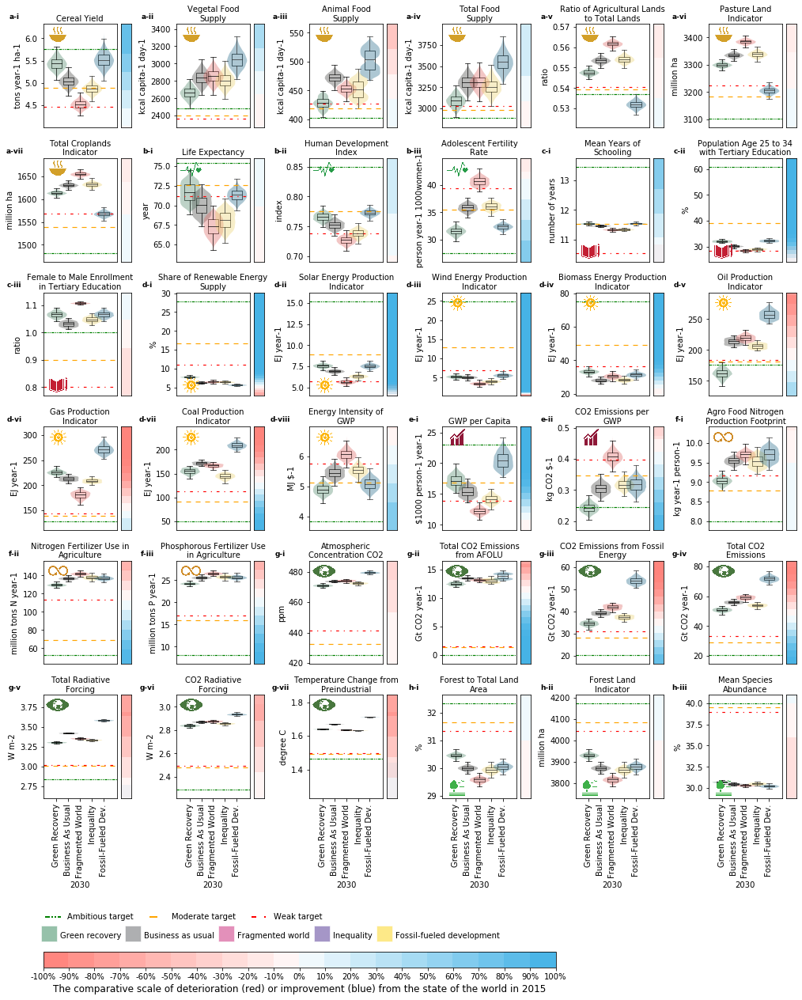

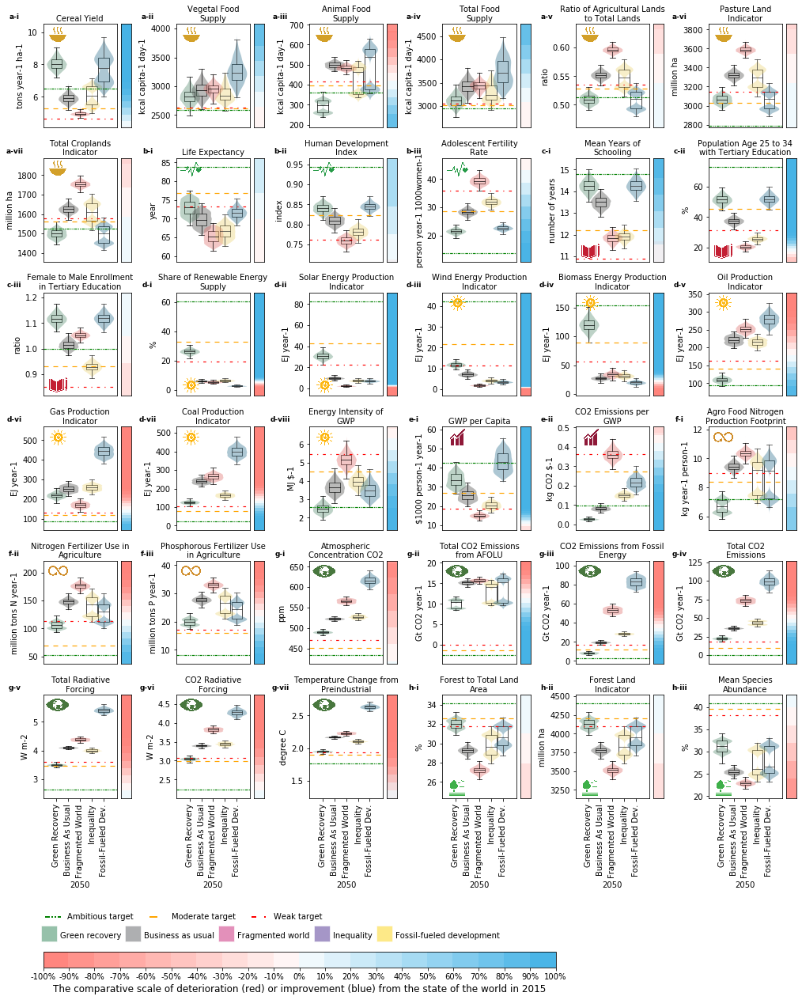

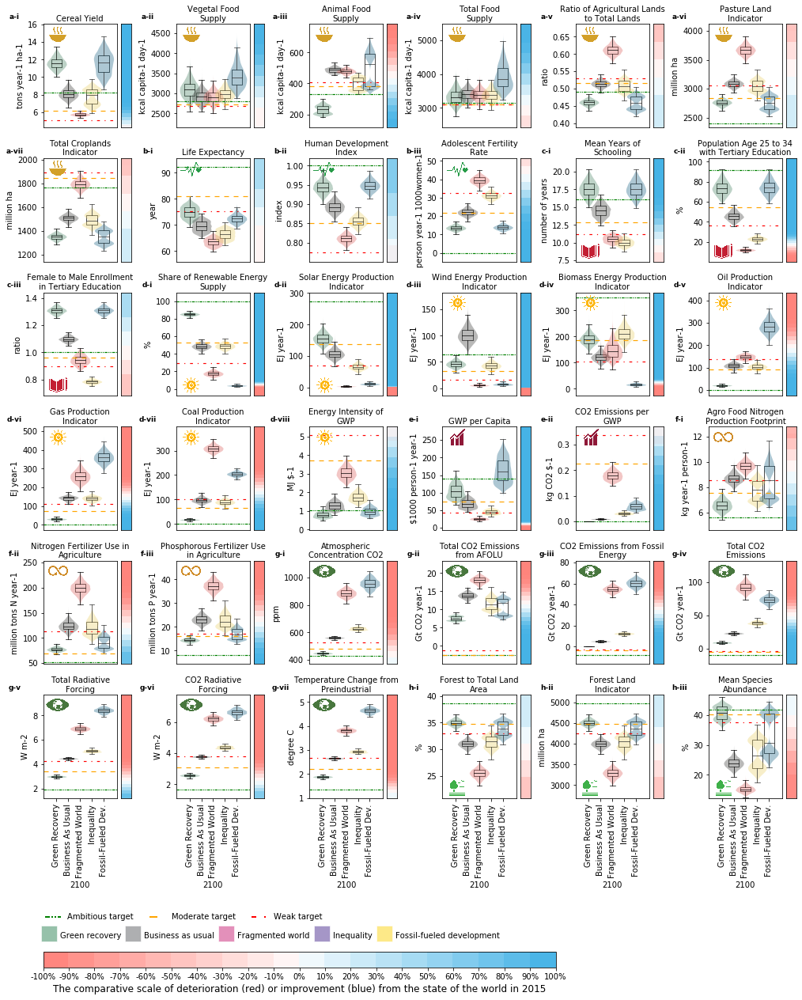

In [10]:
from textwrap import wrap
import math
from adjustText import adjust_text
from matplotlib.lines import Line2D
import matplotlib as mpl
import matplotlib.ticker as mticker
import string
import matplotlib.image as mpimg
from matplotlib.offsetbox import TextArea, DrawingArea, OffsetImage, AnnotationBbox


target_yr_val = {2030: targets_2030, 2050: targets_2050, 2100: targets_2100}

for yr in [2030, 2050, 2100]:
    # Flatten 2D arrays in outcomes[indicator] to 1D array and create a long-format dataframe for plotting the uncertainty
    # Why we convert outcomes to long-format dataframe? because it's the accepted format of sns.lineplot which draws uncertainty
    outcomes_dict_list = []


    for s, sc in enumerate(scenarios):
        outcomes_dict_temp = outcomes_dict[sc]
        outcomes_dict_temp['Pathway'] = ssp_names[sc]
        outcomes_dict_list.append(outcomes_dict_temp)

    outcomes_dict_2 = pd.concat(outcomes_dict_list)
    outcomes_dict_2_f = outcomes_dict_2[(outcomes_dict_2['TIME']==yr)]


    # Temporary indicator list to be used in plotting here. It's the same to the list of all indicators minus share of fossil energy
    inds_remove = ['Share of Fossil Energy Supply']
    inds_list = [x for x in indicator_list if x not in inds_remove]

    line_style = [((3, 1, 1, 1, 1, 1), 'green'), ((5, 5), 'orange'), ((3, 5, 1, 5), 'red')]


    # Create grids and axes
    fig = plt.figure(figsize=(18, 18))

    # The plots will be in n column and am number of rows, depending on the number of indicators
    fig_rows = 6
    fig_cols = 6

    # Set the width ratio of subplots (main plot, colorbar, and gap between horizontal plots)
    width_ratios = [5, .7, 2.5]*fig_cols
    grid = plt.GridSpec(fig_rows, fig_cols*3, hspace=0.3, wspace=0.1, width_ratios=width_ratios)

    axes = {}

    # Create the reference axes for subplots and their color gradient.
    for j in range(fig_cols):
        axes[5,j*3] = fig.add_subplot(grid[5, j*3])
        axes[5,j*3+1] = fig.add_subplot(grid[5, j*3+1], sharey=axes[5,j*3])

    # Create othersubplots and their color gradient with shared axis with the reference plots.
    for i in range(fig_rows-1):
        for j in range (fig_cols):
            axes[i,j*3] = fig.add_subplot(grid[i, j*3], sharex=axes[5,j*3])
            axes[i,j*3+1] = fig.add_subplot(grid[i, j*3+1], sharex=axes[5,j*3+1])


    # For iterating betweeing subplots
    i = 0
    j = 0

    # For iterating between SDG icons
    sdg_ind_no = [7,10,13,21,23,26,33,36] # Cumulative number of indicators per SDGs
    sdg_n = [2, 3, 4, 7, 8, 12, 13, 15]
    s = 0

    # For iterating between  subplot labels
    fig_sdg = list(string.ascii_lowercase)
    fig_ind = ['-i', '-ii', '-iii', '-iv', '-v', '-vi', '-vii', '-viii', '-ix', '-x']
    ind = 0

    for v, var in enumerate(inds_list): #inds_list
        if j == fig_cols:
            j = 0
            i += 1

        sns.violinplot(x="Pathway", y=var,data=outcomes_dict_2_f, 
                       palette=['#519872','#50514f','#f25f5c', '#ffe066', '#247ba0'], 
                       linewidth=0, ax=axes[i,j*3], scale='width', width=1.7)
        for violin, alpha in zip(axes[i,j*3].collections[::2], [.4, .4, .4, .4, .4]):
            violin.set_alpha(alpha)

        sns.boxplot(x="Pathway", y=var,data=outcomes_dict_2_f,  width=0.9, linewidth=.7, ax=axes[i,j*3],
            palette=['#519872','#50514f','#f25f5c', '#ffe066', '#247ba0'], showfliers=False)

        for a,artist in enumerate(axes[i,j*3].artists):
            # Set the linecolor on the artist to the facecolor, and set the facecolor to None
            col = artist.get_facecolor()
            artist.set_edgecolor('black')
            artist.set_facecolor('None')

            # Each box has 6 associated Line2D objects (to make the whiskers, fliers, etc.)
            # Loop over them here, and use the same colour as above
            for b in range(a*5,a*5+5):
                line = axes[i,j*3].lines[b]
                line.set_color('black')
                line.set_mfc('black')
                line.set_mec('black')


        # Set title and y-axis unit
        x_labels = ['Green Recovery','Business As Usual','Fragmented World','Inequality','Fossil-Fueled Dev.']
        if len(var) < 20:
            nwrap = 15
        if (len(var) < 30) and (len(var) > 20):
            nwrap=20
        if len(var) > 30:
            nwrap = 27
        # Temprary code to correct two subplot title. This should be removed once it's corrected in the model var name in Vensim
        if var in ['Vegetal Food supply']:
            axes[i,j*3].set_title('\n'.join(wrap('Vegetal Food Supply', nwrap)), fontsize=10, pad=4)
        elif var in ['Animal Food supply']:
            axes[i,j*3].set_title('\n'.join(wrap('Animal Food Supply', nwrap)), fontsize=10, pad=4) 
        else:
            axes[i,j*3].set_title('\n'.join(wrap(var, nwrap)), fontsize=10, pad=4)
        axes[i,j*3].yaxis.set_label_text('\n'.join(wrap(inds_unit[var], 25)), fontsize=10)
        axes[i,j*3].set_xticklabels(x_labels, fontsize=10, rotation=90)
        #axes[i, j*3].tick_params(axis='x', rotation=90) 
        axes[i, j*3].set_xlabel(str(yr))
        #axes[i,j].get_legend().remove()

        # Adjust the plot margins
        axes[i,j*3].margins(x=.05)
        axes[i,j*3].margins(y=.1)
        axes[i,j*3+1].margins(y=0)


        # Annotate the target levels
        x_val = []
        y_val = []

        for y in range(3):
            targets_value = [target_yr_val[yr][var][y]]
            targets_year = [0]

            # For indicators where reduction in indicator value is desired
            if targets_2030[var][5] == 'lower is better':
                axes[i,j*3].axhline(y=targets_value, xmin=0, xmax=1, dashes=line_style[y][0],  alpha=1, lw=1.2, c=line_style[y][1])
                #axes[i,j].plot(targets_year, targets_value, linestyle="None", marker='v', alpha=1, markersize=4 ,color='black')
            # For indicators where increase in value is desired
            if targets_2030[var][5] == 'higher is better':
                axes[i,j*3].axhline(y=targets_value, xmin=0, xmax=1, dashes=line_style[y][0], alpha=1, lw=1.2, c=line_style[y][1])

            x_val = x_val + targets_year
            y_val = y_val + targets_value

        #text = ['A', 'M', 'W']        
        #texts = []
        #for x, y, s in zip(x_val, y_val, text):
            #texts.append(axes[i,j*3+1].text(x, y, s))


        # Print the SDG icon and add subplot labels
        img_dir = 'C:/Users/moallemie/GitHub/SSPs_SDGs_Assessment/Fig/SDG_icons/'

        if v > sdg_ind_no[s]-1:
            s = s+1
            ind = 0

        img = mpimg.imread(img_dir+str(sdg_n[s])+'.png')
        imagebox = OffsetImage(img, zoom=0.013)
        if v in [10,11,12,13, 14, 33, 34,35,36]: # Move the SDG icons to the bottom left for certain indicators 
            ab = AnnotationBbox(imagebox, (.2, .1), xycoords='axes fraction', frameon=False)
        else:
            ab = AnnotationBbox(imagebox, (.2, .9), xycoords='axes fraction', frameon=False) 
        axes[i,j*3].add_artist(ab)

        # Add subplot label text
        axes[i,j*3].text(-.39, 1.07, fig_sdg[s]+fig_ind[ind], fontsize=9, fontweight='semibold', rotation=0,
                         horizontalalignment='center', verticalalignment='center', transform=axes[i,j*3].transAxes)

        ind += 1 # Iterate between subplot lables under each SDG


        j += 1


    # Draw the shaded increment boxes in the background of each subplot
    i = 0
    j = 0
    for v, var in enumerate(inds_list): 

        if j == fig_cols:
            j = 0
            i += 1

        # Create 10% improvement (increase or decrease) increment from the model reference value.
        improv_incr = targets_2030[var][4]*.1

        # Get the min and max of each subplot
        y_min = axes[i,j*3].get_ylim()[0]
        y_max = axes[i,j*3].get_ylim()[1]

        # For indicators where reduction in indicator value is desired
        if targets_2030[var][5] == 'lower is better':

            # Color the increment steps up to 10 steps with blue
            for c in range(10):
                if (targets_2030[var][4]-improv_incr*(c+1)) > y_min:
                    axes[i,j*3+1].axhspan(targets_2030[var][4]-improv_incr*(c+1), targets_2030[var][4]-improv_incr*(c), 
                                      facecolor='#46b3e6', alpha=0.08+(0.1*c), zorder=-100)
                    axes[i,j*3+1].axhspan(y_min, targets_2030[var][4]-improv_incr*(c+1), facecolor='#46b3e6', 
                                      alpha=0.08+(0.1*c), zorder=-100)
                else:
                    if c == 0:
                        axes[i,j*3+1].axhspan(y_min, targets_2030[var][4]-improv_incr*(c), facecolor='#46b3e6', 
                                          alpha=0.08+(0.1*c), zorder=-100)
            # Color the increment steps up to 10 steps with red
            for c in range(10):
                if (targets_2030[var][4]+improv_incr*c) < y_max:
                    axes[i,j*3+1].axhspan(targets_2030[var][4]+improv_incr*c, targets_2030[var][4]+improv_incr*(c+1), 
                                      facecolor='#ff847c', alpha=0.08+(0.1*c), zorder=-100)
                    axes[i,j*3+1].axhspan(targets_2030[var][4]+improv_incr*(c+1), y_max, facecolor='#ff847c', 
                                      alpha=0.08+(0.1*c), zorder=-100)
                else:
                    if c == 0:  
                        axes[i,j*3+1].axhspan(targets_2030[var][4]+improv_incr*(c), y_max, facecolor='#ff847c', 
                                          alpha=0.08+(0.1*c), zorder=-100)

        # For indicators where increase in value is desired
        if targets_2030[var][5] == 'higher is better':  

            # Color the increment steps up to 10 steps with blue
            for c in range(10):
                if (targets_2030[var][4]+improv_incr*(c+1)) < y_max:
                    axes[i,j*3+1].axhspan(targets_2030[var][4]+improv_incr*c, targets_2030[var][4]+improv_incr*(c+1), 
                                      facecolor='#46b3e6', alpha=0.08+(0.1*c), zorder=-100)
                    axes[i,j*3+1].axhspan(targets_2030[var][4]+improv_incr*(c+1), y_max, facecolor='#46b3e6', 
                                      alpha=0.08+(0.1*c), zorder=-100)
                else:
                    if c == 0:
                        axes[i,j*3+1].axhspan(targets_2030[var][4]+improv_incr*(c), y_max, facecolor='#46b3e6', 
                                          alpha=0.08+(0.1*c), zorder=-100)

            # Color the increment steps up to 10 steps with red
            for c in range(10):
                if (targets_2030[var][4]-improv_incr*(c+1)) > y_min:
                    axes[i,j*3+1].axhspan(targets_2030[var][4]-improv_incr*(c+1), targets_2030[var][4]-improv_incr*c, 
                                      facecolor='#ff847c', alpha=0.08+(0.1*c), zorder=-100)
                    axes[i,j*3+1].axhspan(y_min, targets_2030[var][4]-improv_incr*(c+1), facecolor='#ff847c', 
                                      alpha=0.08+(0.1*c), zorder=-100)
                else:
                    if c == 0:
                        axes[i,j*3+1].axhspan(y_min, targets_2030[var][4]-improv_incr*(c), facecolor='#ff847c', 
                                          alpha=0.08+(0.1*c), zorder=-100)


        # Remove tik=cks and tick labels
        axes[i, j*3+1].yaxis.set_visible(False)
        axes[i, j*3+1].xaxis.set_visible(False)

        j += 1 

    # Removing ticks for inner plots                
    for i in range(fig_rows-1):
        for j in range(fig_cols):
            #axes[i, j].tick_params(bottom=False)
            axes[i, j*3].xaxis.set_visible(False)

    # Add the x-axis elements to the subplots of the second last row       
    '''for j in [2, 3, 4, 5, 6]:
        axes[5,j*3].axis('off')
        axes[5,j*3+1].axis('off')
        axes[4, j*3].xaxis.set_visible(True)
        axes[4, j*3].set_xlabel('2100')
        axes[4, j*3].tick_params(bottom=True, labelbottom=True)'''

    # Create legend for the SSPs
    legend_elements_2 = []


    for i in scenarios:
        legend_elements_2.append(Line2D([0], [0], marker="s", color='none', label=ssp_names[i], 
                                      markersize=20, markeredgecolor='white', markerfacecolor=sc_colors[i], alpha=.6))

    fig.legend(handles=legend_elements_2, loc='upper left', bbox_to_anchor=(.12, -.045, .4, .05), frameon=False, 
               bbox_transform=fig.transFigure, ncol=20, 
               handlelength=1, columnspacing=1, handletextpad=.9, labelspacing=.01, fontsize=10, handleheight=2.4)

    # Create the colorbar for background gradients
    # First, create a list of our values for colorbar
    vals = list(range(-100, 101, 10))
    vals = [x/100 for x in vals]
    vals_text = ["{0:.0%}".format(x) for x in vals]

    # Second, create the colour names with a function
    def alpha_blending(hex_color, alpha) :
        """ alpha blending as if on the white background.
        """
        foreground_tuple  = mpl.colors.hex2color(hex_color)
        foreground_arr = np.array(foreground_tuple)
        final = tuple( (1. -  alpha) + foreground_arr*alpha )
        return(final)

    colorbar_list = []
    for i in range(10):
        colorbar_list.append(alpha_blending('#ff847c', 0.08+(0.1*i)))
    colorbar_list = colorbar_list[::-1]
    for i in range(10):
        colorbar_list.append(alpha_blending('#46b3e6', 0.08+(0.1*i)))


    # Third, create a ListedColormap object, which contains the information of the colours we want to display in our colourbar
    cmap = mpl.colors.ListedColormap(colorbar_list)

    # Fourth, set the colormap index for discrete color bar
    norm = mpl.colors.BoundaryNorm(vals, cmap.N)

    # Fifth, create the colorbar
    ax2 = fig.add_axes([0.95, 0.1, 0.03, 0.7])

    cb = mpl.colorbar.ColorbarBase(ax2, cmap=cmap,
                                    norm=norm,
                                    spacing='uniform',
                                    orientation='horizontal',
                                    extend='neither',
                                    ticks=vals)
    cb.set_ticklabels(vals_text)


    cb.set_label('The comparative scale of deterioration (red) or improvement (blue) from the state of the world in 2015', fontsize=12)
    ax2.set_position((0.125, -.04, 0.5, 0.015)) #0.315, .04, 0.5, 0.015

    legend_elements = [Line2D([0], [0], color=line_style[0][1], lw=2, dashes=line_style[0][0], label='Ambitious target'), 
                       Line2D([0], [0], color=line_style[1][1], lw=2, dashes=line_style[1][0],  label='Moderate target'),
                       Line2D([0], [0], color=line_style[2][1], lw=2, dashes=line_style[2][0], label='Weak target')]


    fig.legend(handles=legend_elements, loc='upper left', bbox_to_anchor=(.12, .02),  bbox_transform=fig.transFigure, frameon=False, 
               ncol=3)

    plt.savefig('{}/SSPs_SDGs_target_{}_maintext_300dpi.png'.format(r'C:/Users/moallemie/GitHub/SSPs_SDGs_Assessment/Fig/', yr), dpi=300,  bbox_inches='tight') 
    plt.savefig('{}/SSPs_SDGs_target_{}_maintext.png'.format(r'C:/Users/moallemie/GitHub/SSPs_SDGs_Assessment/Fig/', yr), dpi=600,  bbox_inches='tight') 
    plt.savefig('{}/SSPs_SDGs_target_{}_maintext.pdf'.format(r'C:/Users/moallemie/GitHub/SSPs_SDGs_Assessment/Fig/', yr), dpi=600,  bbox_inches='tight') 


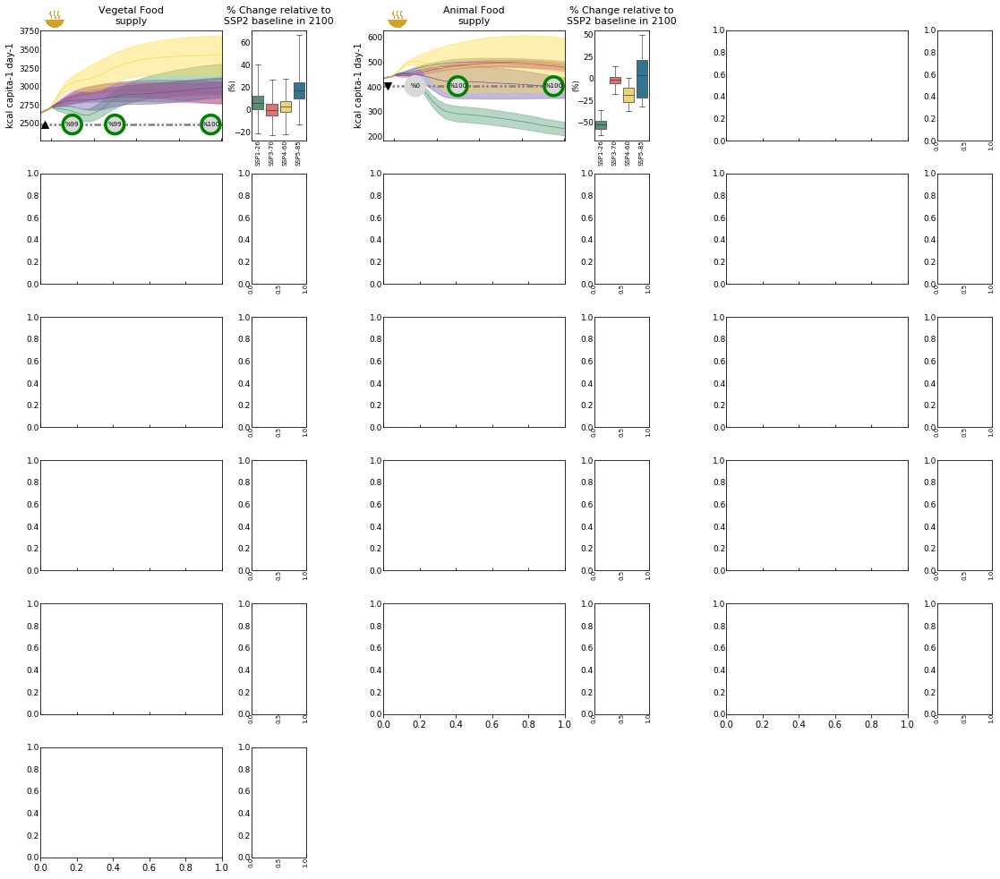

In [386]:
from textwrap import wrap
import matplotlib.image as mpimg
from matplotlib.offsetbox import TextArea, DrawingArea, OffsetImage, AnnotationBbox


# Function for drawing pie chart scatter plot
def draw_pie(dist, 
             xpos, 
             ypos, 
             size,
             alpha, zorder,
             ax=None):
    if ax is None:
        fig, ax = plt.subplots(figsize=(10,8))

    # for incremental pie slices
    cumsum = np.cumsum(dist)
    cumsum = cumsum/ cumsum[-1]
    pie = [0] + cumsum.tolist()

    i = 0
    for r1, r2 in zip(pie[:-1], pie[1:]):
        angles = np.linspace(2 * np.pi * r1, 2 * np.pi * r2)
        x = [0] + np.cos(angles).tolist()
        y = [0] + np.sin(angles).tolist()

        xy = np.column_stack([x, y])
        slice_color = {0:'green', 1:'#fddb3a', 2:'orange', 3:'red'}
        #{0:'green', 1:'#D8D8D8'}
        ax.scatter([xpos], [ypos], marker=xy, color=slice_color[i], edgecolors='none', alpha=alpha, s=size,  zorder=zorder) #
        ax.scatter([xpos], [ypos], marker=xy, color='#D8D8D8', edgecolors='none', alpha=alpha, s=size/2,  zorder=zorder)
        i += 1

    return ax 

"""
First, create figure, grid space, and subplots
"""


# Create grids and axes
fig = plt.figure(figsize=(20, 17))

# The plots will be in n column and am number of rows, depending on the number of indicators
fig_rows = 6
fig_cols = 3

# Set the width ratio of subplots (main plot, colorbar, and gap between horizontal plots)
width_ratios = [5, 1.5, .5]*fig_cols
grid = plt.GridSpec(fig_rows, fig_cols*3, hspace=0.3, wspace=0.35, width_ratios=width_ratios)

axes = {}

# Create subplots
for i in range(fig_rows):
    for j in range(fig_cols):
        axes[i,j*3] = fig.add_subplot(grid[i, j*3])
        axes[i,j*3].tick_params(axis='y', direction='in', pad=0.8, labelsize=9, left=False)
        axes[i,j*3+1] = fig.add_subplot(grid[i, j*3+1])
        axes[i,j*3+1].tick_params( bottom=False,  
                                  axis='x', rotation=90, direction='in', pad=-.5, labelsize=7)
        axes[i,j*3+1].tick_params(axis='y', direction='in', pad=.9, labelsize=9, left=False)
        #axes[i,j*3+1].yaxis.tick_right()
        
        if i in [0,1,2,3]:
            axes[i,j*3].tick_params(axis='x', direction='in', labelbottom=False)
        if i == 4 and j == 0:
            axes[i,j*3].tick_params(axis='x', direction='in', labelbottom=False)
            
for j in [1,2]:
    axes[5,j*3].axis('off')
    axes[5,j*3+1].axis('off')
    
    
"""
First, Develop envelope plots and box plots
"""

# For iterating between SDG icons
sdg_ind_no = [2,4,6,8,10,12,16] # Cumulative number of indicators per SDGs
sdg_n = [2, 3, 4, 7, 8, 12, 13, 15]
g = 0
    
# Filter 2100 data for boxplots
data_sc = outcomes_dict_2[outcomes_dict_2['TIME'].isin(['2100'])] 

# For marking target lines
target_yr_val = {2030: targets_2030, 2050: targets_2050, 2100: targets_2100}
            
# For iterating betweeing subplots
i = 0
j = 0

for v, var in enumerate(['Vegetal Food supply','Animal Food supply']): #['Vegetal Food supply','Animal Food supply',]
    if j == fig_cols:
        j = 0
        i += 1
        
    for s, sc in enumerate(scenarios):
        ax = sns.lineplot(x='TIME', y=var, ci='sd', data=outcomes_dict_e[sc], ax=axes[i,j*3], marker='', 
                     color=sc_colors[sc], lw=.7,
                     err_kws={'alpha':.4})
        #ax.lines[s].set_linestyle(sc_lines[sc])
        
        if v in [2, 5,6,7,10,11,12, 13]:
            lim = 24
        else:
            lim = 15
        axes[i,j*3].set_title('\n'.join(wrap(var, lim)), fontsize=11, pad=7)
        axes[i,j*3].yaxis.set_label_text(inds_unit[var], fontsize=10)
        
        '''# Manually adjust the y min and max for better visualsiation of improvement and deterioration.
        if var == 'CO2 Radiative Forcing':
            ax.set_ylim(ymin=0, ymax=7)
        if var == 'Temperature Change from Preindustrial':
            ax.set_ylim(ymin=0, ymax=5)
        if var == 'GWP per Capita':
            ax.set_ylim(ymin=0, ymax=160)
            
        # Add all subplot labels
        fig_label = list(string.ascii_lowercase)    
        ax.text(-.16, .97, fig_label[v], fontsize=12, fontweight='semibold', rotation=0,
                            horizontalalignment='center', verticalalignment='center', transform=ax.transAxes)'''
        
       
    # Remove the whitespace at the beginning and end of  x and y axes
    axes[i,j*3].margins(x=0)
    #axes[i,j*3].margins(y=0)
    
    
    
    # Draw boxplots for % change of all scenarios from baseline (SSP2-RCP4.5)
    sns.boxplot(x="Scenario", y=var, data=data_sc,  whis= (0,100),  width=0.8, linewidth=.7, ax=axes[i,j*3+1],
        palette=['#519872','#f25f5c', '#ffe066', '#247ba0'], showfliers=False, 
                whiskerprops=dict(linestyle='-',linewidth=1, color='grey'))

    axes[0,j*3+1].set_title('\n'.join(wrap('% Change relative to SSP2 baseline in 2100', 22)), fontsize=11, pad=7)
    axes[i,j*3+1].set_ylabel('(%)', size=8, labelpad=-4)
    axes[i,j*3+1].set_xlabel('')
            

    """
    Third, Annotate the target levels
    """

    x_val = []
    y_val = []

    
    # Only 2030 targets at the ambitious level
    targets_value = [target_yr_val[2030][var][0]]
    targets_year = [2017]

    # For indicators where reduction in indicator value is desired
    if targets_2030[var][5] == 'lower is better':
        axes[i,j*3].axhline(y=targets_value, xmin=0, xmax=1, dashes=(3, 1, 1, 1, 1, 1),  
                            alpha=1, lw=2.5, c='grey', zorder=1)
        axes[i,j*3].plot(targets_year, targets_value, linestyle="None", marker='v', alpha=1, markersize=8 ,
                         color='black')
    # For indicators where increase in value is desired
    if targets_2030[var][5] == 'higher is better':
        axes[i,j*3].axhline(y=targets_value, xmin=0, xmax=1, dashes=(3, 1, 1, 1, 1, 1), 
                            alpha=1, lw=2.5, c='grey', zorder=1)
        axes[i,j*3].plot(targets_year, targets_value, linestyle="None", marker='^', alpha=1, markersize=8 ,
                         color='black')

    x_val = x_val + targets_year
    y_val = y_val + targets_value
    
    
    """
    Fourth, develop pie charts only for SSP1-26
    """
    # Count how many SOWs meet target
    for year in [2030, 2050, 2100]:
        x = outcomes_dict_e['SSP1-26'][outcomes_dict_e['SSP1-26']['TIME']==year]
        if targets_2030[var][5] == 'lower is better':
            y1 = x[x[var] <= targets_value[0]]
            y2 = x[x[var] <= targets_value[0]*.75]
            y3 = x[x[var] <= targets_value[0]*.5]
        if targets_2030[var][5] == 'higher is better':
            y1 = x[x[var] >= targets_value[0]]
            y2 = x[x[var] >= targets_value[0]*.75]
            y3 = x[x[var] >= targets_value[0]*.5]
        sow_green = len(y1.index)
        sow_grey = 10000 - sow_green
        sow_green_perc = (sow_green/10000)*100
        if year == 2100:
            year = 2095
        draw_pie([sow_green, sow_grey], year, targets_value ,600, alpha=1, ax=axes[i,j*3], zorder=10)
        #axes[i,j*3].annotate('%'+str(sow_green_perc), xy=(year, targets_value[0]), xytext=(year, targets_value[0]))
        axes[i,j*3].text(year, targets_value[0], '%'+str(int(sow_green_perc)), fontsize=7, color='black', alpha=1, 
                       fontweight='normal', rotation=0, horizontalalignment='center', verticalalignment='center', zorder=10)
    
    
    
    
    # Print the SDG icon and add subplot labels
    img_dir = 'C:/Users/moallemie/GitHub/Scenario_Modelling/Fig/SDG_icons/'

    if v > sdg_ind_no[g]-1:
        g = g+1
        #ind = 0

    img = mpimg.imread(img_dir+str(sdg_n[g])+'.png')
    imagebox = OffsetImage(img, zoom=0.013)
    ab = AnnotationBbox(imagebox, (.08, 1.1), xycoords='axes fraction', frameon=False) 
    axes[i,j*3].add_artist(ab)

    # Add subplot label text
    #axes[i,j*3].text(-.39, 1.07, fig_sdg[s]+fig_ind[ind], fontsize=9, fontweight='semibold', rotation=0,
                     #horizontalalignment='center', verticalalignment='center', transform=axes[i,j*3].transAxes)

    #ind += 1 # Iterate between subplot lables under each SDG
    
    j += 1
    
    

## Progress per indicator (main text)

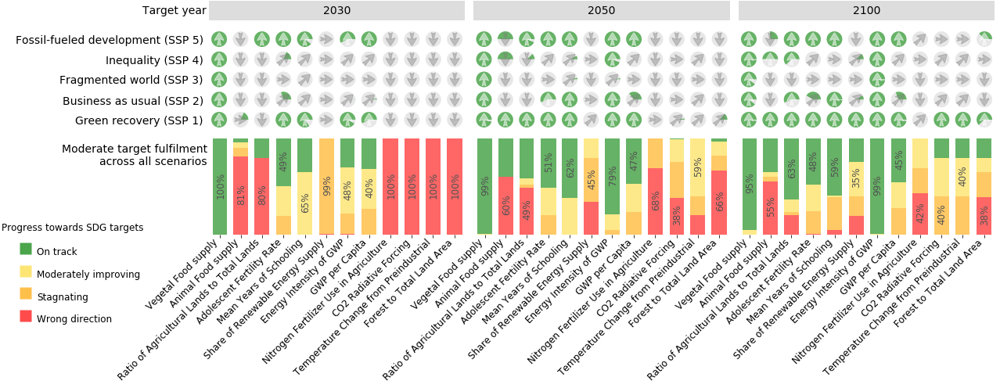

In [15]:
import matplotlib.patches as patches
from matplotlib.path import Path
from matplotlib.patches import BoxStyle
from matplotlib.lines import Line2D


# this class expands any textboxes to the width size of the subplot. We used it for drawing the SDG boxes on the top
class ExtendedTextBox(BoxStyle._Base):
    """
    An Extended Text Box that expands to the axes limits 
                        if set in the middle of the axes
    """

    def __init__(self, pad=0.3, width=500.):
        """
        width: 
            width of the textbox. 
            Use `ax.get_window_extent().width` 
                   to get the width of the axes.
        pad: 
            amount of padding (in vertical direction only)
        """
        self.width=width
        self.pad = pad
        super(ExtendedTextBox, self).__init__()

    def transmute(self, x0, y0, width, height, mutation_size):
        """
        x0 and y0 are the lower left corner of original text box
        They are set automatically by matplotlib
        """
        # padding
        pad = mutation_size * self.pad

        # we add the padding only to the box height
        height = height + 2.*pad
        # boundary of the padded box
        y0 = y0 - pad
        y1 = y0 + height
        _x0 = x0
        x0 = _x0 +width /2. - self.width/2.
        x1 = _x0 +width /2. + self.width/2.

        cp = [(x0, y0),
              (x1, y0), (x1, y1), (x0, y1),
              (x0, y0)]

        com = [Path.MOVETO,
               Path.LINETO, Path.LINETO, Path.LINETO,
               Path.CLOSEPOLY]

        path = Path(cp, com)

        return path


# Function for drawing pie chart scatter plot
def draw_pie(dist, 
             xpos, 
             ypos, 
             size,
             alpha, zorder,
             ax=None):
    if ax is None:
        fig, ax = plt.subplots(figsize=(10,8))

    # for incremental pie slices
    cumsum = np.cumsum(dist)
    cumsum = cumsum/ cumsum[-1]
    pie = [0] + cumsum.tolist()

    i = 0
    for r1, r2 in zip(pie[:-1], pie[1:]):
        angles = np.linspace(2 * np.pi * r1, 2 * np.pi * r2)
        x = [0] + np.cos(angles).tolist()
        y = [0] + np.sin(angles).tolist()

        xy = np.column_stack([x, y])
        slice_color = {0:'green', 1:'#D8D8D8'}
        ax.scatter([xpos], [ypos], marker=xy, color=slice_color[i], edgecolors='none', alpha=alpha, s=size, zorder=zorder) #
        i += 1

    return ax
    
    
dpi = 300

# register the custom style
BoxStyle._style_list["ext"] = ExtendedTextBox


target_year = {130:'2030', 150:'2050', 200:'2100'}
all_targets = [targets_2030, targets_2050, targets_2100]


# Create grids and axes
# First, set the width ratio of subplots proporational to the number of indicators per 8 SDG
width_ratios = [3,1,1,2,1,1,2,1, .4, 3,1,1,2,1,1,2,1, .4, 3,1,1,2,1,1,2,1]
fig = plt.figure(figsize=(18, 5))

grid = plt.GridSpec(2, 26, hspace=0.02, wspace=0, width_ratios= width_ratios, height_ratios= [1.2,1])

# Use GridSpec for creating subplots with shared axis because we have the SSP arrows subplot on the top of other subplots with differnet ratio.
axes = {} # Dictionary axes for stacked barcharts
axes_arr = {} # Dictionary axes for arrows
axes[1,0] = fig.add_subplot(grid[1, 0])
for c in range(1,26): # Columns corresponds to the SDGs indicators and then target years
    if c not in [8, 17]: # 8 and 17 are spaces between year columns
        axes[1,c] = fig.add_subplot(grid[1, c], sharey=axes[1,0])


# Specify the SDG indicators for plotting.
inds_list = ['Vegetal Food supply', 'Animal Food supply',
             'Ratio of Agricultural Lands to Total Lands', 
             'Adolescent Fertility Rate', 
             'Mean Years of Schooling', 
             'Share of Renewable Energy Supply', 'Energy Intensity of GWP', 
             'GWP per Capita', 
             'Nitrogen Fertilizer Use in Agriculture', 
             'CO2 Radiative Forcing', 'Temperature Change from Preindustrial', 
             'Forest to Total Land Area'
            ]
sdg_inds = {}
sdg_inds['2'] = ['Vegetal Food supply', 'Animal Food supply','Ratio of Agricultural Lands to Total Lands']
sdg_inds['3'] = ['Adolescent Fertility Rate']
sdg_inds['4'] = ['Mean Years of Schooling']
sdg_inds['7'] = ['Share of Renewable Energy Supply', 'Energy Intensity of GWP']
sdg_inds['8'] = ['GWP per Capita']
sdg_inds['12'] = ['Nitrogen Fertilizer Use in Agriculture']
sdg_inds['13'] = ['CO2 Radiative Forcing', 'Temperature Change from Preindustrial']
sdg_inds['15'] = ['Forest to Total Land Area']
        
        
for y, year in enumerate([130,150,200]):
    #Create a dictionary of dataframes for the normalised value of outcomes in each target year  
    #in different scenarios based on aambitious, moderate, and weak targets. The normalisation is with model base value.
    for t in [1]: # Only plot the moderate target level
        outcomes_norm = {}
        for s, scenario in enumerate(scenarios):
            outcomes_norm[scenario] = pd.DataFrame(columns=inds_list)
            for i, ind in enumerate(inds_list):
                out_norm = outcomes[scenario][ind][:, year]
                #For indicators where reduction in indicator value is desired
                if all_targets[y][ind][5] == 'lower is better':
                    outcomes_norm[scenario][ind] = np.where(out_norm > all_targets[y][ind][3],
                                                            -(abs(out_norm - all_targets[y][ind][3])/abs(all_targets[y][ind][t]-all_targets[y][ind][3]))*100, 
                                                            (abs(out_norm - all_targets[y][ind][3])/abs(all_targets[y][ind][t]-all_targets[y][ind][3]))*100)
                #For indicators where increase in indicator value is desired
                if all_targets[y][ind][5] == 'higher is better':
                    outcomes_norm[scenario][ind] = np.where(out_norm < all_targets[y][ind][3],
                                                            -(abs(out_norm - all_targets[y][ind][3])/abs(all_targets[y][ind][t]-all_targets[y][ind][3]))*100, 
                                                            (abs(out_norm - all_targets[y][ind][3])/abs(all_targets[y][ind][t]-all_targets[y][ind][3]))*100)

        # Identify in each indicators, how many futures meet the ambitious target at different levels (green, yellow, orange, red).
        df_count = {}
        df_sum = {}

        for group_name in ['green', 'yellow', 'orange', 'red']:
            df_count[group_name] = pd.DataFrame(index=scenarios, columns=inds_list)
            df_sum[group_name] = pd.DataFrame(columns=inds_list)

        # Count scenarios for differnet levels of achivemengts.
        for s, sc in enumerate(scenarios):
            for i, ind in enumerate(inds_list):
                df_count['green'].loc[sc][ind] = outcomes_norm[sc][outcomes_norm[sc][ind] >= 100].count()[ind]
                df_count['yellow'].loc[sc][ind] = outcomes_norm[sc][(outcomes_norm[sc][ind] < 100) & (outcomes_norm[sc][ind] >= 50)].count()[ind]
                df_count['orange'].loc[sc][ind] = outcomes_norm[sc][(outcomes_norm[sc][ind] < 50) & (outcomes_norm[sc][ind] > 0)].count()[ind]
                df_count['red'].loc[sc][ind] = outcomes_norm[sc][outcomes_norm[sc][ind] <= 0].count()[ind]

            
        
        # Combine the count of scenarios across the SSPs for the stacked barchart.
        for i, ind in enumerate(inds_list):
            for group_name in ['green', 'yellow','orange', 'red']:
                df_sum[group_name][ind] = [df_count[group_name][ind].sum()]

        

        # Develop the stacked bar charts.
        for g, sdg in enumerate(['2','3', '4', '7', '8', '12','13', '15']): #
            x = sdg_inds[sdg]
            y_green = []
            y_red = []
            y_yellow = []
            y_orange = []
            for i, ind in enumerate(sdg_inds[sdg]):
                y_green.append(df_sum['green'][ind][0])
                y_yellow.append(df_sum['yellow'][ind][0])
                y_orange.append(df_sum['orange'][ind][0])
                y_red.append(df_sum['red'][ind][0])

            # Set the y position of each bar to start from
            bottom_yellow = [sum(x) for x in zip(y_red, y_orange)]
            bottom_green = [sum(x) for x in zip(y_red, y_yellow, y_orange)]
            axes[t, g+y*9].bar(x, y_red, width=.7, color='red', bottom=0, alpha=.6) # red
            axes[t, g+y*9].bar(x, y_orange, bottom=y_red, width=.7, color='orange', alpha=.6) # orange
            axes[t, g+y*9].bar(x, y_yellow, bottom=bottom_yellow, width=.7, color='#fddb3a', alpha=.6) # yellow
            axes[t, g+y*9].bar(x, y_green, bottom=bottom_green, width=.7, color='green',alpha=.6) # green
            



            # Get the y position of the bottom of each bar (stacked on the top of another)
            h = []
            for p in axes[t, g+y*9].patches:
                b = p.get_bbox()
                h.append(b.y0)

            # The iteration annotates all red bars at the bottom first and then all orange bars on the the top of red bars, and so on.
            bar_annot = []
            for p, pa in enumerate(axes[t, g+y*9].patches):      
                #if pa.get_height() > 1000: # Only annotate bars with enough height for annotation
                    # Convert the bar height to a percentage of total scenarios
                bar_annot.append((pa.get_height()/(number_sc*5))*100)

            bar_annot_inmax = []
            for p in range(len(sdg_inds[sdg])):
                # Create a list of percentage achivements per each indicator 
                bar_annot_list = [bar_annot[p], bar_annot[p+len(sdg_inds[sdg])],bar_annot[p+len(sdg_inds[sdg])*2],
                                  bar_annot[p+len(sdg_inds[sdg])*3]]
                # Find the index of the level of achivement with highest percentage for annotation per each indicator
                index_max = max(range(len(bar_annot_list)), key=bar_annot_list.__getitem__)
                bar_annot_inmax.append(p+len(sdg_inds[sdg])*index_max) # 4 is the number for levels achivements.

            for p, pa in enumerate(axes[t, g+y*9].patches):
                #if (bar_annot[p] > bar_annot[p+len(sdg_inds[sdg])])
                if p in bar_annot_inmax:
                    axes[t, g+y*9].annotate(str(int((pa.get_height()/(number_sc*5))*100))+'%', (pa.get_x()+pa.get_width()/2., pa.get_height()/2+h[p]), 
                                     ha='center', va='center', rotation=90, xytext=(1, 2),textcoords='offset points', 
                                          fontsize=12, fontweight='normal',color='#525252')

            # Remove all ticks and spines
            [s.set_visible(False) for s in axes[t, g+y*9].spines.values()]
            [t.set_visible(False) for t in axes[t, g+y*9].get_yticklines()]
            [t.set_visible(False) for t in axes[t, g+y*9].get_xticklines()]
            [l.set_visible(False) for l in axes[t, g+y*9].get_yticklabels()]

            # Change the x axis label font size and rotate the label
            #axes[t+1, g+y*9].tick_params(axis='x', rotation=90, labelsize=13)
            
            if (t == 1):
                axes[t, g+y*9].set_xticklabels(sdg_inds[sdg], fontsize=12, rotation=45, ha='right')
                axes[t, g+y*9].tick_params(axis='x', pad=0)
                axes[t, g+y*9].xaxis.tick_bottom()
            else:
                axes[t, g+y*9].tick_params(labelbottom=False)
                
                

            # Reduce the x margines in plots. The margines should be proportional to the width ratio of the subplot.
            axes[t, g+y*9].margins(x=.2/width_ratios[g], y=0)
            
    
    
        # Now we develop the SSP arrow scatter plot on the top of stacked bar charts.
        # Here we want to show if the world unfolds according to each SSP, what would be the most likely level of target achivement.
        #Note that that it's 'the most likely' level of achivement that has the maximum scenarios in the respective SSP. Therefore, that SSP can also lead to other achivement level, but the number of scenarios is smaller. 
        if t == 1: # Only draw arrows for the moderate level of achivemengt. 0 is ambitious, 1 is moderate, 2 is weak.
            arrow_color = {0:'green', 1:'yellow', 2:'orange', 3:'red'} 
            ssp_ind = {}
            for s, sc in enumerate(scenarios):
                for ind, indx in enumerate(inds_list):
                    ssp_char = []
                    for group_name in ['green', 'yellow','orange', 'red']:
                        ssp_char.append(df_count[group_name].loc[sc][indx])
                        maxind = max(range(len(ssp_char)), key=ssp_char.__getitem__)
                        ssp_ind[(sc,indx)] = arrow_color[maxind]

            # Create an empty scatterplot with indicators in x axis and SSPs in y axis to use for annotaing arrows. Both indictors and arrows are represneted by indicative numbers to assist the positionning of arrows.
            axes_arr[y] = fig.add_subplot(grid[0, y*9:y*9+8])               
            
            
            sc_list = [[0,1,2,3,4]]*len(inds_list)
            for xe, ye in zip ([i for i in range(len(inds_list))], sc_list):
                axes_arr[y].scatter([xe] * len(ye), ye, color='', zorder=10)
            axes_arr[y].margins(y=.1) 
            axes_arr[y].margins(x=0.01) # This aligns how the scatter points spread in x axis (use it to align the dots with x-ticks)

            for s, sc in enumerate(scenarios):
                for ind, indx in enumerate(inds_list):
                    if ssp_ind[(sc,indx)] == arrow_color[0]: # green color
                        axes_arr[y].annotate("",xy=(ind, s+.4), xycoords='data', xytext=(ind, s-.4), textcoords='data',
                                    arrowprops=dict(arrowstyle="fancy,head_length=1,head_width=1.2,tail_width=.5",
                                                    connectionstyle="arc3", color="white", alpha=.5))
                    if ssp_ind[(sc,indx)] == arrow_color[1]: # yellow color
                        axes_arr[y].annotate("",xy=(ind+.3, s+.3), xycoords='data', xytext=(ind-.3, s-.3), textcoords='data',
                                    arrowprops=dict(arrowstyle="fancy,head_length=1,head_width=1.2,tail_width=.5",
                                                    connectionstyle="arc3", color="grey", alpha=.4))
                    if ssp_ind[(sc,indx)] == arrow_color[2]: # orange color
                        axes_arr[y].annotate("",xy=(ind+.35, s), xycoords='data', xytext=(ind-.35, s), textcoords='data',
                                    arrowprops=dict(arrowstyle="fancy,head_length=1,head_width=1.2,tail_width=.5",
                                                    connectionstyle="arc3", color="grey", alpha=.4))
                    if ssp_ind[(sc,indx)] == arrow_color[3]: # red color
                        axes_arr[y].annotate("",xy=(ind, s-.4), xycoords='data', xytext=(ind, s+.4), textcoords='data',
                                    arrowprops=dict(arrowstyle="fancy,head_length=1,head_width=1.2,tail_width=.5",
                                                    connectionstyle="arc3", color="grey", alpha=.4))
            
                    # Count the number of green achivements per scenario for the pie chart
                    green_slice = df_count['green'].loc[sc][indx].item()
                    #yellow_slice = df_count['yellow'].loc[sc][indx].item() 
                    #orange_slice = df_count['orange'].loc[sc][indx].item() 
                    #red_slice = df_count['red'].loc[sc][indx].item()
                    grey_slice = df_count['yellow'].loc[sc][indx].item() + df_count['orange'].loc[sc][indx].item() + df_count['red'].loc[sc][indx].item()     
                    # Draw the pie chart
                    draw_pie([green_slice,grey_slice],ind,s,400, 
                             alpha=.6, zorder=-100, ax=axes_arr[y])
            
            if y == 0:
                axes_arr[y].set_yticks(np.arange(len(scenarios)))
                axes_arr[y].set_yticklabels(['Green recovery (SSP 1)', 'Business as usual (SSP 2)', 
                                             'Fragmented world (SSP 3)', 'Inequality (SSP 4)', 
                                             'Fossil-fueled development (SSP 5)'], fontsize=14, ha='right')
                axes_arr[y].set_title('Target year', loc='left', 
                                      ha='right', size=14, pad=5, position=(-.0098, 1))
            else:
                [l.set_visible(False) for l in axes_arr[y].get_yticklabels()]
                
           
            #axes_arr[y].set_facecolor('#f0f0f0')


            # Remove all ticks and spines
            [s.set_visible(False) for s in axes_arr[y].spines.values()]
            [t.set_visible(False) for t in axes_arr[y].get_xticklines()]
            [t.set_visible(False) for t in axes_arr[y].get_yticklines()]
            [l.set_visible(False) for l in axes_arr[y].get_xticklabels()]
            
            
            title = axes_arr[y].set_title(target_year[year], size=14, pad=10, 
                                                  bbox=dict(facecolor='#dddddd', edgecolor='none'), color='black')
            # set the box style of the xlabel text box toour custom box
            bb = title.get_bbox_patch()
            # use the axes' width as width of the text box
            bb.set_boxstyle("ext", pad=0.4, width=axes_arr[y].get_window_extent().width )
            
            '''axes_arr[y].text(.5, .5, 'Moderate\ntargets', fontsize=50, color='grey', alpha=.2, fontweight='heavy', rotation=0,
                    horizontalalignment='center', verticalalignment='center', zorder=100, transform=axes_arr[y].transAxes)'''
            
            


# Set y-axis label to annoate the achivement levels
target_label = {1:'Ambitious targets', 2:'Moderate target fulfilment\nacross all scenarios', 3:'Weak targets'}
axes[1,0].set_ylabel(target_label[2], size=14, labelpad=2, rotation='horizontal', ha='right', position=(-0,.7))


# Create legend
legend_elements = []

legend_colors = ["green", "#fddb3a","orange", "red"]
legend_labels = ['On track', 'Moderately improving', 'Stagnating', 'Wrong direction']

for i in range(4):
    legend_elements.append(Line2D([0], [0], marker="s", color='none', label=legend_labels[i], 
                                  markersize=15, markeredgecolor='none', markerfacecolor=legend_colors[i], alpha=.7))
    
leg = fig.legend(handles=legend_elements, loc='upper left', bbox_to_anchor=(-.08, .16, .5, .05), frameon=False, 
           bbox_transform=fig.transFigure, ncol=1, title="Progress towards SDG targets\n", title_fontsize='large',
           handlelength=1, columnspacing=1, handletextpad=.7, labelspacing=.01, fontsize=12, handleheight=3.3)

leg.get_title().set_position((-10, -5))

plt.savefig('{}/SSPs_SDGs_boxarrows_maintext_300dpi.png'.format(r'C:/Users/moallemie/GitHub/SSPs_SDGs_Assessment/Fig/'), dpi=300,  bbox_inches='tight') 
plt.savefig('{}/SSPs_SDGs_boxarrows_maintext.pdf'.format(r'C:/Users/moallemie/GitHub/SSPs_SDGs_Assessment/Fig/'), dpi=600,  bbox_inches='tight') 
plt.savefig('{}/SSPs_SDGs_boxarrows_maintext.png'.format(r'C:/Users/moallemie/GitHub/SSPs_SDGs_Assessment/Fig/'), dpi=600,  bbox_inches='tight') 
#plt.savefig('{}/SSPs_SDGs_boxarrows_maintext.svg'.format(r'C:/Users/moallemie/GitHub/SSPs_SDGs_Assessment/Fig/'), dpi=600,  bbox_inches='tight') 


C:\ProgramData\Anaconda3\envs\python37\lib\site-packages\ipykernel_launcher.py:123: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
C:\ProgramData\Anaconda3\envs\python37\lib\site-packages\ipykernel_launcher.py:123: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
C:\ProgramData\Anaconda3\envs\python37\lib\site-packages\ipykernel_launcher.py:123: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes cur

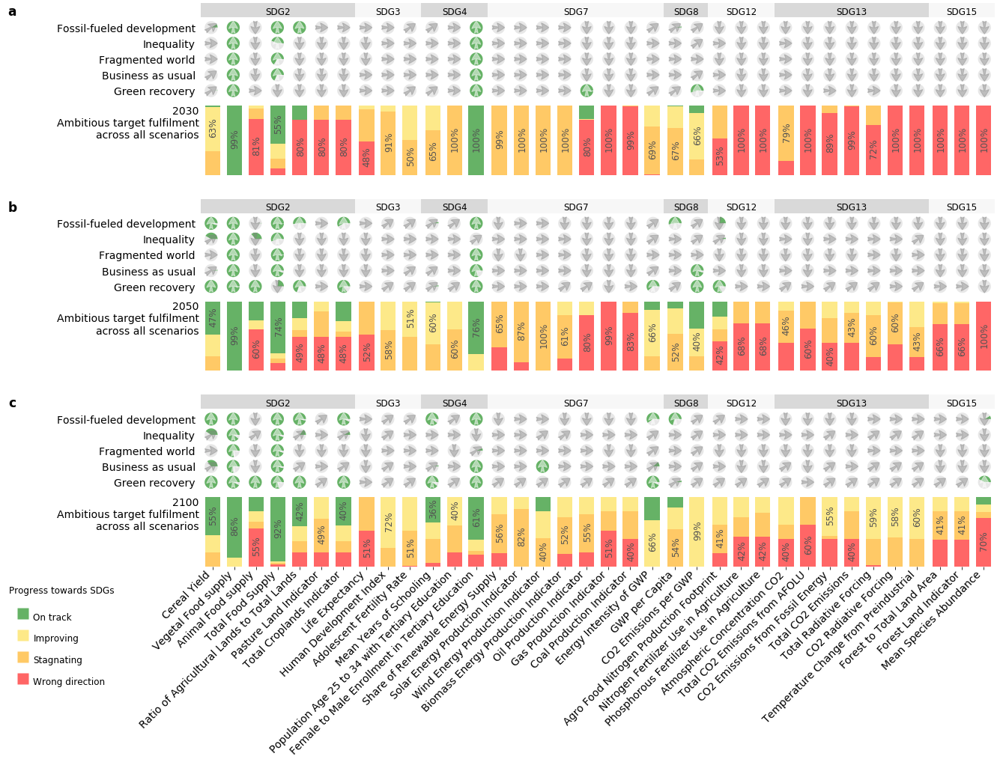

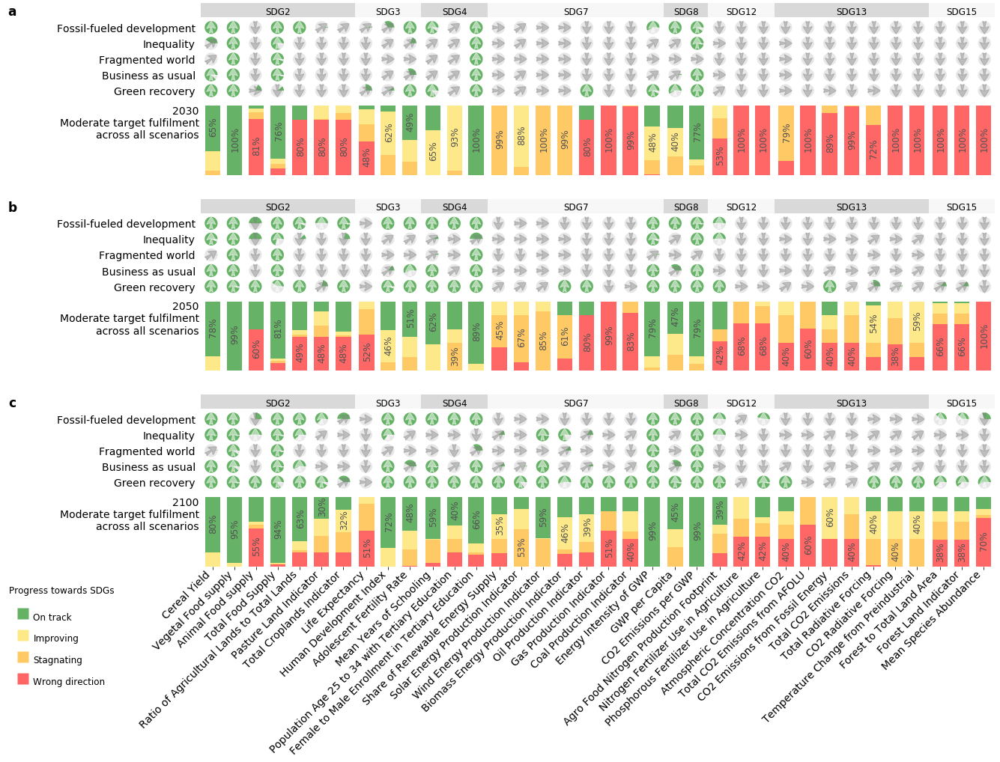

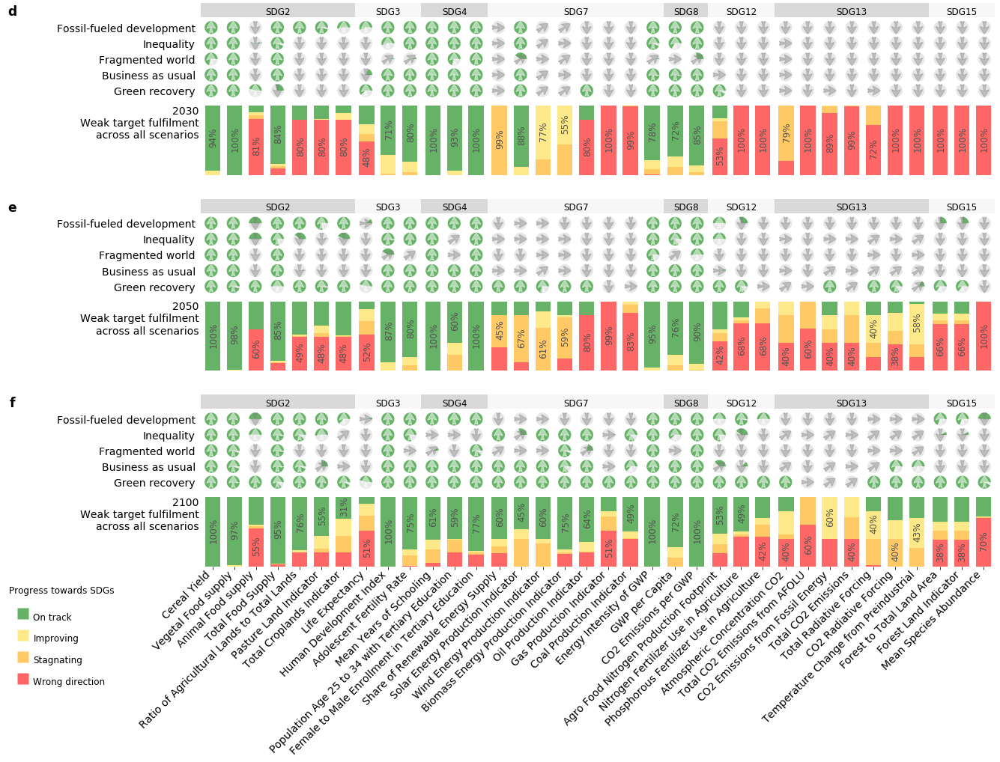

In [29]:
import matplotlib.patches as patches
from matplotlib.path import Path
from matplotlib.patches import BoxStyle
from matplotlib.lines import Line2D

# this class expands any textboxes to the width size of the subplot. We used it for drawing the SDG boxes on the top
class ExtendedTextBox(BoxStyle._Base):
    """
    An Extended Text Box that expands to the axes limits 
                        if set in the middle of the axes
    """

    def __init__(self, pad=0.3, width=500.):
        """
        width: 
            width of the textbox. 
            Use `ax.get_window_extent().width` 
                   to get the width of the axes.
        pad: 
            amount of padding (in vertical direction only)
        """
        self.width=width
        self.pad = pad
        super(ExtendedTextBox, self).__init__()

    def transmute(self, x0, y0, width, height, mutation_size):
        """
        x0 and y0 are the lower left corner of original text box
        They are set automatically by matplotlib
        """
        # padding
        pad = mutation_size * self.pad

        # we add the padding only to the box height
        height = height + 2.*pad
        # boundary of the padded box
        y0 = y0 - pad
        y1 = y0 + height
        _x0 = x0
        x0 = _x0 +width /2. - self.width/2.
        x1 = _x0 +width /2. + self.width/2.

        cp = [(x0, y0),
              (x1, y0), (x1, y1), (x0, y1),
              (x0, y0)]

        com = [Path.MOVETO,
               Path.LINETO, Path.LINETO, Path.LINETO,
               Path.CLOSEPOLY]

        path = Path(cp, com)

        return path


# Function for drawing pie chart scatter plot
def draw_pie(dist, 
             xpos, 
             ypos, 
             size,
             alpha, zorder,
             ax=None):
    if ax is None:
        fig, ax = plt.subplots(figsize=(10,8))

    # for incremental pie slices
    cumsum = np.cumsum(dist)
    cumsum = cumsum/ cumsum[-1]
    pie = [0] + cumsum.tolist()

    i = 0
    for r1, r2 in zip(pie[:-1], pie[1:]):
        angles = np.linspace(2 * np.pi * r1, 2 * np.pi * r2)
        x = [0] + np.cos(angles).tolist()
        y = [0] + np.sin(angles).tolist()

        xy = np.column_stack([x, y])
        slice_color = {0:'green', 1:'#D8D8D8'}
        ax.scatter([xpos], [ypos], marker=xy, color=slice_color[i], edgecolors='none', alpha=alpha, s=size, zorder=zorder) #
        i += 1

    return ax    
     
dpi = 300

# register the custom style
BoxStyle._style_list["ext"] = ExtendedTextBox


target_year = {130:'2030', 150:'2050', 200:'2100'}
all_targets = [targets_2030, targets_2050, targets_2100]

# Temporary indicator list to be used in plotting here. It's the same to the list of all indicators minus share of fossil energy
inds_remove = ['Share of Fossil Energy Supply']
inds_list = [x for x in indicator_list if x not in inds_remove]


# Separate the indicators (the entire list, not the major indicator) per each SDG
sdg_inds = {}
for i in ['2', '3', '4', '7', '8', '12', '13', '15']:
    sdg_inds[i] = df_ind1[df_ind1.ID.str.startswith(i)]['Target indicator'].to_list()
# Remove the share of fossil energy supply manually for SDG-SSP paper.
sdg_inds['7'] = [x for x in sdg_inds['7'] if x not in 'Share of Fossil Energy Supply']



# We used GridSpec for creating subplots with shared axis because we have the SSP arrows subplot on the top of other subplots with differnet ratio.
for t in [0, 1, 2]:
    #Set the width ratio of subplots
    width_ratios = [7,3,3,8,2,3,7,3]
    
    fig = plt.figure(figsize=(19, 13.5))
    grid = plt.GridSpec(8, 8, hspace=0.08, wspace=0, width_ratios= width_ratios, 
                        height_ratios= [1.2,1,.4,1.2,1,.4,1.2,1])
    
    axes = {}
    axes_arr = {}
    #Create a dictionary of dataframes for the normalised value of outcomes in year 2030 
    #in different scenarios based on aambitious, moderate, and weak targets.
    for y, year in enumerate([130, 150, 200]):
        axes[1+y*3,0] = fig.add_subplot(grid[1+y*3, 0])
        for c in range(8):
            axes[1+y*3,c] = fig.add_subplot(grid[1+y*3, c])
        
        outcomes_norm = {}
        for s, scenario in enumerate(scenarios):
            outcomes_norm[scenario] = pd.DataFrame(columns=inds_list)
            for i, ind in enumerate(inds_list):
                out_norm = outcomes[scenario][ind][:, year]
                #For indicators where reduction in indicator value is desired
                if all_targets[y][ind][5] == 'lower is better':
                    outcomes_norm[scenario][ind] = np.where(out_norm > all_targets[y][ind][3],
                                                            -(abs(out_norm - all_targets[y][ind][3])/abs(all_targets[y][ind][t]-all_targets[y][ind][3]))*100, 
                                                            (abs(out_norm - all_targets[y][ind][3])/abs(all_targets[y][ind][t]-all_targets[y][ind][3]))*100)
                #For indicators where increase in indicator value is desired
                if all_targets[y][ind][5] == 'higher is better':
                    outcomes_norm[scenario][ind] = np.where(out_norm < all_targets[y][ind][3],
                                                            -(abs(out_norm - all_targets[y][ind][3])/abs(all_targets[y][ind][t]-all_targets[y][ind][3]))*100, 
                                                            (abs(out_norm - all_targets[y][ind][3])/abs(all_targets[y][ind][t]-all_targets[y][ind][3]))*100)

        # Identify in each indicators, how many futures meet the ambitious target at different levels (green, yellow, orange, red).
        df_count = {}
        df_sum = {}

        for group_name in ['green', 'yellow', 'orange', 'red']:
            df_count[group_name] = pd.DataFrame(index=scenarios, columns=inds_list)
            df_sum[group_name] = pd.DataFrame(columns=inds_list)

        # Count scenarios for differnet levels of achivemengts.
        for s, sc in enumerate(scenarios):
            for i, ind in enumerate(inds_list):
                df_count['green'].loc[sc][ind] = outcomes_norm[sc][outcomes_norm[sc][ind] >= 100].count()[ind]
                df_count['yellow'].loc[sc][ind] = outcomes_norm[sc][(outcomes_norm[sc][ind] < 100) & (outcomes_norm[sc][ind] >= 50)].count()[ind]
                df_count['orange'].loc[sc][ind] = outcomes_norm[sc][(outcomes_norm[sc][ind] < 50) & (outcomes_norm[sc][ind] > 0)].count()[ind]
                df_count['red'].loc[sc][ind] = outcomes_norm[sc][outcomes_norm[sc][ind] <= 0].count()[ind]

        # Combine the count of scenarios across the SSPs.
        for i, ind in enumerate(inds_list):
            for group_name in ['green', 'yellow','orange', 'red']:
                df_sum[group_name][ind] = [df_count[group_name][ind].sum()]



         # Develop the stacked bar charts.
        for g, sdg in enumerate(['2','3', '4', '7', '8', '12','13', '15']): #
            x = sdg_inds[sdg]
            y_green = []
            y_red = []
            y_yellow = []
            y_orange = []
            for i, ind in enumerate(sdg_inds[sdg]):
                y_green.append(df_sum['green'][ind][0])
                y_yellow.append(df_sum['yellow'][ind][0])
                y_orange.append(df_sum['orange'][ind][0])
                y_red.append(df_sum['red'][ind][0])

            # Set the y position of each bar to start from
            bottom_yellow = [sum(x) for x in zip(y_red, y_orange)]
            bottom_green = [sum(x) for x in zip(y_red, y_yellow, y_orange)]
            axes[y*3+1, g].bar(x, y_red, width=.7, color='red', bottom=0, alpha=.6) # red
            axes[y*3+1, g].bar(x, y_orange, bottom=y_red, width=.7, color='orange', alpha=.6) # orange
            axes[y*3+1, g].bar(x, y_yellow, bottom=bottom_yellow, width=.7, color='#fddb3a', alpha=.6) # yellow
            axes[y*3+1, g].bar(x, y_green, bottom=bottom_green, width=.7, color='green',alpha=.6) # green


            # Get the y position of the bottom of each bar (stacked on the top of another)
            h = []
            for p in axes[y*3+1, g].patches:
                b = p.get_bbox()
                h.append(b.y0)

            # The iteration annotates all red bars at the bottom first and then all orange bars on the the top of red bars, and so on.
            bar_annot = []
            for p, pa in enumerate(axes[y*3+1, g].patches):      
                #if pa.get_height() > 1000: # Only annotate bars with enough height for annotation
                    # Convert the bar height to a percentage of total scenarios
                bar_annot.append((pa.get_height()/(number_sc*5))*100)

            bar_annot_inmax = []
            for p in range(len(sdg_inds[sdg])):
                # Create a list of percentage achivements per each indicator 
                bar_annot_list = [bar_annot[p], bar_annot[p+len(sdg_inds[sdg])],bar_annot[p+len(sdg_inds[sdg])*2],
                                  bar_annot[p+len(sdg_inds[sdg])*3]]
                # Find the index of the level of achivement with highest percentage for annotation per each indicator
                index_max = max(range(len(bar_annot_list)), key=bar_annot_list.__getitem__)
                bar_annot_inmax.append(p+len(sdg_inds[sdg])*index_max) # 4 is the number for levels achivements.

            for p, pa in enumerate(axes[y*3+1, g].patches):
                #if (bar_annot[p] > bar_annot[p+len(sdg_inds[sdg])])
                if p in bar_annot_inmax:
                    axes[y*3+1, g].annotate(str(int((pa.get_height()/(number_sc*5))*100))+'%', (pa.get_x()+pa.get_width()/2., pa.get_height()/2+h[p]), 
                                     ha='center', va='center', rotation=90, xytext=(1, 2),textcoords='offset points', 
                                          fontsize=12, fontweight='normal',color='#525252')

            # Remove all ticks and spines
            [s.set_visible(False) for s in axes[y*3+1, g].spines.values()]
            [t.set_visible(False) for t in axes[y*3+1, g].get_yticklines()]
            [t.set_visible(False) for t in axes[y*3+1, g].get_xticklines()]
            [l.set_visible(False) for l in axes[y*3+1, g].get_yticklabels()]

            # Change the x axis label font size and rotate the label
            #axes[t+1+y*5, g].tick_params(axis='x', rotation=90, labelsize=13)
            
            if (y == 2):
                axes[y*3+1, g].set_xticklabels(sdg_inds[sdg], fontsize=14, rotation=45, ha='right')
                axes[y*3+1, g].tick_params(axis='x', pad=0)
                axes[y*3+1, g].xaxis.tick_bottom()
            else:
                axes[y*3+1, g].tick_params(labelbottom=False)
                
                

            # Reduce the x margines in plots. The margines should be proportional to the width ratio of the subplot.
            axes[y*3+1, g].margins(x=.2/width_ratios[g], y=0)
            
            facecolor = {'2':'#d9d9d9','3':'#f7f7f7', '4':'#d9d9d9', '7':'#f7f7f7', '8':'#d9d9d9', 
                         '12':'#f7f7f7','13':'#d9d9d9', '15':'#f7f7f7'}
            
            # Use the SDG titles f. 
            title = axes[y*3+1, g].set_title(sdg_names[sdg], size=12, pad=122, 
                                                  bbox=dict(facecolor=facecolor[sdg], edgecolor='none'), color='black')
            # set the box style of the xlabel text box toour custom box
            bb = title.get_bbox_patch()
            # use the axes' width as width of the text box
            bb.set_boxstyle("ext", pad=0.4, width=axes[y*3+1, g].get_window_extent().width )

    
    
        # Now we develop the SSP arrow scatter plot on the top of stacked bar charts.
        # Here we want to show if the world unfolds according to each SSP, what would be the most likely level of target achivement.
        #Note that that it's 'the most likely' level of achivement that has the maximum scenarios in the respective SSP. Therefore, that SSP can also lead to other achivement level, but the number of scenarios is smaller. 
    
        arrow_color = {0:'green', 1:'#fddb3a', 2:'orange', 3:'red'} # Here define the arrow colour
        ssp_ind = {}
        for s, sc in enumerate(scenarios):
            for ind, indx in enumerate(inds_list):
                ssp_char = []
                for group_name in ['green', 'yellow','orange', 'red']:
                    ssp_char.append(df_count[group_name].loc[sc][indx])
                    maxind = max(range(len(ssp_char)), key=ssp_char.__getitem__)
                    ssp_ind[(sc,indx)] = arrow_color[maxind]

        # Create an empty scatterplot with indicators in x axis and SSPs in y axis to use for annotaing arrows. Both indictors and arrows are represneted by indicative numbers to assit the positionning of arrows.
        axes_arr[y] = fig.add_subplot(grid[y*3, :])
        sc_list = [[0,1,2,3,4]]*len(inds_list)
        for xe, ye in zip ([i for i in range(len(inds_list))], sc_list):
            axes_arr[y].scatter([xe] * len(ye), ye, color='', zorder=10)
        axes_arr[y].margins(y=.05) 
        axes_arr[y].margins(x=0.005) # This aligns how the scatter points spread in x axis (use it to align the dots with x-ticks)


        for s, sc in enumerate(scenarios):
            for ind, indx in enumerate(inds_list):
                if ssp_ind[(sc,indx)] == arrow_color[0]: # green color
                    axes_arr[y].annotate("",xy=(ind, s+.5), xycoords='data', xytext=(ind, s-.45), textcoords='data',
                                arrowprops=dict(arrowstyle="fancy,head_length=1,head_width=1.2,tail_width=.5",
                                                connectionstyle="arc3", color='white', alpha=.5))
                if ssp_ind[(sc,indx)] == arrow_color[1]: # yellow color
                    axes_arr[y].annotate("",xy=(ind+.3, s+.3), xycoords='data', xytext=(ind-.3, s-.3), textcoords='data',
                                arrowprops=dict(arrowstyle="fancy,head_length=1,head_width=1.2,tail_width=.5",
                                                connectionstyle="arc3", color='grey', alpha=.4))
                if ssp_ind[(sc,indx)] == arrow_color[2]: # orange color
                    axes_arr[y].annotate("",xy=(ind+.35, s), xycoords='data', xytext=(ind-.35, s), textcoords='data',
                                arrowprops=dict(arrowstyle="fancy,head_length=1,head_width=1.2,tail_width=.5",
                                                connectionstyle="arc3", color='grey', alpha=.4))
                if ssp_ind[(sc,indx)] == arrow_color[3]: # red color
                    axes_arr[y].annotate("",xy=(ind, s-.5), xycoords='data', xytext=(ind, s+.5), textcoords='data',
                                arrowprops=dict(arrowstyle="fancy,head_length=1,head_width=1.2,tail_width=.5",
                                                connectionstyle="arc3", color='grey', alpha=.4))
                
                # Count the number of green achivements per scenario for the pie chart
                green_slice = df_count['green'].loc[sc][indx].item()
                #yellow_slice = df_count['yellow'].loc[sc][indx].item() 
                #orange_slice = df_count['orange'].loc[sc][indx].item() 
                #red_slice = df_count['red'].loc[sc][indx].item()
                grey_slice = df_count['yellow'].loc[sc][indx].item() + df_count['orange'].loc[sc][indx].item() + df_count['red'].loc[sc][indx].item()     
                # Draw the pie chart
                draw_pie([green_slice,grey_slice],ind,s,300, 
                         alpha=.6, zorder=-100, ax=axes_arr[y])
        
        
        axes_arr[y].set_yticks(np.arange(len(scenarios)))
        axes_arr[y].set_yticklabels(['Green recovery', 'Business as usual', 
                                         'Fragmented world', 'Inequality', 
                                         'Fossil-fueled development'], fontsize=14, ha='right')
        #axes_arr[t].set_title('Most likely progress to '+target_year[year]+' moderate taregts', loc='left', ha='right', 



        # Remove all ticks and spines
        [s.set_visible(False) for s in axes_arr[y].spines.values()]
        [t.set_visible(False) for t in axes_arr[y].get_xticklines()]
        [t.set_visible(False) for t in axes_arr[y].get_yticklines()]
        [l.set_visible(False) for l in axes_arr[y].get_xticklabels()]


        # Set y-axis label to annoate the achivement levels
        target_label = {1:'2030\nAmbitious target fulfilment\nacross all scenarios', 2:'2050\nAmbitious target fulfilment\nacross all scenarios', 3:'2100\nAmbitious target fulfilment\nacross all scenarios',
                        4:'2030\nModerate target fulfilment\nacross all scenarios', 5:'2050\nModerate target fulfilment\nacross all scenarios', 6:'2100\nModerate target fulfilment\nacross all scenarios', 
                        7:'2030\nWeak target fulfilment\nacross all scenarios', 8:'2050\nWeak target fulfilment\nacross all scenarios', 9:'2100\nWeak target fulfilment\nacross all scenarios'}
        axes[1+y*3,0].set_ylabel(target_label[y+1+t*3], size=14, labelpad=2, rotation='horizontal', ha='right', position=(-0,.5))
        
        fig_label = {1:'a', 2:'b', 3:'c',
                        4:'a', 5:'b', 6:'c', 
                        7:'d', 8:'e', 9:'f'}    
        # Add all subplot labels
        axes_arr[y].text(-9, 5, fig_label[y+1+t*3], fontsize=17, fontweight='heavy', rotation=0,
                            horizontalalignment='center', verticalalignment='center')

    # Create legend
    legend_elements = []

    legend_colors = ['green', '#fddb3a', 'orange', 'red']
    legend_labels = ['On track', 'Improving', 'Stagnating', 'Wrong direction']

    for i in range(4):
        legend_elements.append(Line2D([0], [0], marker="s", color='none', label=legend_labels[i], 
                                      markersize=15, markeredgecolor='none', markerfacecolor=legend_colors[i], alpha=0.6))

    fig.legend(handles=legend_elements, loc='upper left', bbox_to_anchor=(-.07, .06, .5, .05), frameon=False, 
               bbox_transform=fig.transFigure, ncol=1, title="Progress towards SDGs\n", title_fontsize='large',
               handlelength=1, columnspacing=1, handletextpad=.7, labelspacing=.01, fontsize=12, handleheight=3.3)
 

    plt.savefig('{}/SSPs_SDGs_boxarrows_extended_{}_maintext.pdf'.format(r'C:/Users/moallemie/GitHub/SSPs_SDGs_Assessment/Fig/',t), dpi=600,  bbox_inches='tight')
    plt.savefig('{}/SSPs_SDGs_boxarrows_extended_{}_maintext.pdf'.format(r'C:/Users/moallemie/GitHub/SSPs_SDGs_Assessment/Fig/',t), dpi=300,  bbox_inches='tight')


C:\ProgramData\Anaconda3\envs\python37\lib\site-packages\ipykernel_launcher.py:123: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
C:\ProgramData\Anaconda3\envs\python37\lib\site-packages\ipykernel_launcher.py:123: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
C:\ProgramData\Anaconda3\envs\python37\lib\site-packages\ipykernel_launcher.py:123: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes cur

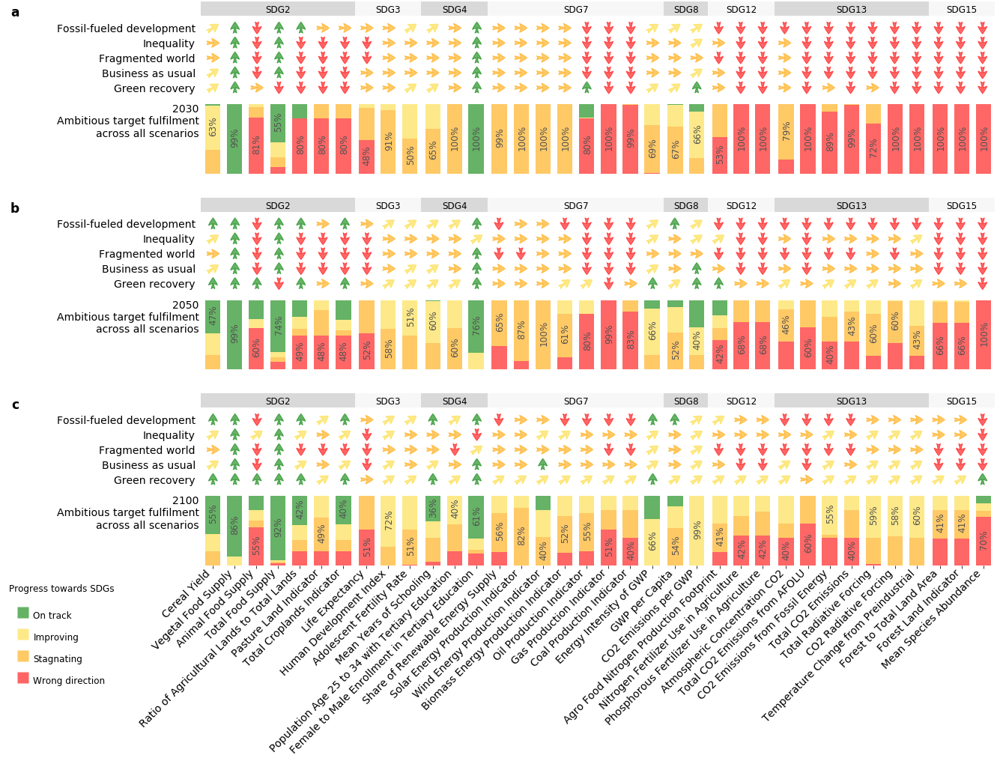

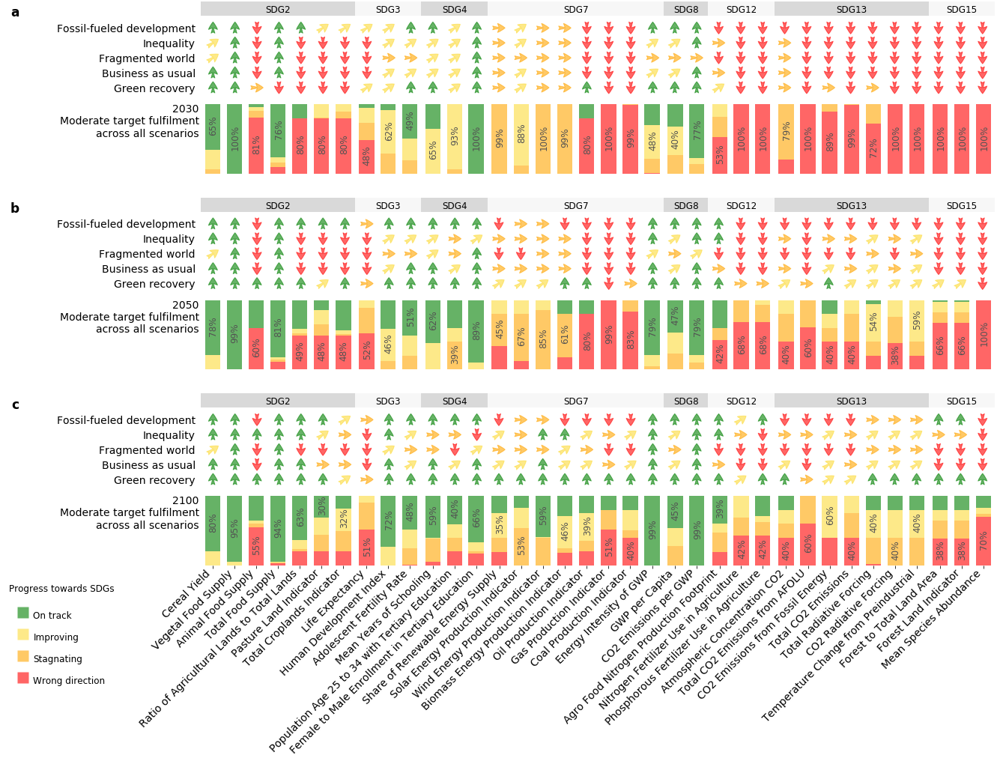

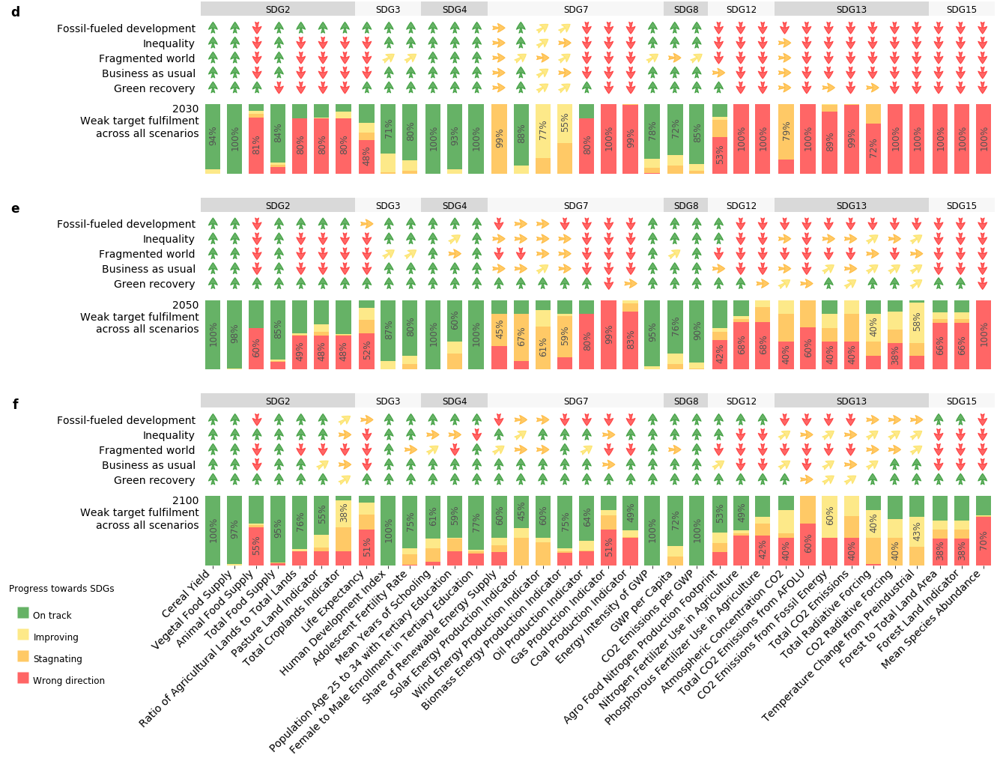

In [25]:
import matplotlib.patches as patches
from matplotlib.path import Path
from matplotlib.patches import BoxStyle
from matplotlib.lines import Line2D

# this class expands any textboxes to the width size of the subplot. We used it for drawing the SDG boxes on the top
class ExtendedTextBox(BoxStyle._Base):
    """
    An Extended Text Box that expands to the axes limits 
                        if set in the middle of the axes
    """

    def __init__(self, pad=0.3, width=500.):
        """
        width: 
            width of the textbox. 
            Use `ax.get_window_extent().width` 
                   to get the width of the axes.
        pad: 
            amount of padding (in vertical direction only)
        """
        self.width=width
        self.pad = pad
        super(ExtendedTextBox, self).__init__()

    def transmute(self, x0, y0, width, height, mutation_size):
        """
        x0 and y0 are the lower left corner of original text box
        They are set automatically by matplotlib
        """
        # padding
        pad = mutation_size * self.pad

        # we add the padding only to the box height
        height = height + 2.*pad
        # boundary of the padded box
        y0 = y0 - pad
        y1 = y0 + height
        _x0 = x0
        x0 = _x0 +width /2. - self.width/2.
        x1 = _x0 +width /2. + self.width/2.

        cp = [(x0, y0),
              (x1, y0), (x1, y1), (x0, y1),
              (x0, y0)]

        com = [Path.MOVETO,
               Path.LINETO, Path.LINETO, Path.LINETO,
               Path.CLOSEPOLY]

        path = Path(cp, com)

        return path


# Function for drawing pie chart scatter plot
def draw_pie(dist, 
             xpos, 
             ypos, 
             size,
             alpha, zorder,
             ax=None):
    if ax is None:
        fig, ax = plt.subplots(figsize=(10,8))

    # for incremental pie slices
    cumsum = np.cumsum(dist)
    cumsum = cumsum/ cumsum[-1]
    pie = [0] + cumsum.tolist()

    i = 0
    for r1, r2 in zip(pie[:-1], pie[1:]):
        angles = np.linspace(2 * np.pi * r1, 2 * np.pi * r2)
        x = [0] + np.cos(angles).tolist()
        y = [0] + np.sin(angles).tolist()

        xy = np.column_stack([x, y])
        slice_color = {0:'green', 1:'#D8D8D8'}
        ax.scatter([xpos], [ypos], marker=xy, color=slice_color[i], edgecolors='none', alpha=alpha, s=size, zorder=zorder) #
        i += 1

    return ax    
     
dpi = 300

# register the custom style
BoxStyle._style_list["ext"] = ExtendedTextBox


target_year = {130:'2030', 150:'2050', 200:'2100'}
all_targets = [targets_2030, targets_2050, targets_2100]

# Temporary indicator list to be used in plotting here. It's the same to the list of all indicators minus share of fossil energy
inds_remove = ['Share of Fossil Energy Supply']
inds_list = [x for x in indicator_list if x not in inds_remove]


# Separate the indicators (the entire list, not the major indicator) per each SDG
sdg_inds = {}
for i in ['2', '3', '4', '7', '8', '12', '13', '15']:
    sdg_inds[i] = df_ind1[df_ind1.ID.str.startswith(i)]['Target indicator'].to_list()
# Remove the share of fossil energy supply manually for SDG-SSP paper.
sdg_inds['7'] = [x for x in sdg_inds['7'] if x not in 'Share of Fossil Energy Supply']



# We used GridSpec for creating subplots with shared axis because we have the SSP arrows subplot on the top of other subplots with differnet ratio.
for t in [0, 1, 2]:
    #Set the width ratio of subplots
    width_ratios = [7,3,3,8,2,3,7,3]
    
    fig = plt.figure(figsize=(19, 13.5))
    grid = plt.GridSpec(8, 8, hspace=0.08, wspace=0, width_ratios= width_ratios, 
                        height_ratios= [1.2,1,.4,1.2,1,.4,1.2,1])
    
    axes = {}
    axes_arr = {}
    #Create a dictionary of dataframes for the normalised value of outcomes in year 2030 
    #in different scenarios based on aambitious, moderate, and weak targets.
    for y, year in enumerate([130, 150, 200]):
        axes[1+y*3,0] = fig.add_subplot(grid[1+y*3, 0])
        for c in range(8):
            axes[1+y*3,c] = fig.add_subplot(grid[1+y*3, c])
        
        outcomes_norm = {}
        for s, scenario in enumerate(scenarios):
            outcomes_norm[scenario] = pd.DataFrame(columns=inds_list)
            for i, ind in enumerate(inds_list):
                out_norm = outcomes[scenario][ind][:, year]
                #For indicators where reduction in indicator value is desired
                if all_targets[y][ind][5] == 'lower is better':
                    outcomes_norm[scenario][ind] = np.where(out_norm > all_targets[y][ind][3],
                                                            -(abs(out_norm - all_targets[y][ind][3])/abs(all_targets[y][ind][t]-all_targets[y][ind][3]))*100, 
                                                            (abs(out_norm - all_targets[y][ind][3])/abs(all_targets[y][ind][t]-all_targets[y][ind][3]))*100)
                #For indicators where increase in indicator value is desired
                if all_targets[y][ind][5] == 'higher is better':
                    outcomes_norm[scenario][ind] = np.where(out_norm < all_targets[y][ind][3],
                                                            -(abs(out_norm - all_targets[y][ind][3])/abs(all_targets[y][ind][t]-all_targets[y][ind][3]))*100, 
                                                            (abs(out_norm - all_targets[y][ind][3])/abs(all_targets[y][ind][t]-all_targets[y][ind][3]))*100)

        # Identify in each indicators, how many futures meet the ambitious target at different levels (green, yellow, orange, red).
        df_count = {}
        df_sum = {}

        for group_name in ['green', 'yellow', 'orange', 'red']:
            df_count[group_name] = pd.DataFrame(index=scenarios, columns=inds_list)
            df_sum[group_name] = pd.DataFrame(columns=inds_list)

        # Count scenarios for differnet levels of achivemengts.
        for s, sc in enumerate(scenarios):
            for i, ind in enumerate(inds_list):
                df_count['green'].loc[sc][ind] = outcomes_norm[sc][outcomes_norm[sc][ind] >= 100].count()[ind]
                df_count['yellow'].loc[sc][ind] = outcomes_norm[sc][(outcomes_norm[sc][ind] < 100) & (outcomes_norm[sc][ind] >= 50)].count()[ind]
                df_count['orange'].loc[sc][ind] = outcomes_norm[sc][(outcomes_norm[sc][ind] < 50) & (outcomes_norm[sc][ind] > 0)].count()[ind]
                df_count['red'].loc[sc][ind] = outcomes_norm[sc][outcomes_norm[sc][ind] <= 0].count()[ind]

        # Combine the count of scenarios across the SSPs.
        for i, ind in enumerate(inds_list):
            for group_name in ['green', 'yellow','orange', 'red']:
                df_sum[group_name][ind] = [df_count[group_name][ind].sum()]



         # Develop the stacked bar charts.
        for g, sdg in enumerate(['2','3', '4', '7', '8', '12','13', '15']): #
            x = sdg_inds[sdg]
            y_green = []
            y_red = []
            y_yellow = []
            y_orange = []
            for i, ind in enumerate(sdg_inds[sdg]):
                y_green.append(df_sum['green'][ind][0])
                y_yellow.append(df_sum['yellow'][ind][0])
                y_orange.append(df_sum['orange'][ind][0])
                y_red.append(df_sum['red'][ind][0])

            # Set the y position of each bar to start from
            bottom_yellow = [sum(x) for x in zip(y_red, y_orange)]
            bottom_green = [sum(x) for x in zip(y_red, y_yellow, y_orange)]
            axes[y*3+1, g].bar(x, y_red, width=.7, color='red', bottom=0, alpha=.6) # red
            axes[y*3+1, g].bar(x, y_orange, bottom=y_red, width=.7, color='orange', alpha=.6) # orange
            axes[y*3+1, g].bar(x, y_yellow, bottom=bottom_yellow, width=.7, color='#fddb3a', alpha=.6) # yellow
            axes[y*3+1, g].bar(x, y_green, bottom=bottom_green, width=.7, color='green',alpha=.6) # green


            # Get the y position of the bottom of each bar (stacked on the top of another)
            h = []
            for p in axes[y*3+1, g].patches:
                b = p.get_bbox()
                h.append(b.y0)

            # The iteration annotates all red bars at the bottom first and then all orange bars on the the top of red bars, and so on.
            bar_annot = []
            for p, pa in enumerate(axes[y*3+1, g].patches):      
                #if pa.get_height() > 1000: # Only annotate bars with enough height for annotation
                    # Convert the bar height to a percentage of total scenarios
                bar_annot.append((pa.get_height()/(number_sc*5))*100)

            bar_annot_inmax = []
            for p in range(len(sdg_inds[sdg])):
                # Create a list of percentage achivements per each indicator 
                bar_annot_list = [bar_annot[p], bar_annot[p+len(sdg_inds[sdg])],bar_annot[p+len(sdg_inds[sdg])*2],
                                  bar_annot[p+len(sdg_inds[sdg])*3]]
                # Find the index of the level of achivement with highest percentage for annotation per each indicator
                index_max = max(range(len(bar_annot_list)), key=bar_annot_list.__getitem__)
                bar_annot_inmax.append(p+len(sdg_inds[sdg])*index_max) # 4 is the number for levels achivements.

            for p, pa in enumerate(axes[y*3+1, g].patches):
                #if (bar_annot[p] > bar_annot[p+len(sdg_inds[sdg])])
                if p in bar_annot_inmax:
                    axes[y*3+1, g].annotate(str(int((pa.get_height()/(number_sc*5))*100))+'%', (pa.get_x()+pa.get_width()/2., pa.get_height()/2+h[p]), 
                                     ha='center', va='center', rotation=90, xytext=(1, 2),textcoords='offset points', 
                                          fontsize=12, fontweight='normal',color='#525252')

            # Remove all ticks and spines
            [s.set_visible(False) for s in axes[y*3+1, g].spines.values()]
            [t.set_visible(False) for t in axes[y*3+1, g].get_yticklines()]
            [t.set_visible(False) for t in axes[y*3+1, g].get_xticklines()]
            [l.set_visible(False) for l in axes[y*3+1, g].get_yticklabels()]
            [l.set_visible(False) for l in axes[y*3+1, g].get_xticklabels()]

            # Change the x axis label font size and rotate the label
            #axes[t+1+y*5, g].tick_params(axis='x', rotation=90, labelsize=13)
            
            if (y == 2):
                # Temprary code to correct two subplot title. This should be removed once it's corrected in the model var name in Vensim
                if sdg == '2':
                    sdg_temp = ['Cereal Yield','Vegetal Food Supply','Animal Food Supply','Total Food Supply',
                                'Ratio of Agricultural Lands to Total Lands','Pasture Land Indicator',
                                'Total Croplands Indicator']
                    axes[y*3+1, g].set_xticklabels(sdg_temp, fontsize=14, rotation=45, ha='right')
                else:
                    axes[y*3+1, g].set_xticklabels(sdg_inds[sdg], fontsize=14, rotation=45, ha='right')
                axes[y*3+1, g].tick_params(axis='x', pad=0)
                axes[y*3+1, g].xaxis.tick_bottom()
            else:
                axes[y*3+1, g].tick_params(labelbottom=False)
                
                

            # Reduce the x margines in plots. The margines should be proportional to the width ratio of the subplot.
            axes[y*3+1, g].margins(x=.2/width_ratios[g], y=0)
            
            facecolor = {'2':'#d9d9d9','3':'#f7f7f7', '4':'#d9d9d9', '7':'#f7f7f7', '8':'#d9d9d9', 
                         '12':'#f7f7f7','13':'#d9d9d9', '15':'#f7f7f7'}
            
            # Use the SDG titles f. 
            title = axes[y*3+1, g].set_title(sdg_names[sdg], size=12, pad=122, 
                                                  bbox=dict(facecolor=facecolor[sdg], edgecolor='none'), color='black')
            # set the box style of the xlabel text box toour custom box
            bb = title.get_bbox_patch()
            # use the axes' width as width of the text box
            bb.set_boxstyle("ext", pad=0.4, width=axes[y*3+1, g].get_window_extent().width )

    
    
        # Now we develop the SSP arrow scatter plot on the top of stacked bar charts.
        # Here we want to show if the world unfolds according to each SSP, what would be the most likely level of target achivement.
        #Note that that it's 'the most likely' level of achivement that has the maximum scenarios in the respective SSP. Therefore, that SSP can also lead to other achivement level, but the number of scenarios is smaller. 
    
        arrow_color = {0:'green', 1:'#fddb3a', 2:'orange', 3:'red'} # Here define the arrow colour
        ssp_ind = {}
        for s, sc in enumerate(scenarios):
            for ind, indx in enumerate(inds_list):
                ssp_char = []
                for group_name in ['green', 'yellow','orange', 'red']:
                    ssp_char.append(df_count[group_name].loc[sc][indx])
                    maxind = max(range(len(ssp_char)), key=ssp_char.__getitem__)
                    ssp_ind[(sc,indx)] = arrow_color[maxind]

        # Create an empty scatterplot with indicators in x axis and SSPs in y axis to use for annotaing arrows. Both indictors and arrows are represneted by indicative numbers to assit the positionning of arrows.
        axes_arr[y] = fig.add_subplot(grid[y*3, :])
        sc_list = [[0,1,2,3,4]]*len(inds_list)
        for xe, ye in zip ([i for i in range(len(inds_list))], sc_list):
            axes_arr[y].scatter([xe] * len(ye), ye, color='', zorder=10)
        axes_arr[y].margins(y=.05) 
        axes_arr[y].margins(x=0.005) # This aligns how the scatter points spread in x axis (use it to align the dots with x-ticks)


        for s, sc in enumerate(scenarios):
            for ind, indx in enumerate(inds_list):
                if ssp_ind[(sc,indx)] == arrow_color[0]: # green color
                    axes_arr[y].annotate("",xy=(ind, s+.5), xycoords='data', xytext=(ind, s-.45), textcoords='data',
                                arrowprops=dict(arrowstyle="fancy,head_length=1,head_width=1.2,tail_width=.5",
                                                connectionstyle="arc3", color='green', alpha=.6))
                if ssp_ind[(sc,indx)] == arrow_color[1]: # yellow color
                    axes_arr[y].annotate("",xy=(ind+.3, s+.3), xycoords='data', xytext=(ind-.3, s-.3), textcoords='data',
                                arrowprops=dict(arrowstyle="fancy,head_length=1,head_width=1.2,tail_width=.5",
                                                connectionstyle="arc3", color='#fddb3a', alpha=.6))
                if ssp_ind[(sc,indx)] == arrow_color[2]: # orange color
                    axes_arr[y].annotate("",xy=(ind+.35, s), xycoords='data', xytext=(ind-.35, s), textcoords='data',
                                arrowprops=dict(arrowstyle="fancy,head_length=1,head_width=1.2,tail_width=.5",
                                                connectionstyle="arc3", color='orange', alpha=.6))
                if ssp_ind[(sc,indx)] == arrow_color[3]: # red color
                    axes_arr[y].annotate("",xy=(ind, s-.5), xycoords='data', xytext=(ind, s+.5), textcoords='data',
                                arrowprops=dict(arrowstyle="fancy,head_length=1,head_width=1.2,tail_width=.5",
                                                connectionstyle="arc3", color='red', alpha=.6))
                
                # Count the number of green achivements per scenario for the pie chart
                #green_slice = df_count['green'].loc[sc][indx].item()
                #yellow_slice = df_count['yellow'].loc[sc][indx].item() 
                #orange_slice = df_count['orange'].loc[sc][indx].item() 
                #red_slice = df_count['red'].loc[sc][indx].item()
                grey_slice = df_count['green'].loc[sc][indx].item() + df_count['yellow'].loc[sc][indx].item() + df_count['orange'].loc[sc][indx].item() + df_count['red'].loc[sc][indx].item()     
                # Draw the pie chart
                draw_pie([grey_slice],ind,s,500, 
                         alpha=0, zorder=-100, ax=axes_arr[y])
        
        
        axes_arr[y].set_yticks(np.arange(len(scenarios)))
        axes_arr[y].set_yticklabels(['Green recovery', 'Business as usual', 
                                         'Fragmented world', 'Inequality', 
                                         'Fossil-fueled development'], fontsize=14, ha='right')
        #axes_arr[t].set_title('Most likely progress to '+target_year[year]+' moderate taregts', loc='left', ha='right', 



        # Remove all ticks and spines
        [s.set_visible(False) for s in axes_arr[y].spines.values()]
        [t.set_visible(False) for t in axes_arr[y].get_xticklines()]
        [t.set_visible(False) for t in axes_arr[y].get_yticklines()]
        [l.set_visible(False) for l in axes_arr[y].get_xticklabels()]


        # Set y-axis label to annoate the achivement levels
        target_label = {1:'2030\nAmbitious target fulfilment\nacross all scenarios', 2:'2050\nAmbitious target fulfilment\nacross all scenarios', 3:'2100\nAmbitious target fulfilment\nacross all scenarios',
                        4:'2030\nModerate target fulfilment\nacross all scenarios', 5:'2050\nModerate target fulfilment\nacross all scenarios', 6:'2100\nModerate target fulfilment\nacross all scenarios', 
                        7:'2030\nWeak target fulfilment\nacross all scenarios', 8:'2050\nWeak target fulfilment\nacross all scenarios', 9:'2100\nWeak target fulfilment\nacross all scenarios'}
        axes[1+y*3,0].set_ylabel(target_label[y+1+t*3], size=14, labelpad=2, rotation='horizontal', ha='right', position=(-0,.5))
        
        fig_label = {1:'a', 2:'b', 3:'c',
                        4:'a', 5:'b', 6:'c', 
                        7:'d', 8:'e', 9:'f'}    
        # Add all subplot labels
        axes_arr[y].text(-9, 5, fig_label[y+1+t*3], fontsize=17, fontweight='heavy', rotation=0,
                            horizontalalignment='center', verticalalignment='center')

    # Create legend
    legend_elements = []

    legend_colors = ['green', '#fddb3a', 'orange', 'red']
    legend_labels = ['On track', 'Improving', 'Stagnating', 'Wrong direction']

    for i in range(4):
        legend_elements.append(Line2D([0], [0], marker="s", color='none', label=legend_labels[i], 
                                      markersize=15, markeredgecolor='none', markerfacecolor=legend_colors[i], alpha=0.6))

    fig.legend(handles=legend_elements, loc='upper left', bbox_to_anchor=(-.07, .06, .5, .05), frameon=False, 
               bbox_transform=fig.transFigure, ncol=1, title="Progress towards SDGs\n", title_fontsize='large',
               handlelength=1, columnspacing=1, handletextpad=.7, labelspacing=.01, fontsize=12, handleheight=3.3)
 

    plt.savefig('{}/SSPs_SDGs_boxarrows_extended_v4_{}_maintext.pdf'.format(r'C:/Users/moallemie/GitHub/SSPs_SDGs_Assessment/Fig/',t), dpi=600,  bbox_inches='tight')
    plt.savefig('{}/SSPs_SDGs_boxarrows_extended_v4_{}_maintext_300dpi.png'.format(r'C:/Users/moallemie/GitHub/SSPs_SDGs_Assessment/Fig/',t), dpi=300,  bbox_inches='tight')
    plt.savefig('{}/SSPs_SDGs_boxarrows_extended_v4_{}_maintext.png'.format(r'C:/Users/moallemie/GitHub/SSPs_SDGs_Assessment/Fig/',t), dpi=600,  bbox_inches='tight')


C:\ProgramData\Anaconda3\envs\python37\lib\site-packages\ipykernel_launcher.py:122: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


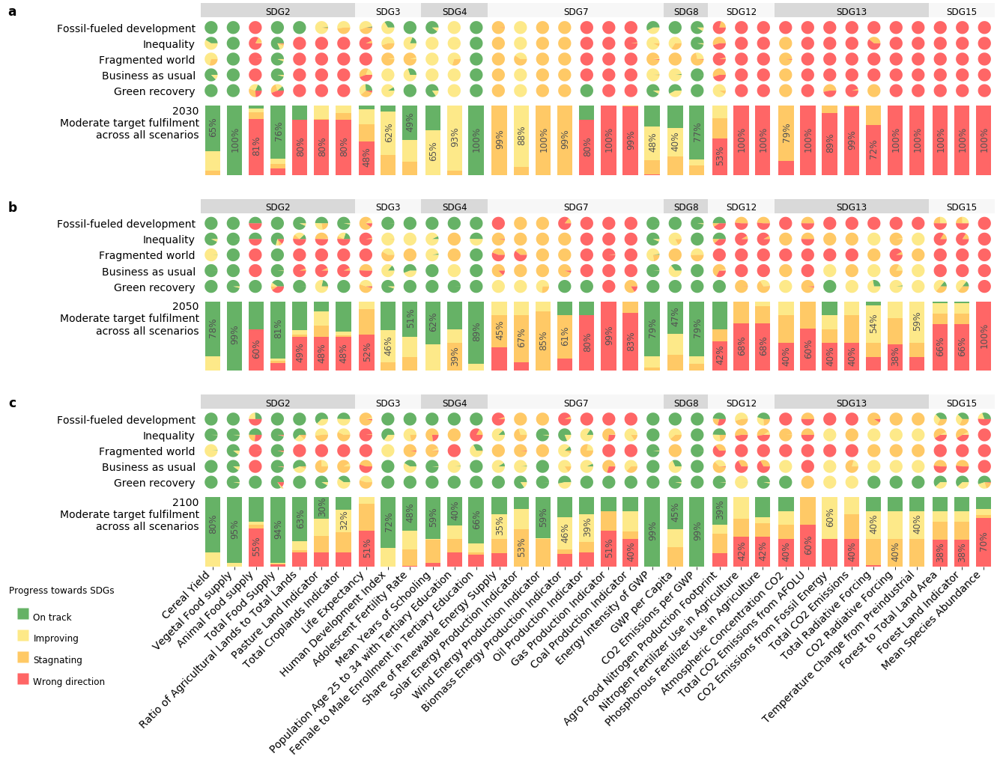

In [14]:
import matplotlib.patches as patches
from matplotlib.path import Path
from matplotlib.patches import BoxStyle
from matplotlib.lines import Line2D

# this class expands any textboxes to the width size of the subplot. We used it for drawing the SDG boxes on the top
class ExtendedTextBox(BoxStyle._Base):
    """
    An Extended Text Box that expands to the axes limits 
                        if set in the middle of the axes
    """

    def __init__(self, pad=0.3, width=500.):
        """
        width: 
            width of the textbox. 
            Use `ax.get_window_extent().width` 
                   to get the width of the axes.
        pad: 
            amount of padding (in vertical direction only)
        """
        self.width=width
        self.pad = pad
        super(ExtendedTextBox, self).__init__()

    def transmute(self, x0, y0, width, height, mutation_size):
        """
        x0 and y0 are the lower left corner of original text box
        They are set automatically by matplotlib
        """
        # padding
        pad = mutation_size * self.pad

        # we add the padding only to the box height
        height = height + 2.*pad
        # boundary of the padded box
        y0 = y0 - pad
        y1 = y0 + height
        _x0 = x0
        x0 = _x0 +width /2. - self.width/2.
        x1 = _x0 +width /2. + self.width/2.

        cp = [(x0, y0),
              (x1, y0), (x1, y1), (x0, y1),
              (x0, y0)]

        com = [Path.MOVETO,
               Path.LINETO, Path.LINETO, Path.LINETO,
               Path.CLOSEPOLY]

        path = Path(cp, com)

        return path


# Function for drawing pie chart scatter plot
def draw_pie(dist, 
             xpos, 
             ypos, 
             size,
             alpha, zorder,
             ax=None):
    if ax is None:
        fig, ax = plt.subplots(figsize=(10,8))

    # for incremental pie slices
    cumsum = np.cumsum(dist)
    cumsum = cumsum/ cumsum[-1]
    pie = [0] + cumsum.tolist()

    i = 0
    for r1, r2 in zip(pie[:-1], pie[1:]):
        angles = np.linspace(2 * np.pi * r1, 2 * np.pi * r2)
        x = [0] + np.cos(angles).tolist()
        y = [0] + np.sin(angles).tolist()
        xy = np.column_stack([x, y])
        slice_color = {0:'green', 1:'#fddb3a', 2:'orange', 3:'red'} #
        ax.scatter([xpos], [ypos], marker=xy, color=slice_color[i], edgecolors='none', alpha=alpha, s=size, zorder=zorder) #
        i += 1

    return ax    
     
dpi = 300

# register the custom style
BoxStyle._style_list["ext"] = ExtendedTextBox


target_year = {130:'2030', 150:'2050', 200:'2100'}
all_targets = [targets_2030, targets_2050, targets_2100]

# Temporary indicator list to be used in plotting here. It's the same to the list of all indicators minus share of fossil energy
inds_remove = ['Share of Fossil Energy Supply']
inds_list = [x for x in indicator_list if x not in inds_remove]


# Separate the indicators (the entire list, not the major indicator) per each SDG
sdg_inds = {}
for i in ['2', '3', '4', '7', '8', '12', '13', '15']:
    sdg_inds[i] = df_ind1[df_ind1.ID.str.startswith(i)]['Target indicator'].to_list()
# Remove the share of fossil energy supply manually for SDG-SSP paper.
sdg_inds['7'] = [x for x in sdg_inds['7'] if x not in 'Share of Fossil Energy Supply']



# We used GridSpec for creating subplots with shared axis because we have the SSP arrows subplot on the top of other subplots with differnet ratio.
for t in [1]:
    #Set the width ratio of subplots
    width_ratios = [7,3,3,8,2,3,7,3]
    
    fig = plt.figure(figsize=(19, 13.5))
    grid = plt.GridSpec(8, 8, hspace=0.08, wspace=0, width_ratios= width_ratios, 
                        height_ratios= [1.2,1,.4,1.2,1,.4,1.2,1])
    
    axes = {}
    axes_arr = {}
    #Create a dictionary of dataframes for the normalised value of outcomes in year 2030 
    #in different scenarios based on aambitious, moderate, and weak targets.
    for y, year in enumerate([130, 150, 200]):
        axes[1+y*3,0] = fig.add_subplot(grid[1+y*3, 0])
        for c in range(8):
            axes[1+y*3,c] = fig.add_subplot(grid[1+y*3, c])
        
        outcomes_norm = {}
        for s, scenario in enumerate(scenarios):
            outcomes_norm[scenario] = pd.DataFrame(columns=inds_list)
            for i, ind in enumerate(inds_list):
                out_norm = outcomes[scenario][ind][:, year]
                #For indicators where reduction in indicator value is desired
                if all_targets[y][ind][5] == 'lower is better':
                    outcomes_norm[scenario][ind] = np.where(out_norm > all_targets[y][ind][3],
                                                            -(abs(out_norm - all_targets[y][ind][3])/abs(all_targets[y][ind][t]-all_targets[y][ind][3]))*100, 
                                                            (abs(out_norm - all_targets[y][ind][3])/abs(all_targets[y][ind][t]-all_targets[y][ind][3]))*100)
                #For indicators where increase in indicator value is desired
                if all_targets[y][ind][5] == 'higher is better':
                    outcomes_norm[scenario][ind] = np.where(out_norm < all_targets[y][ind][3],
                                                            -(abs(out_norm - all_targets[y][ind][3])/abs(all_targets[y][ind][t]-all_targets[y][ind][3]))*100, 
                                                            (abs(out_norm - all_targets[y][ind][3])/abs(all_targets[y][ind][t]-all_targets[y][ind][3]))*100)

        # Identify in each indicators, how many futures meet the ambitious target at different levels (green, yellow, orange, red).
        df_count = {}
        df_sum = {}

        for group_name in ['green', 'yellow', 'orange', 'red']:
            df_count[group_name] = pd.DataFrame(index=scenarios, columns=inds_list)
            df_sum[group_name] = pd.DataFrame(columns=inds_list)

        # Count scenarios for differnet levels of achivemengts.
        for s, sc in enumerate(scenarios):
            for i, ind in enumerate(inds_list):
                df_count['green'].loc[sc][ind] = outcomes_norm[sc][outcomes_norm[sc][ind] >= 100].count()[ind]
                df_count['yellow'].loc[sc][ind] = outcomes_norm[sc][(outcomes_norm[sc][ind] < 100) & (outcomes_norm[sc][ind] >= 50)].count()[ind]
                df_count['orange'].loc[sc][ind] = outcomes_norm[sc][(outcomes_norm[sc][ind] < 50) & (outcomes_norm[sc][ind] > 0)].count()[ind]
                df_count['red'].loc[sc][ind] = outcomes_norm[sc][outcomes_norm[sc][ind] <= 0].count()[ind]

        # Combine the count of scenarios across the SSPs.
        for i, ind in enumerate(inds_list):
            for group_name in ['green', 'yellow','orange', 'red']:
                df_sum[group_name][ind] = [df_count[group_name][ind].sum()]



         # Develop the stacked bar charts.
        for g, sdg in enumerate(['2','3', '4', '7', '8', '12','13', '15']): #
            x = sdg_inds[sdg]
            y_green = []
            y_red = []
            y_yellow = []
            y_orange = []
            for i, ind in enumerate(sdg_inds[sdg]):
                y_green.append(df_sum['green'][ind][0])
                y_yellow.append(df_sum['yellow'][ind][0])
                y_orange.append(df_sum['orange'][ind][0])
                y_red.append(df_sum['red'][ind][0])

            # Set the y position of each bar to start from
            bottom_yellow = [sum(x) for x in zip(y_red, y_orange)]
            bottom_green = [sum(x) for x in zip(y_red, y_yellow, y_orange)]
            axes[y*3+1, g].bar(x, y_red, width=.7, color='red', bottom=0, alpha=.6) # red
            axes[y*3+1, g].bar(x, y_orange, bottom=y_red, width=.7, color='orange', alpha=.6) # orange
            axes[y*3+1, g].bar(x, y_yellow, bottom=bottom_yellow, width=.7, color='#fddb3a', alpha=.6) # yellow
            axes[y*3+1, g].bar(x, y_green, bottom=bottom_green, width=.7, color='green',alpha=.6) # green


            # Get the y position of the bottom of each bar (stacked on the top of another)
            h = []
            for p in axes[y*3+1, g].patches:
                b = p.get_bbox()
                h.append(b.y0)

            # The iteration annotates all red bars at the bottom first and then all orange bars on the the top of red bars, and so on.
            bar_annot = []
            for p, pa in enumerate(axes[y*3+1, g].patches):      
                #if pa.get_height() > 1000: # Only annotate bars with enough height for annotation
                    # Convert the bar height to a percentage of total scenarios
                bar_annot.append((pa.get_height()/(number_sc*5))*100)

            bar_annot_inmax = []
            for p in range(len(sdg_inds[sdg])):
                # Create a list of percentage achivements per each indicator 
                bar_annot_list = [bar_annot[p], bar_annot[p+len(sdg_inds[sdg])],bar_annot[p+len(sdg_inds[sdg])*2],
                                  bar_annot[p+len(sdg_inds[sdg])*3]]
                # Find the index of the level of achivement with highest percentage for annotation per each indicator
                index_max = max(range(len(bar_annot_list)), key=bar_annot_list.__getitem__)
                bar_annot_inmax.append(p+len(sdg_inds[sdg])*index_max) # 4 is the number for levels achivements.

            for p, pa in enumerate(axes[y*3+1, g].patches):
                #if (bar_annot[p] > bar_annot[p+len(sdg_inds[sdg])])
                if p in bar_annot_inmax:
                    axes[y*3+1, g].annotate(str(int((pa.get_height()/(number_sc*5))*100))+'%', (pa.get_x()+pa.get_width()/2., pa.get_height()/2+h[p]), 
                                     ha='center', va='center', rotation=90, xytext=(1, 2),textcoords='offset points', 
                                          fontsize=12, fontweight='normal',color='#525252')

            # Remove all ticks and spines
            [s.set_visible(False) for s in axes[y*3+1, g].spines.values()]
            [t.set_visible(False) for t in axes[y*3+1, g].get_yticklines()]
            [t.set_visible(False) for t in axes[y*3+1, g].get_xticklines()]
            [l.set_visible(False) for l in axes[y*3+1, g].get_yticklabels()]

            # Change the x axis label font size and rotate the label
            #axes[t+1+y*5, g].tick_params(axis='x', rotation=90, labelsize=13)
            
            if (y == 2):
                axes[y*3+1, g].set_xticklabels(sdg_inds[sdg], fontsize=14, rotation=45, ha='right')
                axes[y*3+1, g].tick_params(axis='x', pad=0)
                axes[y*3+1, g].xaxis.tick_bottom()
            else:
                axes[y*3+1, g].tick_params(labelbottom=False)
                
                

            # Reduce the x margines in plots. The margines should be proportional to the width ratio of the subplot.
            axes[y*3+1, g].margins(x=.2/width_ratios[g], y=0)
            
            facecolor = {'2':'#d9d9d9','3':'#f7f7f7', '4':'#d9d9d9', '7':'#f7f7f7', '8':'#d9d9d9', 
                         '12':'#f7f7f7','13':'#d9d9d9', '15':'#f7f7f7'}
            
            # Use the SDG titles f. 
            title = axes[y*3+1, g].set_title(sdg_names[sdg], size=12, pad=122, 
                                                  bbox=dict(facecolor=facecolor[sdg], edgecolor='none'), color='black')
            # set the box style of the xlabel text box toour custom box
            bb = title.get_bbox_patch()
            # use the axes' width as width of the text box
            bb.set_boxstyle("ext", pad=0.4, width=axes[y*3+1, g].get_window_extent().width )

    
    
        # Now we develop the SSP arrow scatter plot on the top of stacked bar charts.
        # Here we want to show if the world unfolds according to each SSP, what would be the most likely level of target achivement.
        #Note that that it's 'the most likely' level of achivement that has the maximum scenarios in the respective SSP. Therefore, that SSP can also lead to other achivement level, but the number of scenarios is smaller. 
    
        arrow_color = {0:'green', 1:'#fddb3a', 2:'orange', 3:'red'} # Here define the arrow colour
        ssp_ind = {}
        for s, sc in enumerate(scenarios):
            for ind, indx in enumerate(inds_list):
                ssp_char = []
                for group_name in ['green', 'yellow','orange', 'red']:
                    ssp_char.append(df_count[group_name].loc[sc][indx])
                    maxind = max(range(len(ssp_char)), key=ssp_char.__getitem__)
                    ssp_ind[(sc,indx)] = arrow_color[maxind]

        # Create an empty scatterplot with indicators in x axis and SSPs in y axis to use for annotaing arrows. Both indictors and arrows are represneted by indicative numbers to assit the positionning of arrows.
        axes_arr[y] = fig.add_subplot(grid[y*3, :])
        sc_list = [[0,1,2,3,4]]*len(inds_list)
        for xe, ye in zip ([i for i in range(len(inds_list))], sc_list):
            axes_arr[y].scatter([xe] * len(ye), ye, color='', zorder=10)
        axes_arr[y].margins(y=.05) 
        axes_arr[y].margins(x=0.005) # This aligns how the scatter points spread in x axis (use it to align the dots with x-ticks)


        for s, sc in enumerate(scenarios):
            for ind, indx in enumerate(inds_list):
                '''if ssp_ind[(sc,indx)] == arrow_color[0]: # green color
                    axes_arr[y].annotate("",xy=(ind, s+.5), xycoords='data', xytext=(ind, s-.45), textcoords='data',
                                arrowprops=dict(arrowstyle="fancy,head_length=1,head_width=1.2,tail_width=.5",
                                                connectionstyle="arc3", color='white', alpha=.6))
                if ssp_ind[(sc,indx)] == arrow_color[1]: # yellow color
                    axes_arr[y].annotate("",xy=(ind+.3, s+.3), xycoords='data', xytext=(ind-.3, s-.3), textcoords='data',
                                arrowprops=dict(arrowstyle="fancy,head_length=1,head_width=1.2,tail_width=.5",
                                                connectionstyle="arc3", color='white', alpha=.6))
                if ssp_ind[(sc,indx)] == arrow_color[2]: # orange color
                    axes_arr[y].annotate("",xy=(ind+.35, s), xycoords='data', xytext=(ind-.35, s), textcoords='data',
                                arrowprops=dict(arrowstyle="fancy,head_length=1,head_width=1.2,tail_width=.5",
                                                connectionstyle="arc3", color='white', alpha=.6))
                if ssp_ind[(sc,indx)] == arrow_color[3]: # red color
                    axes_arr[y].annotate("",xy=(ind, s-.5), xycoords='data', xytext=(ind, s+.5), textcoords='data',
                                arrowprops=dict(arrowstyle="fancy,head_length=1,head_width=1.2,tail_width=.5",
                                                connectionstyle="arc3", color='white', alpha=.6))'''
                
                # Count the number of green achivements per scenario for the pie chart
                green_slice = df_count['green'].loc[sc][indx].item()
                yellow_slice = df_count['yellow'].loc[sc][indx].item() 
                orange_slice = df_count['orange'].loc[sc][indx].item() 
                red_slice = df_count['red'].loc[sc][indx].item()
                #grey_slice = df_count['yellow'].loc[sc][indx].item() + df_count['orange'].loc[sc][indx].item() + df_count['red'].loc[sc][indx].item()     
                # Draw the pie chart
                draw_pie([green_slice,yellow_slice,orange_slice,red_slice],ind,s,300, 
                         alpha=.6, zorder=-100, ax=axes_arr[y])
        
        
        axes_arr[y].set_yticks(np.arange(len(scenarios)))
        axes_arr[y].set_yticklabels(['Green recovery', 'Business as usual', 
                                         'Fragmented world', 'Inequality', 
                                         'Fossil-fueled development'], fontsize=14, ha='right')
        #axes_arr[t].set_title('Most likely progress to '+target_year[year]+' moderate taregts', loc='left', ha='right', 



        # Remove all ticks and spines
        [s.set_visible(False) for s in axes_arr[y].spines.values()]
        [t.set_visible(False) for t in axes_arr[y].get_xticklines()]
        [t.set_visible(False) for t in axes_arr[y].get_yticklines()]
        [l.set_visible(False) for l in axes_arr[y].get_xticklabels()]


        # Set y-axis label to annoate the achivement levels
        target_label = {1:'2030\nAmbitious target fulfilment\nacross all scenarios', 2:'2050\nAmbitious target fulfilment\nacross all scenarios', 3:'2100\nAmbitious target fulfilment\nacross all scenarios',
                        4:'2030\nModerate target fulfilment\nacross all scenarios', 5:'2050\nModerate target fulfilment\nacross all scenarios', 6:'2100\nModerate target fulfilment\nacross all scenarios', 
                        7:'2030\nWeak target fulfilment\nacross all scenarios', 8:'2050\nWeak target fulfilment\nacross all scenarios', 9:'2100\nWeak target fulfilment\nacross all scenarios'}
        axes[1+y*3,0].set_ylabel(target_label[y+1+t*3], size=14, labelpad=2, rotation='horizontal', ha='right', position=(-0,.5))
        
        fig_label = {1:'a', 2:'b', 3:'c',
                        4:'a', 5:'b', 6:'c', 
                        7:'d', 8:'e', 9:'f'}    
        # Add all subplot labels
        axes_arr[y].text(-9, 5, fig_label[y+1+t*3], fontsize=17, fontweight='heavy', rotation=0,
                            horizontalalignment='center', verticalalignment='center')

    # Create legend
    legend_elements = []

    legend_colors = ['green', '#fddb3a', 'orange', 'red']
    legend_labels = ['On track', 'Improving', 'Stagnating', 'Wrong direction']

    for i in range(4):
        legend_elements.append(Line2D([0], [0], marker="s", color='none', label=legend_labels[i], 
                                      markersize=15, markeredgecolor='none', markerfacecolor=legend_colors[i], alpha=0.6))

    fig.legend(handles=legend_elements, loc='upper left', bbox_to_anchor=(-.07, .06, .5, .05), frameon=False, 
               bbox_transform=fig.transFigure, ncol=1, title="Progress towards SDGs\n", title_fontsize='large',
               handlelength=1, columnspacing=1, handletextpad=.7, labelspacing=.01, fontsize=12, handleheight=3.3)
 

    plt.savefig('{}/SSPs_SDGs_boxarrows_extended_v2_{}_maintext.pdf'.format(r'C:/Users/moallemie/GitHub/SSPs_SDGs_Assessment/Fig/',t), dpi=600,  bbox_inches='tight')
    plt.savefig('{}/SSPs_SDGs_boxarrows_extended_v2_{}_maintext.png'.format(r'C:/Users/moallemie/GitHub/SSPs_SDGs_Assessment/Fig/',t), dpi=300,  bbox_inches='tight')


## Progress per SDG (main text) - best/worst case based on target levels

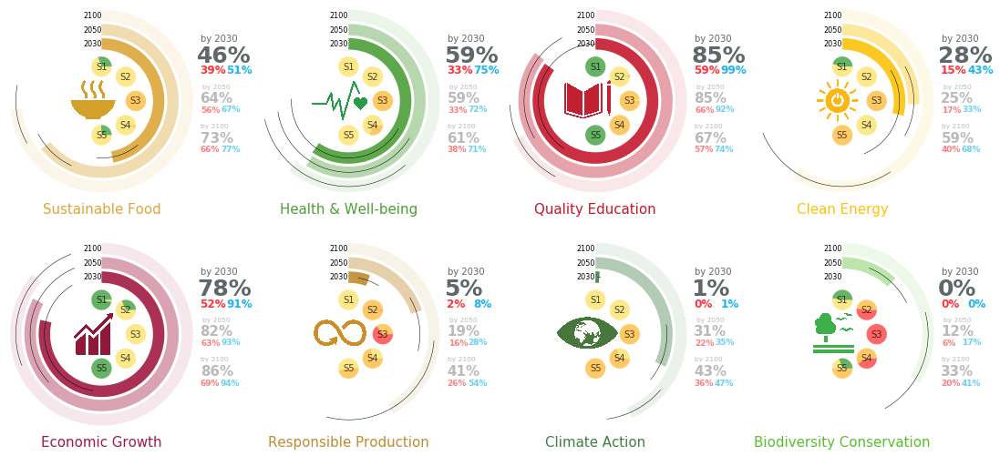

In [30]:
import itertools
import matplotlib as mpl
import matplotlib.image as mpimg
from matplotlib.offsetbox import TextArea, DrawingArea, OffsetImage, AnnotationBbox


# Set the target years, target levels to plot
target_year = {130:'2030', 150:'2050', 200:'2100'}
all_targets = [targets_2030, targets_2050, targets_2100]
target_level = {0: 'A', 1:'M', 2:'W'}

# Temporary indicator list to be used in plotting here. It's the same to the list of all indicators minus share of fossil energy
inds_remove = ['Share of Fossil Energy Supply']
inds_list = [x for x in indicator_list if x not in inds_remove]


# Separate the indicators (the entire list, not the major indicator) per each SDG
sdg_inds = {}
for i in ['2', '3', '4', '7', '8', '12', '13', '15']:
    sdg_inds[i] = df_ind1[df_ind1.ID.str.startswith(i)]['Target indicator'].to_list() 
# Remove the share of fossil energy supply manually for SDG-SSP paper.
sdg_inds['7'] = [x for x in sdg_inds['7'] if x not in 'Share of Fossil Energy Supply']

# Function for drawing pie chart scatter plot
def draw_pie(dist, 
             xpos, 
             ypos, 
             size,
             alpha,
             ax=None):
    if ax is None:
        fig, ax = plt.subplots(figsize=(10,8))

    # for incremental pie slices
    cumsum = np.cumsum(dist)
    cumsum = cumsum/ cumsum[-1]
    pie = [0] + cumsum.tolist()

    i = 0
    for r1, r2 in zip(pie[:-1], pie[1:]):
        angles = np.linspace(2 * np.pi * r1, 2 * np.pi * r2)
        x = [0] + np.cos(angles).tolist()
        y = [0] + np.sin(angles).tolist()
        xy = np.column_stack([x, y])
        slice_color = {0:'green', 1:'#fddb3a', 2:'orange', 3:'red'} #
        ax.scatter([xpos], [ypos], marker=xy, color=slice_color[i], edgecolors='none', alpha=alpha, s=size) #
        i += 1

    return ax

# Create the figure
fig = plt.figure(figsize=(18.3, 9))
axes = {}
grid = plt.GridSpec(2, 4, hspace=.1, wspace=.3)
for i, j in itertools.product(range(2), range(4)):
    axes[i,j] = fig.add_subplot(grid[i,j], projection='polar')


"""
First, compute the progress at the indicator and goal levels.
"""

# Compute the progress per SSP, per target year, per target level, at the indicator level.
outcomes_norm_dict = {}
for y, year in enumerate(list(target_year.keys())):
    for s, ssp in enumerate(scenarios):
        for t in list(target_level.keys()):
            outcomes_norm = {}
            outcomes_norm[ssp] = pd.DataFrame(columns=inds_list)
            for i, ind in enumerate(inds_list):
                out_norm = outcomes[ssp][ind][:, year]
                #For indicators where reduction in indicator value is desired
                if all_targets[y][ind][5] == 'lower is better':
                    outcomes_norm[ssp][ind] = np.where(out_norm > all_targets[y][ind][3],
                                                            -(abs(out_norm - all_targets[y][ind][3])/abs(all_targets[y][ind][t]-all_targets[y][ind][3]))*100, 
                                                            (abs(out_norm - all_targets[y][ind][3])/abs(all_targets[y][ind][t]-all_targets[y][ind][3]))*100)
                #For indicators where increase in indicator value is desired
                if all_targets[y][ind][5] == 'higher is better':
                    outcomes_norm[ssp][ind] = np.where(out_norm < all_targets[y][ind][3],
                                                            -(abs(out_norm - all_targets[y][ind][3])/abs(all_targets[y][ind][t]-all_targets[y][ind][3]))*100, 
                                                            (abs(out_norm - all_targets[y][ind][3])/abs(all_targets[y][ind][t]-all_targets[y][ind][3]))*100)
            # Replace progress higher than 100% with 100 and lower than 0 by zero
            outcomes_norm[ssp][outcomes_norm[ssp] >= 100] = 100
            outcomes_norm[ssp][outcomes_norm[ssp] <= 0] = 0
            # Savel the results in a dictionary to use for plotting the pie charts
            outcomes_norm_dict[(ssp, target_year[year], target_level[t])] = outcomes_norm[ssp]       
            

# Compute the progress per target year, per target level, but across all SSPs.
# Combine the dataframe of per SSPs into one dataframe to be used for cicular horizontal bar charts.
out_norm_all_dict = {}
for y, year in enumerate(list(target_year.keys())):
    for t in list(target_level.keys()):
        out_norm_all = pd.DataFrame(columns=inds_list)
        for s, ssp in enumerate(scenarios):
            out_norm_all = out_norm_all.append(outcomes_norm_dict[(ssp, target_year[year], target_level[t])])
        out_norm_all_dict[(target_year[year], target_level[t])]= out_norm_all

        
# Identify in each SDG, how many futures meet the ambitious target at different levels (green, yellow, orange, red).
# this will be used for plotting the pie charts
df_count = {}
for group_name in ['green', 'yellow', 'orange', 'red']:
    df_count[group_name] = pd.DataFrame(index=scenarios, columns=list(sdg_names.keys()))

# Count the number of scenarios for differnet types of achivemengts, 
# but only for the target year 2100 (because SSP timeframe is till 2100) and moderate target level.
for s, ssp in enumerate(scenarios):
    out = outcomes_norm_dict[(ssp, '2100', 'M')]
    for g, sdg in enumerate(list(sdg_names.keys())):
        out_sdg = out[sdg_inds[sdg]].sum(axis=1)/len(sdg_inds[sdg])
        df_count['green'].loc[ssp][sdg] = out_sdg[out_sdg >= 100].count()
        df_count['yellow'].loc[ssp][sdg] = out_sdg[(out_sdg < 100) & (out_sdg >= 50)].count()
        df_count['orange'].loc[ssp][sdg] = out_sdg[(out_sdg < 50) & (out_sdg > 0)].count()
        df_count['red'].loc[ssp][sdg] = out_sdg[out_sdg <= 0].count()        

        
"""
Second, I develop circular bar plots with their error bars.
"""

s_list = ['S1', 'S2', 'S3', 'S4', 'S5']
g_list = ['Sustainable Food', 'Health & Well-being', 'Quality Education', 'Clean Energy', 'Economic Growth', 
          'Responsible Production', 'Climate Action', 'Biodiversity Conservation' ]
        
# Compute the mean and error bars in cicular horizontal bar charts 
y_bar = {}
err_bar = {}
for y, year in enumerate(list(target_year.keys())):   
    for g, sdg in enumerate(list(sdg_names.keys())):
        for t in list(target_level.keys()):
            norm_df = out_norm_all_dict[(target_year[year], target_level[t])]
            
            # Compute an arthmatic average of of all indicators related to one SDG and use it as the mean
            sdg_norm = norm_df[sdg_inds[sdg]].sum(axis=1)/len(sdg_inds[sdg])
            
            # The top of the bar chats is the progress for the moderate target level.
            if t == 1:
                y_bar[(target_year[year], sdg_names[sdg])] = np.mean(sdg_norm)*360/100 # convert it to degree for polar projection
            # The min of the error line is the progress towards the ambitious target level.
            if t == 0:
                err_min = np.mean(sdg_norm)*360/100 # convert it to degree for polar projection
            # The max of the error line is the progress towards the weak target level
            if t == 2:
                err_max = np.mean(sdg_norm)*360/100 # convert it to degree for polar projection
        err_bar[(target_year[year], sdg_names[sdg])] = (err_min,err_max)

# Draw a light grey ring as the circular axis 
# axes[0,0].barh(3, np.radians(360), color='grey', alpha=.2, height=.3)

i = 0
j = 0
for g, sdg in enumerate(list(sdg_names.keys())):
    
    if g == 4:
        i = 1 # To move to the second row of the figure
        j = 0 # To reset the column number of the subplots
    
    # Plot the progress levels by 2030, 2050, 2100 as cicular horizontal bar charts
    axes[i,j].barh(2, np.radians(y_bar[('2030', sdg_names[sdg])]), color=sdg_colors[sdg], alpha=.9, height=.4) #'#c7b198'
    axes[i,j].barh(2.5, np.radians(y_bar[('2050', sdg_names[sdg])]), color=sdg_colors[sdg], alpha=.4, height=.4) #'#dfd3c3'
    axes[i,j].barh(3, np.radians(y_bar[('2100', sdg_names[sdg])]), color=sdg_colors[sdg], alpha=.1, height=.4) #'#f0ece3'

    # Plot the error lines by 2030, 2050, 2100
    for y, year in enumerate(list(target_year.keys())): 
        theta_err = np.linspace(np.radians(err_bar[(target_year[year], sdg_names[sdg])][0]),  
                                np.radians(err_bar[(target_year[year], sdg_names[sdg])][1]), 1000, endpoint=False)
        r_err = 2+.5*y+0*theta_err
        axes[i,j].plot(theta_err, r_err, lw=.5, color='black') #, marker='.', markevery=(1,998)

        
    """
    Third, I develop scatter pie charts for the SSPs for moderate target level by 2030.
    """
    for s, ssp in enumerate(scenarios):
        green_slice = df_count['green'].loc[ssp][sdg].item()
        yellow_slice = df_count['yellow'].loc[ssp][sdg].item() 
        orange_slice = df_count['orange'].loc[ssp][sdg].item() 
        red_slice = df_count['red'].loc[ssp][sdg].item()
        draw_pie([green_slice,yellow_slice,orange_slice,red_slice],np.radians(360+s*45),1.2,500, 
                 alpha=.6, ax=axes[i,j])
        axes[i,j].text(np.radians(360+s*45),1.2, s_list[s], fontsize=10, color='black', alpha=.7, 
                       fontweight='normal', rotation=0,
                        horizontalalignment='center', verticalalignment='center')


    """
    Fourth, I annotate progress percentage in three target years for moderate target level and format the plot.
    """

    axes[i,j].set_theta_zero_location('N')
    axes[i,j].set_theta_direction(-1)
    axes[i,j].set_rlabel_position(0)
    #axes[i,j].set_thetagrids([0, 90, 180, 270], labels=[0, 25, 50, 75])
    axes[i,j].set_rgrids([2, 2.5, 3], labels=['2030', '2050', '2100'], fontsize=8, ha='right', va='center')
    axes[i,j].spines['polar'].set_visible(False)
    axes[i,j].grid(False)
    axes[i,j].set_thetagrids([], visible=False)
    #axes[i,j].set_rgrids([], visible=False)

    axes[i,j].text(1.05, 4.01, 'by 2030\n', fontsize=10, color='#5f6769', fontweight='normal', rotation=0,
                        horizontalalignment='left', verticalalignment='center')
    # 2030
    # y_bar annotate only moderate target level. err_bar[0] and err_bar[1] annotate worst case and best scenaario based on ambitious and weak target. 100/360 multiplier is to convert from polar degree to actual percentage
    axes[i,j].text(1.13, 3.7, str(int(y_bar[('2030', sdg_names[sdg])]*100/360))+'%', fontsize=25, color='#5f6769',fontweight='heavy', rotation=0,
                        horizontalalignment='left', verticalalignment='center')
    axes[i,j].text(1.27, 3.6, str(int(err_bar[('2030', sdg_names[sdg])][0]*100/360))+'%', fontsize=12, color='#ff353d',fontweight='heavy', rotation=0,
                        horizontalalignment='left', verticalalignment='center')
    axes[i,j].text(1.33, 4.5, str(int(err_bar[('2030', sdg_names[sdg])][1]*100/360))+'%', fontsize=12, color='#1fb4ee',fontweight='heavy', rotation=0,
                        horizontalalignment='left', verticalalignment='center')
    

    # 2050
    axes[i,j].text(1.46, 3.55, 'by 2050\n', fontsize=7.5, color='#bcbab8', fontweight='normal', rotation=0,
                        horizontalalignment='left', verticalalignment='center')
    # y_bar annotate only moderate target level
    axes[i,j].text(1.54, 3.45, str(int(y_bar[('2050', sdg_names[sdg])]*100/360))+'%', fontsize=15, color='#bcbab8', fontweight='heavy', rotation=0,
                        horizontalalignment='left', verticalalignment='center')
    axes[i,j].text(1.66, 3.5, str(int(err_bar[('2050', sdg_names[sdg])][0]*100/360))+'%', fontsize=9, color='#fa7f81',fontweight='heavy', rotation=0,
                        horizontalalignment='left', verticalalignment='center')
    axes[i,j].text(1.64, 4.2, str(int(err_bar[('2050', sdg_names[sdg])][1]*100/360))+'%', fontsize=9, color='#68d0f3',fontweight='heavy', rotation=0,
                        horizontalalignment='left', verticalalignment='center')

    # 2100
    axes[i,j].text(1.85, 3.6, 'by 2100\n', fontsize=7.5, color='#bcbab8', fontweight='normal', rotation=0,
                        horizontalalignment='left', verticalalignment='center')
    # y_bar annotate only moderate target level
    axes[i,j].text(1.93, 3.69, str(int(y_bar[('2100', sdg_names[sdg])]*100/360))+'%', fontsize=15, color='#bcbab8', fontweight='heavy', rotation=0,
                        horizontalalignment='left', verticalalignment='center')
    axes[i,j].text(2.03, 3.85, str(int(err_bar[('2100', sdg_names[sdg])][0]*100/360))+'%', fontsize=9, color='#fa7f81',fontweight='heavy', rotation=0,
                        horizontalalignment='left', verticalalignment='center')
    axes[i,j].text(1.96, 4.50, str(int(err_bar[('2100', sdg_names[sdg])][1]*100/360))+'%', fontsize=9, color='#68d0f3',fontweight='heavy', rotation=0,
                        horizontalalignment='left', verticalalignment='center')
    
    
    axes[i,j].text(np.radians(180), 3.8, g_list[g], fontsize=15, color=sdg_colors[sdg], fontweight='normal', 
                   rotation=0, horizontalalignment='center', verticalalignment='center')
    
    # Print the SDG icon
    img_dir = 'C:/Users/moallemie/GitHub/SSPs_SDGs_Assessment/Fig/SDG_icons/'
    img = mpimg.imread(img_dir+str(sdg)+'.png')
    imagebox = OffsetImage(img, zoom=0.03)
    if sdg == '7':
        ab = AnnotationBbox(imagebox, (275, .2), xycoords='data', frameon=False) # the XY in annotation is based on theta (0-360) and r
    else:
        ab = AnnotationBbox(imagebox, (275, .3), xycoords='data', frameon=False) # the XY in annotation is based on theta (0-360) and r
    axes[i,j].add_artist(ab)
    j += 1

#plt.savefig('{}/SSPs_SDGs_sum_maintext_300dpi.png'.format(r'C:/Users/moallemie/GitHub/SSPs_SDGs_Assessment/Fig/'), dpi=300,  bbox_inches='tight') 
#plt.savefig('{}/SSPs_SDGs_sum_maintext.png'.format(r'C:/Users/moallemie/GitHub/SSPs_SDGs_Assessment/Fig/'), dpi=600,  bbox_inches='tight') 
#plt.savefig('{}/SSPs_SDGs_sum_maintext.pdf'.format(r'C:/Users/moallemie/GitHub/SSPs_SDGs_Assessment/Fig/'), dpi=600,  bbox_inches='tight') 
#plt.savefig('{}/SSPs_SDGs_sum_maintext.svg'.format(r'C:/Users/moallemie/GitHub/SSPs_SDGs_Assessment/Fig/'), dpi=600,  bbox_inches='tight') 



## Progress per SDG (main text) - best/worst case based on SSP

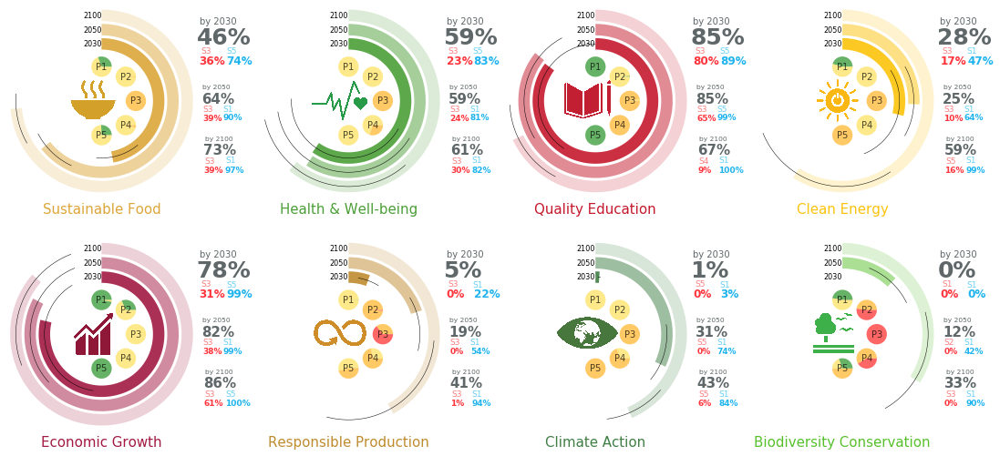

In [15]:
import itertools
import matplotlib as mpl
import matplotlib.image as mpimg
from matplotlib.offsetbox import TextArea, DrawingArea, OffsetImage, AnnotationBbox


# Set the target years, target levels to plot
target_year = {130:'2030', 150:'2050', 200:'2100'}
all_targets = [targets_2030, targets_2050, targets_2100]
target_level = {0: 'A', 1:'M', 2:'W'}
s_names = {'SSP1-26': 'S1', 'SSP2-45': 'S2', 
             'SSP3-70': 'S3', 'SSP4-60': 'S4', 'SSP5-85': 'S5'}

# Temporary indicator list to be used in plotting here. It's the same to the list of all indicators minus share of fossil energy
inds_remove = ['Share of Fossil Energy Supply']
inds_list = [x for x in indicator_list if x not in inds_remove]


# Separate the indicators (the entire list, not the major indicator) per each SDG
sdg_inds = {}
for i in ['2', '3', '4', '7', '8', '12', '13', '15']:
    sdg_inds[i] = df_ind1[df_ind1.ID.str.startswith(i)]['Target indicator'].to_list() 
# Remove the share of fossil energy supply manually for SDG-SSP paper.
sdg_inds['7'] = [x for x in sdg_inds['7'] if x not in 'Share of Fossil Energy Supply']

# Function for drawing pie chart scatter plot
def draw_pie(dist, 
             xpos, 
             ypos, 
             size,
             alpha,
             ax=None):
    if ax is None:
        fig, ax = plt.subplots(figsize=(10,8))

    # for incremental pie slices
    cumsum = np.cumsum(dist)
    cumsum = cumsum/ cumsum[-1]
    pie = [0] + cumsum.tolist()

    i = 0
    for r1, r2 in zip(pie[:-1], pie[1:]):
        angles = np.linspace(2 * np.pi * r1, 2 * np.pi * r2)
        x = [0] + np.cos(angles).tolist()
        y = [0] + np.sin(angles).tolist()
        xy = np.column_stack([x, y])
        slice_color = {0:'green', 1:'#fddb3a', 2:'orange', 3:'red'} #
        ax.scatter([xpos], [ypos], marker=xy, color=slice_color[i], edgecolors='none', alpha=alpha, s=size) #
        i += 1

    return ax

# Create the figure
fig = plt.figure(figsize=(18.3, 9))
axes = {}
grid = plt.GridSpec(2, 4, hspace=.1, wspace=.3)
for i, j in itertools.product(range(2), range(4)):
    axes[i,j] = fig.add_subplot(grid[i,j], projection='polar')


"""
First, compute the progress at the indicator and goal levels.
"""

# Compute the progress per SSP, per target year, per target level, at the indicator level.
outcomes_norm_dict = {}
for y, year in enumerate(list(target_year.keys())):
    for s, ssp in enumerate(scenarios):
        for t in list(target_level.keys()):
            outcomes_norm = {}
            outcomes_norm[ssp] = pd.DataFrame(columns=inds_list)
            for i, ind in enumerate(inds_list):
                out_norm = outcomes[ssp][ind][:, year]
                #For indicators where reduction in indicator value is desired
                if all_targets[y][ind][5] == 'lower is better':
                    outcomes_norm[ssp][ind] = np.where(out_norm > all_targets[y][ind][3],
                                                            -(abs(out_norm - all_targets[y][ind][3])/abs(all_targets[y][ind][t]-all_targets[y][ind][3]))*100, 
                                                            (abs(out_norm - all_targets[y][ind][3])/abs(all_targets[y][ind][t]-all_targets[y][ind][3]))*100)
                #For indicators where increase in indicator value is desired
                if all_targets[y][ind][5] == 'higher is better':
                    outcomes_norm[ssp][ind] = np.where(out_norm < all_targets[y][ind][3],
                                                            -(abs(out_norm - all_targets[y][ind][3])/abs(all_targets[y][ind][t]-all_targets[y][ind][3]))*100, 
                                                            (abs(out_norm - all_targets[y][ind][3])/abs(all_targets[y][ind][t]-all_targets[y][ind][3]))*100)
            # Replace progress higher than 100% with 100 and lower than 0 by zero
            outcomes_norm[ssp][outcomes_norm[ssp] >= 100] = 100
            outcomes_norm[ssp][outcomes_norm[ssp] <= 0] = 0
            # Savel the results in a dictionary to use for plotting the pie charts
            outcomes_norm_dict[(ssp, target_year[year], target_level[t])] = outcomes_norm[ssp]       
            

# Compute the progress per target year, per target level, but across all SSPs.
# Combine the dataframe of per SSPs into one dataframe to be used for cicular horizontal bar charts.
out_norm_all_dict = {}
for y, year in enumerate(list(target_year.keys())):
    for t in list(target_level.keys()):
        out_norm_all = pd.DataFrame(columns=inds_list)
        for s, ssp in enumerate(scenarios):
            out_norm_all = out_norm_all.append(outcomes_norm_dict[(ssp, target_year[year], target_level[t])])
        out_norm_all_dict[(target_year[year], target_level[t])]= out_norm_all

        
# Identify in each SDG, how many futures meet the ambitious target at different levels (green, yellow, orange, red).
# this will be used for plotting the pie charts
df_count = {}
for group_name in ['green', 'yellow', 'orange', 'red']:
    df_count[group_name] = pd.DataFrame(index=scenarios, columns=list(sdg_names.keys()))

# Count the number of scenarios for differnet types of achivemengts, 
# but only for the target year 2100 (because SSP timeframe is till 2100) and moderate target level.
for s, ssp in enumerate(scenarios):
    out = outcomes_norm_dict[(ssp, '2100', 'M')]
    for g, sdg in enumerate(list(sdg_names.keys())):
        out_sdg = out[sdg_inds[sdg]].sum(axis=1)/len(sdg_inds[sdg])
        df_count['green'].loc[ssp][sdg] = out_sdg[out_sdg >= 100].count()
        df_count['yellow'].loc[ssp][sdg] = out_sdg[(out_sdg < 100) & (out_sdg >= 50)].count()
        df_count['orange'].loc[ssp][sdg] = out_sdg[(out_sdg < 50) & (out_sdg > 0)].count()
        df_count['red'].loc[ssp][sdg] = out_sdg[out_sdg <= 0].count()        

        
"""
Second, I develop circular bar plots with their error bars.
"""

s_list = ['P1', 'P2', 'P3', 'P4', 'P5']
g_list = ['Sustainable Food', 'Health & Well-being', 'Quality Education', 'Clean Energy', 'Economic Growth', 
          'Responsible Production', 'Climate Action', 'Biodiversity Conservation' ]
        
# Compute the mean and error bars in cicular horizontal bar charts 
y_bar = {}
err_bar = {}
range_ssp = {}
for y, year in enumerate(list(target_year.keys())):   
    for g, sdg in enumerate(list(sdg_names.keys())):
        for t in list(target_level.keys()):
            norm_df = out_norm_all_dict[(target_year[year], target_level[t])]
            
            # Compute an arthmatic average of of all indicators related to one SDG and use it as the mean
            sdg_norm = norm_df[sdg_inds[sdg]].sum(axis=1)/len(sdg_inds[sdg])
            
            # The top of the bar chats is the progress for the moderate target level.
            if t == 1:
                y_bar[(target_year[year], sdg_names[sdg])] = np.mean(sdg_norm)*360/100 # convert it to degree for polar projection
            # The min of the error line is the progress towards the ambitious target level.
            if t == 0:
                err_min = np.mean(sdg_norm)*360/100 # convert it to degree for polar projection
            # The max of the error line is the progress towards the weak target level
            if t == 2:
                err_max = np.mean(sdg_norm)*360/100 # convert it to degree for polar projection
        err_bar[(target_year[year], sdg_names[sdg])] = (err_min,err_max)
        
        
            
        # Compute the best-case and worst-case progress for annotation across SSPs. Note that annotation is only for moderate targets
        err_ssp = {}
        for s, ssp in enumerate(scenarios):
            # In each SSP and for moderate target
            norm_df_ssp = outcomes_norm_dict[(ssp, target_year[year], target_level[1])]
            # Compute an arthmatic average of of all indicators related to one SDG and use it as the mean
            sdg_norm_ssp = norm_df_ssp[sdg_inds[sdg]].sum(axis=1)/len(sdg_inds[sdg])
            err_ssp[ssp] = np.mean(sdg_norm_ssp)
        # The worst-case progress is the lowest progress among the SSPs.
        min_ssp = min(err_ssp.values())
        min_ssp_key = min(err_ssp, key=err_ssp.get)
        # The best case progress is the highest progress among the SSPs.
        max_ssp = max(err_ssp.values())
        max_ssp_key = max(err_ssp, key=err_ssp.get)
        # Only for target level moderate
        range_ssp[(target_level[1], target_year[year], sdg_names[sdg])] = (min_ssp, min_ssp_key, max_ssp, max_ssp_key)

# Draw a light grey ring as the circular axis 
# axes[0,0].barh(3, np.radians(360), color='grey', alpha=.2, height=.3)

i = 0
j = 0
for g, sdg in enumerate(list(sdg_names.keys())):
    
    if g == 4:
        i = 1 # To move to the second row of the figure
        j = 0 # To reset the column number of the subplots
    
    # Plot the progress levels by 2030, 2050, 2100 as cicular horizontal bar charts
    axes[i,j].barh(2, np.radians(y_bar[('2030', sdg_names[sdg])]), color=sdg_colors[sdg], alpha=.9, height=.4) #'#c7b198'
    axes[i,j].barh(2.5, np.radians(y_bar[('2050', sdg_names[sdg])]), color=sdg_colors[sdg], alpha=.5, height=.4) #'#dfd3c3'
    axes[i,j].barh(3, np.radians(y_bar[('2100', sdg_names[sdg])]), color=sdg_colors[sdg], alpha=.2, height=.4) #'#f0ece3'

    # Plot the error lines by 2030, 2050, 2100
    for y, year in enumerate(list(target_year.keys())): 
        theta_err = np.linspace(np.radians(err_bar[(target_year[year], sdg_names[sdg])][0]),  
                                np.radians(err_bar[(target_year[year], sdg_names[sdg])][1]), 1000, endpoint=False)
        r_err = 2+.5*y+0*theta_err
        axes[i,j].plot(theta_err, r_err, lw=.5, color='black') #, marker='.', markevery=(1,998)

        
    """
    Third, I develop scatter pie charts for the SSPs for moderate target level by 2030.
    """
    for s, ssp in enumerate(scenarios):
        green_slice = df_count['green'].loc[ssp][sdg].item()
        yellow_slice = df_count['yellow'].loc[ssp][sdg].item() 
        orange_slice = df_count['orange'].loc[ssp][sdg].item() 
        red_slice = df_count['red'].loc[ssp][sdg].item()
        draw_pie([green_slice,yellow_slice,orange_slice,red_slice],np.radians(360+s*45),1.2,500, 
                 alpha=.6, ax=axes[i,j])
        axes[i,j].text(np.radians(360+s*45),1.2, s_list[s], fontsize=10, color='black', alpha=.7, 
                       fontweight='normal', rotation=0,
                        horizontalalignment='center', verticalalignment='center')


    """
    Fourth, I annotate progress percentage in three target years for moderate target level and format the plot.
    """

    axes[i,j].set_theta_zero_location('N')
    axes[i,j].set_theta_direction(-1)
    axes[i,j].set_rlabel_position(0)
    #axes[i,j].set_thetagrids([0, 90, 180, 270], labels=[0, 25, 50, 75])
    axes[i,j].set_rgrids([2, 2.5, 3], labels=['2030', '2050', '2100'], fontsize=8, ha='right', va='center')
    axes[i,j].spines['polar'].set_visible(False)
    axes[i,j].grid(False)
    axes[i,j].set_thetagrids([], visible=False)
    #axes[i,j].set_rgrids([], visible=False)

    axes[i,j].text(.92, 4.3, 'by 2030\n', fontsize=10, color='#5f6769', fontweight='normal', rotation=0,
                        horizontalalignment='left', verticalalignment='center')
    # 2030
    # y_bar annotate only moderate target level. range_ssp annotate worst case and best scenaario based on ambitious and weak target. 100/360 multiplier is to convert from polar degree to actual percentage
    
    # Calculate the progress
    
    progress_mean={}
    progress_min={}
    progress_max={}
    for ty in ['2030', '2050', '2100']:
        if int(y_bar[(ty, sdg_names[sdg])]*100/360) < 0:
               progress_mean[ty] = '0'
        else: 
               progress_mean[ty] = str(int(y_bar[(ty, sdg_names[sdg])]*100/360))

        if int(range_ssp[('M',ty, sdg_names[sdg])][0]) < 0:
               progress_min[ty] = '0'
        else: 
               progress_min[ty] = str(int(range_ssp[('M',ty, sdg_names[sdg])][0]))

        if int(range_ssp[('M',ty, sdg_names[sdg])][2]) < 0:
               progress_max[ty] = '0'
        else: 
               progress_max[ty] = str(int(range_ssp[('M',ty, sdg_names[sdg])][2]))
           
    
    # 2030       
    axes[i,j].text(.98, 4, progress_mean['2030']+'%', fontsize=25, color='#5f6769',fontweight='heavy', rotation=0,
                        horizontalalignment='left', verticalalignment='center')
    axes[i,j].text(1.105, 3.9, s_names[range_ssp[('M','2030', sdg_names[sdg])][1]], fontsize=9, color='#fa7f81',fontweight='normal', rotation=0,
                        horizontalalignment='left', verticalalignment='center')
    axes[i,j].text(1.18, 3.7, progress_min['2030']+'%', fontsize=12, color='#ff353d',fontweight='heavy', rotation=0,
                        horizontalalignment='left', verticalalignment='center')
    axes[i,j].text(1.19, 4.69, s_names[range_ssp[('M','2030', sdg_names[sdg])][3]], fontsize=9, color='#68d0f3',fontweight='normal', rotation=0,
                        horizontalalignment='left', verticalalignment='center')
    axes[i,j].text(1.26, 4.6, progress_max['2030']+'%', fontsize=12, color='#1fb4ee',fontweight='heavy', rotation=0,
                        horizontalalignment='left', verticalalignment='center')
    

    # 2050
    axes[i,j].text(1.46, 3.55, 'by 2050\n', fontsize=7.5, color='#5f6769', fontweight='normal', rotation=0,
                        horizontalalignment='left', verticalalignment='center')
    # y_bar annotate only moderate target level
    axes[i,j].text(1.55, 3.5, progress_mean['2050']+'%', fontsize=15, color='#5f6769', fontweight='heavy', rotation=0,
                        horizontalalignment='left', verticalalignment='center')
    axes[i,j].text(1.65, 3.55, s_names[range_ssp[('M','2050', sdg_names[sdg])][1]], fontsize=9, color='#fa7f81',fontweight='normal', rotation=0,
                        horizontalalignment='left', verticalalignment='center')
    axes[i,j].text(1.738, 3.6, progress_min['2050']+'%', fontsize=9, color='#ff353d',fontweight='heavy', rotation=0,
                        horizontalalignment='left', verticalalignment='center')
    axes[i,j].text(1.64, 4.25, s_names[range_ssp[('M','2050', sdg_names[sdg])][3]], fontsize=9, color='#68d0f3',fontweight='normal', rotation=0,
                        horizontalalignment='left', verticalalignment='center')
    axes[i,j].text(1.709, 4.3, progress_max['2050']+'%', fontsize=9, color='#1fb4ee',fontweight='heavy', rotation=0,
                        horizontalalignment='left', verticalalignment='center')

    # 2100
    axes[i,j].text(1.95, 3.9, 'by 2100\n', fontsize=7.5, color='#5f6769', fontweight='normal', rotation=0,
                        horizontalalignment='left', verticalalignment='center')
    # y_bar annotate only moderate target level
    axes[i,j].text(2.02, 3.95, progress_mean['2100']+'%', fontsize=15, color='#5f6769', fontweight='heavy', rotation=0,
                        horizontalalignment='left', verticalalignment='center')
    axes[i,j].text(2.1, 4.17, s_names[range_ssp[('M','2100', sdg_names[sdg])][1]], fontsize=9, color='#fa7f81',fontweight='normal', rotation=0,
                        horizontalalignment='left', verticalalignment='center')
    axes[i,j].text(2.166, 4.31, progress_min['2100']+'%', fontsize=9, color='#ff353d',fontweight='heavy', rotation=0,
                        horizontalalignment='left', verticalalignment='center')
    axes[i,j].text(2.02, 4.8, s_names[range_ssp[('M','2100', sdg_names[sdg])][3]], fontsize=9, color='#68d0f3',fontweight='normal', rotation=0,
                        horizontalalignment='left', verticalalignment='center')
    axes[i,j].text(2.084, 4.95, progress_max['2100']+'%', fontsize=9, color='#1fb4ee',fontweight='heavy', rotation=0,
                        horizontalalignment='left', verticalalignment='center')
    
    
    axes[i,j].text(np.radians(180), 3.8, g_list[g], fontsize=15, color=sdg_colors[sdg], fontweight='normal', 
                   rotation=0, horizontalalignment='center', verticalalignment='center')
    
    # Print the SDG icon
    img_dir = 'C:/Users/moallemie/GitHub/SSPs_SDGs_Assessment/Fig/SDG_icons/'
    img = mpimg.imread(img_dir+str(sdg)+'.png')
    imagebox = OffsetImage(img, zoom=0.03)
    if sdg == '7':
        ab = AnnotationBbox(imagebox, (275, .2), xycoords='data', frameon=False) # the XY in annotation is based on theta (0-360) and r
    else:
        ab = AnnotationBbox(imagebox, (275, .3), xycoords='data', frameon=False) # the XY in annotation is based on theta (0-360) and r
    axes[i,j].add_artist(ab)
    j += 1

plt.savefig('{}/SSPs_SDGs_sum_maintext_300dpi.png'.format(r'C:/Users/moallemie/GitHub/SSPs_SDGs_Assessment/Fig/'), dpi=300,  bbox_inches='tight') 
plt.savefig('{}/SSPs_SDGs_sum_maintext.png'.format(r'C:/Users/moallemie/GitHub/SSPs_SDGs_Assessment/Fig/'), dpi=600,  bbox_inches='tight') 
plt.savefig('{}/SSPs_SDGs_sum_maintext.pdf'.format(r'C:/Users/moallemie/GitHub/SSPs_SDGs_Assessment/Fig/'), dpi=600,  bbox_inches='tight') 
#plt.savefig('{}/SSPs_SDGs_sum_maintext.svg'.format(r'C:/Users/moallemie/GitHub/SSPs_SDGs_Assessment/Fig/'), dpi=600,  bbox_inches='tight') 



## Progress per SDG (SI)

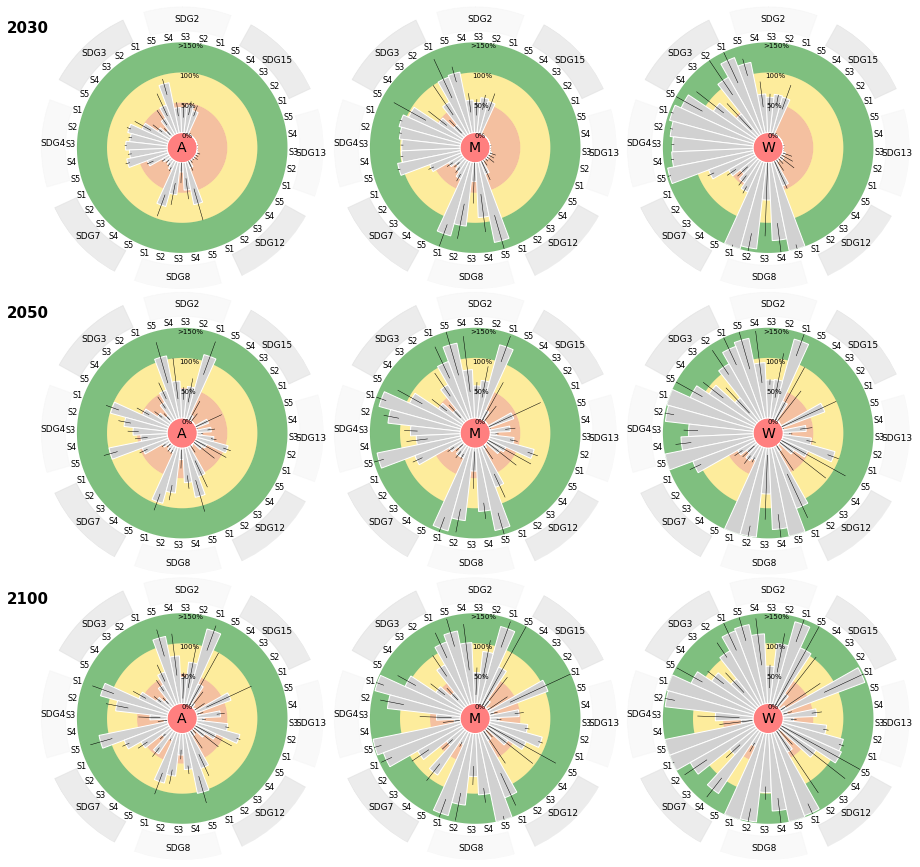

In [32]:
# Specify the target year
target_year = {130:'2030', 150:'2050', 200:'2100'}
all_targets = [targets_2030, targets_2050, targets_2100]
target_level = {0: 'A', 1:'M', 2:'W'}

# Temporary indicator list to be used in plotting here. It's the same to the list of all indicators minus share of fossil energy
inds_remove = ['Share of Fossil Energy Supply']
inds_list = [x for x in indicator_list if x not in inds_remove]


# Separate the indicators (the entire list, not the major indicator) per each SDG
sdg_inds = {}
for i in ['2', '3', '4', '7', '8', '12', '13', '15']:
    sdg_inds[i] = df_ind1[df_ind1.ID.str.startswith(i)]['Target indicator'].to_list() 
# Remove the share of fossil energy supply manually for SDG-SSP paper.
sdg_inds['7'] = [x for x in sdg_inds['7'] if x not in 'Share of Fossil Energy Supply']

# Create the figure
fig = plt.figure(figsize=(15.7, 15.7))

# Set up the grid
width_ratios = [1 ,1, 1]
grid = plt.GridSpec(3, 3, hspace=.01, wspace=.01, height_ratios= [1, 1, 1])

axes = {}
# Create the subplots for the bar polar charts
for i in range(3):
    for j in range(3):
        
        axes[i,j] = fig.add_subplot(grid[i,j], projection='polar')


for y, year in enumerate(list(target_year.keys())):
    outcomes_norm_dict = {}
    for s, ssp in enumerate(scenarios):
        # Iterate between ambitious, moderate, and weak targets and develop the stacked bar charts.
        for t in list(target_level.keys()):
            outcomes_norm = {}
            outcomes_norm[ssp] = pd.DataFrame(columns=inds_list)
            for i, ind in enumerate(inds_list):
                out_norm = outcomes[ssp][ind][:, year]
                #For indicators where reduction in indicator value is desired
                if all_targets[y][ind][5] == 'lower is better':
                    outcomes_norm[ssp][ind] = np.where(out_norm > all_targets[y][ind][3],
                                                            -(abs(out_norm - all_targets[y][ind][3])/abs(all_targets[y][ind][t]-all_targets[y][ind][3]))*100, 
                                                            (abs(out_norm - all_targets[y][ind][3])/abs(all_targets[y][ind][t]-all_targets[y][ind][3]))*100)
                #For indicators where increase in indicator value is desired
                if all_targets[y][ind][5] == 'higher is better':
                    outcomes_norm[ssp][ind] = np.where(out_norm < all_targets[y][ind][3],
                                                            -(abs(out_norm - all_targets[y][ind][3])/abs(all_targets[y][ind][t]-all_targets[y][ind][3]))*100, 
                                                            (abs(out_norm - all_targets[y][ind][3])/abs(all_targets[y][ind][t]-all_targets[y][ind][3]))*100)
            outcomes_norm[ssp][outcomes_norm[ssp] >= 150] = 150
            outcomes_norm[ssp][outcomes_norm[ssp] <= 0] = 0
            outcomes_norm_dict[(ssp, target_year[year], target_level[t])] = outcomes_norm[ssp]
    
    # Calculate the mean and error bars
    for t in list(target_level.keys()):
        x_bar_label = []
        y_bar = []
        err_bar = []
        for g, sdg in enumerate(list(sdg_names.keys())):
            for s, ssp in enumerate(scenarios):
                norm_df = outcomes_norm_dict[(ssp, target_year[year], target_level[t])]
                sdg_norm = norm_df[sdg_inds[sdg]].sum(axis=1)/len(sdg_inds[sdg])
                bar_data = np.mean(sdg_norm)
                error = (np.mean(sdg_norm)-np.amin(sdg_norm),np.amax(sdg_norm)-np.mean(sdg_norm))
                y_bar.append(bar_data)
                err_bar.append(error)
                x_bar_label.append(ssp)
        
        # This only shortens the SSP names for the plot labels
        for n, i in enumerate(x_bar_label):
            if i == 'SSP1-26':
                x_bar_label[n] = 'S1'
            if i == 'SSP2-45':
                x_bar_label[n] = 'S2'
            if i == 'SSP3-70':
                x_bar_label[n] = 'S3'
            if i == 'SSP4-60':
                x_bar_label[n] = 'S4'
            if i == 'SSP5-85':
                x_bar_label[n] = 'S5'


        # Set the zero location of theta
        axes[y,t].set_theta_zero_location("N", offset=-20)

        N = len(x_bar_label)
        N_t = 8 # the numbre of SDGs
        theta = np.linspace(0.0, 2 * np.pi, N, endpoint=False)
        values = y_bar
        yerr = np.array(err_bar).T
        width = 2*np.pi/N
        metriclabels =  x_bar_label
        metrictitle = list(sdg_names.values())
        axes[y,t].bar(theta, values, yerr=yerr, width=width, bottom=0.0, color='#d1d1d1',
               edgecolor='white',zorder=1,alpha=1, error_kw = {'elinewidth':.5, 'ecolor ':'black', 'linestyle':'.'})

        # Show the metric label
        for n in range(N):
            axes[y,t].text(theta[n], 150+10, metriclabels[n], rotation=0,
                    horizontalalignment='center', verticalalignment='center', fontsize=8)
            #ax.text(theta[n], 150+50, metriclabels[n], rotation=(n+4.75)*360/N,
                    #horizontalalignment='center', verticalalignment='center')

        # Annotate the SDG label
        for n in range(N_t):
            axes[y,t].text(theta[n*5+2], 150+40, metrictitle[n], fontsize=9, rotation=0,
                    horizontalalignment='center', verticalalignment='center')
        
        # Draw the shade arounds the SDG label
        for n in range(N_t):
            theta_c = np.linspace(theta[n*5],  theta[n*5+4], 1000, endpoint=False)
            r_c = 170+0*theta_c
            r_c_2 = 210+0*theta_c
            if (n % 2) == 0:
                axes[y,t].plot(theta_c, r_c, lw=.1, color='none')
                axes[y,t].plot(theta_c, r_c_2, lw=.1, color='none')
                axes[y,t].fill_between(theta_c, r_c, r_c_2, color='#f4f4f4',alpha=0.5,zorder=-100)
            else:
                axes[y,t].plot(theta_c, r_c, lw=.1, color='none')
                axes[y,t].plot(theta_c, r_c_2, lw=.1, color='none')
                axes[y,t].fill_between(theta_c, r_c, r_c_2, color='#dbdbdb',alpha=0.5,zorder=-100)


        # Draw the red, orange, yellow, and green shaded areas inside the polar plot.
        theta_2 = np.linspace(0.0, 2 * np.pi, 1000, endpoint=True)
        r = -50+0*theta_2
        r2 = 0 + 0*theta_2
        r3 = 50 + 0*theta_2
        r4 = 100 + 0*theta_2
        r5 = 150 + 0*theta_2
        #axes[y,t].plot(theta_2, r, lw=.1, color='none')
        axes[y,t].plot(theta_2, r2, lw=.1, color='red',alpha=.5,zorder=-100)
        axes[y,t].plot(theta_2, r3, lw=.1, color='#eb8242',alpha=.5,zorder=-100)
        axes[y,t].plot(theta_2, r4, lw=.1,color='#fddb3a',alpha=.5,zorder=-100)
        axes[y,t].plot(theta_2, r5, lw=.1,color='green',alpha=.5)
        axes[y,t].fill_between(theta_2, r, r2, fc='red', alpha=0.5,ec='none',zorder=-100)
        axes[y,t].fill_between(theta_2, r2, r3, fc='#eb8242', alpha=0.5,ec='none',zorder=-100)
        axes[y,t].fill_between(theta_2, r3, r4, fc='#fddb3a',alpha=0.5,ec='none',zorder=-100)
        axes[y,t].fill_between(theta_2, r4, r5, fc='green',alpha=0.5, ec='none', zorder=-100)

        
        # Annotate each plot title at the center 
        axes[y,t].text(theta[0], -25, target_level[t], fontsize=14, rotation=0,
                       horizontalalignment='center', verticalalignment='center')
        
        axes[y,t].spines['polar'].set_visible(False)
        axes[y,t].grid(False)
        axes[y,t].set_thetagrids([], visible=False)
        axes[y,t].set_ylim(bottom=-25, top=210)
        axes[y,t].set_rgrids([-25,0,50,100, 150])
        #thetaticks = np.arange(0,360,N)
        #ax.set_thetagrids(thetaticks)
        #ax.tick_params(pad=0)
        #ax.set_thetalim(0, 2*np.pi)
        axes[y,t].set_yticklabels(['', '0%', '50%', '100%', '>150%'],fontsize=7, rotation='vertical', va='top', zorder=120)

# Add all subplot labels
for i in range(3):
    axes[i,0].text(theta[8], 300,list(target_year.values())[i], fontsize=15, color='black', alpha=1, fontweight='heavy', rotation=0,
                        horizontalalignment='center', verticalalignment='center')

    
plt.savefig('{}/SSPs_SDGs_polarplot_SI_300dpi.png'.format(r'C:/Users/moallemie/GitHub/SSPs_SDGs_Assessment/Fig/'), dpi=300,  bbox_inches='tight') 
plt.savefig('{}/SSPs_SDGs_polarplot_SI.pdf'.format(r'C:/Users/moallemie/GitHub/SSPs_SDGs_Assessment/Fig/'), dpi=600,  bbox_inches='tight') 
plt.savefig('{}/SSPs_SDGs_polarplot_SI.png'.format(r'C:/Users/moallemie/GitHub/SSPs_SDGs_Assessment/Fig/'), dpi=600,  bbox_inches='tight') 
#plt.savefig('{}/SSPs_SDGs_polarplot_SI.svg'.format(r'C:/Users/moallemie/GitHub/SSPs_SDGs_Assessment/Fig/'), dpi=600,  bbox_inches='tight') 


## Progress per indicator per scenario (SI)

C:\ProgramData\Anaconda3\envs\python37\lib\site-packages\ipykernel_launcher.py:85: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


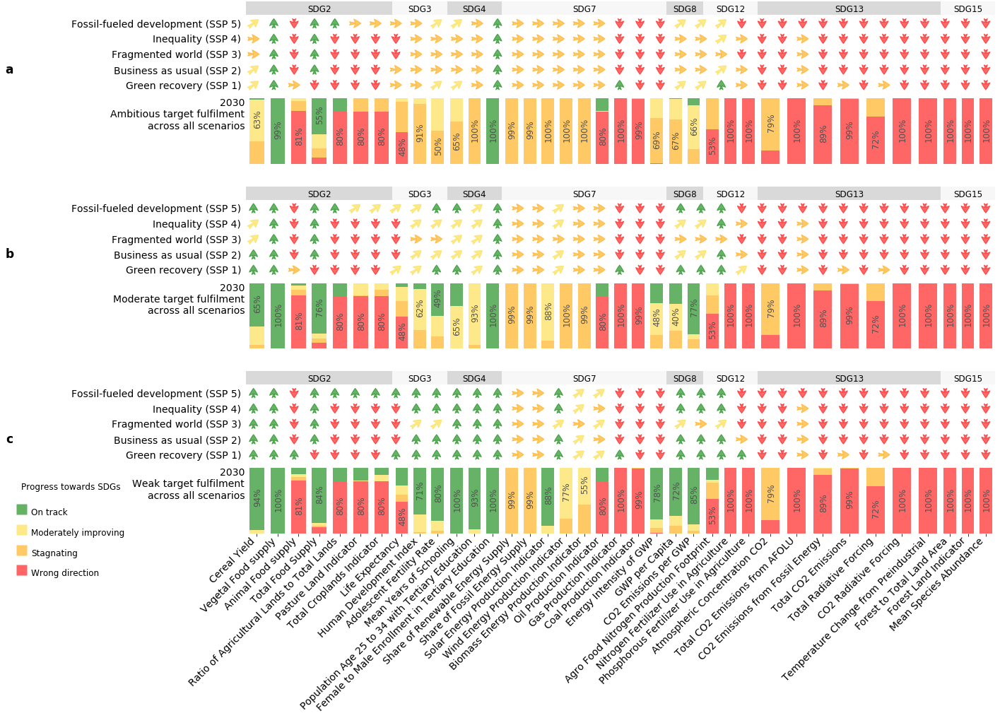

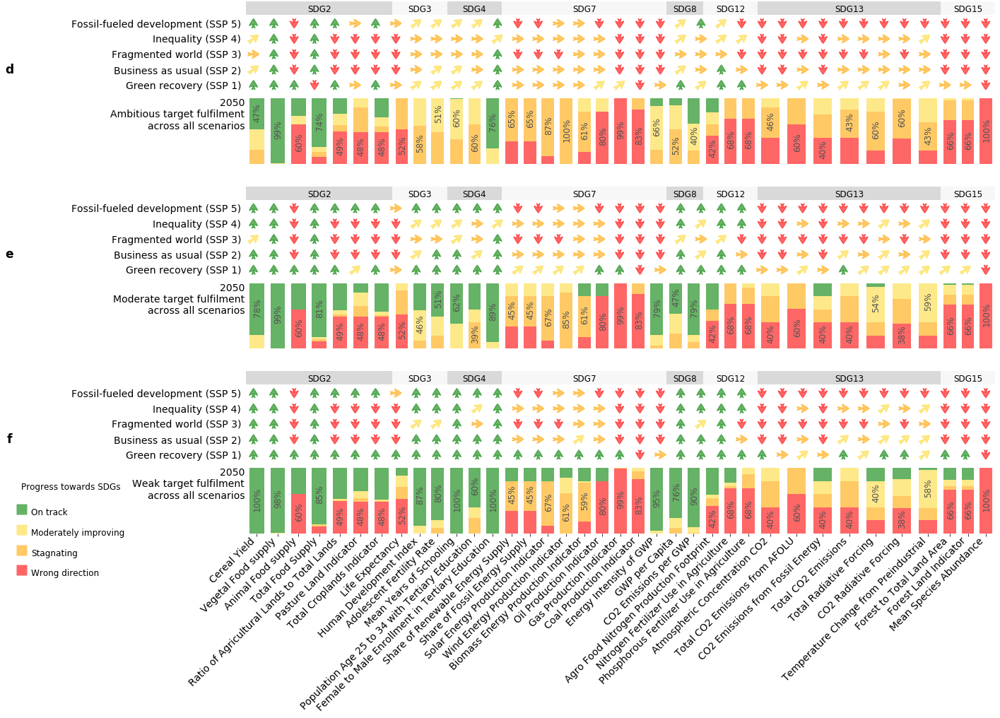

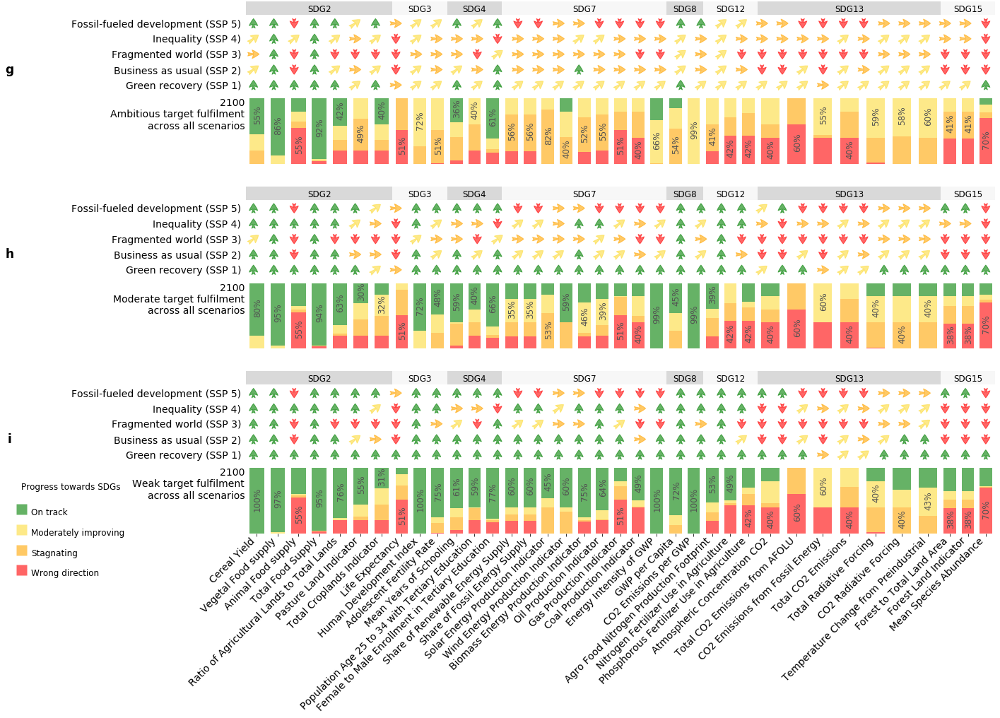

In [23]:
import matplotlib.patches as patches
from matplotlib.path import Path
from matplotlib.patches import BoxStyle

# this class expands any textboxes to the width size of the subplot. We used it for drawing the SDG boxes on the top
class ExtendedTextBox(BoxStyle._Base):
    """
    An Extended Text Box that expands to the axes limits 
                        if set in the middle of the axes
    """

    def __init__(self, pad=0.3, width=500.):
        """
        width: 
            width of the textbox. 
            Use `ax.get_window_extent().width` 
                   to get the width of the axes.
        pad: 
            amount of padding (in vertical direction only)
        """
        self.width=width
        self.pad = pad
        super(ExtendedTextBox, self).__init__()

    def transmute(self, x0, y0, width, height, mutation_size):
        """
        x0 and y0 are the lower left corner of original text box
        They are set automatically by matplotlib
        """
        # padding
        pad = mutation_size * self.pad

        # we add the padding only to the box height
        height = height + 2.*pad
        # boundary of the padded box
        y0 = y0 - pad
        y1 = y0 + height
        _x0 = x0
        x0 = _x0 +width /2. - self.width/2.
        x1 = _x0 +width /2. + self.width/2.

        cp = [(x0, y0),
              (x1, y0), (x1, y1), (x0, y1),
              (x0, y0)]

        com = [Path.MOVETO,
               Path.LINETO, Path.LINETO, Path.LINETO,
               Path.CLOSEPOLY]

        path = Path(cp, com)

        return path

dpi = 300

# register the custom style
BoxStyle._style_list["ext"] = ExtendedTextBox


target_year = {130:'2030', 150:'2050', 200:'2100'}
all_targets = [targets_2030, targets_2050, targets_2100]

# Separate the indicators (the entire list, not the major indicator) per each SDG
sdg_inds = {}
for i in ['2', '3', '4', '7', '8', '12', '13', '15']:
    sdg_inds[i] = df_ind1[df_ind1.ID.str.startswith(i)]['Target indicator'].to_list() 



# We used GridSpec for creating subplots with shared axis because we have the SSP arrows subplot on the top of other subplots with differnet ratio.
for y, year in enumerate([130, 150, 200]):
    #Set the width ratio of subplots
    width_ratios = [8,3,3,9,2,3,10,3]
    
    fig = plt.figure(figsize=(19, 13.5))
    grid = plt.GridSpec(8, 8, hspace=0.08, wspace=0, width_ratios= width_ratios, height_ratios= [1.2,1,.4,1.2,1,.4,1.2,1])
    
    axes = {}
    axes_arr = {}
    #Create a dictionary of dataframes for the normalised value of outcomes in year 2030 
    #in different scenarios based on aambitious, moderate, and weak targets.
    for t in [0,1,2]:
        axes[1+t*3,0] = fig.add_subplot(grid[1+t*3, 0])
        for c in range(8):
            axes[1+t*3,c] = fig.add_subplot(grid[1+t*3, c])
        
        outcomes_norm = {}
        for s, scenario in enumerate(scenarios):
            outcomes_norm[scenario] = pd.DataFrame(columns=indicator_list)
            for i, ind in enumerate(indicator_list):
                out_norm = outcomes[scenario][ind][:, year]
                #For indicators where reduction in indicator value is desired
                if all_targets[y][ind][5] == 'lower is better':
                    outcomes_norm[scenario][ind] = np.where(out_norm > all_targets[y][ind][3],
                                                            -(abs(out_norm - all_targets[y][ind][3])/abs(all_targets[y][ind][t]-all_targets[y][ind][3]))*100, 
                                                            (abs(out_norm - all_targets[y][ind][3])/abs(all_targets[y][ind][t]-all_targets[y][ind][3]))*100)
                #For indicators where increase in indicator value is desired
                if all_targets[y][ind][5] == 'higher is better':
                    outcomes_norm[scenario][ind] = np.where(out_norm < all_targets[y][ind][3],
                                                            -(abs(out_norm - all_targets[y][ind][3])/abs(all_targets[y][ind][t]-all_targets[y][ind][3]))*100, 
                                                            (abs(out_norm - all_targets[y][ind][3])/abs(all_targets[y][ind][t]-all_targets[y][ind][3]))*100)

        # Identify in each indicators, how many futures meet the ambitious target at different levels (green, yellow, orange, red).
        df_count = {}
        df_sum = {}

        for group_name in ['green', 'yellow', 'orange', 'red']:
            df_count[group_name] = pd.DataFrame(index=scenarios, columns=indicator_list)
            df_sum[group_name] = pd.DataFrame(columns=indicator_list)

        # Count scenarios for differnet levels of achivemengts.
        for s, sc in enumerate(scenarios):
            for i, ind in enumerate(indicator_list):
                df_count['green'].loc[sc][ind] = outcomes_norm[sc][outcomes_norm[sc][ind] >= 100].count()[ind]
                df_count['yellow'].loc[sc][ind] = outcomes_norm[sc][(outcomes_norm[sc][ind] < 100) & (outcomes_norm[sc][ind] >= 50)].count()[ind]
                df_count['orange'].loc[sc][ind] = outcomes_norm[sc][(outcomes_norm[sc][ind] < 50) & (outcomes_norm[sc][ind] > 0)].count()[ind]
                df_count['red'].loc[sc][ind] = outcomes_norm[sc][outcomes_norm[sc][ind] <= 0].count()[ind]

        # Combine the count of scenarios across the SSPs.
        for i, ind in enumerate(indicator_list):
            for group_name in ['green', 'yellow','orange', 'red']:
                df_sum[group_name][ind] = [df_count[group_name][ind].sum()]



         # Develop the stacked bar charts.
        for g, sdg in enumerate(['2','3', '4', '7', '8', '12','13', '15']): #
            x = sdg_inds[sdg]
            y_green = []
            y_red = []
            y_yellow = []
            y_orange = []
            for i, ind in enumerate(sdg_inds[sdg]):
                y_green.append(df_sum['green'][ind][0])
                y_yellow.append(df_sum['yellow'][ind][0])
                y_orange.append(df_sum['orange'][ind][0])
                y_red.append(df_sum['red'][ind][0])

            # Set the y position of each bar to start from
            bottom_yellow = [sum(x) for x in zip(y_red, y_orange)]
            bottom_green = [sum(x) for x in zip(y_red, y_yellow, y_orange)]
            axes[t*3+1, g].bar(x, y_red, width=.7, color='red', bottom=0, alpha=.6) # red
            axes[t*3+1, g].bar(x, y_orange, bottom=y_red, width=.7, color='orange', alpha=.6) # orange
            axes[t*3+1, g].bar(x, y_yellow, bottom=bottom_yellow, width=.7, color='#fddb3a', alpha=.6) # yellow
            axes[t*3+1, g].bar(x, y_green, bottom=bottom_green, width=.7, color='green',alpha=.6) # green


            # Get the y position of the bottom of each bar (stacked on the top of another)
            h = []
            for p in axes[t*3+1, g].patches:
                b = p.get_bbox()
                h.append(b.y0)

            # The iteration annotates all red bars at the bottom first and then all orange bars on the the top of red bars, and so on.
            bar_annot = []
            for p, pa in enumerate(axes[t*3+1, g].patches):      
                #if pa.get_height() > 1000: # Only annotate bars with enough height for annotation
                    # Convert the bar height to a percentage of total scenarios
                bar_annot.append((pa.get_height()/(number_sc*5))*100)

            bar_annot_inmax = []
            for p in range(len(sdg_inds[sdg])):
                # Create a list of percentage achivements per each indicator 
                bar_annot_list = [bar_annot[p], bar_annot[p+len(sdg_inds[sdg])],bar_annot[p+len(sdg_inds[sdg])*2],
                                  bar_annot[p+len(sdg_inds[sdg])*3]]
                # Find the index of the level of achivement with highest percentage for annotation per each indicator
                index_max = max(range(len(bar_annot_list)), key=bar_annot_list.__getitem__)
                bar_annot_inmax.append(p+len(sdg_inds[sdg])*index_max) # 4 is the number for levels achivements.

            for p, pa in enumerate(axes[t*3+1, g].patches):
                #if (bar_annot[p] > bar_annot[p+len(sdg_inds[sdg])])
                if p in bar_annot_inmax:
                    axes[t*3+1, g].annotate(str(int((pa.get_height()/(number_sc*5))*100))+'%', (pa.get_x()+pa.get_width()/2., pa.get_height()/2+h[p]), 
                                     ha='center', va='center', rotation=90, xytext=(1, 2),textcoords='offset points', 
                                          fontsize=12, fontweight='normal',color='#525252')

            # Remove all ticks and spines
            [s.set_visible(False) for s in axes[t*3+1, g].spines.values()]
            [t.set_visible(False) for t in axes[t*3+1, g].get_yticklines()]
            [t.set_visible(False) for t in axes[t*3+1, g].get_xticklines()]
            [l.set_visible(False) for l in axes[t*3+1, g].get_yticklabels()]

            # Change the x axis label font size and rotate the label
            #axes[t+1+y*5, g].tick_params(axis='x', rotation=90, labelsize=13)
            
            if (t == 2):
                axes[t*3+1, g].set_xticklabels(sdg_inds[sdg], fontsize=14, rotation=45, ha='right')
                axes[t*3+1, g].tick_params(axis='x', pad=0)
                axes[t*3+1, g].xaxis.tick_bottom()
            else:
                axes[t*3+1, g].tick_params(labelbottom=False)
                
                

            # Reduce the x margines in plots. The margines should be proportional to the width ratio of the subplot.
            axes[t*3+1, g].margins(x=.2/width_ratios[g], y=0)
            
            facecolor = {'2':'#d9d9d9','3':'#f7f7f7', '4':'#d9d9d9', '7':'#f7f7f7', '8':'#d9d9d9', 
                         '12':'#f7f7f7','13':'#d9d9d9', '15':'#f7f7f7'}
            
            # Use the SDG titles f. 
            title = axes[t*3+1, g].set_title(sdg_names[sdg], size=12, pad=122, 
                                                  bbox=dict(facecolor=facecolor[sdg], edgecolor='none'), color='black')
            # set the box style of the xlabel text box toour custom box
            bb = title.get_bbox_patch()
            # use the axes' width as width of the text box
            bb.set_boxstyle("ext", pad=0.4, width=axes[t*3+1, g].get_window_extent().width )

    
    
        # Now we develop the SSP arrow scatter plot on the top of stacked bar charts.
        # Here we want to show if the world unfolds according to each SSP, what would be the most likely level of target achivement.
        #Note that that it's 'the most likely' level of achivement that has the maximum scenarios in the respective SSP. Therefore, that SSP can also lead to other achivement level, but the number of scenarios is smaller. 
    
        arrow_color = {0:'green', 1:'#fddb3a', 2:'orange', 3:'red'} # Here define the arrow colour
        ssp_ind = {}
        for s, sc in enumerate(scenarios):
            for ind, indx in enumerate(indicator_list):
                ssp_char = []
                for group_name in ['green', 'yellow','orange', 'red']:
                    ssp_char.append(df_count[group_name].loc[sc][indx])
                    maxind = max(range(len(ssp_char)), key=ssp_char.__getitem__)
                    ssp_ind[(sc,indx)] = arrow_color[maxind]

        # Create an empty scatterplot with indicators in x axis and SSPs in y axis to use for annotaing arrows. Both indictors and arrows are represneted by indicative numbers to assit the positionning of arrows.
        axes_arr[t] = fig.add_subplot(grid[t*3, :])
        sc_list = [[0,1,2,3,4]]*len(indicator_list)
        for xe, ye in zip ([i for i in range(len(indicator_list))], sc_list):
            axes_arr[t].scatter([xe] * len(ye), ye, color='')



        for s, sc in enumerate(scenarios):
            for ind, indx in enumerate(indicator_list):
                if ssp_ind[(sc,indx)] == arrow_color[0]: # green color
                    axes_arr[t].annotate("",xy=(ind, s+.4), xycoords='data', xytext=(ind, s-.4), textcoords='data',
                                arrowprops=dict(arrowstyle="fancy,head_length=1,head_width=1.2,tail_width=.5",
                                                connectionstyle="arc3", color=ssp_ind[(sc,indx)], alpha=.6))
                if ssp_ind[(sc,indx)] == arrow_color[1]: # yellow color
                    axes_arr[t].annotate("",xy=(ind+.3, s+.3), xycoords='data', xytext=(ind-.3, s-.3), textcoords='data',
                                arrowprops=dict(arrowstyle="fancy,head_length=1,head_width=1.2,tail_width=.5",
                                                connectionstyle="arc3", color=ssp_ind[(sc,indx)], alpha=.6))
                if ssp_ind[(sc,indx)] == arrow_color[2]: # orange color
                    axes_arr[t].annotate("",xy=(ind+.35, s), xycoords='data', xytext=(ind-.35, s), textcoords='data',
                                arrowprops=dict(arrowstyle="fancy,head_length=1,head_width=1.2,tail_width=.5",
                                                connectionstyle="arc3", color=ssp_ind[(sc,indx)], alpha=.6))
                if ssp_ind[(sc,indx)] == arrow_color[3]: # red color
                    axes_arr[t].annotate("",xy=(ind, s-.4), xycoords='data', xytext=(ind, s+.4), textcoords='data',
                                arrowprops=dict(arrowstyle="fancy,head_length=1,head_width=1.2,tail_width=.5",
                                                connectionstyle="arc3", color=ssp_ind[(sc,indx)], alpha=.6))
        axes_arr[t].set_yticks(np.arange(len(scenarios)))
        axes_arr[t].set_yticklabels(['Green recovery (SSP 1)', 'Business as usual (SSP 2)', 
                                         'Fragmented world (SSP 3)', 'Inequality (SSP 4)', 
                                         'Fossil-fueled development (SSP 5)'], fontsize=14, ha='right')
        #axes_arr[t].set_title('Most likely progress to '+target_year[year]+' moderate taregts', loc='left', ha='right', 
                              #size=14, pad=5, position=(-.0098, 1))
        axes_arr[t].margins(y=.1) 
        axes_arr[t].margins(x=0.01)
        #axes_arr[y].set_facecolor('#f0f0f0')


        # Remove all ticks and spines
        [s.set_visible(False) for s in axes_arr[t].spines.values()]
        [t.set_visible(False) for t in axes_arr[t].get_xticklines()]
        [t.set_visible(False) for t in axes_arr[t].get_yticklines()]
        [l.set_visible(False) for l in axes_arr[t].get_xticklabels()]


        # Set y-axis label to annoate the achivement levels
        target_label = {1:'2030\nAmbitious target fulfilment\nacross all scenarios', 2:'2030\nModerate target fulfilment\nacross all scenarios', 3:'2030\nWeak target fulfilment\nacross all scenarios',
                        4:'2050\nAmbitious target fulfilment\nacross all scenarios', 5:'2050\nModerate target fulfilment\nacross all scenarios', 6:'2050\nWeak target fulfilment\nacross all scenarios', 
                        7:'2100\nAmbitious target fulfilment\nacross all scenarios', 8:'2100\nModerate target fulfilment\nacross all scenarios', 9:'2100\nWeak target fulfilment\nacross all scenarios'}
        axes[1+t*3,0].set_ylabel(target_label[t+1+y*3], size=14, labelpad=2, rotation='horizontal', ha='right', position=(-0,.5))
        
        fig_label = {1:'a', 2:'b', 3:'c',
                        4:'d', 5:'e', 6:'f', 
                        7:'g', 8:'h', 9:'i'}    
        # Add all subplot labels
        axes_arr[t].text(-12, 1, fig_label[t+1+y*3], fontsize=17, fontweight='heavy', rotation=0,
                            horizontalalignment='center', verticalalignment='center')

    # Create legend
    legend_elements = []

    legend_colors = ['green', '#fddb3a', 'orange', 'red']
    legend_labels = ['On track', 'Moderately improving', 'Stagnating', 'Wrong direction']

    for i in range(4):
        legend_elements.append(Line2D([0], [0], marker="s", color='none', label=legend_labels[i], 
                                      markersize=15, markeredgecolor='none', markerfacecolor=legend_colors[i], alpha=0.6))

    fig.legend(handles=legend_elements, loc='upper left', bbox_to_anchor=(-.12, .16, .5, .05), frameon=False, 
               bbox_transform=fig.transFigure, ncol=1, title="Progress towards SDGs\n", title_fontsize='large',
               handlelength=1, columnspacing=1, handletextpad=.7, labelspacing=.01, fontsize=12, handleheight=3.3)
 

    #plt.savefig('{}/SSPs_SDGs_boxarrows_{}_SI.pdf'.format(r'C:/Users/moallemie/GitHub/SSPs_SDGs_Assessment/Fig/',target_year[year]), dpi=600,  bbox_inches='tight') 


## Timeseries indicator trajectories (SI 1)

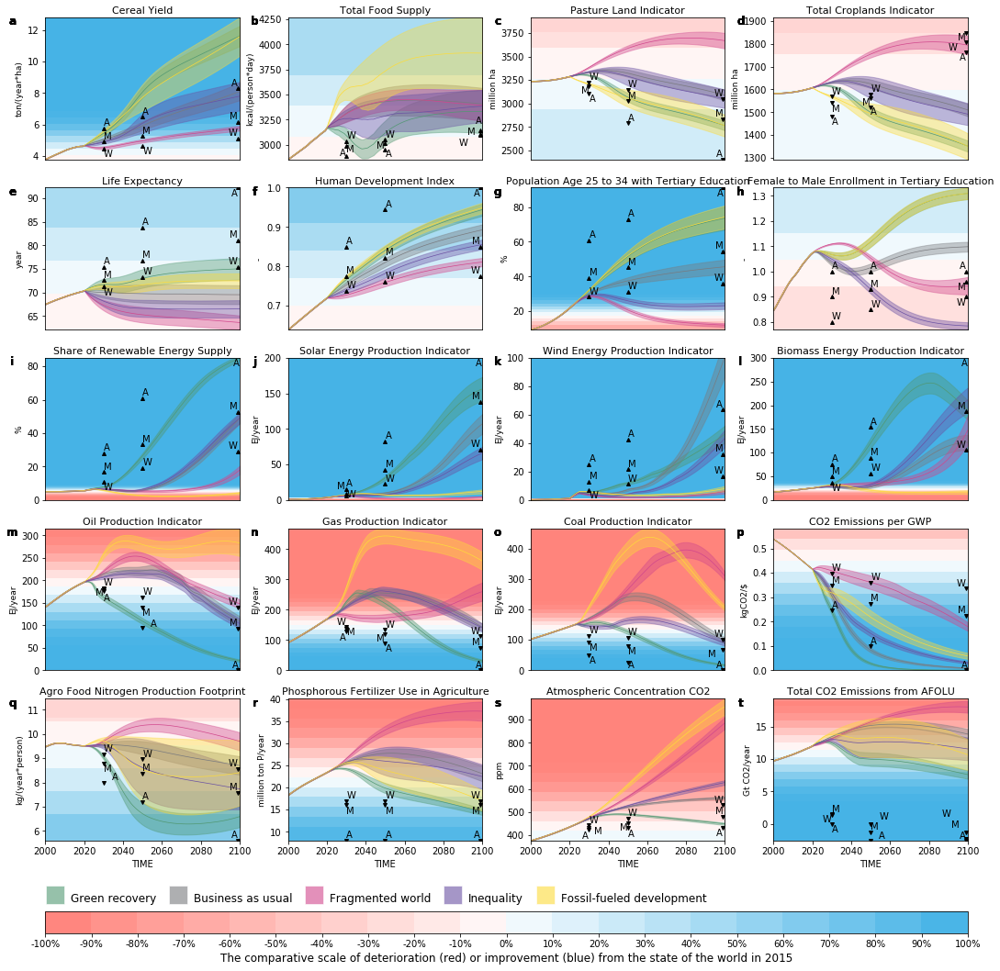

In [24]:
from textwrap import wrap
import math
from adjustText import adjust_text
from matplotlib.lines import Line2D
import matplotlib as mpl
import matplotlib.ticker as mticker
import string

'''# Class to Change offset in scientific axis label format in y axis in plots
class Labeloffset():
    def __init__(self,  ax, label="", axis="y"):
        self.axis = {"y":ax.yaxis, "x":ax.xaxis}[axis]
        self.label=label
        ax.callbacks.connect(axis+'lim_changed', self.update)
        ax.figure.canvas.draw()
        self.update(None)

    def update(self, lim):
        fmt = self.axis.get_major_formatter()
        self.axis.offsetText.set_visible(False)
        ax.set_ylabel(self.label + " "+ fmt.get_offset() , size=9, labelpad=1)'''


inds_list = ['Cereal Yield',
 'Total Food Supply',
 'Pasture Land Indicator',
 'Total Croplands Indicator',
 'Life Expectancy',
 'Human Development Index',
 'Population Age 25 to 34 with Tertiary Education',
 'Female to Male Enrollment in Tertiary Education',
 'Share of Renewable Energy Supply',
 'Solar Energy Production Indicator',
 'Wind Energy Production Indicator',
 'Biomass Energy Production Indicator',
 'Oil Production Indicator',
 'Gas Production Indicator',
 'Coal Production Indicator',
 'CO2 Emissions per GWP',
 'Agro Food Nitrogen Production Footprint',
 'Phosphorous Fertilizer Use in Agriculture', 
 'Atmospheric Concentration CO2', 
 'Total CO2 Emissions from AFOLU']


# Flatten 2D arrays in outcomes[indicator] to 1D array and create a long-format dataframe for plotting the uncertainty
# Why we convert outcomes to long-format dataframe? because it's the accepted format of sns.lineplot which draws uncertainty
outcomes_dict = {}

for i in scenarios:
    outcomes_df = pd.DataFrame(columns=(['TIME']+indicator_list))
    for key in (['TIME']+indicator_list): 
        outcomes_df[key] = outcomes[i][key][:, 100:].ravel() # Plot timeseries data from 2000 (100:)
    outcomes_dict[i] = outcomes_df 
    
# The plots will be in 4 column and a certain number of rows, depending on the number of indicators
fig_rows = 5
fig_cols = 4

fig, axes = plt.subplots(fig_rows, fig_cols, figsize=(18, 16.5), sharex='col')
fig.subplots_adjust(hspace=0.2, wspace=0.25)

# For iterating betweeing subplots
i = 0
j = 0


for v, var in enumerate(inds_list): #inds_list
    if j == fig_cols:
        j = 0
        i += 1
        
    for s, sc in enumerate(scenarios):
        ax = sns.lineplot(x='TIME', y=var, ci='sd', data=outcomes_dict[sc],
                          ax=axes[i,j], marker='', color=sc_colors[sc], lw=.7,
                          err_kws={'alpha':.4})
        
        ax.set_title(var, fontsize=11, pad=4)
        ax.yaxis.set_label_text(inds_unit[var], fontsize=9)
        
        # Manually adjust the y min and max for better visualsiation of improvement and deterioration.
        if var == 'Share of Renewable Energy Supply' :
            ax.set_ylim(ymin=0, ymax=85)
        if var == 'Solar Energy Production Indicator' :
            ax.set_ylim(ymin=0, ymax=200)
        if var == 'Wind Energy Production Indicator' :
            ax.set_ylim(ymin=0, ymax=100)
        if var == 'Biomass Energy Production Indicator' :
            ax.set_ylim(ymin=0, ymax=300)
  
        
        # Add all subplot labels
        fig_label = list(string.ascii_lowercase)    
        ax.text(-.17, .97, fig_label[v], fontsize=12, fontweight='semibold', rotation=0,
                            horizontalalignment='center', verticalalignment='center', transform=ax.transAxes)
        
    
   
    # Remove the whitespace at the beginning and end of  x and y axes
    axes[i,j].margins(x=0)
    axes[i,j].margins(y=0)

    # Annotate the target levels
    x_val = []
    y_val = []
    for y in range(3):
        targets_value = [targets_2030[var][y], targets_2050[var][y], targets_2100[var][y]]
        targets_year = [2030, 2050, 2099]
        
        # For indicators where reduction in indicator value is desired
        if targets_2030[var][5] == 'lower is better':
            axes[i,j].plot(targets_year, targets_value, linestyle="None", marker='v', alpha=1, markersize=4 ,color='black')
        # For indicators where increase in value is desired
        if targets_2030[var][5] == 'higher is better':
            axes[i,j].plot(targets_year, targets_value, linestyle="None", marker='^', alpha=1, markersize=4 ,color='black')


        x_val = x_val + targets_year
        y_val = y_val + targets_value
        
    text = ['A', 'A', 'A', 'M', 'M', 'M', 'W', 'W', 'W']        
    texts = []
    for x, y, s in zip(x_val, y_val, text):
        texts.append(axes[i,j].text(x, y, s))
    adjust_text(texts, ax= axes[i,j],  only_move={'points':'xy', 'texts':'xy'}, force_text=(.4, .2), 
                force_points=(.4, .2))
    
    
    # To correct the formarting of the y-axis to appear with scietific format
    #axes[i,j].ticklabel_format(style='sci',axis='y',scilimits=(-2,3))
    #axes[i,j].yaxis.offsetText.set_visible(False)
    #formatter = mticker.ScalarFormatter(useMathText=True)
    #formatter.set_powerlimits((-2,3))
    #axes[i,j].yaxis.set_major_formatter(formatter)
    
    
    
    
    # This is  a temporary change to replace and change the scientific unit of this individual indicator only in plots instead of running the experiments again with a new name and new unit.
    '''if var == 'Total Plant Meat Food Production':
        axes[i,j].yaxis.offsetText.set_visible(False)
        axes[i,j].yaxis.set_label_text('10 billion ton/year')
        axes[i,j].set_title('Plant based plus meat based food', fontsize=11, pad=4)
    elif var == 'Nitrogen Fertilizer Use in Agriculture':
        axes[i,j].yaxis.offsetText.set_visible(False)
        axes[i,j].yaxis.set_label_text('100 million ton/year')
        axes[i,j].set_title(var, fontsize=11, pad=4)
    elif var == 'Phosphorous Fertilizer Use in Agriculture':
        axes[i,j].yaxis.offsetText.set_visible(False)
        axes[i,j].yaxis.set_label_text('10 million ton/year')
        axes[i,j].set_title(var, fontsize=11, pad=4)
    else:
        axes[i,j].set_title(var, fontsize=11, pad=4)
        lo = Labeloffset(axes[i,j], label=inds_unit[var], axis="y")'''


    j += 1


# Removing ticks for inner plots                
for i in range(fig_rows-1):
    for j in range(fig_cols):
        axes[i, j].tick_params(bottom=False)

# Draw the shaded increment boxes in the background of each subplot
i = 0
j = 0
for v, var in enumerate(inds_list): 
    if var in indicator_list:
        if j == fig_cols:
            j = 0
            i += 1
        
        # Create 10% improvement (increase or decrease) increment from the model reference value.
        improv_incr = targets_2030[var][4]*.1
        
        # Get the min and max of each subplot
        y_min = axes[i,j].get_ylim()[0]
        y_max = axes[i,j].get_ylim()[1]
        
        # For indicators where reduction in indicator value is desired
        if targets_2030[var][5] == 'lower is better':
            
            # Color the increment steps up to 10 steps with blue
            for c in range(10):
                if (targets_2030[var][4]-improv_incr*(c+1)) > y_min:
                    axes[i,j].axhspan(targets_2030[var][4]-improv_incr*(c+1), targets_2030[var][4]-improv_incr*(c), 
                                      facecolor='#46b3e6', alpha=0.08+(0.1*c), zorder=-100)
                    axes[i,j].axhspan(y_min, targets_2030[var][4]-improv_incr*(c+1), facecolor='#46b3e6', 
                                      alpha=0.08+(0.1*c), zorder=-100)
                else:
                    if c == 0:
                        axes[i,j].axhspan(y_min, targets_2030[var][4]-improv_incr*(c), facecolor='#46b3e6', 
                                          alpha=0.08+(0.1*c), zorder=-100)
            # Color the increment steps up to 10 steps with red
            for c in range(10):
                if (targets_2030[var][4]+improv_incr*c) < y_max:
                    axes[i,j].axhspan(targets_2030[var][4]+improv_incr*c, targets_2030[var][4]+improv_incr*(c+1), 
                                      facecolor='#ff847c', alpha=0.08+(0.1*c), zorder=-100)
                    axes[i,j].axhspan(targets_2030[var][4]+improv_incr*(c+1), y_max, facecolor='#ff847c', 
                                      alpha=0.08+(0.1*c), zorder=-100)
                else:
                    if c == 0:  
                        axes[i,j].axhspan(targets_2030[var][4]+improv_incr*(c), y_max, facecolor='#ff847c', 
                                          alpha=0.08+(0.1*c), zorder=-100)
                        
        # For indicators where increase in value is desired
        if targets_2030[var][5] == 'higher is better':  
            
            # Color the increment steps up to 10 steps with blue
            for c in range(10):
                if (targets_2030[var][4]+improv_incr*(c+1)) < y_max:
                    axes[i,j].axhspan(targets_2030[var][4]+improv_incr*c, targets_2030[var][4]+improv_incr*(c+1), 
                                      facecolor='#46b3e6', alpha=0.08+(0.1*c), zorder=-100)
                    axes[i,j].axhspan(targets_2030[var][4]+improv_incr*(c+1), y_max, facecolor='#46b3e6', 
                                      alpha=0.08+(0.1*c), zorder=-100)
                else:
                    if c == 0:
                        axes[i,j].axhspan(targets_2030[var][4]+improv_incr*(c), y_max, facecolor='#46b3e6', 
                                          alpha=0.08+(0.1*c), zorder=-100)
            
            # Color the increment steps up to 10 steps with red
            for c in range(10):
                if (targets_2030[var][4]-improv_incr*(c+1)) > y_min:
                    axes[i,j].axhspan(targets_2030[var][4]-improv_incr*(c+1), targets_2030[var][4]-improv_incr*c, 
                                      facecolor='#ff847c', alpha=0.08+(0.1*c), zorder=-100)
                    axes[i,j].axhspan(y_min, targets_2030[var][4]-improv_incr*(c+1), facecolor='#ff847c', 
                                      alpha=0.08+(0.1*c), zorder=-100)
                else:
                    if c == 0:
                        axes[i,j].axhspan(y_min, targets_2030[var][4]-improv_incr*(c), facecolor='#ff847c', 
                                          alpha=0.08+(0.1*c), zorder=-100)
        
        j += 1 
        
'''
# Annotate the regions/world data for comparison with the model projection.
i = 0
j = 0
for v, var in enumerate(sdg_inds['2']+sdg_inds['3']+sdg_inds['4']+sdg_inds['7']+sdg_inds['8']):
    if var in indicator_list:
        if j == fig_cols:
            j = 0
            i += 1
        if var in df_ind1['Target indicator'].to_list():
            var_indx = df_hist.index[df_hist['Target indicator'] == var]
            #data_region = [df_hist['World/region/country'].loc[var_indx].item()]
            data_year = [df_hist['Data reference year'].loc[var_indx].item()]
            data_value = [df_hist['Data reference value'].loc[var_indx].item()]
            axes[i,j].plot(data_year, data_value, linestyle="None", marker='^', alpha=0.5, markersize=10,  
                           markeredgecolor='#ffdd00',color='#f75f00')
            axes[i,j].annotate(df_hist['Scale'].loc[var_indx].item(), (data_year[0], data_value[0]))
        j += 1

'''

# Create legend for the SSPs
legend_elements_2 = []


for i in scenarios:
    legend_elements_2.append(Line2D([0], [0], marker="s", color='none', label=ssp_names[i], 
                                  markersize=20, markeredgecolor='white', markerfacecolor=sc_colors[i], alpha=.6))

fig.legend(handles=legend_elements_2, loc='upper left', bbox_to_anchor=(.12, .04, .4, .05), frameon=False, 
           bbox_transform=fig.transFigure, ncol=20, 
           handlelength=1, columnspacing=1.5, handletextpad=.9, labelspacing=.01, fontsize=12, handleheight=2.4)

# Create the colorbar for background gradients

# First, create a list of our values for colorbar
vals = list(range(-100, 101, 10))
vals = [x/100 for x in vals]
vals_text = ["{0:.0%}".format(x) for x in vals]

# Second, create the colour names with a function

def alpha_blending(hex_color, alpha) :
    """ alpha blending as if on the white background.
    """
    foreground_tuple  = mpl.colors.hex2color(hex_color)
    foreground_arr = np.array(foreground_tuple)
    final = tuple( (1. -  alpha) + foreground_arr*alpha )
    return(final)

colorbar_list = []
for i in range(10):
    colorbar_list.append(alpha_blending('#ff847c', 0.08+(0.1*i)))
colorbar_list = colorbar_list[::-1]
for i in range(10):
    colorbar_list.append(alpha_blending('#46b3e6', 0.08+(0.1*i)))
    

# Third, create a ListedColormap object, which contains the information of the colours we want to display in our colourbar
cmap = mpl.colors.ListedColormap(colorbar_list)

# Fourth, set the colormap index for discrete color bar
norm = mpl.colors.BoundaryNorm(vals, cmap.N)

# Fifth, create the colorbar
ax2 = fig.add_axes([0.95, 0.1, 0.03, 0.7])

cb = mpl.colorbar.ColorbarBase(ax2, cmap=cmap,
                                norm=norm,
                                spacing='uniform',
                                orientation='horizontal',
                                extend='neither',
                                ticks=vals)
cb.set_ticklabels(vals_text)


cb.set_label('The comparative scale of deterioration (red) or improvement (blue) from the state of the world in 2015', fontsize=12)
ax2.set_position((0.125, .04, 0.775, 0.02))

plt.savefig('{}/SSPs_SDGs_timeseries_SI1_300dpi.png'.format(r'C:/Users/moallemie/GitHub/SSPs_SDGs_Assessment/Fig/'), dpi=300,  bbox_inches='tight') 
plt.savefig('{}/SSPs_SDGs_timeseries_SI1.png'.format(r'C:/Users/moallemie/GitHub/SSPs_SDGs_Assessment/Fig/'), dpi=600,  bbox_inches='tight') 
plt.savefig('{}/SSPs_SDGs_timeseries_SI1.pdf'.format(r'C:/Users/moallemie/GitHub/SSPs_SDGs_Assessment/Fig/'), dpi=600,  bbox_inches='tight') 
#plt.savefig('{}/SSPs_SDGs_timeseries_SI1.svg'.format(r'C:/Users/moallemie/GitHub/SSPs_SDGs_Assessment/Fig/'), dpi=600,  bbox_inches='tight') 


## Timeseries indicator trajectories (SI 2)

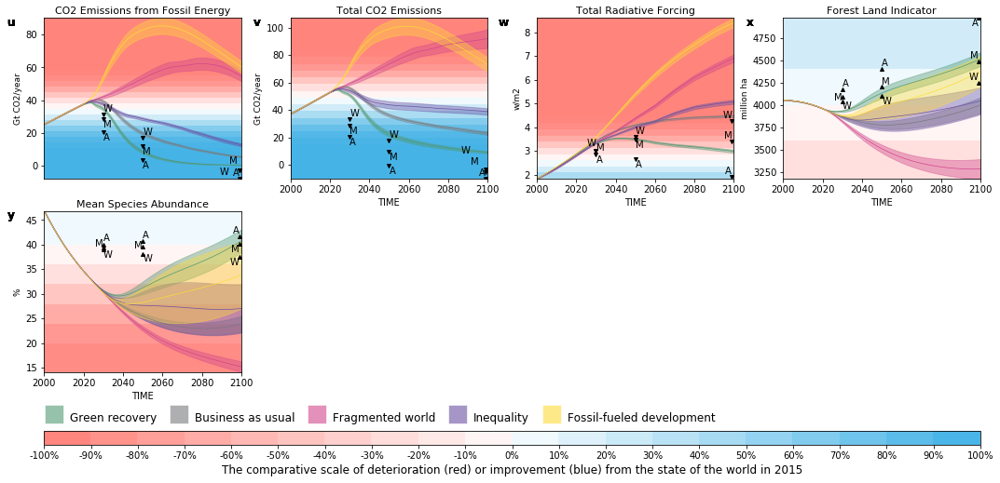

In [25]:
from textwrap import wrap
import math
from adjustText import adjust_text
from matplotlib.lines import Line2D
import matplotlib as mpl
import matplotlib.ticker as mticker
import string


# Class to Change offset in scientific axis label format in y axis in plots
'''class Labeloffset():
    def __init__(self,  ax, label="", axis="y"):
        self.axis = {"y":ax.yaxis, "x":ax.xaxis}[axis]
        self.label=label
        ax.callbacks.connect(axis+'lim_changed', self.update)
        ax.figure.canvas.draw()
        self.update(None)

    def update(self, lim):
        fmt = self.axis.get_major_formatter()
        self.axis.offsetText.set_visible(False)
        ax.set_ylabel(self.label + " "+ fmt.get_offset() , size=9, labelpad=1)'''


inds_list = [ 'CO2 Emissions from Fossil Energy',
 'Total CO2 Emissions',
 'Total Radiative Forcing',
 'Forest Land Indicator',
 'Mean Species Abundance']


# Flatten 2D arrays in outcomes[indicator] to 1D array and create a long-format dataframe for plotting the uncertainty
# Why we convert outcomes to long-format dataframe? because it's the accepted format of sns.lineplot which draws uncertainty
outcomes_dict = {}

for i in scenarios:
    outcomes_df = pd.DataFrame(columns=(['TIME']+indicator_list))
    for key in (['TIME']+indicator_list): 
        outcomes_df[key] = outcomes[i][key][:, 100:].ravel() # Plot timeseries data from 2000 (100:)
    outcomes_dict[i] = outcomes_df 
    
# The plots will be in 4 column and a certain number of rows, depending on the number of indicators
fig_rows = 2
fig_cols = 4

fig, axes = plt.subplots(fig_rows, fig_cols, figsize=(18, 7))
fig.subplots_adjust(hspace=0.2, wspace=0.25)

# For iterating betweeing subplots
i = 0
j = 0


for v, var in enumerate(inds_list):
    if j == fig_cols:
        j = 0
        i += 1
        
    for s, sc in enumerate(scenarios):
        ax = sns.lineplot(x='TIME', y=var, ci='sd', data=outcomes_dict[sc], 
                     ax=axes[i,j], marker='', color=sc_colors[sc], lw=.7,
                     err_kws={'alpha':.4})
        ax.set_title(var, fontsize=11, pad=4)
        ax.yaxis.set_label_text(inds_unit[var], fontsize=9)
        
        # Add all subplot labels
        fig_label = ['u', 'v', 'w', 'x', 'y']    
        ax.text(-.17, .97, fig_label[v], fontsize=12, fontweight='semibold', rotation=0,
                            horizontalalignment='center', verticalalignment='center', transform=ax.transAxes)
        
     
   
    # Remove the whitespace at the beginning and end of  x and y axes
    axes[i,j].margins(x=0)
    axes[i,j].margins(y=0)

    # Annotate the target levels
    x_val = []
    y_val = []
    for y in range(3):
        targets_value = [targets_2030[var][y], targets_2050[var][y], targets_2100[var][y]]
        targets_year = [2030, 2050, 2099]
        
        # For indicators where reduction in indicator value is desired
        if targets_2030[var][5] == 'lower is better':
            axes[i,j].plot(targets_year, targets_value, linestyle="None", marker='v', alpha=1, markersize=4 ,color='black')
        # For indicators where increase in value is desired
        if targets_2030[var][5] == 'higher is better':
            axes[i,j].plot(targets_year, targets_value, linestyle="None", marker='^', alpha=1, markersize=4 ,color='black')


        x_val = x_val + targets_year
        y_val = y_val + targets_value
        
    text = ['A', 'A', 'A', 'M', 'M', 'M', 'W', 'W', 'W']        
    texts = []
    for x, y, s in zip(x_val, y_val, text):
        texts.append(axes[i,j].text(x, y, s))
    adjust_text(texts, ax= axes[i,j],  only_move={'points':'xy', 'texts':'xy'}, force_text=(.4, .2), 
                force_points=(.4, .2))
    
    
    # To correct the formarting of the y-axis to appear with scietific format
    #axes[i,j].ticklabel_format(style='sci',axis='y',scilimits=(-2,3))
    #axes[i,j].yaxis.offsetText.set_visible(False)
    #formatter = mticker.ScalarFormatter(useMathText=True)
    #formatter.set_powerlimits((-2,3))
    #axes[i,j].yaxis.set_major_formatter(formatter)
    
    
    
    
    # This is  a temporary change to replace and change the scientific unit of this individual indicator only in plots instead of running the experiments again with a new name and new unit.
    '''if var == 'Total Plant Meat Food Production':
        axes[i,j].yaxis.offsetText.set_visible(False)
        axes[i,j].yaxis.set_label_text('10 billion ton/year')
        axes[i,j].set_title('Plant based plus meat based food', fontsize=11, pad=4)
    elif var == 'Nitrogen Fertilizer Use in Agriculture':
        axes[i,j].yaxis.offsetText.set_visible(False)
        axes[i,j].yaxis.set_label_text('100 million ton/year')
        axes[i,j].set_title(var, fontsize=11, pad=4)
    elif var == 'Phosphorous Fertilizer Use in Agriculture':
        axes[i,j].yaxis.offsetText.set_visible(False)
        axes[i,j].yaxis.set_label_text('10 million ton/year')
        axes[i,j].set_title(var, fontsize=11, pad=4)
    else:
        axes[i,j].set_title(var, fontsize=11, pad=4)
        lo = Labeloffset(axes[i,j], label=inds_unit[var], axis="y")'''


    j += 1


# Removing ticks for inner plots                
for i in range(fig_rows-1):
    for j in range(fig_cols):
        axes[i, j].tick_params(bottom=False)

# Draw the shaded increment boxes in the background of each subplot
i = 0
j = 0
for v, var in enumerate(inds_list): 
    if var in indicator_list:
        if j == fig_cols:
            j = 0
            i += 1
        
        # Create 10% improvement (increase or decrease) increment from the model reference value.
        improv_incr = targets_2030[var][4]*.1
        
        # Get the min and max of each subplot
        y_min = axes[i,j].get_ylim()[0]
        y_max = axes[i,j].get_ylim()[1]
        
        # For indicators where reduction in indicator value is desired
        if targets_2030[var][5] == 'lower is better':
            
            # Color the increment steps up to 10 steps with blue
            for c in range(10):
                if (targets_2030[var][4]-improv_incr*(c+1)) > y_min:
                    axes[i,j].axhspan(targets_2030[var][4]-improv_incr*(c+1), targets_2030[var][4]-improv_incr*(c), 
                                      facecolor='#46b3e6', alpha=0.08+(0.1*c), zorder=-100)
                    axes[i,j].axhspan(y_min, targets_2030[var][4]-improv_incr*(c+1), facecolor='#46b3e6', 
                                      alpha=0.08+(0.1*c), zorder=-100)
                else:
                    if c == 0:
                        axes[i,j].axhspan(y_min, targets_2030[var][4]-improv_incr*(c), facecolor='#46b3e6', 
                                          alpha=0.08+(0.1*c), zorder=-100)
            # Color the increment steps up to 10 steps with red
            for c in range(10):
                if (targets_2030[var][4]+improv_incr*c) < y_max:
                    axes[i,j].axhspan(targets_2030[var][4]+improv_incr*c, targets_2030[var][4]+improv_incr*(c+1), 
                                      facecolor='#ff847c', alpha=0.08+(0.1*c), zorder=-100)
                    axes[i,j].axhspan(targets_2030[var][4]+improv_incr*(c+1), y_max, facecolor='#ff847c', 
                                      alpha=0.08+(0.1*c), zorder=-100)
                else:
                    if c == 0:  
                        axes[i,j].axhspan(targets_2030[var][4]+improv_incr*(c), y_max, facecolor='#ff847c', 
                                          alpha=0.08+(0.1*c), zorder=-100)
                        
        # For indicators where increase in value is desired
        if targets_2030[var][5] == 'higher is better':  
            
            # Color the increment steps up to 10 steps with blue
            for c in range(10):
                if (targets_2030[var][4]+improv_incr*(c+1)) < y_max:
                    axes[i,j].axhspan(targets_2030[var][4]+improv_incr*c, targets_2030[var][4]+improv_incr*(c+1), 
                                      facecolor='#46b3e6', alpha=0.08+(0.1*c), zorder=-100)
                    axes[i,j].axhspan(targets_2030[var][4]+improv_incr*(c+1), y_max, facecolor='#46b3e6', 
                                      alpha=0.08+(0.1*c), zorder=-100)
                else:
                    if c == 0:
                        axes[i,j].axhspan(targets_2030[var][4]+improv_incr*(c), y_max, facecolor='#46b3e6', 
                                          alpha=0.08+(0.1*c), zorder=-100)
            
            # Color the increment steps up to 10 steps with red
            for c in range(10):
                if (targets_2030[var][4]-improv_incr*(c+1)) > y_min:
                    axes[i,j].axhspan(targets_2030[var][4]-improv_incr*(c+1), targets_2030[var][4]-improv_incr*c, 
                                      facecolor='#ff847c', alpha=0.08+(0.1*c), zorder=-100)
                    axes[i,j].axhspan(y_min, targets_2030[var][4]-improv_incr*(c+1), facecolor='#ff847c', 
                                      alpha=0.08+(0.1*c), zorder=-100)
                else:
                    if c == 0:
                        axes[i,j].axhspan(y_min, targets_2030[var][4]-improv_incr*(c), facecolor='#ff847c', 
                                          alpha=0.08+(0.1*c), zorder=-100)
        
        j += 1 
        
'''
# Annotate the regions/world data for comparison with the model projection.
i = 0
j = 0
for v, var in enumerate(sdg_inds['2']+sdg_inds['3']+sdg_inds['4']+sdg_inds['7']+sdg_inds['8']):
    if var in indicator_list:
        if j == fig_cols:
            j = 0
            i += 1
        if var in df_ind1['Target indicator'].to_list():
            var_indx = df_hist.index[df_hist['Target indicator'] == var]
            #data_region = [df_hist['World/region/country'].loc[var_indx].item()]
            data_year = [df_hist['Data reference year'].loc[var_indx].item()]
            data_value = [df_hist['Data reference value'].loc[var_indx].item()]
            axes[i,j].plot(data_year, data_value, linestyle="None", marker='^', alpha=0.5, markersize=10,  
                           markeredgecolor='#ffdd00',color='#f75f00')
            axes[i,j].annotate(df_hist['Scale'].loc[var_indx].item(), (data_year[0], data_value[0]))
        j += 1

'''
for j in [1, 2, 3]:
    axes[1,j].axis('off')
    axes[0, j].tick_params(bottom=True, labelbottom=True)
    axes[0, j].set_xlabel('TIME')
axes[0, 0].tick_params(bottom=False, labelbottom=False)
axes[0, 0].set_xlabel('')

# Create legend for the SSPs
legend_elements_2 = []


for i in scenarios:
    legend_elements_2.append(Line2D([0], [0], marker="s", color='none', label=ssp_names[i], 
                                  markersize=20, markeredgecolor='white', markerfacecolor=sc_colors[i], alpha=.6))

fig.legend(handles=legend_elements_2, loc='upper left', bbox_to_anchor=(.12, .02, .4, .05), frameon=False, 
           bbox_transform=fig.transFigure, ncol=20, 
           handlelength=1, columnspacing=1.5, handletextpad=.9, labelspacing=.01, fontsize=12, handleheight=2.4)

# Create the colorbar for background gradients

# First, create a list of our values for colorbar
vals = list(range(-100, 101, 10))
vals = [x/100 for x in vals]
vals_text = ["{0:.0%}".format(x) for x in vals]

# Second, create the colour names with a function

def alpha_blending(hex_color, alpha) :
    """ alpha blending as if on the white background.
    """
    foreground_tuple  = mpl.colors.hex2color(hex_color)
    foreground_arr = np.array(foreground_tuple)
    final = tuple( (1. -  alpha) + foreground_arr*alpha )
    return(final)

colorbar_list = []
for i in range(10):
    colorbar_list.append(alpha_blending('#ff847c', 0.08+(0.1*i)))
colorbar_list = colorbar_list[::-1]
for i in range(10):
    colorbar_list.append(alpha_blending('#46b3e6', 0.08+(0.1*i)))
    

# Third, create a ListedColormap object, which contains the information of the colours we want to display in our colourbar
cmap = mpl.colors.ListedColormap(colorbar_list)

# Fourth, set the colormap index for discrete color bar
norm = mpl.colors.BoundaryNorm(vals, cmap.N)

# Fifth, create the colorbar
ax2 = fig.add_axes([0.95, 0.1, 0.03, .7])

cb = mpl.colorbar.ColorbarBase(ax2, cmap=cmap,
                                norm=norm,
                                spacing='uniform',
                                orientation='horizontal',
                                extend='neither',
                                ticks=vals)
cb.set_ticklabels(vals_text)


cb.set_label('The comparative scale of deterioration (red) or improvement (blue) from the state of the world in 2015', fontsize=12)
ax2.set_position((0.125, -.03, 0.775, 0.03))


plt.savefig('{}/SSPs_SDGs_timeseries_SI2_300dpi.png'.format(r'C:/Users/moallemie/GitHub/SSPs_SDGs_Assessment/Fig/'), dpi=300,  bbox_inches='tight') 
plt.savefig('{}/SSPs_SDGs_timeseries_SI2.png'.format(r'C:/Users/moallemie/GitHub/SSPs_SDGs_Assessment/Fig/'), dpi=600,  bbox_inches='tight') 
plt.savefig('{}/SSPs_SDGs_timeseries_SI2.pdf'.format(r'C:/Users/moallemie/GitHub/SSPs_SDGs_Assessment/Fig/'), dpi=600,  bbox_inches='tight') 
#plt.savefig('{}/SSPs_SDGs_timeseries_SI2.svg'.format(r'C:/Users/moallemie/GitHub/SSPs_SDGs_Assessment/Fig/'), dpi=600,  bbox_inches='tight') 


## Archive

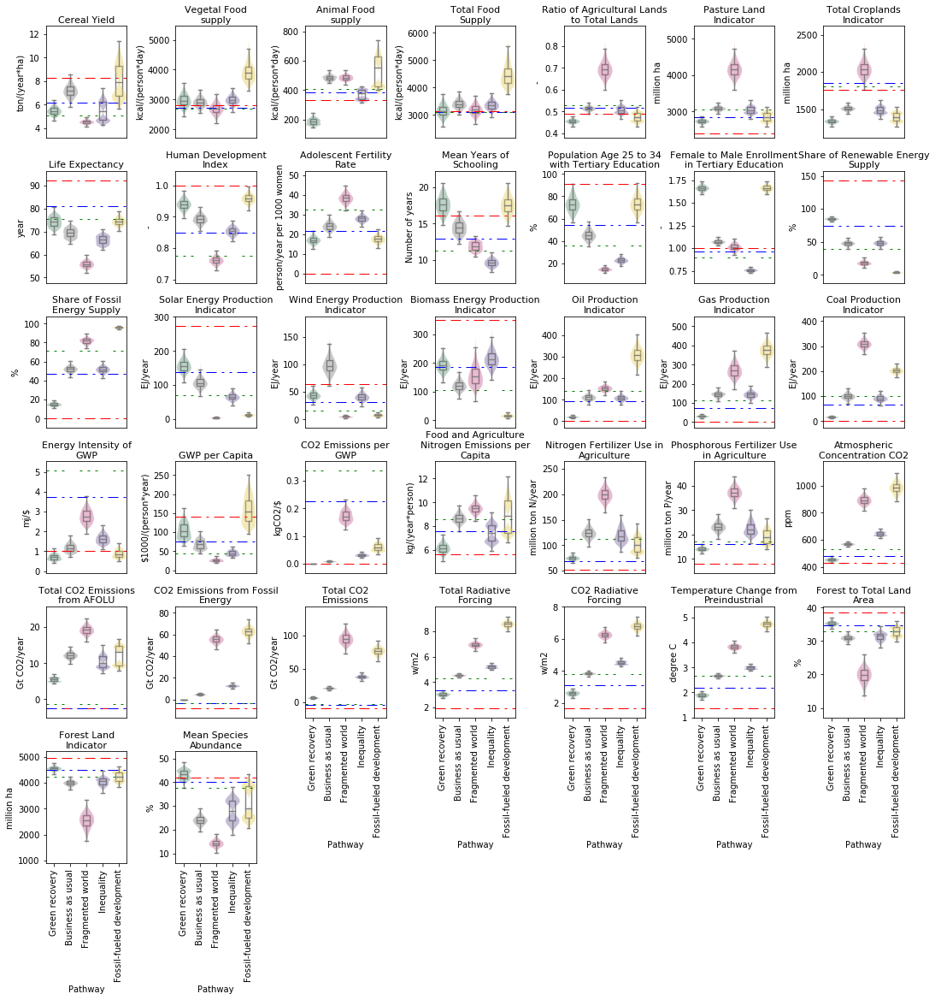

In [176]:
from textwrap import wrap
import math
from adjustText import adjust_text
from matplotlib.lines import Line2D
import matplotlib as mpl
import matplotlib.ticker as mticker
import string

line_style = [([12,6,12,6,3,6], 'r'), ([12,6,3,6,3,6], 'b'), ([3,6,3,6,3,18], 'g')]

# Specify the major indicators for plotting in the main text.
inds_list = ['Vegetal Food supply', 'Animal Food supply',
             'Ratio of Agricultural Lands to Total Lands', 
             'Adolescent Fertility Rate', 
             'Mean Years of Schooling', 
             'Share of Fossil Energy Supply', 'Energy Intensity of GWP', 
             'GWP per Capita', 
             'Nitrogen Fertilizer Use in Agriculture', 
             'CO2 Radiative Forcing', 'Temperature Change from Preindustrial', 
             'Forest to Total Land Area'
            ]
    
# The plots will be in 4 column and a certain number of rows, depending on the number of indicators
fig_rows = 6
fig_cols = 7

fig, axes = plt.subplots(fig_rows, fig_cols, figsize=(18, 18), sharex='col')
fig.subplots_adjust(hspace=0.3, wspace=0.6)

# For iterating betweeing subplots
i = 0
j = 0


for v, var in enumerate(indicator_list): #inds_list
    if j == fig_cols:
        j = 0
        i += 1
    
        
    sns.boxplot(x="Pathway", y=var,data=outcomes_dict_2_f,  width=0.4, linewidth=1.4, ax=axes[i,j],
        palette=['#519872','#797a7e','#d1478c', '#6a51a3', '#fddb3a'], showfliers=False)

    for a,artist in enumerate(axes[i,j].artists):
        # Set the linecolor on the artist to the facecolor, and set the facecolor to None
        col = artist.get_facecolor()
        artist.set_edgecolor('grey')
        artist.set_facecolor('None')

        # Each box has 6 associated Line2D objects (to make the whiskers, fliers, etc.)
        # Loop over them here, and use the same colour as above
        for b in range(a*5,a*5+5):
            line = axes[i,j].lines[b]
            line.set_color('grey')
            line.set_mfc('grey')
            line.set_mec('grey')

    sns.violinplot(x="Pathway", y=var,data=outcomes_dict_2_f, 
                   palette=['#519872','#797a7e','#d1478c', '#6a51a3', '#fddb3a'], 
                   linewidth=0, ax=axes[i,j], scale='width', width=.9)
    for violin, alpha in zip(axes[i,j].collections[::2], [.4, .4, .4, .4, .4]):
        violin.set_alpha(alpha)


    # Set title and y-axis unit
    if len(var) < 20:
        nwrap = 15
    if (len(var) < 30) and (len(var) > 20):
        nwrap=20
    if len(var) > 30:
        nwrap = 27
    axes[i,j].set_title('\n'.join(wrap(var, nwrap)), fontsize=11, pad=4)
    axes[i,j].yaxis.set_label_text(inds_unit[var], fontsize=10)
    axes[i, j].tick_params(axis='x', rotation=90) 
    #axes[i,j].get_legend().remove()

    # Remove the whitespace at the beginning and end of  x and y axes
    axes[i,j].margins(x=.1)
    axes[i,j].margins(y=0.1)
        
    
    # Annotate the target levels
    x_val = []
    y_val = []
    
    for y in range(3):
        targets_value = [targets_2100[var][y]]
        targets_year = [0]
        
        # For indicators where reduction in indicator value is desired
        if targets_2030[var][5] == 'lower is better':
            axes[i,j].axhline(y=targets_value, xmin=0, xmax=1, dashes=line_style[y][0],  lw=1, c=line_style[y][1])
            #axes[i,j].plot(targets_year, targets_value, linestyle="None", marker='v', alpha=1, markersize=4 ,color='black')
        # For indicators where increase in value is desired
        if targets_2030[var][5] == 'higher is better':
            axes[i,j].axhline(y=targets_value, xmin=0, xmax=1, dashes=line_style[y][0],  lw=1, c=line_style[y][1])
    
    j += 1
    
# Removing ticks for inner plots                
for i in range(fig_rows-1):
    for j in range(fig_cols):
        #axes[i, j].tick_params(bottom=False)
        axes[i, j].xaxis.set_visible(False)
        
# Add the x-axis elements to the subplots of the second last row       
for j in [2, 3, 4, 5, 6]:
    axes[5,j].axis('off')
    axes[4, j].xaxis.set_visible(True)
    axes[4, j].tick_params(bottom=True, labelbottom=True)
    

#plt.savefig('{}/SSPs_SDGs_timeseries_maintext_300dpi.png'.format(r'C:/Users/moallemie/GitHub/SSPs_SDGs_Assessment/Fig/'), dpi=300,  bbox_inches='tight') 
#plt.savefig('{}/SSPs_SDGs_timeseries_maintext.png'.format(r'C:/Users/moallemie/GitHub/SSPs_SDGs_Assessment/Fig/'), dpi=600,  bbox_inches='tight') 
#plt.savefig('{}/SSPs_SDGs_timeseries_maintext.pdf'.format(r'C:/Users/moallemie/GitHub/SSPs_SDGs_Assessment/Fig/'), dpi=600,  bbox_inches='tight') 
#plt.savefig('{}/SSPs_SDGs_timeseries_maintext.svg'.format(r'C:/Users/moallemie/GitHub/SSPs_SDGs_Assessment/Fig/'), dpi=600,  bbox_inches='tight') 


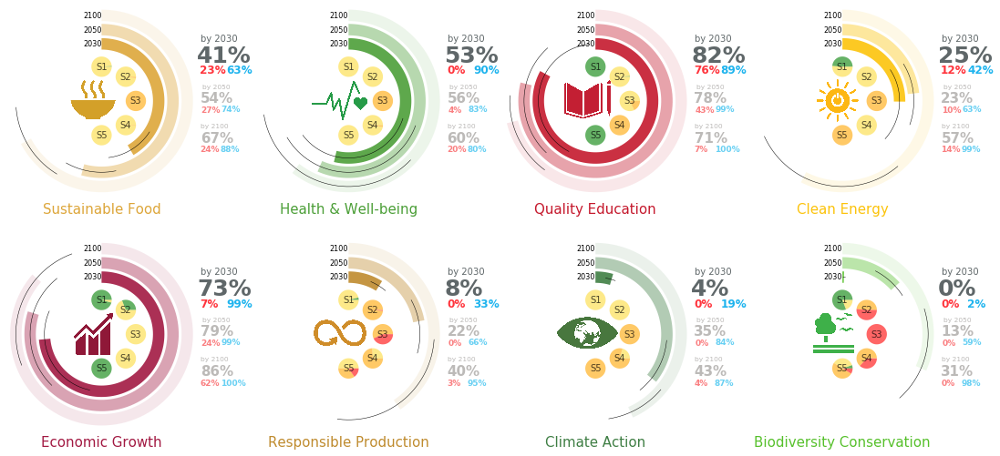

In [17]:
import itertools
import matplotlib as mpl
import matplotlib.image as mpimg
from matplotlib.offsetbox import TextArea, DrawingArea, OffsetImage, AnnotationBbox


# Set the target years, target levels to plot
target_year = {130:'2030', 150:'2050', 200:'2100'}
all_targets = [targets_2030, targets_2050, targets_2100]
target_level = {0: 'A', 1:'M', 2:'W'}

# Separate the indicators (the entire list, not the major indicator) per each SDG
sdg_inds = {}
for i in ['2', '3', '4', '7', '8', '12', '13', '15']:
    sdg_inds[i] = df_ind1[df_ind1.ID.str.startswith(i)]['Target indicator'].to_list() 


# Function for drawing pie chart scatter plot
def draw_pie(dist, 
             xpos, 
             ypos, 
             size,
             alpha,
             ax=None):
    if ax is None:
        fig, ax = plt.subplots(figsize=(10,8))

    # for incremental pie slices
    cumsum = np.cumsum(dist)
    cumsum = cumsum/ cumsum[-1]
    pie = [0] + cumsum.tolist()

    i = 0
    for r1, r2 in zip(pie[:-1], pie[1:]):
        angles = np.linspace(2 * np.pi * r1, 2 * np.pi * r2)
        x = [0] + np.cos(angles).tolist()
        y = [0] + np.sin(angles).tolist()
        xy = np.column_stack([x, y])
        slice_color = {0:'green', 1:'#fddb3a', 2:'orange', 3:'red'} #
        ax.scatter([xpos], [ypos], marker=xy, color=slice_color[i], edgecolors='none', alpha=alpha, s=size) #
        i += 1

    return ax

# Create the figure
fig = plt.figure(figsize=(18.3, 9))
axes = {}
grid = plt.GridSpec(2, 4, hspace=.1, wspace=.3)
for i, j in itertools.product(range(2), range(4)):
    axes[i,j] = fig.add_subplot(grid[i,j], projection='polar')


"""
First, compute the progress at the indicator and goal levels.
"""

# Compute the progress per SSP, per target year, per target level, at the indicator level.
outcomes_norm_dict = {}
for y, year in enumerate(list(target_year.keys())):
    for s, ssp in enumerate(scenarios):
        for t in list(target_level.keys()):
            outcomes_norm = {}
            outcomes_norm[ssp] = pd.DataFrame(columns=indicator_list)
            for i, ind in enumerate(indicator_list):
                out_norm = outcomes[ssp][ind][:, year]
                #For indicators where reduction in indicator value is desired
                if all_targets[y][ind][5] == 'lower is better':
                    outcomes_norm[ssp][ind] = np.where(out_norm > all_targets[y][ind][3],
                                                            -(abs(out_norm - all_targets[y][ind][3])/abs(all_targets[y][ind][t]-all_targets[y][ind][3]))*100, 
                                                            (abs(out_norm - all_targets[y][ind][3])/abs(all_targets[y][ind][t]-all_targets[y][ind][3]))*100)
                #For indicators where increase in indicator value is desired
                if all_targets[y][ind][5] == 'higher is better':
                    outcomes_norm[ssp][ind] = np.where(out_norm < all_targets[y][ind][3],
                                                            -(abs(out_norm - all_targets[y][ind][3])/abs(all_targets[y][ind][t]-all_targets[y][ind][3]))*100, 
                                                            (abs(out_norm - all_targets[y][ind][3])/abs(all_targets[y][ind][t]-all_targets[y][ind][3]))*100)
            # Replace progress higher than 100% with 100 and lower than 0 by zero
            outcomes_norm[ssp][outcomes_norm[ssp] >= 100] = 100
            outcomes_norm[ssp][outcomes_norm[ssp] <= 0] = 0
            # Savel the results in a dictionary to use for plotting the pie charts
            outcomes_norm_dict[(ssp, target_year[year], target_level[t])] = outcomes_norm[ssp]       
            

# Compute the progress per target year, per target level, but across all SSPs.
# Combine the dataframe of per SSPs into one dataframe to be used for cicular horizontal bar charts.
out_norm_all_dict = {}
for y, year in enumerate(list(target_year.keys())):
    for t in list(target_level.keys()):
        out_norm_all = pd.DataFrame(columns=indicator_list)
        for s, ssp in enumerate(scenarios):
            out_norm_all = out_norm_all.append(outcomes_norm_dict[(ssp, target_year[year], target_level[t])])
        out_norm_all_dict[(target_year[year], target_level[t])]= out_norm_all

        
# Identify in each SDG, how many futures meet the ambitious target at different levels (green, yellow, orange, red).
# this will be used for plotting the pie charts
df_count = {}
for group_name in ['green', 'yellow', 'orange', 'red']:
    df_count[group_name] = pd.DataFrame(index=scenarios, columns=list(sdg_names.keys()))

# Count the number of scenarios for differnet types of achivemengts, 
# but only for the target year 2100 (because SSP timeframe is till 2100) and moderate target level.
for s, ssp in enumerate(scenarios):
    out = outcomes_norm_dict[(ssp, '2100', 'M')]
    for g, sdg in enumerate(list(sdg_names.keys())):
        out_sdg = out[sdg_inds[sdg]].sum(axis=1)/len(sdg_inds[sdg])
        df_count['green'].loc[ssp][sdg] = out_sdg[out_sdg >= 100].count()
        df_count['yellow'].loc[ssp][sdg] = out_sdg[(out_sdg < 100) & (out_sdg >= 50)].count()
        df_count['orange'].loc[ssp][sdg] = out_sdg[(out_sdg < 50) & (out_sdg > 0)].count()
        df_count['red'].loc[ssp][sdg] = out_sdg[out_sdg <= 0].count()        

        
"""
Second, I develop circular bar plots with their error bars.
"""

s_list = ['S1', 'S2', 'S3', 'S4', 'S5']
g_list = ['Sustainable Food', 'Health & Well-being', 'Quality Education', 'Clean Energy', 'Economic Growth', 
          'Responsible Production', 'Climate Action', 'Biodiversity Conservation' ]
        
# Compute the mean and error bars in cicular horizontal bar charts 
y_bar = {}
err_bar = {}
range_ssp = {}
for y, year in enumerate(list(target_year.keys())):   
    for g, sdg in enumerate(list(sdg_names.keys())):
        for t in list(target_level.keys()):
            norm_df = out_norm_all_dict[(target_year[year], target_level[t])]
            
            # Compute an arthmatic average of of all indicators related to one SDG and use it as the mean
            sdg_norm = norm_df[sdg_inds[sdg]].sum(axis=1)/len(sdg_inds[sdg])
            
            # The top of the bar chats is the progress for the moderate target level.
            if t == 1:
                y_bar[(target_year[year], sdg_names[sdg])] = np.mean(sdg_norm)*360/100 # convert it to degree for polar projection
            # The min of the error line is the progress towards the ambitious target level.
            if t == 0:
                err_min = np.mean(sdg_norm)*360/100 # convert it to degree for polar projection
            # The max of the error line is the progress towards the weak target level
            if t == 2:
                err_max = np.mean(sdg_norm)*360/100 # convert it to degree for polar projection
        err_bar[(target_year[year], sdg_names[sdg])] = (err_min,err_max)
        
        
            
        # Compute the best-case and worst-case progress for annotation across SSPs. Note that annotation is only for moderate targets
        err_ssp = {}
        for s, ssp in enumerate(scenarios):
            # In each SSP and for moderate target
            norm_df_ssp = outcomes_norm_dict[(ssp, target_year[year], target_level[1])]
            # Compute an arthmatic average of of all indicators related to one SDG and use it as the mean
            sdg_norm_ssp = norm_df_ssp[sdg_inds[sdg]].sum(axis=1)/len(sdg_inds[sdg])
            err_ssp[ssp] = np.mean(sdg_norm_ssp)
        # The worst-case progress is the lowest progress among the SSPs.
        min_ssp = min(err_ssp.values())
        min_ssp_key = min(err_ssp, key=err_ssp.get)
        # The best case progress is the highest progress among the SSPs.
        max_ssp = max(err_ssp.values())
        max_ssp_key = max(err_ssp, key=err_ssp.get)
        range_ssp[(target_level[1], target_year[year], sdg_names[sdg])] = (min_ssp, min_ssp_key, max_ssp, max_ssp_key)

# Draw a light grey ring as the circular axis 
# axes[0,0].barh(3, np.radians(360), color='grey', alpha=.2, height=.3)

i = 0
j = 0
for g, sdg in enumerate(list(sdg_names.keys())):
    
    if g == 4:
        i = 1 # To move to the second row of the figure
        j = 0 # To reset the column number of the subplots
    
    # Plot the progress levels by 2030, 2050, 2100 as cicular horizontal bar charts
    axes[i,j].barh(2, np.radians(y_bar[('2030', sdg_names[sdg])]), color=sdg_colors[sdg], alpha=.9, height=.4) #'#c7b198'
    axes[i,j].barh(2.5, np.radians(y_bar[('2050', sdg_names[sdg])]), color=sdg_colors[sdg], alpha=.4, height=.4) #'#dfd3c3'
    axes[i,j].barh(3, np.radians(y_bar[('2100', sdg_names[sdg])]), color=sdg_colors[sdg], alpha=.1, height=.4) #'#f0ece3'

    # Plot the error lines by 2030, 2050, 2100
    for y, year in enumerate(list(target_year.keys())): 
        theta_err = np.linspace(np.radians(err_bar[(target_year[year], sdg_names[sdg])][0]),  
                                np.radians(err_bar[(target_year[year], sdg_names[sdg])][1]), 1000, endpoint=False)
        r_err = 2+.5*y+0*theta_err
        axes[i,j].plot(theta_err, r_err, lw=.5, color='black') #, marker='.', markevery=(1,998)

        
    """
    Third, I develop scatter pie charts for the SSPs for moderate target level by 2030.
    """
    for s, ssp in enumerate(scenarios):
        green_slice = df_count['green'].loc[ssp][sdg].item()
        yellow_slice = df_count['yellow'].loc[ssp][sdg].item() 
        orange_slice = df_count['orange'].loc[ssp][sdg].item() 
        red_slice = df_count['red'].loc[ssp][sdg].item()
        draw_pie([green_slice,yellow_slice,orange_slice,red_slice],np.radians(360+s*45),1.2,500, 
                 alpha=.6, ax=axes[i,j])
        axes[i,j].text(np.radians(360+s*45),1.2, s_list[s], fontsize=10, color='black', alpha=.7, 
                       fontweight='normal', rotation=0,
                        horizontalalignment='center', verticalalignment='center')


    """
    Fourth, I annotate progress percentage in three target years for moderate target level and format the plot.
    """

    axes[i,j].set_theta_zero_location('N')
    axes[i,j].set_theta_direction(-1)
    axes[i,j].set_rlabel_position(0)
    #axes[i,j].set_thetagrids([0, 90, 180, 270], labels=[0, 25, 50, 75])
    axes[i,j].set_rgrids([2, 2.5, 3], labels=['2030', '2050', '2100'], fontsize=8, ha='right', va='center')
    axes[i,j].spines['polar'].set_visible(False)
    axes[i,j].grid(False)
    axes[i,j].set_thetagrids([], visible=False)
    #axes[i,j].set_rgrids([], visible=False)

    axes[i,j].text(1.05, 4.01, 'by 2030\n', fontsize=10, color='#5f6769', fontweight='normal', rotation=0,
                        horizontalalignment='left', verticalalignment='center')
    # 2030
    # y_bar annotate only moderate target level. range_ssp annotate worst case and best scenaario based on ambitious and weak target. 100/360 multiplier is to convert from polar degree to actual percentage
    axes[i,j].text(1.13, 3.7, str(int(y_bar[('2030', sdg_names[sdg])]*100/360))+'%', fontsize=25, color='#5f6769',fontweight='heavy', rotation=0,
                        horizontalalignment='left', verticalalignment='center')
    axes[i,j].text(1.27, 3.6, str(int(range_ssp[('M','2030', sdg_names[sdg])][0]))+'%', fontsize=12, color='#ff353d',fontweight='heavy', rotation=0,
                        horizontalalignment='left', verticalalignment='center')
    axes[i,j].text(1.33, 4.5, str(int(range_ssp[('M','2030', sdg_names[sdg])][2]))+'%', fontsize=12, color='#1fb4ee',fontweight='heavy', rotation=0,
                        horizontalalignment='left', verticalalignment='center')
    

    # 2050
    axes[i,j].text(1.46, 3.55, 'by 2050\n', fontsize=7.5, color='#bcbab8', fontweight='normal', rotation=0,
                        horizontalalignment='left', verticalalignment='center')
    # y_bar annotate only moderate target level
    axes[i,j].text(1.54, 3.45, str(int(y_bar[('2050', sdg_names[sdg])]*100/360))+'%', fontsize=15, color='#bcbab8', fontweight='heavy', rotation=0,
                        horizontalalignment='left', verticalalignment='center')
    axes[i,j].text(1.66, 3.5, str(int(range_ssp[('M','2050', sdg_names[sdg])][0]))+'%', fontsize=9, color='#fa7f81',fontweight='heavy', rotation=0,
                        horizontalalignment='left', verticalalignment='center')
    axes[i,j].text(1.64, 4.2, str(int(range_ssp[('M','2050', sdg_names[sdg])][2]))+'%', fontsize=9, color='#68d0f3',fontweight='heavy', rotation=0,
                        horizontalalignment='left', verticalalignment='center')

    # 2100
    axes[i,j].text(1.85, 3.6, 'by 2100\n', fontsize=7.5, color='#bcbab8', fontweight='normal', rotation=0,
                        horizontalalignment='left', verticalalignment='center')
    # y_bar annotate only moderate target level
    axes[i,j].text(1.93, 3.69, str(int(y_bar[('2100', sdg_names[sdg])]*100/360))+'%', fontsize=15, color='#bcbab8', fontweight='heavy', rotation=0,
                        horizontalalignment='left', verticalalignment='center')
    axes[i,j].text(2.03, 3.85, str(int(range_ssp[('M','2100', sdg_names[sdg])][0]))+'%', fontsize=9, color='#fa7f81',fontweight='heavy', rotation=0,
                        horizontalalignment='left', verticalalignment='center')
    axes[i,j].text(1.96, 4.50, str(int(range_ssp[('M','2100', sdg_names[sdg])][2]))+'%', fontsize=9, color='#68d0f3',fontweight='heavy', rotation=0,
                        horizontalalignment='left', verticalalignment='center')
    
    
    axes[i,j].text(np.radians(180), 3.8, g_list[g], fontsize=15, color=sdg_colors[sdg], fontweight='normal', 
                   rotation=0, horizontalalignment='center', verticalalignment='center')
    
    # Print the SDG icon
    img_dir = 'C:/Users/moallemie/GitHub/SSPs_SDGs_Assessment/Fig/SDG_icons/'
    img = mpimg.imread(img_dir+str(sdg)+'.png')
    imagebox = OffsetImage(img, zoom=0.03)
    if sdg == '7':
        ab = AnnotationBbox(imagebox, (275, .2), xycoords='data', frameon=False) # the XY in annotation is based on theta (0-360) and r
    else:
        ab = AnnotationBbox(imagebox, (275, .3), xycoords='data', frameon=False) # the XY in annotation is based on theta (0-360) and r
    axes[i,j].add_artist(ab)
    j += 1

#plt.savefig('{}/SSPs_SDGs_sum_maintext_300dpi.png'.format(r'C:/Users/moallemie/GitHub/SSPs_SDGs_Assessment/Fig/'), dpi=300,  bbox_inches='tight') 
#plt.savefig('{}/SSPs_SDGs_sum_maintext.png'.format(r'C:/Users/moallemie/GitHub/SSPs_SDGs_Assessment/Fig/'), dpi=600,  bbox_inches='tight') 
#plt.savefig('{}/SSPs_SDGs_sum_maintext.pdf'.format(r'C:/Users/moallemie/GitHub/SSPs_SDGs_Assessment/Fig/'), dpi=600,  bbox_inches='tight') 
#plt.savefig('{}/SSPs_SDGs_sum_maintext.svg'.format(r'C:/Users/moallemie/GitHub/SSPs_SDGs_Assessment/Fig/'), dpi=600,  bbox_inches='tight') 



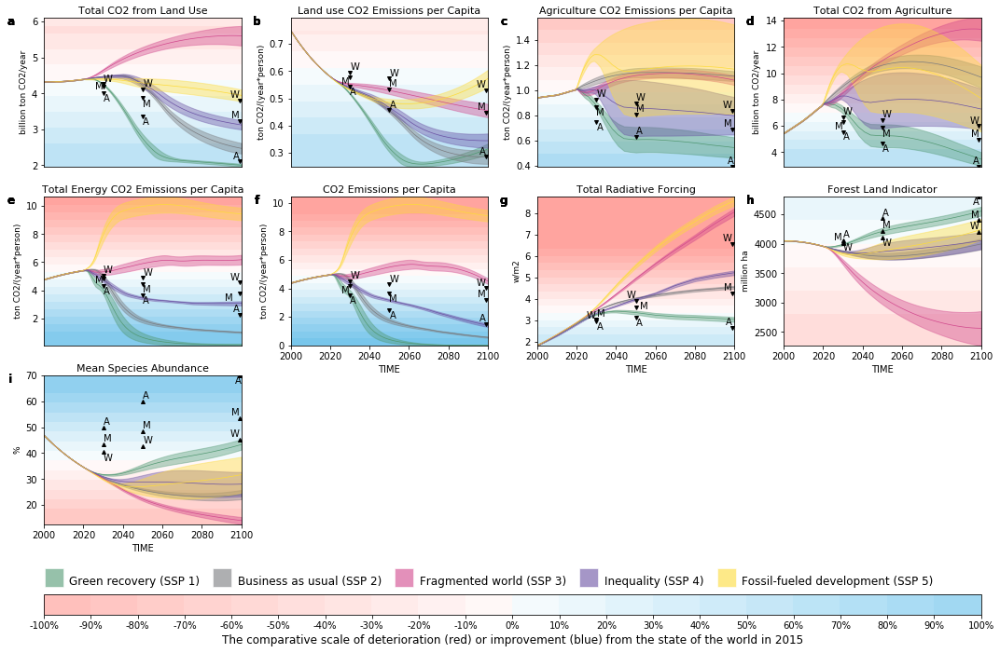

In [9]:
from textwrap import wrap
import math
from adjustText import adjust_text
from matplotlib.lines import Line2D
import matplotlib as mpl
import matplotlib.ticker as mticker
import string


# Class to Change offset in scientific axis label format in y axis in plots
'''class Labeloffset():
    def __init__(self,  ax, label="", axis="y"):
        self.axis = {"y":ax.yaxis, "x":ax.xaxis}[axis]
        self.label=label
        ax.callbacks.connect(axis+'lim_changed', self.update)
        ax.figure.canvas.draw()
        self.update(None)

    def update(self, lim):
        fmt = self.axis.get_major_formatter()
        self.axis.offsetText.set_visible(False)
        ax.set_ylabel(self.label + " "+ fmt.get_offset() , size=9, labelpad=1)'''


inds_list = [ 'Total CO2 from Land Use',
 'Land use CO2 Emissions per Capita',
 'Agriculture CO2 Emissions per Capita',
 'Total CO2 from Agriculture',
 'Total Energy CO2 Emissions per Capita',
 'CO2 Emissions per Capita',
 'Total Radiative Forcing',
 'Forest Land Indicator',
 'Mean Species Abundance']


# Flatten 2D arrays in outcomes[indicator] to 1D array and create a long-format dataframe for plotting the uncertainty
# Why we convert outcomes to long-format dataframe? because it's the accepted format of sns.lineplot which draws uncertainty
outcomes_dict = {}

for i in scenarios:
    outcomes_df = pd.DataFrame(columns=(['TIME']+indicator_list))
    for key in (['TIME']+indicator_list): 
        outcomes_df[key] = outcomes[i][key][:, 100:].ravel() # Plot timeseries data from 2000 (100:)
    outcomes_dict[i] = outcomes_df 
    
# The plots will be in 4 column and a certain number of rows, depending on the number of indicators
fig_rows = 3
fig_cols = 4

fig, axes = plt.subplots(fig_rows, fig_cols, figsize=(18, 10))
fig.subplots_adjust(hspace=0.2, wspace=0.25)

# For iterating betweeing subplots
i = 0
j = 0


for v, var in enumerate(inds_list):
    if j == fig_cols:
        j = 0
        i += 1
        
    for s, sc in enumerate(scenarios):
        ax = sns.lineplot(x='TIME', y=var, ci='sd', data=outcomes_dict[sc], 
                     ax=axes[i,j], marker='', color=sc_colors[sc], lw=.7,
                     err_kws={'alpha':.4})
        ax.set_title(var, fontsize=11, pad=4)
        ax.yaxis.set_label_text(inds_unit[var], fontsize=9)
        
        # Add all subplot labels
        fig_label = list(string.ascii_lowercase)    
        ax.text(-.17, .97, fig_label[v], fontsize=12, fontweight='semibold', rotation=0,
                            horizontalalignment='center', verticalalignment='center', transform=ax.transAxes)
        
     
   
    # Remove the whitespace at the beginning and end of  x and y axes
    axes[i,j].margins(x=0)
    axes[i,j].margins(y=0)

    # Annotate the target levels
    x_val = []
    y_val = []
    for y in range(3):
        targets_value = [targets_2030[var][y], targets_2050[var][y], targets_2100[var][y]]
        targets_year = [2030, 2050, 2099]
        
        # For indicators where reduction in indicator value is desired
        if targets_2030[var][0] < targets_2030[var][3]:
            axes[i,j].plot(targets_year, targets_value, linestyle="None", marker='v', alpha=1, markersize=4 ,color='black')
        # For indicators where increase in value is desired
        if targets_2030[var][0] > targets_2030[var][3]:
            axes[i,j].plot(targets_year, targets_value, linestyle="None", marker='^', alpha=1, markersize=4 ,color='black')



        x_val = x_val + targets_year
        y_val = y_val + targets_value
        
    text = ['A', 'A', 'A', 'M', 'M', 'M', 'W', 'W', 'W']        
    texts = []
    for x, y, s in zip(x_val, y_val, text):
        texts.append(axes[i,j].text(x, y, s))
    adjust_text(texts, ax= axes[i,j],  only_move={'points':'xy', 'texts':'xy'}, force_text=(.5, .1), 
                force_points=(0.5, 0.1))
    
    '''# To correct the formarting of the y-axis to appear with scietific format
    formatter = mticker.ScalarFormatter(useMathText=True)
    formatter.set_powerlimits((-2,3))
    axes[i,j].yaxis.set_major_formatter(formatter)
    axes[i,j].set_title(var, fontsize=11, pad=4)
    lo = Labeloffset(axes[i,j], label=inds_unit[var], axis="y")'''


    j += 1

# Removing ticks for inner plots                
for i in range(fig_rows-1):
    for j in range(fig_cols):
        axes[i, j].tick_params(bottom=False, labelbottom=False)
        axes[i, j].set_xlabel('')

# Draw the shaded increment boxes in the background of each subplot
i = 0
j = 0
for v, var in enumerate(inds_list): 
    if var in indicator_list:
        if j == fig_cols:
            j = 0
            i += 1
        
        # Create 10% improvement (increase or decrease) increment from the worst value threshold.
        improv_incr = targets_2030[var][3]*.1
        
        # Get the min and max of each subplot
        y_min = axes[i,j].get_ylim()[0]
        y_max = axes[i,j].get_ylim()[1]
        
        # For indicators where reduction in indicator value is desired
        if targets_2030[var][0] < targets_2030[var][3]:
            
            # Color the increment steps up to 10 steps with blue
            for c in range(10):
                if (targets_2030[var][3]-improv_incr*(c+1)) > y_min:
                    axes[i,j].axhspan(targets_2030[var][3]-improv_incr*(c+1), targets_2030[var][3]-improv_incr*(c), 
                                      facecolor='#46b3e6', alpha=0.05+(0.015*c), zorder=-100)
                    axes[i,j].axhspan(y_min, targets_2030[var][3]-improv_incr*(c+1), facecolor='#46b3e6', 
                                      alpha=0.05+(0.015*c), zorder=-100)
                else:
                    if c == 0:
                        axes[i,j].axhspan(y_min, targets_2030[var][3]-improv_incr*(c), facecolor='#46b3e6', 
                                          alpha=0.05+(0.015*c), zorder=-100)
            # Color the increment steps up to 10 steps with red
            for c in range(10):
                if (targets_2030[var][3]+improv_incr*c) < y_max:
                    axes[i,j].axhspan(targets_2030[var][3]+improv_incr*c, targets_2030[var][3]+improv_incr*(c+1), 
                                      facecolor='#ff847c', alpha=0.05+(0.015*c), zorder=-100)
                    axes[i,j].axhspan(targets_2030[var][3]+improv_incr*(c+1), y_max, facecolor='#ff847c', 
                                      alpha=0.05+(0.015*c), zorder=-100)
                else:
                    if c == 0:  
                        axes[i,j].axhspan(targets_2030[var][3]+improv_incr*(c), y_max, facecolor='#ff847c', 
                                          alpha=0.05+(0.015*c), zorder=-100)
                        
        # For indicators where increase in value is desired
        if targets_2030[var][0] > targets_2030[var][3]:  
            
            # Color the increment steps up to 10 steps with blue
            for c in range(10):
                if (targets_2030[var][3]+improv_incr*(c+1)) < y_max:
                    axes[i,j].axhspan(targets_2030[var][3]+improv_incr*c, targets_2030[var][3]+improv_incr*(c+1), 
                                      facecolor='#46b3e6', alpha=0.05+(0.015*c), zorder=-100)
                    axes[i,j].axhspan(targets_2030[var][3]+improv_incr*(c+1), y_max, facecolor='#46b3e6', 
                                      alpha=0.05+(0.015*c), zorder=-100)
                else:
                    if c == 0:
                        axes[i,j].axhspan(targets_2030[var][3]+improv_incr*(c), y_max, facecolor='#46b3e6', 
                                          alpha=0.05+(0.015*c), zorder=-100)
            
            # Color the increment steps up to 10 steps with red
            for c in range(10):
                if (targets_2030[var][3]-improv_incr*(c+1)) > y_min:
                    axes[i,j].axhspan(targets_2030[var][3]-improv_incr*(c+1), targets_2030[var][3]-improv_incr*c, 
                                      facecolor='#ff847c', alpha=0.05+(0.015*c), zorder=-100)
                    axes[i,j].axhspan(y_min, targets_2030[var][3]-improv_incr*(c+1), facecolor='#ff847c', 
                                      alpha=0.05+(0.015*c), zorder=-100)
                else:
                    if c == 0:
                        axes[i,j].axhspan(y_min, targets_2030[var][3]-improv_incr*(c), facecolor='#ff847c', 
                                          alpha=0.05+(0.015*c), zorder=-100)
        
        j += 1 
        
'''
# Annotate the regions/world data for comparison with the model projection.
i = 0
j = 0
for v, var in enumerate(sdg_inds['2']+sdg_inds['3']+sdg_inds['4']+sdg_inds['7']+sdg_inds['8']):
    if var in indicator_list:
        if j == fig_cols:
            j = 0
            i += 1
        if var in df_ind1['Target indicator'].to_list():
            var_indx = df_hist.index[df_hist['Target indicator'] == var]
            #data_region = [df_hist['World/region/country'].loc[var_indx].item()]
            data_year = [df_hist['Data reference year'].loc[var_indx].item()]
            data_value = [df_hist['Data reference value'].loc[var_indx].item()]
            axes[i,j].plot(data_year, data_value, linestyle="None", marker='^', alpha=0.5, markersize=10,  
                           markeredgecolor='#ffdd00',color='#f75f00')
            axes[i,j].annotate(df_hist['Scale'].loc[var_indx].item(), (data_year[0], data_value[0]))
        j += 1

'''
for j in [1, 2, 3]:
    axes[2,j].axis('off')
    axes[1, j].tick_params(bottom=True, labelbottom=True)
    axes[1, j].set_xlabel('TIME')

# Create legend for the SSPs
legend_elements_2 = []


for i in scenarios:
    legend_elements_2.append(Line2D([0], [0], marker="s", color='none', label=ssp_names[i], 
                                  markersize=20, markeredgecolor='white', markerfacecolor=sc_colors[i], alpha=.6))

fig.legend(handles=legend_elements_2, loc='upper left', bbox_to_anchor=(.12, .02, .4, .05), frameon=False, 
           bbox_transform=fig.transFigure, ncol=20, 
           handlelength=1, columnspacing=1.5, handletextpad=.9, labelspacing=.01, fontsize=12, handleheight=2.4)

# Create the colorbar for background gradients

# First, create a list of our values for colorbar
vals = list(range(-100, 101, 10))
vals = [x/100 for x in vals]
vals_text = ["{0:.0%}".format(x) for x in vals]

# Second, create the colour names with a function

def alpha_blending(hex_color, alpha) :
    """ alpha blending as if on the white background.
    """
    foreground_tuple  = mpl.colors.hex2color(hex_color)
    foreground_arr = np.array(foreground_tuple)
    final = tuple( (1. -  alpha) + foreground_arr*alpha )
    return(final)

colorbar_list = []
for i in range(10):
    colorbar_list.append(alpha_blending('#ff847c', 0.06+(0.05*i)))
colorbar_list = colorbar_list[::-1]
for i in range(10):
    colorbar_list.append(alpha_blending('#46b3e6', 0.06+(0.05*i)))
    

# Third, create a ListedColormap object, which contains the information of the colours we want to display in our colourbar
cmap = mpl.colors.ListedColormap(colorbar_list)

# Fourth, set the colormap index for discrete color bar
norm = mpl.colors.BoundaryNorm(vals, cmap.N)

# Fifth, create the colorbar
ax2 = fig.add_axes([0.95, 0.1, 0.03, 0.7])

cb = mpl.colorbar.ColorbarBase(ax2, cmap=cmap,
                                norm=norm,
                                spacing='uniform',
                                orientation='horizontal',
                                extend='neither',
                                ticks=vals)
cb.set_ticklabels(vals_text)


cb.set_label('The comparative scale of deterioration (red) or improvement (blue) from the state of the world in 2015', fontsize=12)
ax2.set_position((0.125, -.01, 0.775, 0.03))

#plt.savefig('{}/SSPs_SDGs_timeseries_SI2_300dpi.png'.format(r'C:/Users/moallemie/GitHub/SSPs_SDGs_Assessment/Fig/'), dpi=300,  bbox_inches='tight') 
#plt.savefig('{}/SSPs_SDGs_timeseries_SI2.png'.format(r'C:/Users/moallemie/GitHub/SSPs_SDGs_Assessment/Fig/'), dpi=600,  bbox_inches='tight') 
#plt.savefig('{}/SSPs_SDGs_timeseries_SI2.pdf'.format(r'C:/Users/moallemie/GitHub/SSPs_SDGs_Assessment/Fig/'), dpi=600,  bbox_inches='tight') 
#plt.savefig('{}/SSPs_SDGs_timeseries_SI2.svg'.format(r'C:/Users/moallemie/GitHub/SSPs_SDGs_Assessment/Fig/'), dpi=600,  bbox_inches='tight') 


C:\ProgramData\Anaconda3\envs\python37\lib\site-packages\ipykernel_launcher.py:82: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


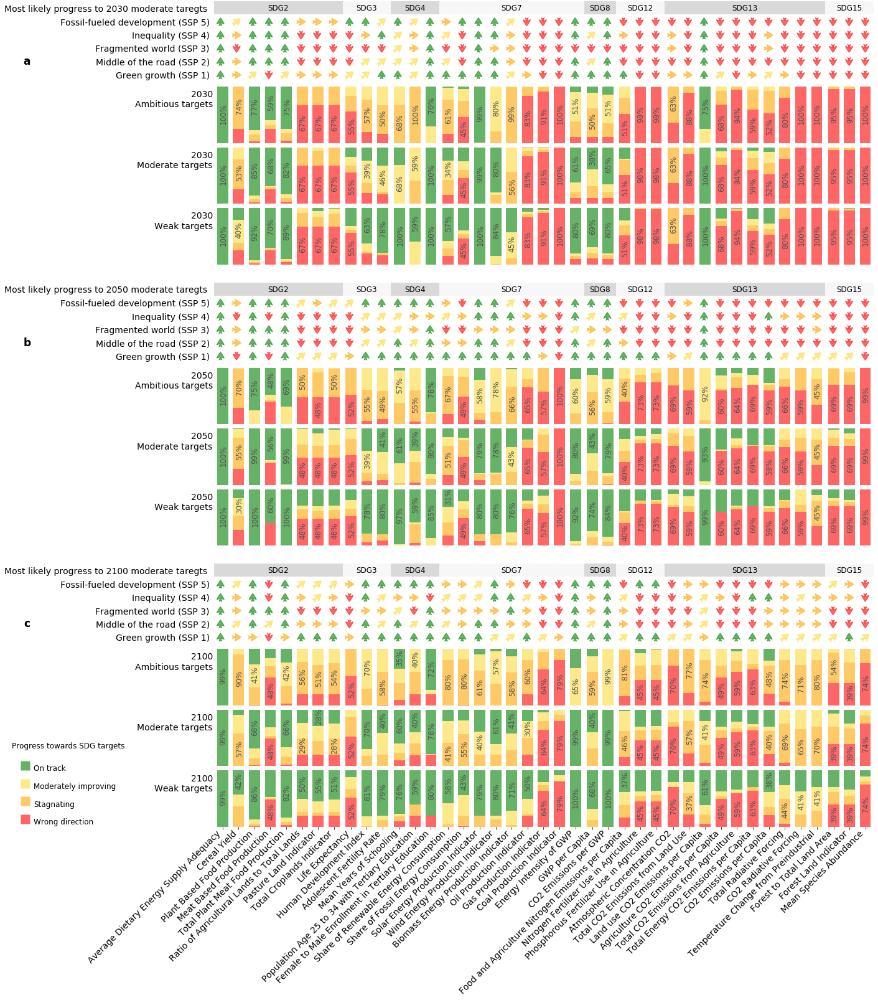

In [93]:
# Same figure to the previous one, but just a different layout

import matplotlib.patches as patches
from matplotlib.path import Path
from matplotlib.patches import BoxStyle

# this class expands any textboxes to the width size of the subplot. We used it for drawing the SDG boxes on the top
class ExtendedTextBox(BoxStyle._Base):
    """
    An Extended Text Box that expands to the axes limits 
                        if set in the middle of the axes
    """

    def __init__(self, pad=0.3, width=500.):
        """
        width: 
            width of the textbox. 
            Use `ax.get_window_extent().width` 
                   to get the width of the axes.
        pad: 
            amount of padding (in vertical direction only)
        """
        self.width=width
        self.pad = pad
        super(ExtendedTextBox, self).__init__()

    def transmute(self, x0, y0, width, height, mutation_size):
        """
        x0 and y0 are the lower left corner of original text box
        They are set automatically by matplotlib
        """
        # padding
        pad = mutation_size * self.pad

        # we add the padding only to the box height
        height = height + 2.*pad
        # boundary of the padded box
        y0 = y0 - pad
        y1 = y0 + height
        _x0 = x0
        x0 = _x0 +width /2. - self.width/2.
        x1 = _x0 +width /2. + self.width/2.

        cp = [(x0, y0),
              (x1, y0), (x1, y1), (x0, y1),
              (x0, y0)]

        com = [Path.MOVETO,
               Path.LINETO, Path.LINETO, Path.LINETO,
               Path.CLOSEPOLY]

        path = Path(cp, com)

        return path

dpi = 300

# register the custom style
BoxStyle._style_list["ext"] = ExtendedTextBox


target_year = {130:'2030', 150:'2050', 200:'2100'}
all_targets = [targets_2030, targets_2050, targets_2100]

# Separate the indicators (the entire list, not the major indicator) per each SDG
sdg_inds = {}
for i in ['2', '3', '4', '7', '8', '12', '13', '15']:
    sdg_inds[i] = df_ind1[df_ind1.ID.str.startswith(i)]['Target indicator'].to_list() 

#Set the width ratio of subplots
width_ratios = [8,3,3,9,2,3,10,3]
fig = plt.figure(figsize=(19, 24))

grid = plt.GridSpec(14, 8, hspace=0.08, wspace=0, width_ratios= width_ratios, height_ratios= [1.2,1,1,1,.4,1.2,1,1,1,.4,1.2,1,1,1])


# We used GridSpec for creating subplots with shared axis because we have the SSP arrows subplot on the top of other subplots with differnet ratio.
axes = {}
axes_arr = {}
for y, year in enumerate([130,150,200]):
    for r in range(1,4):
        axes[r+y*5,0] = fig.add_subplot(grid[r+y*5, 0])
    for c in range(8):
        axes[3+y*5,c] = fig.add_subplot(grid[3+y*5, c])
    for r in range(1,3):
        for c in range(1,8):
            axes[r+y*5,c] = fig.add_subplot(grid[r+y*5, c], sharex=axes[3+y*5,c], sharey=axes[r+y*5,0])

    #Create a dictionary of dataframes for the normalised value of outcomes in year 2030 
    #in different scenarios based on aambitious, moderate, and weak targets.
    for t in [0,1,2]:
        outcomes_norm = {}
        for s, scenario in enumerate(scenarios):
            outcomes_norm[scenario] = pd.DataFrame(columns=indicator_list)
            for i, ind in enumerate(indicator_list):
                out_norm = outcomes[scenario][ind][:, year]
                #For indicators where reduction in indicator value is desired
                if all_targets[y][ind][t] < all_targets[y][ind][3]:
                    outcomes_norm[scenario][ind] = np.where(out_norm > all_targets[y][ind][3],
                                                            -(abs(out_norm - all_targets[y][ind][3])/abs(all_targets[y][ind][t]-all_targets[y][ind][3]))*100, 
                                                            (abs(out_norm - all_targets[y][ind][3])/abs(all_targets[y][ind][t]-all_targets[y][ind][3]))*100)
                #For indicators where increase in indicator value is desired
                if all_targets[y][ind][t] > all_targets[y][ind][3]:
                    outcomes_norm[scenario][ind] = np.where(out_norm < all_targets[y][ind][3],
                                                            -(abs(out_norm - all_targets[y][ind][3])/abs(all_targets[y][ind][t]-all_targets[y][ind][3]))*100, 
                                                            (abs(out_norm - all_targets[y][ind][3])/abs(all_targets[y][ind][t]-all_targets[y][ind][3]))*100)

        # Identify in each indicators, how many futures meet the ambitious target at different levels (green, yellow, orange, red).
        df_count = {}
        df_sum = {}

        for group_name in ['green', 'yellow', 'orange', 'red']:
            df_count[group_name] = pd.DataFrame(index=scenarios, columns=indicator_list)
            df_sum[group_name] = pd.DataFrame(columns=indicator_list)

        # Count scenarios for differnet levels of achivemengts.
        for s, sc in enumerate(scenarios):
            for i, ind in enumerate(indicator_list):
                df_count['green'].loc[sc][ind] = outcomes_norm[sc][outcomes_norm[sc][ind] >= 100].count()[ind]
                df_count['yellow'].loc[sc][ind] = outcomes_norm[sc][(outcomes_norm[sc][ind] < 100) & (outcomes_norm[sc][ind] >= 50)].count()[ind]
                df_count['orange'].loc[sc][ind] = outcomes_norm[sc][(outcomes_norm[sc][ind] < 50) & (outcomes_norm[sc][ind] > 0)].count()[ind]
                df_count['red'].loc[sc][ind] = outcomes_norm[sc][outcomes_norm[sc][ind] <= 0].count()[ind]

        # Combine the count of scenarios across the SSPs.
        for i, ind in enumerate(indicator_list):
            for group_name in ['green', 'yellow','orange', 'red']:
                df_sum[group_name][ind] = [df_count[group_name][ind].sum()]



         # Develop the stacked bar charts.
        for g, sdg in enumerate(['2','3', '4', '7', '8', '12','13', '15']): #
            x = sdg_inds[sdg]
            y_green = []
            y_red = []
            y_yellow = []
            y_orange = []
            for i, ind in enumerate(sdg_inds[sdg]):
                y_green.append(df_sum['green'][ind][0])
                y_yellow.append(df_sum['yellow'][ind][0])
                y_orange.append(df_sum['orange'][ind][0])
                y_red.append(df_sum['red'][ind][0])

            # Set the y position of each bar to start from
            bottom_yellow = [sum(x) for x in zip(y_red, y_orange)]
            bottom_green = [sum(x) for x in zip(y_red, y_yellow, y_orange)]
            axes[t+1+y*5, g].bar(x, y_red, width=.7, color='red', bottom=0, alpha=.6) # red
            axes[t+1+y*5, g].bar(x, y_orange, bottom=y_red, width=.7, color='orange', alpha=.6) # orange
            axes[t+1+y*5, g].bar(x, y_yellow, bottom=bottom_yellow, width=.7, color='#fddb3a', alpha=.6) # yellow
            axes[t+1+y*5, g].bar(x, y_green, bottom=bottom_green, width=.7, color='green',alpha=.6) # green



            # Get the y position of the bottom of each bar (stacked on the top of another)
            h = []
            for p in axes[t+1+y*5, g].patches:
                b = p.get_bbox()
                h.append(b.y0)

            # The iteration annotates all red bars at the bottom first and then all orange bars on the the top of red bars, and so on.
            bar_annot = []
            for p, pa in enumerate(axes[t+1+y*5, g].patches):      
                #if pa.get_height() > 1000: # Only annotate bars with enough height for annotation
                    # Convert the bar height to a percentage of total scenarios
                bar_annot.append((pa.get_height()/(number_sc*5))*100)

            bar_annot_inmax = []
            for p in range(len(sdg_inds[sdg])):
                # Create a list of percentage achivements per each indicator 
                bar_annot_list = [bar_annot[p], bar_annot[p+len(sdg_inds[sdg])],bar_annot[p+len(sdg_inds[sdg])*2],
                                  bar_annot[p+len(sdg_inds[sdg])*3]]
                # Find the index of the level of achivement with highest percentage for annotation per each indicator
                index_max = max(range(len(bar_annot_list)), key=bar_annot_list.__getitem__)
                bar_annot_inmax.append(p+len(sdg_inds[sdg])*index_max) # 4 is the number for levels achivements.

            for p, pa in enumerate(axes[t+1+y*5, g].patches):
                #if (bar_annot[p] > bar_annot[p+len(sdg_inds[sdg])])
                if p in bar_annot_inmax:
                    axes[t+1+y*5, g].annotate(str(int((pa.get_height()/(number_sc*5))*100))+'%', (pa.get_x()+pa.get_width()/2., pa.get_height()/2+h[p]), 
                                     ha='center', va='center', rotation=90, xytext=(1, 2),textcoords='offset points', 
                                          fontsize=12, fontweight='normal',color='#525252')

            # Remove all ticks and spines
            [s.set_visible(False) for s in axes[t+1+y*5, g].spines.values()]
            [t.set_visible(False) for t in axes[t+1+y*5, g].get_yticklines()]
            [t.set_visible(False) for t in axes[t+1+y*5, g].get_xticklines()]
            [l.set_visible(False) for l in axes[t+1+y*5, g].get_yticklabels()]

            # Change the x axis label font size and rotate the label
            #axes[t+1+y*5, g].tick_params(axis='x', rotation=90, labelsize=13)
            
            if (t == 2) and (y == 2):
                axes[t+1+y*5, g].set_xticklabels(sdg_inds[sdg], fontsize=14, rotation=45, ha='right')
                axes[t+1+y*5, g].tick_params(axis='x', pad=0)
                axes[t+1+y*5, g].xaxis.tick_bottom()
            else:
                axes[t+1+y*5, g].tick_params(labelbottom=False)
                
                

            # Reduce the x margines in plots. The margines should be proportional to the width ratio of the subplot.
            axes[t+1+y*5, g].margins(x=.2/width_ratios[g], y=0)
            
            facecolor = {'2':'#d9d9d9','3':'#f7f7f7', '4':'#d9d9d9', '7':'#f7f7f7', '8':'#d9d9d9', 
                         '12':'#f7f7f7','13':'#d9d9d9', '15':'#f7f7f7'}
            
            if t == 0: # only use titles for the subplot for the ambitious level targets. 
                title = axes[t+1+y*5, g].set_title(sdg_names[sdg], size=12, pad=122, 
                                                      bbox=dict(facecolor=facecolor[sdg], edgecolor='none'), color='black')
                # set the box style of the xlabel text box toour custom box
                bb = title.get_bbox_patch()
                # use the axes' width as width of the text box
                bb.set_boxstyle("ext", pad=0.4, width=axes[t+1+y*5, g].get_window_extent().width )

    
    
        # Now we develop the SSP arrow scatter plot on the top of stacked bar charts.
        # Here we want to show if the world unfolds according to each SSP, what would be the most likely level of target achivement.
        #Note that that it's 'the most likely' level of achivement that has the maximum scenarios in the respective SSP. Therefore, that SSP can also lead to other achivement level, but the number of scenarios is smaller. 
        if t == 1: # Only draw arrows for the ambitious level of achivemengt.
            arrow_color = {0:'green', 1:'#fddb3a', 2:'orange', 3:'red'} # Here define the arrow colour
            ssp_ind = {}
            for s, sc in enumerate(scenarios):
                for ind, indx in enumerate(indicator_list):
                    ssp_char = []
                    for group_name in ['green', 'yellow','orange', 'red']:
                        ssp_char.append(df_count[group_name].loc[sc][indx])
                        maxind = max(range(len(ssp_char)), key=ssp_char.__getitem__)
                        ssp_ind[(sc,indx)] = arrow_color[maxind]

            # Create an empty scatterplot with indicators in x axis and SSPs in y axis to use for annotaing arrows. Both indictors and arrows are represneted by indicative numbers to assit the positionning of arrows.
            axes_arr[y] = fig.add_subplot(grid[y*5, :])
            sc_list = [[0,1,2,3,4]]*len(indicator_list)
            for xe, ye in zip ([i for i in range(len(indicator_list))], sc_list):
                axes_arr[y].scatter([xe] * len(ye), ye, color='')



            for s, sc in enumerate(scenarios):
                for ind, indx in enumerate(indicator_list):
                    if ssp_ind[(sc,indx)] == arrow_color[0]: # green color
                        axes_arr[y].annotate("",xy=(ind, s+.4), xycoords='data', xytext=(ind, s-.4), textcoords='data',
                                    arrowprops=dict(arrowstyle="fancy,head_length=1,head_width=1.2,tail_width=.5",
                                                    connectionstyle="arc3", color=ssp_ind[(sc,indx)], alpha=.6))
                    if ssp_ind[(sc,indx)] == arrow_color[1]: # yellow color
                        axes_arr[y].annotate("",xy=(ind+.3, s+.3), xycoords='data', xytext=(ind-.3, s-.3), textcoords='data',
                                    arrowprops=dict(arrowstyle="fancy,head_length=1,head_width=1.2,tail_width=.5",
                                                    connectionstyle="arc3", color=ssp_ind[(sc,indx)], alpha=.6))
                    if ssp_ind[(sc,indx)] == arrow_color[2]: # orange color
                        axes_arr[y].annotate("",xy=(ind+.35, s), xycoords='data', xytext=(ind-.35, s), textcoords='data',
                                    arrowprops=dict(arrowstyle="fancy,head_length=1,head_width=1.2,tail_width=.5",
                                                    connectionstyle="arc3", color=ssp_ind[(sc,indx)], alpha=.6))
                    if ssp_ind[(sc,indx)] == arrow_color[3]: # red color
                        axes_arr[y].annotate("",xy=(ind, s-.4), xycoords='data', xytext=(ind, s+.4), textcoords='data',
                                    arrowprops=dict(arrowstyle="fancy,head_length=1,head_width=1.2,tail_width=.5",
                                                    connectionstyle="arc3", color=ssp_ind[(sc,indx)], alpha=.6))
            axes_arr[y].set_yticks(np.arange(len(scenarios)))
            axes_arr[y].set_yticklabels(['Green recovery (SSP 1)', 'Business as usual (SSP 2)', 
                                             'Fragmented world (SSP 3)', 'Inequality (SSP 4)', 
                                             'Fossil-fueled development (SSP 5)'], fontsize=14, ha='right')
            axes_arr[y].set_title('Most likely progress to '+target_year[year]+' moderate taregts', loc='left', ha='right', 
                                  size=14, pad=5, position=(-.0098, 1))
            axes_arr[y].margins(y=.1) 
            axes_arr[y].margins(x=0.01)
            #axes_arr[y].set_facecolor('#f0f0f0')


            # Remove all ticks and spines
            [s.set_visible(False) for s in axes_arr[y].spines.values()]
            [t.set_visible(False) for t in axes_arr[y].get_xticklines()]
            [t.set_visible(False) for t in axes_arr[y].get_yticklines()]
            [l.set_visible(False) for l in axes_arr[y].get_xticklabels()]


    # Set y-axis label to annoate the achivement levels
    target_label = {1:'2030\nAmbitious targets', 2:'2030\nModerate targets', 3:'2030\nWeak targets',
                    4:'2050\nAmbitious targets', 5:'2050\nModerate targets', 6:'2050\nWeak targets', 
                    7:'2100\nAmbitious targets', 8:'2100\nModerate targets', 9:'2100\nWeak targets'}
    for r in range(1,4):
        axes[r+y*5,0].set_ylabel(target_label[r+y*3], size=14, labelpad=2, rotation='horizontal', ha='right', position=(-0,.6))


# Create legend
legend_elements = []

legend_colors = ['green', '#fddb3a', 'orange', 'red']
legend_labels = ['On track', 'Moderately improving', 'Stagnating', 'Wrong direction']

for i in range(4):
    legend_elements.append(Line2D([0], [0], marker="s", color='none', label=legend_labels[i], 
                                  markersize=15, markeredgecolor='none', markerfacecolor=legend_colors[i], alpha=0.6))
    
fig.legend(handles=legend_elements, loc='upper left', bbox_to_anchor=(-.12, .16, .5, .05), frameon=False, 
           bbox_transform=fig.transFigure, ncol=1, title="Progress towards SDG targets\n", title_fontsize='large',
           handlelength=1, columnspacing=1, handletextpad=.7, labelspacing=.01, fontsize=12, handleheight=3.3)
 
        
        
# Add all subplot labels
axes_arr[0].text(-12, 1, 'a', fontsize=17, fontweight='heavy', rotation=0,
                    horizontalalignment='center', verticalalignment='center')
axes_arr[1].text(-12, 1, 'b', fontsize=17, fontweight='heavy', rotation=0,
                    horizontalalignment='center', verticalalignment='center')
axes_arr[2].text(-12, 1, 'c', fontsize=17, fontweight='heavy', rotation=0,
                    horizontalalignment='center', verticalalignment='center')

#plt.savefig('{}/SSPs_SDGs_boxarrows_SI.pdf'.format(r'C:/Users/moallemie/GitHub/SSPs_SDGs_Assessment/Fig/'), dpi=600,  bbox_inches='tight') 


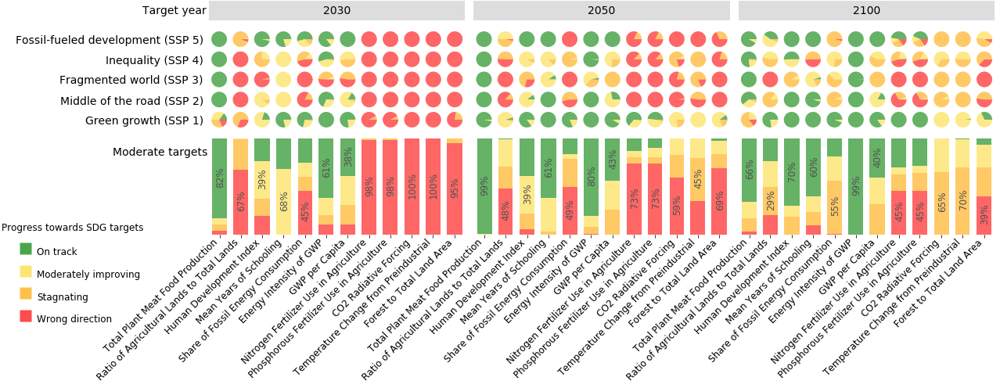

In [99]:
import matplotlib.patches as patches
from matplotlib.path import Path
from matplotlib.patches import BoxStyle
from matplotlib.lines import Line2D


# this class expands any textboxes to the width size of the subplot. We used it for drawing the SDG boxes on the top
class ExtendedTextBox(BoxStyle._Base):
    """
    An Extended Text Box that expands to the axes limits 
                        if set in the middle of the axes
    """

    def __init__(self, pad=0.3, width=500.):
        """
        width: 
            width of the textbox. 
            Use `ax.get_window_extent().width` 
                   to get the width of the axes.
        pad: 
            amount of padding (in vertical direction only)
        """
        self.width=width
        self.pad = pad
        super(ExtendedTextBox, self).__init__()

    def transmute(self, x0, y0, width, height, mutation_size):
        """
        x0 and y0 are the lower left corner of original text box
        They are set automatically by matplotlib
        """
        # padding
        pad = mutation_size * self.pad

        # we add the padding only to the box height
        height = height + 2.*pad
        # boundary of the padded box
        y0 = y0 - pad
        y1 = y0 + height
        _x0 = x0
        x0 = _x0 +width /2. - self.width/2.
        x1 = _x0 +width /2. + self.width/2.

        cp = [(x0, y0),
              (x1, y0), (x1, y1), (x0, y1),
              (x0, y0)]

        com = [Path.MOVETO,
               Path.LINETO, Path.LINETO, Path.LINETO,
               Path.CLOSEPOLY]

        path = Path(cp, com)

        return path


# Function for drawing pie chart scatter plot
def draw_pie(dist, 
             xpos, 
             ypos, 
             size,
             alpha,zorder,
             ax=None):
    if ax is None:
        fig, ax = plt.subplots(figsize=(10,8))

    # for incremental pie slices
    cumsum = np.cumsum(dist)
    cumsum = cumsum/ cumsum[-1]
    pie = [0] + cumsum.tolist()

    i = 0
    for r1, r2 in zip(pie[:-1], pie[1:]):
        angles = np.linspace(2 * np.pi * r1, 2 * np.pi * r2)
        x = [0] + np.cos(angles).tolist()
        y = [0] + np.sin(angles).tolist()
        xy = np.column_stack([x, y])
        slice_color = {0:'green', 1:'#fddb3a', 2:'orange', 3:'red'} #
        ax.scatter([xpos], [ypos], marker=xy, color=slice_color[i], edgecolors='none', alpha=alpha, s=size, zorder=zorder) #
        i += 1

    return ax

    
    
dpi = 300

# register the custom style
BoxStyle._style_list["ext"] = ExtendedTextBox


target_year = {130:'2030', 150:'2050', 200:'2100'}
all_targets = [targets_2030, targets_2050, targets_2100]


# Create grids and axes
# First, set the width ratio of subplots
width_ratios = [2,1,1,2,1,2,2,1, .4, 2,1,1,2,1,2,2,1, .4, 2,1,1,2,1,2,2,1]
fig = plt.figure(figsize=(18, 5))

grid = plt.GridSpec(2, 26, hspace=0.02, wspace=0, width_ratios= width_ratios, height_ratios= [1.2,1])

# Use GridSpec for creating subplots with shared axis because we have the SSP arrows subplot on the top of other subplots with differnet ratio.
axes = {} # Dictionary axes for stacked barcharts
axes_arr = {} # Dictionary axes for arrows
axes[1,0] = fig.add_subplot(grid[1, 0])
for c in range(1,26): # Columns corresponds to the SDGs indicators and then target years
    if c not in [8, 17]: # 8 and 17 are spaces between year columns
        axes[1,c] = fig.add_subplot(grid[1, c], sharey=axes[1,0])


# Specify the SDG indicators for plotting.
inds_list = ['Total Plant Meat Food Production', 'Ratio of Agricultural Lands to Total Lands', 
             'Human Development Index', 
             'Mean Years of Schooling', 
             'Share of Fossil Energy Consumption', 'Energy Intensity of GWP', 
             'GWP per Capita', 
             'Nitrogen Fertilizer Use in Agriculture', 'Phosphorous Fertilizer Use in Agriculture', 
             'CO2 Radiative Forcing', 'Temperature Change from Preindustrial', 
             'Forest to Total Land Area']
sdg_inds = {}
sdg_inds['2'] = ['Total Plant Meat Food Production', 'Ratio of Agricultural Lands to Total Lands']
sdg_inds['3'] = ['Human Development Index']
sdg_inds['4'] = ['Mean Years of Schooling']
sdg_inds['7'] = ['Share of Fossil Energy Consumption', 'Energy Intensity of GWP']
sdg_inds['8'] = ['GWP per Capita']
sdg_inds['12'] = ['Nitrogen Fertilizer Use in Agriculture', 'Phosphorous Fertilizer Use in Agriculture']
sdg_inds['13'] = ['CO2 Radiative Forcing', 'Temperature Change from Preindustrial']
sdg_inds['15'] = ['Forest to Total Land Area']
        
        
for y, year in enumerate([130,150,200]):
    #Create a dictionary of dataframes for the normalised value of outcomes in each target year  
    #in different scenarios based on aambitious, moderate, and weak targets.
    for t in [1]: # Only plot the moderate target level
        outcomes_norm = {}
        for s, scenario in enumerate(scenarios):
            outcomes_norm[scenario] = pd.DataFrame(columns=inds_list)
            for i, ind in enumerate(inds_list):
                out_norm = outcomes[scenario][ind][:, year]
                #For indicators where reduction in indicator value is desired
                if all_targets[y][ind][t] < all_targets[y][ind][3]:
                    outcomes_norm[scenario][ind] = np.where(out_norm > all_targets[y][ind][3],
                                                            -(abs(out_norm - all_targets[y][ind][3])/abs(all_targets[y][ind][t]-all_targets[y][ind][3]))*100, 
                                                            (abs(out_norm - all_targets[y][ind][3])/abs(all_targets[y][ind][t]-all_targets[y][ind][3]))*100)
                #For indicators where increase in indicator value is desired
                if all_targets[y][ind][t] > all_targets[y][ind][3]:
                    outcomes_norm[scenario][ind] = np.where(out_norm < all_targets[y][ind][3],
                                                            -(abs(out_norm - all_targets[y][ind][3])/abs(all_targets[y][ind][t]-all_targets[y][ind][3]))*100, 
                                                            (abs(out_norm - all_targets[y][ind][3])/abs(all_targets[y][ind][t]-all_targets[y][ind][3]))*100)

        # Identify in each indicators, how many futures meet the ambitious target at different levels (green, yellow, orange, red).
        df_count = {}
        df_sum = {}

        for group_name in ['green', 'yellow', 'orange', 'red']:
            df_count[group_name] = pd.DataFrame(index=scenarios, columns=inds_list)
            df_sum[group_name] = pd.DataFrame(columns=inds_list)

        # Count scenarios for differnet levels of achivemengts.
        for s, sc in enumerate(scenarios):
            for i, ind in enumerate(inds_list):
                df_count['green'].loc[sc][ind] = outcomes_norm[sc][outcomes_norm[sc][ind] >= 100].count()[ind]
                df_count['yellow'].loc[sc][ind] = outcomes_norm[sc][(outcomes_norm[sc][ind] < 100) & (outcomes_norm[sc][ind] >= 50)].count()[ind]
                df_count['orange'].loc[sc][ind] = outcomes_norm[sc][(outcomes_norm[sc][ind] < 50) & (outcomes_norm[sc][ind] > 0)].count()[ind]
                df_count['red'].loc[sc][ind] = outcomes_norm[sc][outcomes_norm[sc][ind] <= 0].count()[ind]

            
        
        # Combine the count of scenarios across the SSPs for the stacked barchart.
        for i, ind in enumerate(inds_list):
            for group_name in ['green', 'yellow','orange', 'red']:
                df_sum[group_name][ind] = [df_count[group_name][ind].sum()]

        

        # Develop the stacked bar charts.
        for g, sdg in enumerate(['2','3', '4', '7', '8', '12','13', '15']): #
            x = sdg_inds[sdg]
            y_green = []
            y_red = []
            y_yellow = []
            y_orange = []
            for i, ind in enumerate(sdg_inds[sdg]):
                y_green.append(df_sum['green'][ind][0])
                y_yellow.append(df_sum['yellow'][ind][0])
                y_orange.append(df_sum['orange'][ind][0])
                y_red.append(df_sum['red'][ind][0])

            # Set the y position of each bar to start from
            bottom_yellow = [sum(x) for x in zip(y_red, y_orange)]
            bottom_green = [sum(x) for x in zip(y_red, y_yellow, y_orange)]
            axes[t, g+y*9].bar(x, y_red, width=.7, color='red', bottom=0, alpha=.6) # red
            axes[t, g+y*9].bar(x, y_orange, bottom=y_red, width=.7, color='orange', alpha=.6) # orange
            axes[t, g+y*9].bar(x, y_yellow, bottom=bottom_yellow, width=.7, color='#fddb3a', alpha=.6) # yellow
            axes[t, g+y*9].bar(x, y_green, bottom=bottom_green, width=.7, color='green',alpha=.6) # green
            



            # Get the y position of the bottom of each bar (stacked on the top of another)
            h = []
            for p in axes[t, g+y*9].patches:
                b = p.get_bbox()
                h.append(b.y0)

            # The iteration annotates all red bars at the bottom first and then all orange bars on the the top of red bars, and so on.
            bar_annot = []
            for p, pa in enumerate(axes[t, g+y*9].patches):      
                #if pa.get_height() > 1000: # Only annotate bars with enough height for annotation
                    # Convert the bar height to a percentage of total scenarios
                bar_annot.append((pa.get_height()/(number_sc*5))*100)

            bar_annot_inmax = []
            for p in range(len(sdg_inds[sdg])):
                # Create a list of percentage achivements per each indicator 
                bar_annot_list = [bar_annot[p], bar_annot[p+len(sdg_inds[sdg])],bar_annot[p+len(sdg_inds[sdg])*2],
                                  bar_annot[p+len(sdg_inds[sdg])*3]]
                # Find the index of the level of achivement with highest percentage for annotation per each indicator
                index_max = max(range(len(bar_annot_list)), key=bar_annot_list.__getitem__)
                bar_annot_inmax.append(p+len(sdg_inds[sdg])*index_max) # 4 is the number for levels achivements.

            for p, pa in enumerate(axes[t, g+y*9].patches):
                #if (bar_annot[p] > bar_annot[p+len(sdg_inds[sdg])])
                if p in bar_annot_inmax:
                    axes[t, g+y*9].annotate(str(int((pa.get_height()/(number_sc*5))*100))+'%', (pa.get_x()+pa.get_width()/2., pa.get_height()/2+h[p]), 
                                     ha='center', va='center', rotation=90, xytext=(1, 2),textcoords='offset points', 
                                          fontsize=12, fontweight='normal',color='#525252')

            # Remove all ticks and spines
            [s.set_visible(False) for s in axes[t, g+y*9].spines.values()]
            [t.set_visible(False) for t in axes[t, g+y*9].get_yticklines()]
            [t.set_visible(False) for t in axes[t, g+y*9].get_xticklines()]
            [l.set_visible(False) for l in axes[t, g+y*9].get_yticklabels()]

            # Change the x axis label font size and rotate the label
            #axes[t+1, g+y*9].tick_params(axis='x', rotation=90, labelsize=13)
            
            if (t == 1):
                axes[t, g+y*9].set_xticklabels(sdg_inds[sdg], fontsize=12, rotation=45, ha='right')
                axes[t, g+y*9].tick_params(axis='x', pad=0)
                axes[t, g+y*9].xaxis.tick_bottom()
            else:
                axes[t, g+y*9].tick_params(labelbottom=False)
                
                

            # Reduce the x margines in plots. The margines should be proportional to the width ratio of the subplot.
            axes[t, g+y*9].margins(x=.2/width_ratios[g], y=0)
            
    
    
        # Now we develop the SSP arrow scatter plot on the top of stacked bar charts.
        # Here we want to show if the world unfolds according to each SSP, what would be the most likely level of target achivement.
        #Note that that it's 'the most likely' level of achivement that has the maximum scenarios in the respective SSP. Therefore, that SSP can also lead to other achivement level, but the number of scenarios is smaller. 
        if t == 1: # Only draw arrows for the moderate level of achivemengt. 0 is ambitious, 1 is moderate, 2 is weak.
            arrow_color = {0:'green', 1:'yellow', 2:'orange', 3:'red'} 
            ssp_ind = {}
            for s, sc in enumerate(scenarios):
                for ind, indx in enumerate(inds_list):
                    ssp_char = []
                    for group_name in ['green', 'yellow','orange', 'red']:
                        ssp_char.append(df_count[group_name].loc[sc][indx])
                        maxind = max(range(len(ssp_char)), key=ssp_char.__getitem__)
                        ssp_ind[(sc,indx)] = arrow_color[maxind]

            # Create an empty scatterplot with indicators in x axis and SSPs in y axis to use for annotaing arrows. Both indictors and arrows are represneted by indicative numbers to assist the positionning of arrows.
            axes_arr[y] = fig.add_subplot(grid[0, y*9:y*9+8])               
            
            
            sc_list = [[0,1,2,3,4]]*len(inds_list)
            for xe, ye in zip ([i for i in range(len(inds_list))], sc_list):
                axes_arr[y].scatter([xe] * len(ye), ye, color='', zorder=10)
            axes_arr[y].margins(y=.1) 
            axes_arr[y].margins(x=0.01) # This aligns how the scatter points spread in x axis (use it to align the dots with x-ticks)

            for s, sc in enumerate(scenarios):
                for ind, indx in enumerate(inds_list):
                    '''if ssp_ind[(sc,indx)] == arrow_color[0]: # green color
                        axes_arr[y].annotate("",xy=(ind, s+.4), xycoords='data', xytext=(ind, s-.4), textcoords='data',
                                    arrowprops=dict(arrowstyle="fancy,head_length=1,head_width=1.2,tail_width=.5",
                                                    connectionstyle="arc3", color="white", alpha=.5))
                    if ssp_ind[(sc,indx)] == arrow_color[1]: # yellow color
                        axes_arr[y].annotate("",xy=(ind+.3, s+.3), xycoords='data', xytext=(ind-.3, s-.3), textcoords='data',
                                    arrowprops=dict(arrowstyle="fancy,head_length=1,head_width=1.2,tail_width=.5",
                                                    connectionstyle="arc3", color="grey", alpha=.4))
                    if ssp_ind[(sc,indx)] == arrow_color[2]: # orange color
                        axes_arr[y].annotate("",xy=(ind+.35, s), xycoords='data', xytext=(ind-.35, s), textcoords='data',
                                    arrowprops=dict(arrowstyle="fancy,head_length=1,head_width=1.2,tail_width=.5",
                                                    connectionstyle="arc3", color="grey", alpha=.4))
                    if ssp_ind[(sc,indx)] == arrow_color[3]: # red color
                        axes_arr[y].annotate("",xy=(ind, s-.4), xycoords='data', xytext=(ind, s+.4), textcoords='data',
                                    arrowprops=dict(arrowstyle="fancy,head_length=1,head_width=1.2,tail_width=.5",
                                                    connectionstyle="arc3", color="grey", alpha=.4))'''
            
                    # Count the number of green achivements per scenario for the pie chart
                    green_slice = df_count['green'].loc[sc][indx].item()
                    yellow_slice = df_count['yellow'].loc[sc][indx].item() 
                    orange_slice = df_count['orange'].loc[sc][indx].item() 
                    red_slice = df_count['red'].loc[sc][indx].item()
                    #grey_slice = df_count['yellow'].loc[sc][indx].item() + df_count['orange'].loc[sc][indx].item() + df_count['red'].loc[sc][indx].item()     
                    # Draw the pie chart
                    draw_pie([green_slice,yellow_slice,orange_slice, red_slice],ind,s,400, 
                             alpha=.6, zorder=-100, ax=axes_arr[y])
            
            if y == 0:
                axes_arr[y].set_yticks(np.arange(len(scenarios)))
                axes_arr[y].set_yticklabels(['Green growth (SSP 1)', 'Middle of the road (SSP 2)', 
                                             'Fragmented world (SSP 3)', 'Inequality (SSP 4)', 
                                             'Fossil-fueled development (SSP 5)'], fontsize=14, ha='right')
                axes_arr[y].set_title('Target year', loc='left', 
                                      ha='right', size=14, pad=5, position=(-.0098, 1))
            else:
                [l.set_visible(False) for l in axes_arr[y].get_yticklabels()]
                
           
            #axes_arr[y].set_facecolor('#f0f0f0')


            # Remove all ticks and spines
            [s.set_visible(False) for s in axes_arr[y].spines.values()]
            [t.set_visible(False) for t in axes_arr[y].get_xticklines()]
            [t.set_visible(False) for t in axes_arr[y].get_yticklines()]
            [l.set_visible(False) for l in axes_arr[y].get_xticklabels()]
            
            
            title = axes_arr[y].set_title(target_year[year], size=14, pad=10, 
                                                  bbox=dict(facecolor='#dddddd', edgecolor='none'), color='black')
            # set the box style of the xlabel text box toour custom box
            bb = title.get_bbox_patch()
            # use the axes' width as width of the text box
            bb.set_boxstyle("ext", pad=0.4, width=axes_arr[y].get_window_extent().width )
            
            '''axes_arr[y].text(.5, .5, 'Moderate\ntargets', fontsize=50, color='grey', alpha=.2, fontweight='heavy', rotation=0,
                    horizontalalignment='center', verticalalignment='center', zorder=100, transform=axes_arr[y].transAxes)'''
            
            


# Set y-axis label to annoate the achivement levels
target_label = {1:'Ambitious targets', 2:'Moderate targets', 3:'Weak targets'}
axes[1,0].set_ylabel(target_label[2], size=14, labelpad=2, rotation='horizontal', ha='right', position=(-0,.8))


# Create legend
legend_elements = []

legend_colors = ["green", "#fddb3a","orange", "red"]
legend_labels = ['On track', 'Moderately improving', 'Stagnating', 'Wrong direction']

for i in range(4):
    legend_elements.append(Line2D([0], [0], marker="s", color='none', label=legend_labels[i], 
                                  markersize=15, markeredgecolor='none', markerfacecolor=legend_colors[i], alpha=.7))
    
leg = fig.legend(handles=legend_elements, loc='upper left', bbox_to_anchor=(-.08, .16, .5, .05), frameon=False, 
           bbox_transform=fig.transFigure, ncol=1, title="Progress towards SDG targets\n", title_fontsize='large',
           handlelength=1, columnspacing=1, handletextpad=.7, labelspacing=.01, fontsize=12, handleheight=3.3)

leg.get_title().set_position((-10, -5))

#plt.savefig('{}/SSPs_SDGs_boxarrows_maintext_300dpi.png'.format(r'C:/Users/moallemie/GitHub/SSPs_SDGs_Assessment/Fig/'), dpi=300,  bbox_inches='tight') 
plt.savefig('{}/SSPs_SDGs_boxarrows_test.pdf'.format(r'C:/Users/moallemie/GitHub/SSPs_SDGs_Assessment/Fig/'), dpi=300,  bbox_inches='tight') 
#plt.savefig('{}/SSPs_SDGs_boxarrows_maintext.png'.format(r'C:/Users/moallemie/GitHub/SSPs_SDGs_Assessment/Fig/'), dpi=300,  bbox_inches='tight') 
#plt.savefig('{}/SSPs_SDGs_boxarrows_maintext.svg'.format(r'C:/Users/moallemie/GitHub/SSPs_SDGs_Assessment/Fig/'), dpi=600,  bbox_inches='tight') 


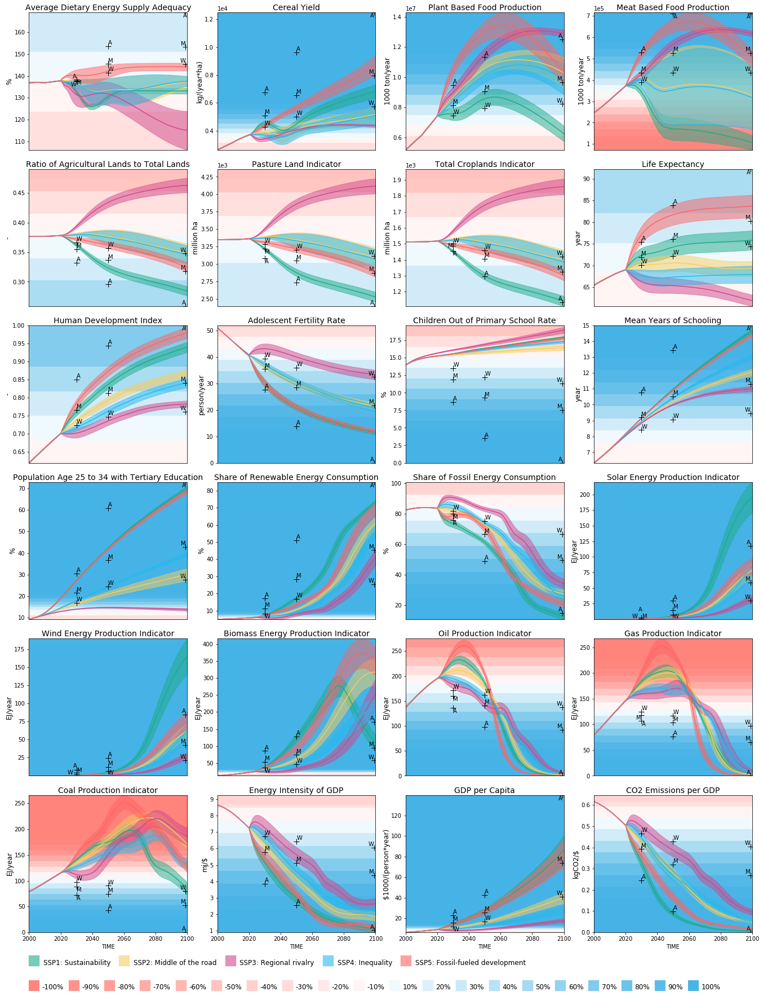

In [166]:
from textwrap import wrap
import math
from adjustText import adjust_text
from matplotlib.lines import Line2D


# Flatten 2D arrays in outcomes[indicator] to 1D array and create a long-format dataframe for plotting the uncertainty
# Why we convert outcomes to long-format dataframe? because it's the accepted format of sns.lineplot which draws uncertainty

outcomes_dict = {}

for i in scenarios:
    outcomes_df = pd.DataFrame(columns=(['TIME']+indicator_list))
    for key in (['TIME']+indicator_list): 
        outcomes_df[key] = outcomes[i][key][:, 100:].ravel() # Plot timeseries data from 2000 (100:)
    outcomes_dict[i] = outcomes_df

# The plots will be in 4 column and a certain number of rows, depending on the number of indicators
fig_rows = 6
fig_cols = 4

fig, axes = plt.subplots(fig_rows, fig_cols, figsize=(23, 30), sharex='col')
fig.subplots_adjust(hspace=0.14, wspace=0.19)

# For iterating betweeing subplots
i = 0
j = 0

# Specify what SDG number you're plotting. The total number of indicators must not exceed 24 (the maximum size of the grid). 
for v, var in enumerate(sdg_inds['2']+sdg_inds['3']+sdg_inds['4']+sdg_inds['7']+sdg_inds['8']):
    if j == fig_cols:
        j = 0
        i += 1
        
    for s, sc in enumerate(scenarios):
        sns.lineplot(x='TIME', y=var, ci='sd', data=outcomes_dict[sc], ax=axes[i,j], marker='', color=sc_colors[sc], 
                     err_kws={'alpha':.5})
    axes[i,j].set_ylabel(inds_unit[var], size=12, labelpad=2)
    axes[i,j].set_title(var, fontsize=14, pad=4) 
   
    # Remove the whitespace at the beginning and end of  x and y axes
    axes[i,j].margins(x=0)
    axes[i,j].margins(y=0)

    # Annotate the target levels
    x_val = []
    y_val = []
    for y in range(3):
        targets_value = [targets_2030[var][y], targets_2050[var][y], targets_2100[var][y]]
        targets_year = [2030, 2050, 2099]
        
        axes[i,j].plot(targets_year, targets_value, linestyle="None", marker='+', alpha=1, markersize=10 ,color='black')


        x_val = x_val + targets_year
        y_val = y_val + targets_value
        
    text = ['A', 'A', 'A', 'M', 'M', 'M', 'W', 'W', 'W']        
    texts = []
    for x, y, s in zip(x_val, y_val, text):
        texts.append(axes[i,j].text(x, y, s))
    adjust_text(texts, ax= axes[i,j],  only_move={'points':'xy', 'texts':'xy'}, force_text=(.5, .1), 
                force_points=(0.5, 0.1))
    
    # To correct the formarting of the y-axis to appear with scietific format
    axes[i,j].ticklabel_format(style='sci',axis='y',scilimits=(-2,3))

    j += 1


# Removing ticks for inner plots                
for i in range(fig_rows-1):
    for j in range(fig_cols):
        axes[i, j].tick_params(bottom=False)

# Draw the shaded increment boxes in the background of each subplot
i = 0
j = 0
for v, var in enumerate(sdg_inds['2']+sdg_inds['3']+sdg_inds['4']+sdg_inds['7']+sdg_inds['8']): 
    if var in indicator_list:
        if j == fig_cols:
            j = 0
            i += 1
        
        # Create 10% improvement (increase or decrease) increment from the worst value threshold.
        improv_incr = targets_2030[var][3]*.1
        
        # Get the min and max of each subplot
        y_min = axes[i,j].get_ylim()[0]
        y_max = axes[i,j].get_ylim()[1]
        
        # For indicators where reduction in indicator value is desired
        if targets_2030[var][0] < targets_2030[var][3]:
            
            # Color the increment steps up to 10 steps with blue
            for c in range(10):
                if (targets_2030[var][3]-improv_incr*(c+1)) > y_min:
                    axes[i,j].axhspan(targets_2030[var][3]-improv_incr*(c+1), targets_2030[var][3]-improv_incr*(c), 
                                      facecolor='#46b3e6', alpha=0.08+(0.1*c), zorder=-100)
                    axes[i,j].axhspan(y_min, targets_2030[var][3]-improv_incr*(c+1), facecolor='#46b3e6', 
                                      alpha=0.08+(0.1*c), zorder=-100)
                else:
                    if c == 0:
                        axes[i,j].axhspan(y_min, targets_2030[var][3]-improv_incr*(c), facecolor='#46b3e6', 
                                          alpha=0.08+(0.1*c), zorder=-100)
            # Color the increment steps up to 10 steps with red
            for c in range(10):
                if (targets_2030[var][3]+improv_incr*c) < y_max:
                    axes[i,j].axhspan(targets_2030[var][3]+improv_incr*c, targets_2030[var][3]+improv_incr*(c+1), 
                                      facecolor='#ff847c', alpha=0.08+(0.1*c), zorder=-100)
                    axes[i,j].axhspan(targets_2030[var][3]+improv_incr*(c+1), y_max, facecolor='#ff847c', 
                                      alpha=0.08+(0.1*c), zorder=-100)
                else:
                    if c == 0:  
                        axes[i,j].axhspan(targets_2030[var][3]+improv_incr*(c), y_max, facecolor='#ff847c', 
                                          alpha=0.08+(0.1*c), zorder=-100)
                        
        # For indicators where increase in value is desired
        if targets_2030[var][0] > targets_2030[var][3]:  
            
            # Color the increment steps up to 10 steps with blue
            for c in range(10):
                if (targets_2030[var][3]+improv_incr*(c+1)) < y_max:
                    axes[i,j].axhspan(targets_2030[var][3]+improv_incr*c, targets_2030[var][3]+improv_incr*(c+1), 
                                      facecolor='#46b3e6', alpha=0.08+(0.1*c), zorder=-100)
                    axes[i,j].axhspan(targets_2030[var][3]+improv_incr*(c+1), y_max, facecolor='#46b3e6', 
                                      alpha=0.08+(0.1*c), zorder=-100)
                else:
                    if c == 0:
                        axes[i,j].axhspan(targets_2030[var][3]+improv_incr*(c), y_max, facecolor='#46b3e6', 
                                          alpha=0.08+(0.1*c), zorder=-100)
            
            # Color the increment steps up to 10 steps with red
            for c in range(10):
                if (targets_2030[var][3]-improv_incr*(c+1)) > y_min:
                    axes[i,j].axhspan(targets_2030[var][3]-improv_incr*(c+1), targets_2030[var][3]-improv_incr*c, 
                                      facecolor='#ff847c', alpha=0.08+(0.1*c), zorder=-100)
                    axes[i,j].axhspan(y_min, targets_2030[var][3]-improv_incr*(c+1), facecolor='#ff847c', 
                                      alpha=0.08+(0.1*c), zorder=-100)
                else:
                    if c == 0:
                        axes[i,j].axhspan(y_min, targets_2030[var][3]-improv_incr*(c), facecolor='#ff847c', 
                                          alpha=0.08+(0.1*c), zorder=-100)
        
        j += 1 
        

# Annotate the regions/world data for comparison with the model projection.
'''i = 0
j = 0
for v, var in enumerate(sdg_inds['2']+sdg_inds['3']+sdg_inds['4']+sdg_inds['7']+sdg_inds['8']):
    if var in indicator_list:
        if j == fig_cols:
            j = 0
            i += 1
        if var in df_ind1['Target indicator'].to_list():
            var_indx = df_hist.index[df_hist['Target indicator'] == var]
            #data_region = [df_hist['World/region/country'].loc[var_indx].item()]
            data_year = [df_hist['Data reference year'].loc[var_indx].item()]
            data_value = [df_hist['Data reference value'].loc[var_indx].item()]
            axes[i,j].plot(data_year, data_value, linestyle="None", marker='^', alpha=0.5, markersize=10,  
                           markeredgecolor='#ffdd00',color='#f75f00')
            axes[i,j].annotate(df_hist['Scale'].loc[var_indx].item(), (data_year[0], data_value[0]))
        j += 1
'''


# Create legend for the colour increments
legend_elements = []
legend_elements_2 = []

for i in range(10):
    legend_elements.append(Line2D([0], [0], marker="s", color='none', label=str(-10*(i+1))+'%', 
                                  markersize=20, markeredgecolor='white', markerfacecolor='#ff847c', alpha=0.08+(0.1*i)))
legend_elements = legend_elements[::-1]
for i in range(10): 
    legend_elements.append(Line2D([0], [0], marker="s", color='none', label=str(10*(i+1))+'%',
                                  markersize=20, markeredgecolor='white', markerfacecolor='#46b3e6', alpha=0.08+(0.1*i)))

ssp_names = {'SSP1': 'SSP1: Sustainability', 'SSP2': 'SSP2: Middle of the road', 
             'SSP3': 'SSP3: Regional rivalry', 'SSP4': 'SSP4: Inequality', 'SSP5': 'SSP5: Fossil-fueled development'}
for i in scenarios:
    legend_elements_2.append(Line2D([0], [0], marker="s", color='none', label=ssp_names[i], 
                                  markersize=20, markeredgecolor='white', markerfacecolor=sc_colors[i], alpha=.6))

    
fig.legend(handles=legend_elements, loc='upper left', bbox_to_anchor=(.12, .04, .5, .05), frameon=False, 
           bbox_transform=fig.transFigure, ncol=20, 
           handlelength=1, columnspacing=1, handletextpad=.7, labelspacing=.01, fontsize=12, handleheight=2.4)
fig.legend(handles=legend_elements_2, loc='upper left', bbox_to_anchor=(.12, .06, .5, .05), frameon=False, 
           bbox_transform=fig.transFigure, ncol=20, 
           handlelength=1, columnspacing=1.5, handletextpad=.9, labelspacing=.01, fontsize=12, handleheight=2.4)


plt.savefig('{}/SSPs_SDGs_timeseries1_300dpi.png'.format(r'C:/Users/moallemie/EM_analysis/Fig/'), dpi=300,  bbox_inches='tight') 


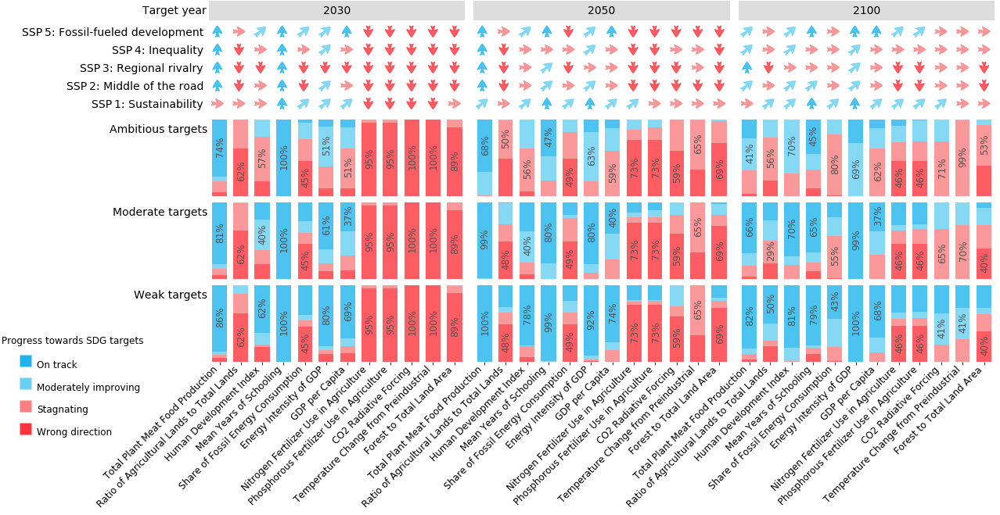

In [114]:
import matplotlib.patches as patches
from matplotlib.path import Path
from matplotlib.patches import BoxStyle
from matplotlib.lines import Line2D


# this class expands any textboxes to the width size of the subplot. We used it for drawing the SDG boxes on the top
class ExtendedTextBox(BoxStyle._Base):
    """
    An Extended Text Box that expands to the axes limits 
                        if set in the middle of the axes
    """

    def __init__(self, pad=0.3, width=500.):
        """
        width: 
            width of the textbox. 
            Use `ax.get_window_extent().width` 
                   to get the width of the axes.
        pad: 
            amount of padding (in vertical direction only)
        """
        self.width=width
        self.pad = pad
        super(ExtendedTextBox, self).__init__()

    def transmute(self, x0, y0, width, height, mutation_size):
        """
        x0 and y0 are the lower left corner of original text box
        They are set automatically by matplotlib
        """
        # padding
        pad = mutation_size * self.pad

        # we add the padding only to the box height
        height = height + 2.*pad
        # boundary of the padded box
        y0 = y0 - pad
        y1 = y0 + height
        _x0 = x0
        x0 = _x0 +width /2. - self.width/2.
        x1 = _x0 +width /2. + self.width/2.

        cp = [(x0, y0),
              (x1, y0), (x1, y1), (x0, y1),
              (x0, y0)]

        com = [Path.MOVETO,
               Path.LINETO, Path.LINETO, Path.LINETO,
               Path.CLOSEPOLY]

        path = Path(cp, com)

        return path

dpi = 300

# register the custom style
BoxStyle._style_list["ext"] = ExtendedTextBox


target_year = {130:'2030', 150:'2050', 200:'2100'}
all_targets = [targets_2030, targets_2050, targets_2100]


# Create grids and axes
# First, set the width ratio of subplots
width_ratios = [2,1,1,2,1,2,2,1, .4, 2,1,1,2,1,2,2,1, .4, 2,1,1,2,1,2,2,1]
fig = plt.figure(figsize=(18, 8))

grid = plt.GridSpec(4, 26, hspace=0.08, wspace=0, width_ratios= width_ratios, height_ratios= [1.2,1,1,1])

# Use GridSpec for creating subplots with shared axis because we have the SSP arrows subplot on the top of other subplots with differnet ratio.
axes = {} # Dictionary axes for stacked barcharts
axes_arr = {} # Dictionary axes for arrows
for r in range(1,4):  # Rows corresponds to target levels
    axes[r,0] = fig.add_subplot(grid[r, 0])
for c in range(1,8): # Columns corresponds to the SDGs indicators and then target years
    axes[3,c] = fig.add_subplot(grid[3, c])
for c in range(9,17):
    axes[3,c] = fig.add_subplot(grid[3, c])
for c in range(18,26):
    axes[3,c] = fig.add_subplot(grid[3, c])   
for r in range(1,3):
    for c in range(1,8):
        axes[r,c] = fig.add_subplot(grid[r, c], sharex=axes[3,c], sharey=axes[r,0])
    for c in range(9,17):
        axes[r,c] = fig.add_subplot(grid[r, c], sharex=axes[3,c], sharey=axes[r,0])
    for c in range(18,26):
        axes[r,c] = fig.add_subplot(grid[r, c], sharex=axes[3,c], sharey=axes[r,0])

# Specify the SDG indicators for plotting.
inds_list = ['Total Plant Meat Food Production', 'Ratio of Agricultural Lands to Total Lands', 
             'Human Development Index', 
             'Mean Years of Schooling', 
             'Share of Fossil Energy Consumption', 'Energy Intensity of GDP', 
             'GDP per Capita', 
             'Nitrogen Fertilizer Use in Agriculture', 'Phosphorous Fertilizer Use in Agriculture', 
             'CO2 Radiative Forcing', 'Temperature Change from Preindustrial', 
             'Forest to Total Land Area']

sdg_inds['2'] = ['Total Plant Meat Food Production', 'Ratio of Agricultural Lands to Total Lands']
sdg_inds['3'] = ['Human Development Index']
sdg_inds['4'] = ['Mean Years of Schooling']
sdg_inds['7'] = ['Share of Fossil Energy Consumption', 'Energy Intensity of GDP']
sdg_inds['8'] = ['GDP per Capita']
sdg_inds['12'] = ['Nitrogen Fertilizer Use in Agriculture', 'Phosphorous Fertilizer Use in Agriculture']
sdg_inds['13'] = ['CO2 Radiative Forcing', 'Temperature Change from Preindustrial']
sdg_inds['15'] = ['Forest to Total Land Area']
        
        
for y, year in enumerate([130,150,200]):
    #Create a dictionary of dataframes for the normalised value of outcomes in each target year  
    #in different scenarios based on aambitious, moderate, and weak targets.
    for t in [0,1,2]:
        outcomes_norm = {}
        for s, scenario in enumerate(scenarios):
            outcomes_norm[scenario] = pd.DataFrame(columns=inds_list)
            for i, ind in enumerate(inds_list):
                out_norm = outcomes[scenario][ind][:, year]
                #For indicators where reduction in indicator value is desired
                if all_targets[y][ind][t] < all_targets[y][ind][3]:
                    outcomes_norm[scenario][ind] = np.where(out_norm > all_targets[y][ind][3],
                                                            -(abs(out_norm - all_targets[y][ind][3])/abs(all_targets[y][ind][t]-all_targets[y][ind][3]))*100, 
                                                            (abs(out_norm - all_targets[y][ind][3])/abs(all_targets[y][ind][t]-all_targets[y][ind][3]))*100)
                #For indicators where increase in indicator value is desired
                if all_targets[y][ind][t] > all_targets[y][ind][3]:
                    outcomes_norm[scenario][ind] = np.where(out_norm < all_targets[y][ind][3],
                                                            -(abs(out_norm - all_targets[y][ind][3])/abs(all_targets[y][ind][t]-all_targets[y][ind][3]))*100, 
                                                            (abs(out_norm - all_targets[y][ind][3])/abs(all_targets[y][ind][t]-all_targets[y][ind][3]))*100)

        # Identify in each indicators, how many futures meet the ambitious target at different levels (green, yellow, orange, red).
        df_count = {}
        df_sum = {}

        for group_name in ['green', 'yellow', 'orange', 'red']:
            df_count[group_name] = pd.DataFrame(index=scenarios, columns=inds_list)
            df_sum[group_name] = pd.DataFrame(columns=inds_list)

        # Count scenarios for differnet levels of achivemengts.
        for s, sc in enumerate(scenarios):
            for i, ind in enumerate(inds_list):
                df_count['green'].loc[sc][ind] = outcomes_norm[sc][outcomes_norm[sc][ind] >= 100].count()[ind]
                df_count['yellow'].loc[sc][ind] = outcomes_norm[sc][(outcomes_norm[sc][ind] < 100) & (outcomes_norm[sc][ind] >= 50)].count()[ind]
                df_count['orange'].loc[sc][ind] = outcomes_norm[sc][(outcomes_norm[sc][ind] < 50) & (outcomes_norm[sc][ind] > 0)].count()[ind]
                df_count['red'].loc[sc][ind] = outcomes_norm[sc][outcomes_norm[sc][ind] <= 0].count()[ind]

        # Combine the count of scenarios across the SSPs.
        for i, ind in enumerate(inds_list):
            for group_name in ['green', 'yellow','orange', 'red']:
                df_sum[group_name][ind] = [df_count[group_name][ind].sum()]



        # Develop the stacked bar charts.
        for g, sdg in enumerate(['2','3', '4', '7', '8', '12','13', '15']): #
            x = sdg_inds[sdg]
            y_green = []
            y_red = []
            y_yellow = []
            y_orange = []
            for i, ind in enumerate(sdg_inds[sdg]):
                y_green.append(df_sum['green'][ind][0])
                y_yellow.append(df_sum['yellow'][ind][0])
                y_orange.append(df_sum['orange'][ind][0])
                y_red.append(df_sum['red'][ind][0])

            # Set the y position of each bar to start from
            bottom_yellow = [sum(x) for x in zip(y_red, y_orange)]
            bottom_green = [sum(x) for x in zip(y_red, y_yellow, y_orange)]
            axes[t+1, g+y*9].bar(x, y_red, width=.7, color='#ff353d', bottom=0, alpha=.8) # red
            axes[t+1, g+y*9].bar(x, y_orange, bottom=y_red, width=.7, color='#fa7f81', alpha=.8) # orange
            axes[t+1, g+y*9].bar(x, y_yellow, bottom=bottom_yellow, width=.7, color='#68d0f3', alpha=.8) # yellow
            axes[t+1, g+y*9].bar(x, y_green, bottom=bottom_green, width=.7, color='#1fb4ee',alpha=.8) # green
            



            # Get the y position of the bottom of each bar (stacked on the top of another)
            h = []
            for p in axes[t+1, g+y*9].patches:
                b = p.get_bbox()
                h.append(b.y0)

            # The iteration annotates all red bars at the bottom first and then all orange bars on the the top of red bars, and so on.
            bar_annot = []
            for p, pa in enumerate(axes[t+1, g+y*9].patches):      
                #if pa.get_height() > 1000: # Only annotate bars with enough height for annotation
                    # Convert the bar height to a percentage of total scenarios
                bar_annot.append((pa.get_height()/(number_sc*5))*100)

            bar_annot_inmax = []
            for p in range(len(sdg_inds[sdg])):
                # Create a list of percentage achivements per each indicator 
                bar_annot_list = [bar_annot[p], bar_annot[p+len(sdg_inds[sdg])],bar_annot[p+len(sdg_inds[sdg])*2],
                                  bar_annot[p+len(sdg_inds[sdg])*3]]
                # Find the index of the level of achivement with highest percentage for annotation per each indicator
                index_max = max(range(len(bar_annot_list)), key=bar_annot_list.__getitem__)
                bar_annot_inmax.append(p+len(sdg_inds[sdg])*index_max) # 4 is the number for levels achivements.

            for p, pa in enumerate(axes[t+1, g+y*9].patches):
                #if (bar_annot[p] > bar_annot[p+len(sdg_inds[sdg])])
                if p in bar_annot_inmax:
                    axes[t+1, g+y*9].annotate(str(int((pa.get_height()/(number_sc*5))*100))+'%', (pa.get_x()+pa.get_width()/2., pa.get_height()/2+h[p]), 
                                     ha='center', va='center', rotation=90, xytext=(1, 2),textcoords='offset points', 
                                          fontsize=12, fontweight='normal',color='#525252')

            # Remove all ticks and spines
            [s.set_visible(False) for s in axes[t+1, g+y*9].spines.values()]
            [t.set_visible(False) for t in axes[t+1, g+y*9].get_yticklines()]
            [t.set_visible(False) for t in axes[t+1, g+y*9].get_xticklines()]
            [l.set_visible(False) for l in axes[t+1, g+y*9].get_yticklabels()]

            # Change the x axis label font size and rotate the label
            #axes[t+1, g+y*9].tick_params(axis='x', rotation=90, labelsize=13)
            
            if (t == 2):
                axes[t+1, g+y*9].set_xticklabels(sdg_inds[sdg], fontsize=12, rotation=45, ha='right')
                axes[t+1, g+y*9].tick_params(axis='x', pad=0)
                axes[t+1, g+y*9].xaxis.tick_bottom()
            else:
                axes[t+1, g+y*9].tick_params(labelbottom=False)
                
                

            # Reduce the x margines in plots. The margines should be proportional to the width ratio of the subplot.
            axes[t+1, g+y*9].margins(x=.2/width_ratios[g], y=0)
            
    
    
        # Now we develop the SSP arrow scatter plot on the top of stacked bar charts.
        # Here we want to show if the world unfolds according to each SSP, what would be the most likely level of target achivement.
        #Note that that it's 'the most likely' level of achivement that has the maximum scenarios in the respective SSP. Therefore, that SSP can also lead to other achivement level, but the number of scenarios is smaller. 
        if t == 0: # Only draw arrows for the moderate level of achivemengt. 0 is ambitious, 1 is moderate, 2 is weak.
            arrow_color = {0:'green', 1:'yellow', 2:'orange', 3:'red'} 
            ssp_ind = {}
            for s, sc in enumerate(scenarios):
                for ind, indx in enumerate(inds_list):
                    ssp_char = []
                    for group_name in ['green', 'yellow','orange', 'red']:
                        ssp_char.append(df_count[group_name].loc[sc][indx])
                        maxind = max(range(len(ssp_char)), key=ssp_char.__getitem__)
                        ssp_ind[(sc,indx)] = arrow_color[maxind]

            # Create an empty scatterplot with indicators in x axis and SSPs in y axis to use for annotaing arrows. Both indictors and arrows are represneted by indicative numbers to assist the positionning of arrows.
            
            axes_arr[y] = fig.add_subplot(grid[0, y*9:y*9+8])
            
            sc_list = [[0,1,2,3,4]]*len(inds_list)
            for xe, ye in zip ([i for i in range(len(inds_list))], sc_list):
                axes_arr[y].scatter([xe] * len(ye), ye, color='')
            axes_arr[y].margins(y=.1) 
            axes_arr[y].margins(x=0.035) # This aligns how the scatter points spread in x axis (use it to align the dots with x-ticks)

            for s, sc in enumerate(scenarios):
                for ind, indx in enumerate(inds_list):
                    if ssp_ind[(sc,indx)] == arrow_color[0]: # green color
                        axes_arr[y].annotate("",xy=(ind, s+.4), xycoords='data', xytext=(ind, s-.4), textcoords='data',
                                    arrowprops=dict(arrowstyle="fancy,head_length=1,head_width=1.2,tail_width=.5",
                                                    connectionstyle="arc3", color='#1fb4ee', alpha=.8))
                    if ssp_ind[(sc,indx)] == arrow_color[1]: # yellow color
                        axes_arr[y].annotate("",xy=(ind+.3, s+.3), xycoords='data', xytext=(ind-.3, s-.3), textcoords='data',
                                    arrowprops=dict(arrowstyle="fancy,head_length=1,head_width=1.2,tail_width=.5",
                                                    connectionstyle="arc3", color='#68d0f3', alpha=.8))
                    if ssp_ind[(sc,indx)] == arrow_color[2]: # orange color
                        axes_arr[y].annotate("",xy=(ind+.35, s), xycoords='data', xytext=(ind-.35, s), textcoords='data',
                                    arrowprops=dict(arrowstyle="fancy,head_length=1,head_width=1.2,tail_width=.5",
                                                    connectionstyle="arc3", color='#fa7f81', alpha=.8))
                    if ssp_ind[(sc,indx)] == arrow_color[3]: # red color
                        axes_arr[y].annotate("",xy=(ind, s-.4), xycoords='data', xytext=(ind, s+.4), textcoords='data',
                                    arrowprops=dict(arrowstyle="fancy,head_length=1,head_width=1.2,tail_width=.5",
                                                    connectionstyle="arc3", color='#ff353d', alpha=.8))
            if y == 0:
                axes_arr[y].set_yticks(np.arange(len(scenarios)))
                axes_arr[y].set_yticklabels(['SSP 1: Sustainability', 'SSP 2: Middle of the road', 
                                             'SSP 3: Regional rivalry', 'SSP 4: Inequality', 
                                             'SSP 5: Fossil-fueled development'], fontsize=14, ha='right')
                axes_arr[y].set_title('Target year', loc='left', 
                                      ha='right', size=14, pad=5, position=(-.0098, 1))
            else:
                [l.set_visible(False) for l in axes_arr[y].get_yticklabels()]
                
            
            #axes_arr[y].set_facecolor('#f0f0f0')


            # Remove all ticks and spines
            [s.set_visible(False) for s in axes_arr[y].spines.values()]
            [t.set_visible(False) for t in axes_arr[y].get_xticklines()]
            [t.set_visible(False) for t in axes_arr[y].get_yticklines()]
            [l.set_visible(False) for l in axes_arr[y].get_xticklabels()]
            
            
            title = axes_arr[y].set_title(target_year[year], size=14, pad=10, 
                                                  bbox=dict(facecolor='#dddddd', edgecolor='none'), color='black')
            # set the box style of the xlabel text box toour custom box
            bb = title.get_bbox_patch()
            # use the axes' width as width of the text box
            bb.set_boxstyle("ext", pad=0.4, width=axes_arr[y].get_window_extent().width )
            
            '''axes_arr[y].text(.5, .5, 'Moderate\ntargets', fontsize=50, color='grey', alpha=.2, fontweight='heavy', rotation=0,
                    horizontalalignment='center', verticalalignment='center', zorder=100, transform=axes_arr[y].transAxes)'''
            
            


# Set y-axis label to annoate the achivement levels
target_label = {1:'Ambitious targets', 2:'Moderate targets', 3:'Weak targets'}
for r in range(1,4):
    axes[r,0].set_ylabel(target_label[r], size=14, labelpad=2, rotation='horizontal', ha='right', position=(-0,.8))


# Create legend
legend_elements = []
legend_colors = ["#1fb4ee", "#68d0f3", "#fa7f81", "#ff353d"]
#legend_colors = ['green', '#fddb3a', 'orange', 'red']
legend_labels = ['On track', 'Moderately improving', 'Stagnating', 'Wrong direction']

for i in range(4):
    legend_elements.append(Line2D([0], [0], marker="s", color='none', label=legend_labels[i], 
                                  markersize=15, markeredgecolor='none', markerfacecolor=legend_colors[i], alpha=1))
    
leg = fig.legend(handles=legend_elements, loc='upper left', bbox_to_anchor=(-.08, .16, .5, .05), frameon=False, 
           bbox_transform=fig.transFigure, ncol=1, title="Progress towards SDG targets\n", title_fontsize='large',
           handlelength=1, columnspacing=1, handletextpad=.7, labelspacing=.01, fontsize=12, handleheight=3.3)

leg.get_title().set_position((-10, -5))


plt.savefig('{}/SSPs_SDGs_boxarrows_maintext.pdf'.format(r'C:/Users/moallemie/GitHub/SSPs_SDGs_Assessment/Fig/'), dpi=600,  bbox_inches='tight') 
plt.savefig('{}/SSPs_SDGs_boxarrows_maintext.png'.format(r'C:/Users/moallemie/GitHub/SSPs_SDGs_Assessment/Fig/'), dpi=600,  bbox_inches='tight') 


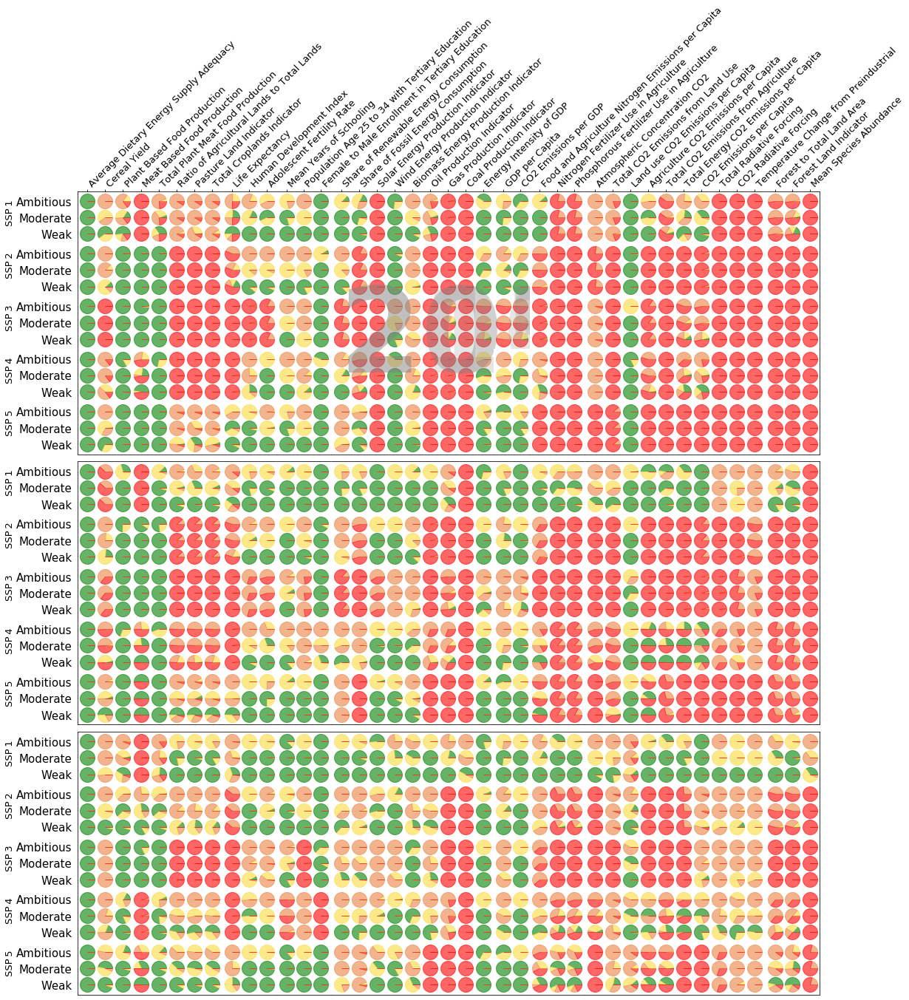

In [229]:
# Specify the target year
target_year = {130:'2030', 150:'2050', 200:'2100'}
all_targets = [targets_2030, targets_2050, targets_2100]
target_level = {0: 'A', 1:'M', 2:'W'}

# Separate the indicators (the entire list, not the major indicator) per each SDG
sdg_inds = {}
for i in ['2', '3', '4', '7', '8', '12', '13', '15']:
    sdg_inds[i] = df_ind1[df_ind1.ID.str.startswith(i)]['Target indicator'].to_list() 
    
    
# Create the figure
fig = plt.figure(figsize=(18, 20))

# Set the width ratio of subplots
width_ratios = [8,3,3,9,2,3,10,3]
g_lim = [0, 8,11,14,23,25,28,38,41]

grid = plt.GridSpec(17, 41, hspace=0, wspace=0, height_ratios= [1.5,1.5,1.5,1.5,1.5,.2,
                                                                1.5,1.5,1.5,1.5,1.5,.2,
                                                                1.5,1.5,1.5,1.5,1.5])

axes = {}
# Create the subplots with the shared axis for scatter pie chart
for c in range(1,8):
    axes[16,c] = fig.add_subplot(grid[16, g_lim[c]:g_lim[c+1]])
        
for r in range(17):
    if r not in [5, 11]:
        axes[r,0] = fig.add_subplot(grid[r, g_lim[0]:g_lim[1]])

for c in range(1,8):
    for r in range(0,16):
        if r not in [5, 11]:
            axes[r,c] = fig.add_subplot(grid[r, g_lim[c]:g_lim[c+1]],sharex=axes[16,c], sharey=axes[r,0])

for r in [5, 11]:
    axes[r,0] = fig.add_subplot(grid[r, g_lim[0]:g_lim[8]])

"""
Firstly I develop the scatter pie chart
"""
# Function for drawing pie chart scatter plot
def draw_pie(dist, 
             xpos, 
             ypos, 
             size,
             alpha,
             ax=None):
    if ax is None:
        fig, ax = plt.subplots(figsize=(10,8))

    # for incremental pie slices
    cumsum = np.cumsum(dist)
    cumsum = cumsum/ cumsum[-1]
    pie = [0] + cumsum.tolist()

    i = 0
    for r1, r2 in zip(pie[:-1], pie[1:]):
        angles = np.linspace(2 * np.pi * r1, 2 * np.pi * r2)
        x = [0] + np.cos(angles).tolist()
        y = [0] + np.sin(angles).tolist()

        xy = np.column_stack([x, y])
        slice_color = {0:'green', 1:'#fddb3a', 2:'#eb8242', 3:'red'}
        ax.scatter([xpos], [ypos], marker=xy, color=slice_color[i], alpha=alpha, s=size)
        i += 1

    return ax


      
for y, year in enumerate(list(target_year.keys())):
    for s, ssp in enumerate(scenarios):
        # Iterate between ambitious, moderate, and weak targets and develop the stacked bar charts.
        for t in [0,1,2]:
            outcomes_norm = {}
            outcomes_norm[ssp] = pd.DataFrame(columns=indicator_list)
            for i, ind in enumerate(indicator_list):
                out_norm = outcomes[ssp][ind][:, year]
                #For indicators where reduction in indicator value is desired
                if all_targets[y][ind][t] < all_targets[y][ind][3]:
                    outcomes_norm[ssp][ind] = np.where(out_norm > all_targets[y][ind][3],
                                                            -(abs(out_norm - all_targets[y][ind][3])/abs(all_targets[y][ind][t]-all_targets[y][ind][3]))*100, 
                                                            (abs(out_norm - all_targets[y][ind][3])/abs(all_targets[y][ind][t]-all_targets[y][ind][3]))*100)
                #For indicators where increase in indicator value is desired
                if all_targets[y][ind][t] > all_targets[y][ind][3]:
                    outcomes_norm[ssp][ind] = np.where(out_norm < all_targets[y][ind][3],
                                                            -(abs(out_norm - all_targets[y][ind][3])/abs(all_targets[y][ind][t]-all_targets[y][ind][3]))*100, 
                                                            (abs(out_norm - all_targets[y][ind][3])/abs(all_targets[y][ind][t]-all_targets[y][ind][3]))*100)

            # Identify in each indicators, how many futures meet the ambitious target at different levels (green, yellow, orange, red).
            df_count = {}
            for group_name in ['green', 'yellow', 'orange', 'red']:
                df_count[group_name] = pd.DataFrame(index=scenarios, columns=indicator_list)

            # Count the number of scenarios for differnet types of achivemengts.
            for i, ind in enumerate(indicator_list):
                df_count['green'].loc[ssp][ind] = outcomes_norm[ssp][outcomes_norm[ssp][ind] >= 100].count()[ind]
                df_count['yellow'].loc[ssp][ind] = outcomes_norm[ssp][(outcomes_norm[ssp][ind] < 100) & (outcomes_norm[ssp][ind] > 50)].count()[ind]
                df_count['orange'].loc[ssp][ind] = outcomes_norm[ssp][(outcomes_norm[ssp][ind] < 50) & (outcomes_norm[ssp][ind] > 0)].count()[ind]
                df_count['red'].loc[ssp][ind] = outcomes_norm[ssp][outcomes_norm[ssp][ind] <= 0].count()[ind]

            for g, sdg in enumerate(['2','3', '4', '7', '8', '12','13', '15']): #
                for ind, indx in enumerate(sdg_inds[sdg]):
                    green_slice = df_count['green'].loc[ssp][indx].item()
                    yellow_slice = df_count['yellow'].loc[ssp][indx].item() 
                    orange_slice = df_count['orange'].loc[ssp][indx].item() 
                    red_slice = df_count['red'].loc[ssp][indx].item()
                    #grey_slice = df_count['yellow'].loc[ssp][indx].item() + df_count['orange'].loc[ssp][indx].item() + df_count['red'].loc[ssp][indx].item()
                    draw_pie([green_slice,yellow_slice,orange_slice,red_slice],ind,2-t,400, alpha=.6, ax=axes[s+y*6,g])

        
                # Reduce the x margines in plots. The margines should be proportional to the width ratio of the subplot.
                axes[s+y*6, g].margins(x=.15/width_ratios[g], y=.25)
                axes[s+y*6, g].set_ylim(bottom=-.6, top=2.6)
                
                if (s == 0) and (y == 0):
                    axes[s+y*6, g].set_xticks(np.arange(len(sdg_inds[sdg]))) # This helps to displace all label values
                    axes[s+y*6, g].set_xticklabels(sdg_inds[sdg], fontsize=13, rotation=45, ha='left')
                    axes[s+y*6, g].xaxis.tick_top()
                    axes[s+y*6, g].tick_params(axis='x', pad=0)
                else:
                    axes[s+y*6, g].tick_params(labelbottom=False)
                
                    
                # Remove all ticks and spines
                [s.set_visible(False) for s in axes[s+y*6, g].spines.values()]
                [t.set_visible(False) for t in axes[s+y*6, g].get_yticklines()]
                [t.set_visible(False) for t in axes[s+y*6, g].get_xticklines() if s != 0]
                axes[0+y*6, g].spines["top"].set_visible(True)
                axes[4+y*6, g].spines["bottom"].set_visible(True)
                
                if g != 0:
                    [l.set_visible(False) for l in axes[s+y*6, g].get_yticklabels()]
                    
        axes[s+y*6, 0].spines["left"].set_visible(True)
        axes[s+y*6, 7].spines["right"].set_visible(True)
        
        target_label = ['Weak','Moderate','Ambitious', 'Moderate']
        ssp_label = ['SSP 1', 'SSP 2', 'SSP 3', 'SSP 4', 'SSP 5']
        axes[s+y*6,0].set_yticks(np.arange(3)) # This helps to displace all label values
        axes[s+y*6, 0].set_yticklabels(target_label, fontsize=15)
        axes[s+y*6,0].set_ylabel(ssp_label[s], size=13, labelpad=2, rotation='vertical', ha='center', position=(0,.6))
        if s == 2:
            axes[2+y*6,4].text(0, 0,target_year[year], fontsize=160, color='white', alpha=.2, fontweight='heavy', rotation=0,
                        horizontalalignment='center', verticalalignment='center', zorder=100)

#plt.savefig('{}/SSPs_SDGs_piechart_SI.pdf'.format(r'C:/Users/moallemie/GitHub/SSPs_SDGs_Assessment/Fig/',target_year[year]), dpi=600,  bbox_inches='tight') 
#plt.savefig('{}/SSPs_SDGs_piechart_SI.png'.format(r'C:/Users/moallemie/GitHub/SSPs_SDGs_Assessment/Fig/',target_year[year]), dpi=600,  bbox_inches='tight') 


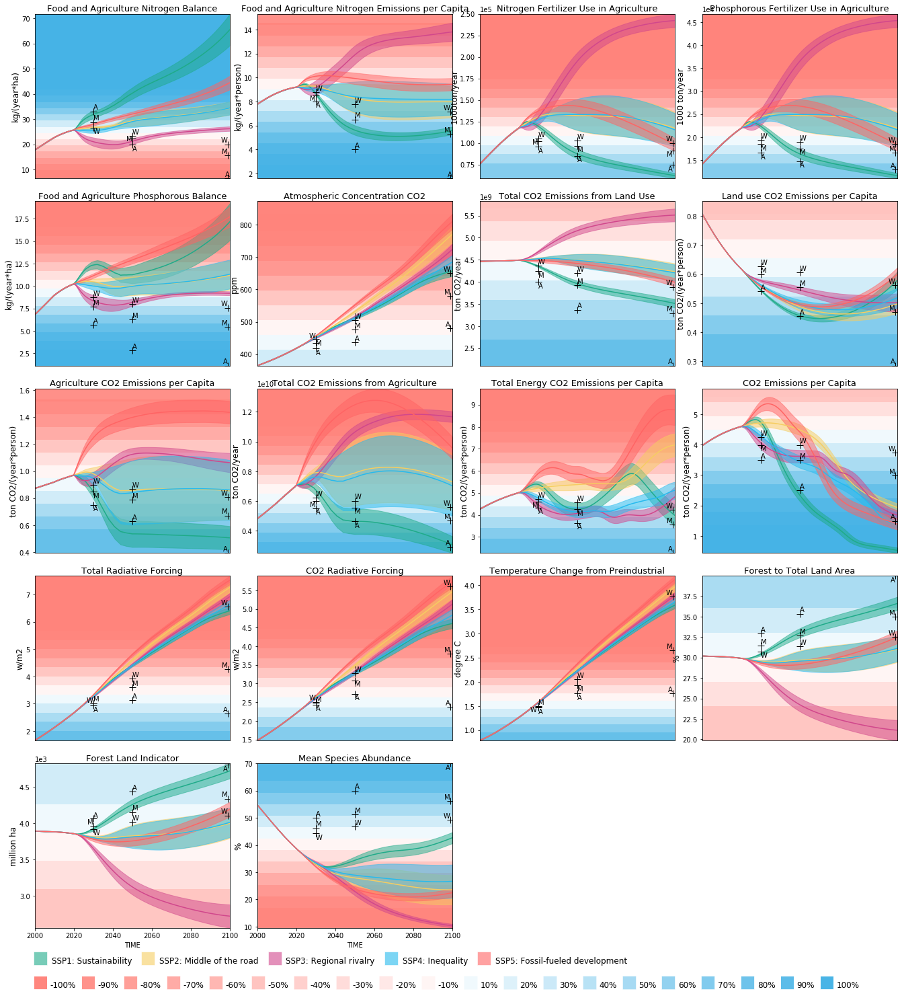

In [167]:
# Flatten 2D arrays in outcomes[indicator] to 1D array and create a long-format dataframe for plotting the uncertainty
# Why we convert outcomes to long-format dataframe? because it's the accepted format of sns.lineplot which draws uncertainty
from textwrap import wrap
import math


outcomes_dict = {}

for i in scenarios:
    outcomes_df = pd.DataFrame(columns=(['TIME']+indicator_list))
    for key in (['TIME']+indicator_list): 
        outcomes_df[key] = outcomes[i][key][:, 100:].ravel()
    outcomes_dict[i] = outcomes_df

# The plots will be in 4 column and a certain number of rows, depending on the number of indicators
fig_rows = 5
fig_cols = 4

fig, axes = plt.subplots(fig_rows, fig_cols, figsize=(23, 25), sharex='col')
fig.subplots_adjust(hspace=0.14, wspace=0.14)

# For iterating betweeing subplots
i = 0
j = 0

# Specify what SDG number are your plotting. The total number of indicators must not exceed 24. 
for v, var in enumerate(sdg_inds['12']+sdg_inds['13']+sdg_inds['15']):
    if j == fig_cols:
        j = 0
        i += 1
        
    for s, sc in enumerate(scenarios):
        sns.lineplot(x='TIME', y=var, ci='sd', data=outcomes_dict[sc], ax=axes[i,j], marker='', color=sc_colors[sc], 
                     err_kws={'alpha':.5})
    axes[i,j].set_ylabel(inds_unit[var], size=12, labelpad=2)
    axes[i,j].set_title(var, fontsize=13, pad=4) 
   
    # Remove the whitespace at the beginning and end of  x and y axes
    axes[i,j].margins(x=0)
    axes[i,j].margins(y=0)

    # Annotate the target levels
    x_val = []
    y_val = []
    for y in range(3):
        targets_value = [targets_2030[var][y], targets_2050[var][y], targets_2100[var][y]]
        targets_year = [2030, 2050, 2099]
        
        axes[i,j].plot(targets_year, targets_value, linestyle="None", marker='+', alpha=1, markersize=10 ,color='black')
        #for a in range(3):
            #axes[i,j].annotate(annot[y], (targets_year[a], targets_value[a]))

        x_val = x_val + targets_year
        y_val = y_val + targets_value
        
    text = ['A', 'A', 'A', 'M', 'M', 'M', 'W', 'W', 'W']        
    texts = []
    for x, y, s in zip(x_val, y_val, text):
        texts.append(axes[i,j].text(x, y, s))
    adjust_text(texts, ax= axes[i,j],  only_move={'points':'xy', 'texts':'xy'}, force_text=(.5, .1), 
                force_points=(0.5, 0.1))
    
    # To correct the formarting of the y-axis to appear with scietific format
    axes[i,j].ticklabel_format(style='sci',axis='y',scilimits=(-2,3))

    j += 1


# Removing ticks for inner plots                
for i in range(fig_rows-1):
    for j in range(fig_cols):
        axes[i, j].tick_params(bottom=False)

# Draw the shaded increment boxes in the background of each subplot
i = 0
j = 0
for v, var in enumerate(sdg_inds['12']+sdg_inds['13']+sdg_inds['15']):
    if var in indicator_list:
        if j == fig_cols:
            j = 0
            i += 1
        
        # Create 10% improvement (increase or decrease) increment from the red threshold.
        improv_incr = targets_2030[var][3]*.1
        
        # Get the min and max of each subplot
        y_min = axes[i,j].get_ylim()[0]
        y_max = axes[i,j].get_ylim()[1]
        
        # For indicators where reduction in indicator value is desired
        if targets_2030[var][0] < targets_2030[var][3]:
            
            # Color the blue increment steps
            for c in range(10):
                if (targets_2030[var][3]-improv_incr*(c+1)) > y_min:
                    axes[i,j].axhspan(targets_2030[var][3]-improv_incr*(c+1), targets_2030[var][3]-improv_incr*(c), 
                                      facecolor='#46b3e6', alpha=0.08+(0.1*c), zorder=-100)
                    axes[i,j].axhspan(y_min, targets_2030[var][3]-improv_incr*(c+1), facecolor='#46b3e6', 
                                      alpha=0.08+(0.1*c), zorder=-100)
                else:
                    if c == 0:
                        axes[i,j].axhspan(y_min, targets_2030[var][3]-improv_incr*(c), facecolor='#46b3e6', 
                                          alpha=0.08+(0.1*c), zorder=-100)
            # Color the red increment steps
            for c in range(10):
                if (targets_2030[var][3]+improv_incr*c) < y_max:
                    axes[i,j].axhspan(targets_2030[var][3]+improv_incr*c, targets_2030[var][3]+improv_incr*(c+1), 
                                      facecolor='#ff847c', alpha=0.08+(0.1*c), zorder=-100)
                    axes[i,j].axhspan(targets_2030[var][3]+improv_incr*(c+1), y_max, facecolor='#ff847c', 
                                      alpha=0.08+(0.1*c), zorder=-100)
                else:
                    if c == 0:  
                        axes[i,j].axhspan(targets_2030[var][3]+improv_incr*(c), y_max, facecolor='#ff847c', 
                                          alpha=0.08+(0.1*c), zorder=-100)
                        
        # For indicators where increase in value is desired
        if targets_2030[var][0] > targets_2030[var][3]:  
            
            # Color the blue increment steps
            for c in range(10):
                if (targets_2030[var][3]+improv_incr*(c+1)) < y_max:
                    axes[i,j].axhspan(targets_2030[var][3]+improv_incr*c, targets_2030[var][3]+improv_incr*(c+1), 
                                      facecolor='#46b3e6', alpha=0.08+(0.1*c), zorder=-100)
                    axes[i,j].axhspan(targets_2030[var][3]+improv_incr*(c+1), y_max, facecolor='#46b3e6', 
                                      alpha=0.08+(0.1*c), zorder=-100)
                else:
                    if c == 0:
                        axes[i,j].axhspan(targets_2030[var][3]+improv_incr*(c), y_max, facecolor='#46b3e6', 
                                          alpha=0.08+(0.1*c), zorder=-100)
            
            # Color the red increment steps
            for c in range(10):
                if (targets_2030[var][3]-improv_incr*(c+1)) > y_min:
                    axes[i,j].axhspan(targets_2030[var][3]-improv_incr*(c+1), targets_2030[var][3]-improv_incr*c, 
                                      facecolor='#ff847c', alpha=0.08+(0.1*c), zorder=-100)
                    axes[i,j].axhspan(y_min, targets_2030[var][3]-improv_incr*(c+1), facecolor='#ff847c', 
                                      alpha=0.08+(0.1*c), zorder=-100)
                else:
                    if c == 0:
                        axes[i,j].axhspan(y_min, targets_2030[var][3]-improv_incr*(c), facecolor='#ff847c', 
                                          alpha=0.08+(0.1*c), zorder=-100)
        
        j += 1 
        

# Annotate the regions/world data for comparison with the model projection.
'''i = 0
j = 0
for v, var in enumerate(sdg_inds['12']+sdg_inds['13']+sdg_inds['15']):
    if var in indicator_list:
        if j == fig_cols:
            j = 0
            i += 1
        if var in df_ind1['Target indicator'].to_list():
            var_indx = df_hist.index[df_hist['Target indicator'] == var]
            #data_region = [df_hist['World/region/country'].loc[var_indx].item()]
            data_year = [df_hist['Data reference year'].loc[var_indx].item()]
            data_value = [df_hist['Data reference value'].loc[var_indx].item()]
            axes[i,j].plot(data_year, data_value, linestyle="None", marker='^', alpha=0.5, markersize=10,  
                           markeredgecolor='#ffdd00',color='#f75f00')
            axes[i,j].annotate(df_hist['Scale'].loc[var_indx].item(), (data_year[0], data_value[0]))
        j += 1
'''
axes[4,2].axis('off')
axes[4,3].axis('off')
        
# Create legend for the colour increments
legend_elements = []
legend_elements_2 = []

for i in range(10):
    legend_elements.append(Line2D([0], [0], marker="s", color='none', label=str(-10*(i+1))+'%', 
                                  markersize=20, markeredgecolor='white', markerfacecolor='#ff847c', alpha=0.08+(0.1*i)))
legend_elements = legend_elements[::-1]
for i in range(10): 
    legend_elements.append(Line2D([0], [0], marker="s", color='none', label=str(10*(i+1))+'%',
                                  markersize=20, markeredgecolor='white', markerfacecolor='#46b3e6', alpha=0.08+(0.1*i)))


for i in scenarios:
    legend_elements_2.append(Line2D([0], [0], marker="s", color='none', label=ssp_names[i], 
                                  markersize=20, markeredgecolor='white', markerfacecolor=sc_colors[i], alpha=.6))

    
fig.legend(handles=legend_elements, loc='upper left', bbox_to_anchor=(.12, .04, .5, .05), frameon=False, 
           bbox_transform=fig.transFigure, ncol=20, 
           handlelength=1, columnspacing=1, handletextpad=.7, labelspacing=.01, fontsize=12, handleheight=2.4)
fig.legend(handles=legend_elements_2, loc='upper left', bbox_to_anchor=(.12, .06, .5, .05), frameon=False, 
           bbox_transform=fig.transFigure, ncol=20, 
           handlelength=1, columnspacing=1.5, handletextpad=.9, labelspacing=.01, fontsize=12, handleheight=2.4)
        
plt.savefig('{}/SSPs_SDGs_timeseries2_300dpi.png'.format(r'C:/Users/moallemie/EM_analysis/Fig/'), dpi=300,  bbox_inches='tight') 


(2000.0, 2100.0, 0.0, 1.0)

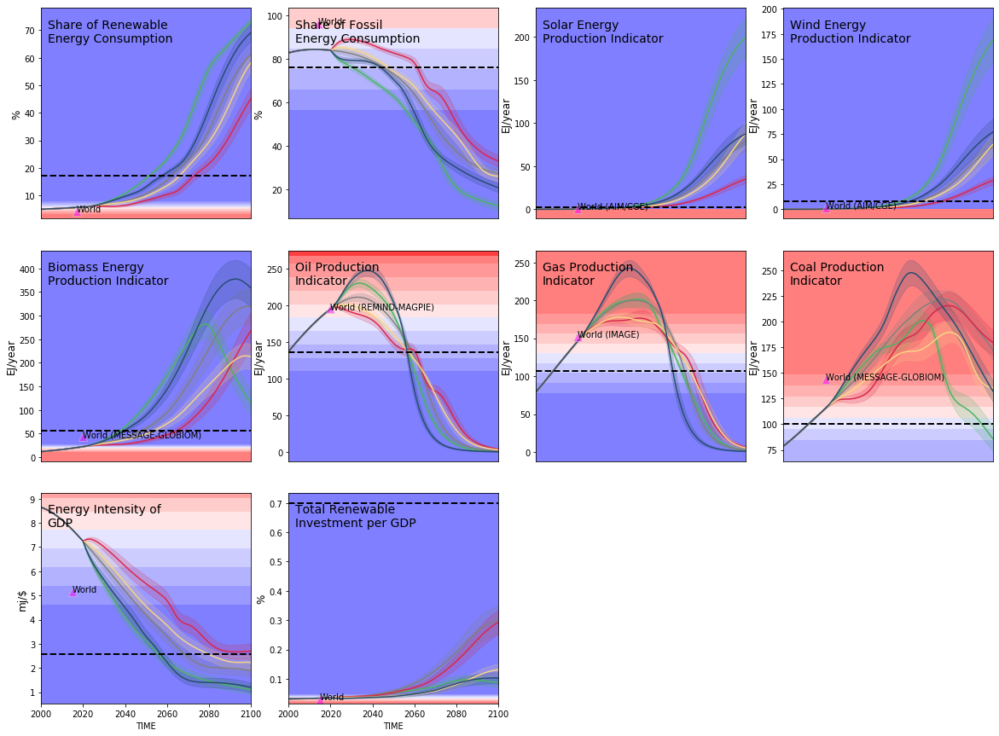

In [9]:
# Flatten 2D arrays in outcomes[indicator] to 1D array and create a long-format dataframe for plotting the uncertainty
# Why we convert outcomes to long-format dataframe? because it's the accepted format of sns.lineplot which draws uncertainty
from textwrap import wrap
import math


# Specify what SDG number are your plotting. 
SDG_number = '7'
outcomes_dict = {}

for i in scenarios:
    outcomes_df = pd.DataFrame(columns=(['TIME']+indicator_list))
    for key in (['TIME']+indicator_list): 
        outcomes_df[key] = outcomes[i][key][:, 100:].ravel()
    outcomes_dict[i] = outcomes_df

# The plots will be in 4 column and a certain number of rows, depending on the number of indicators
fig_rows = 3
fig_cols = 4

fig, axes = plt.subplots(fig_rows, fig_cols, figsize=(20, 15), sharex='col')
fig.subplots_adjust(hspace=0.15, wspace=0.18)

i = 0
j = 0
for v, var in enumerate(sdg_inds[SDG_number]):
    if var in indicator_list:
        if j == fig_cols:
            j = 0
            i += 1
        for s, sc in enumerate(scenarios):
            sns.lineplot(x='TIME', y=var, ci='sd', data=outcomes_dict[sc], ax=axes[i,j], marker='',color=sc_colors[sc])
        #axes[i,j].legend().set_visible(False)
        axes[i,j].set_ylabel(inds_unit[var], size=12, labelpad=2)
        axes[i,j].annotate('\n'.join(wrap(var, 20)), size= 14, xy=(0.03, .95), xycoords='axes fraction', ha='left', va='top')

        # Create 10% improvement (increase or decrease) increment from the red threshold (which in most case except 
        # is model reference value in 2015. For the exception, see the blue rows in the ScenarioFramework target spreadsheets.
        improv_incr = targets[var][3]*.1
        # For indicators wehre reduction in value is desired
        if targets[var][1] < targets[var][3]:
            # This if statement is to fix the y axis limit, in case the green and red targets are above and bellow the axis y limits, respectively.
            # Thus helps to have at least a narrow area for green and red targets, even if the results are not observed in those areas.
            if targets[var][1] < axes[i,j].get_ylim()[0]:
                y_min = targets[var][1]- targets[var][1]*.05
            else:
                y_min = axes[i,j].get_ylim()[0]
            if targets[var][3] > axes[i,j].get_ylim()[1]:
                y_max = targets[var][3] + targets[var][3]*.05
            else:
                y_max = axes[i,j].get_ylim()[1]
            for c in range(5):
                if (targets[var][3]-improv_incr*(c+1)) > y_min:
                    axes[i,j].axhspan(targets[var][3]-improv_incr*(c+1), targets[var][3]-improv_incr*(c), facecolor='blue', alpha=0.1+(0.1*c), zorder=-100)
                    x = c
            axes[i,j].axhspan(y_min, targets[var][3]-improv_incr*(x+1), facecolor='blue', alpha=0.1+(0.1*x), zorder=-100)
            for c in range(5):
                if (targets[var][3]+improv_incr*c) < y_max:
                    axes[i,j].axhspan(targets[var][3]+improv_incr*c, targets[var][3]+improv_incr*(c+1), facecolor='red', alpha=0.1+(0.1*c), zorder=-100)
                    x = c
            axes[i,j].axhspan(targets[var][3]+improv_incr*(x+1), y_max, facecolor='red', alpha=0.1+(0.1*x), zorder=-100)

        # For indicators where increase in value is desired
        if targets[var][1] > targets[var][3]:         
            # This if statement is to fix the y axis limit, in case the green and red targets are above and bellow the axis y limits, respectively.
            # Thus helps to have at least a narrow area for green and red targets, even if the results are not observed in those areas.
            if targets[var][1] > axes[i,j].get_ylim()[1]:
                y_max = targets[var][1] + targets[var][1]*.05
            else:
                y_max = axes[i,j].get_ylim()[1]

            if targets[var][3] < axes[i,j].get_ylim()[0]:
                y_min = targets[var][3] - targets[var][3]*.05
            else:
                y_min = axes[i,j].get_ylim()[0]
            for c in range(5):
                if (targets[var][3]+improv_incr*(c+1)) < y_max:
                    axes[i,j].axhspan(targets[var][3]+improv_incr*c, targets[var][3]+improv_incr*(c+1), facecolor='blue', alpha=0.1+(0.1*c), zorder=-100)
                    x = c
            axes[i,j].axhspan(targets[var][3]+improv_incr*(x+1), y_max, facecolor='blue', alpha=0.1+(0.1*x), zorder=-100)
            for c in range(5):
                if (targets[var][3]-improv_incr*(c+1)) > y_min:
                    axes[i,j].axhspan(targets[var][3]-improv_incr*(c+1), targets[var][3]-improv_incr*c, facecolor='red', alpha=0.1+(0.1*c), zorder=-100)
                    x = c
            axes[i,j].axhspan(y_min, targets[var][3]-improv_incr*(x+1), facecolor='red', alpha=0.1+(0.1*x), zorder=-100)

        # Remove the whitespace at the beginning and end of  x and y axes
        axes[i,j].margins(x=0)
        axes[i,j].margins(y=0)

        axes[i,j].axhline(targets[var][1], ls='--', lw=2, color='black')

        j += 1
    

# Removing ticks for inner plots                
for i in range(fig_rows-1):
    for j in range(fig_cols):
        axes[i, j].tick_params(bottom=False)

i = 0
j = 0
for v, var in enumerate(sdg_inds[SDG_number]):
    if var in indicator_list:
        if j == fig_cols:
            j = 0
            i += 1
        if var in df_ind1['Target indicator'].to_list():
            var_indx = df_hist.index[df_hist['Target indicator'] == var]
            #data_region = [df_hist['World/region/country'].loc[var_indx].item()]
            data_year = [df_hist['Data reference year'].loc[var_indx].item()]
            data_value = [df_hist['Data reference value'].loc[var_indx].item()]
            axes[i,j].plot(data_year, data_value, linestyle="None", marker='^', alpha=0.5, markersize=10,  
                           markeredgecolor='lightgrey',color='fuchsia')
            axes[i,j].annotate(df_hist['Scale'].loc[var_indx].item(), (data_year[0], data_value[0]))
        j += 1
        
axes[2,2].axis('off')
axes[2,3].axis('off')

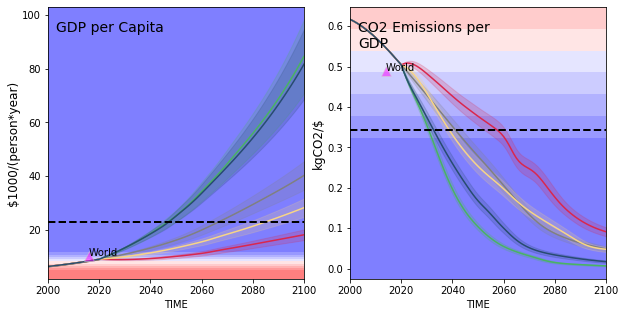

In [10]:
# Flatten 2D arrays in outcomes[indicator] to 1D array and create a long-format dataframe for plotting the uncertainty
# Why we convert outcomes to long-format dataframe? because it's the accepted format of sns.lineplot which draws uncertainty
from textwrap import wrap
import math


# Specify what SDG number are your plotting. 
SDG_number = '8'
outcomes_dict = {}

for i in scenarios:
    outcomes_df = pd.DataFrame(columns=(['TIME']+indicator_list))
    for key in (['TIME']+indicator_list): 
        outcomes_df[key] = outcomes[i][key][:, 100:].ravel()
    outcomes_dict[i] = outcomes_df

# The plots will be in 4 column and a certain number of rows, depending on the number of indicators
fig_rows = 1
fig_cols = 2

fig, axes = plt.subplots(fig_rows, fig_cols, figsize=(10, 5))
fig.subplots_adjust(hspace=0.15, wspace=0.18)

i = 0
for v, var in enumerate(sdg_inds[SDG_number]):
    if var in indicator_list:
        for s, sc in enumerate(scenarios):
            sns.lineplot(x='TIME', y=var, ci='sd', data=outcomes_dict[sc], ax=axes[i], marker='',color=sc_colors[sc])
        #axes[i,j].legend().set_visible(False)
        axes[i].set_ylabel(inds_unit[var], size=12, labelpad=2)
        axes[i].annotate('\n'.join(wrap(var, 20)), size= 14, xy=(0.03, .95), xycoords='axes fraction', ha='left', va='top')

        # Create 10% improvement (increase or decrease) increment from the red threshold (which in most case except 
        # is model reference value in 2015. For the exception, see the blue rows in the ScenarioFramework target spreadsheets.
        improv_incr = targets[var][3]*.1
        
        # For indicators wehre reduction in value is desired
        if targets[var][1] < targets[var][3]:
            # This if statement is to fix the y axis limit, in case the green and red targets are above and bellow the axis y limits, respectively.
            # Thus helps to have at least a narrow area for green and red targets, even if the results are not observed in those areas.
            if targets[var][1] < axes[i].get_ylim()[0]:
                y_min = targets[var][1]- targets[var][1]*.05
                # This line is only to avoid the sdg target line to appear very close to the x axis of the plot. The value is the green target value of the inteneded Variable.
                if targets[var][1] < 3:
                    y_min = - targets[var][2]*.1
            else:
                y_min = axes[i].get_ylim()[0]
            if targets[var][3] > axes[i].get_ylim()[1]:
                y_max = targets[var][3] + targets[var][3]*.05
            else:
                y_max = axes[i].get_ylim()[1]
            for c in range(5):
                if (targets[var][3]-improv_incr*(c+1)) > y_min:
                    axes[i].axhspan(targets[var][3]-improv_incr*(c+1), targets[var][3]-improv_incr*(c), facecolor='blue', alpha=0.1+(0.1*c), zorder=-100)
                    x = c
            axes[i].axhspan(y_min, targets[var][3]-improv_incr*(x+1), facecolor='blue', alpha=0.1+(0.1*x), zorder=-100)
            for c in range(5):
                if (targets[var][3]+improv_incr*c) < y_max:
                    axes[i].axhspan(targets[var][3]+improv_incr*c, targets[var][3]+improv_incr*(c+1), facecolor='red', alpha=0.1+(0.1*c), zorder=-100)
                    x = c
            axes[i].axhspan(targets[var][3]+improv_incr*(x+1), y_max, facecolor='red', alpha=0.1+(0.1*x), zorder=-100)

        # For indicators where increase in value is desired
        if targets[var][1] > targets[var][3]:         
            # This if statement is to fix the y axis limit, in case the green and red targets are above and bellow the axis y limits, respectively.
            # Thus helps to have at least a narrow area for green and red targets, even if the results are not observed in those areas.
            if targets[var][1] > axes[i].get_ylim()[1]:
                y_max = targets[var][1] + targets[var][1]*.05
            else:
                y_max = axes[i].get_ylim()[1]

            if targets[var][3] < axes[i].get_ylim()[0]:
                y_min = targets[var][3] - targets[var][3]*.05
            else:
                y_min = axes[i].get_ylim()[0]
            for c in range(5):
                if (targets[var][3]+improv_incr*(c+1)) < y_max:
                    axes[i].axhspan(targets[var][3]+improv_incr*c, targets[var][3]+improv_incr*(c+1), facecolor='blue', alpha=0.1+(0.1*c), zorder=-100)
                    x = c
            axes[i].axhspan(targets[var][3]+improv_incr*(x+1), y_max, facecolor='blue', alpha=0.1+(0.1*x), zorder=-100)
            for c in range(5):
                if (targets[var][3]-improv_incr*(c+1)) > y_min:
                    axes[i].axhspan(targets[var][3]-improv_incr*(c+1), targets[var][3]-improv_incr*c, facecolor='red', alpha=0.1+(0.1*c), zorder=-100)
                    x = c
            axes[i].axhspan(y_min, targets[var][3]-improv_incr*(x+1), facecolor='red', alpha=0.1+(0.1*x), zorder=-100)

        # Remove the whitespace at the beginning and end of  x and y axes
        axes[i].margins(x=0)
        axes[i].margins(y=0)

        axes[i].axhline(targets[var][1], ls='--', lw=2, color='black')

        i += 1
    

# Removing ticks for inner plots                
for i in range(fig_rows-1):
    for j in range(fig_cols):
        axes[i, j].tick_params(bottom=False)

i = 0
for v, var in enumerate(sdg_inds[SDG_number]):
    if var in indicator_list:
        if var in df_ind1['Target indicator'].to_list():
            var_indx = df_hist.index[df_hist['Target indicator'] == var]
            #data_region = [df_hist['World/region/country'].loc[var_indx].item()]
            data_year = [df_hist['Data reference year'].loc[var_indx].item()]
            data_value = [df_hist['Data reference value'].loc[var_indx].item()]
            axes[i].plot(data_year, data_value, linestyle="None", marker='^', alpha=0.5, markersize=10,  
                           markeredgecolor='lightgrey',color='fuchsia')
            axes[i].annotate(df_hist['Scale'].loc[var_indx].item(), (data_year[0], data_value[0]))
        i += 1
        


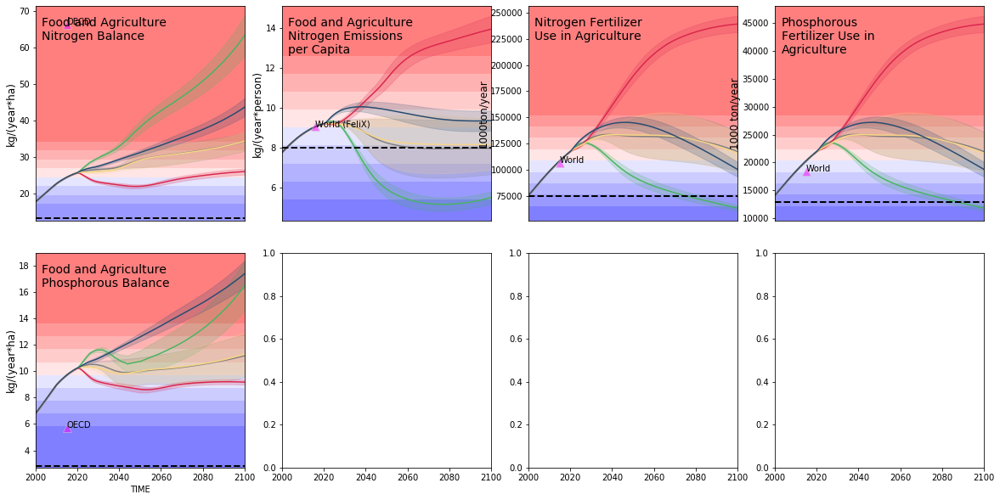

In [11]:
# Flatten 2D arrays in outcomes[indicator] to 1D array and create a long-format dataframe for plotting the uncertainty
# Why we convert outcomes to long-format dataframe? because it's the accepted format of sns.lineplot which draws uncertainty
from textwrap import wrap
import math


# Specify what SDG number are your plotting. 
SDG_number = '12'
outcomes_dict = {}

for i in scenarios:
    outcomes_df = pd.DataFrame(columns=(['TIME']+indicator_list))
    for key in (['TIME']+indicator_list): 
        outcomes_df[key] = outcomes[i][key][:, 100:].ravel()
    outcomes_dict[i] = outcomes_df

# The plots will be in 4 column and a certain number of rows, depending on the number of indicators
fig_rows = 2
fig_cols = 4

fig, axes = plt.subplots(fig_rows, fig_cols, figsize=(20, 10), sharex='col')
fig.subplots_adjust(hspace=0.15, wspace=0.18)

i = 0
j = 0
for v, var in enumerate(sdg_inds[SDG_number]):
    if var in indicator_list:
        if j == fig_cols:
            j = 0
            i += 1
        for s, sc in enumerate(scenarios):
            sns.lineplot(x='TIME', y=var, ci='sd', data=outcomes_dict[sc], ax=axes[i,j], marker='',color=sc_colors[sc])
        #axes[i,j].legend().set_visible(False)
        axes[i,j].set_ylabel(inds_unit[var], size=12, labelpad=2)
        axes[i,j].annotate('\n'.join(wrap(var, 20)), size= 14, xy=(0.03, .95), xycoords='axes fraction', ha='left', va='top')

        # Create 10% improvement (increase or decrease) increment from the red threshold (which in most case except 
        # is model reference value in 2015. For the exception, see the blue rows in the ScenarioFramework target spreadsheets.
        improv_incr = targets[var][3]*.1
        # For indicators wehre reduction in value is desired
        if targets[var][1] < targets[var][3]:
            # This if statement is to fix the y axis limit, in case the green and red targets are above and bellow the axis y limits, respectively.
            # Thus helps to have at least a narrow area for green and red targets, even if the results are not observed in those areas.
            if targets[var][1] < axes[i,j].get_ylim()[0]:
                y_min = targets[var][1]- targets[var][1]*.05
            if targets[var][1] < axes[i,j].get_ylim()[0]:
                y_min = targets[var][1]- targets[var][1]*.05
            else:
                y_min = axes[i,j].get_ylim()[0]
            if targets[var][3] > axes[i,j].get_ylim()[1]:
                y_max = targets[var][3] + targets[var][3]*.05
            else:
                y_max = axes[i,j].get_ylim()[1]
            for c in range(5):
                if (targets[var][3]-improv_incr*(c+1)) > y_min:
                    axes[i,j].axhspan(targets[var][3]-improv_incr*(c+1), targets[var][3]-improv_incr*(c), facecolor='blue', alpha=0.1+(0.1*c), zorder=-100)
                    x = c
            axes[i,j].axhspan(y_min, targets[var][3]-improv_incr*(x+1), facecolor='blue', alpha=0.1+(0.1*x), zorder=-100)
            for c in range(5):
                if (targets[var][3]+improv_incr*c) < y_max:
                    axes[i,j].axhspan(targets[var][3]+improv_incr*c, targets[var][3]+improv_incr*(c+1), facecolor='red', alpha=0.1+(0.1*c), zorder=-100)
                    x = c
            axes[i,j].axhspan(targets[var][3]+improv_incr*(x+1), y_max, facecolor='red', alpha=0.1+(0.1*x), zorder=-100)

        # For indicators where increase in value is desired
        if targets[var][1] > targets[var][3]:         
            # This if statement is to fix the y axis limit, in case the green and red targets are above and bellow the axis y limits, respectively.
            # Thus helps to have at least a narrow area for green and red targets, even if the results are not observed in those areas.
            if targets[var][1] > axes[i,j].get_ylim()[1]:
                y_max = targets[var][1] + targets[var][1]*.05
            else:
                y_max = axes[i,j].get_ylim()[1]

            if targets[var][3] < axes[i,j].get_ylim()[0]:
                y_min = targets[var][3] - targets[var][3]*.05
            else:
                y_min = axes[i,j].get_ylim()[0]
            for c in range(5):
                if (targets[var][3]+improv_incr*(c+1)) < y_max:
                    axes[i,j].axhspan(targets[var][3]+improv_incr*c, targets[var][3]+improv_incr*(c+1), facecolor='blue', alpha=0.1+(0.1*c), zorder=-100)
                    x = c
            axes[i,j].axhspan(targets[var][3]+improv_incr*(x+1), y_max, facecolor='blue', alpha=0.1+(0.1*x), zorder=-100)
            for c in range(5):
                if (targets[var][3]-improv_incr*(c+1)) > y_min:
                    axes[i,j].axhspan(targets[var][3]-improv_incr*(c+1), targets[var][3]-improv_incr*c, facecolor='red', alpha=0.1+(0.1*c), zorder=-100)
                    x = c
            axes[i,j].axhspan(y_min, targets[var][3]-improv_incr*(x+1), facecolor='red', alpha=0.1+(0.1*x), zorder=-100)

        # Remove the whitespace at the beginning and end of  x and y axes
        axes[i,j].margins(x=0)
        axes[i,j].margins(y=0)

        axes[i,j].axhline(targets[var][1], ls='--', lw=2, color='black')

        j += 1
    

# Removing ticks for inner plots                
for i in range(fig_rows-1):
    for j in range(fig_cols):
        axes[i, j].tick_params(bottom=False)

i = 0
j = 0
for v, var in enumerate(sdg_inds[SDG_number]):
    if var in indicator_list:
        if j == fig_cols:
            j = 0
            i += 1
        if var in df_ind1['Target indicator'].to_list():
            var_indx = df_hist.index[df_hist['Target indicator'] == var]
            #data_region = [df_hist['World/region/country'].loc[var_indx].item()]
            data_year = [df_hist['Data reference year'].loc[var_indx].item()]
            data_value = [df_hist['Data reference value'].loc[var_indx].item()]
            axes[i,j].plot(data_year, data_value, linestyle="None", marker='^', alpha=0.5, markersize=10,  
                           markeredgecolor='lightgrey',color='fuchsia')
            axes[i,j].annotate(df_hist['Scale'].loc[var_indx].item(), (data_year[0], data_value[0]))
        j += 1

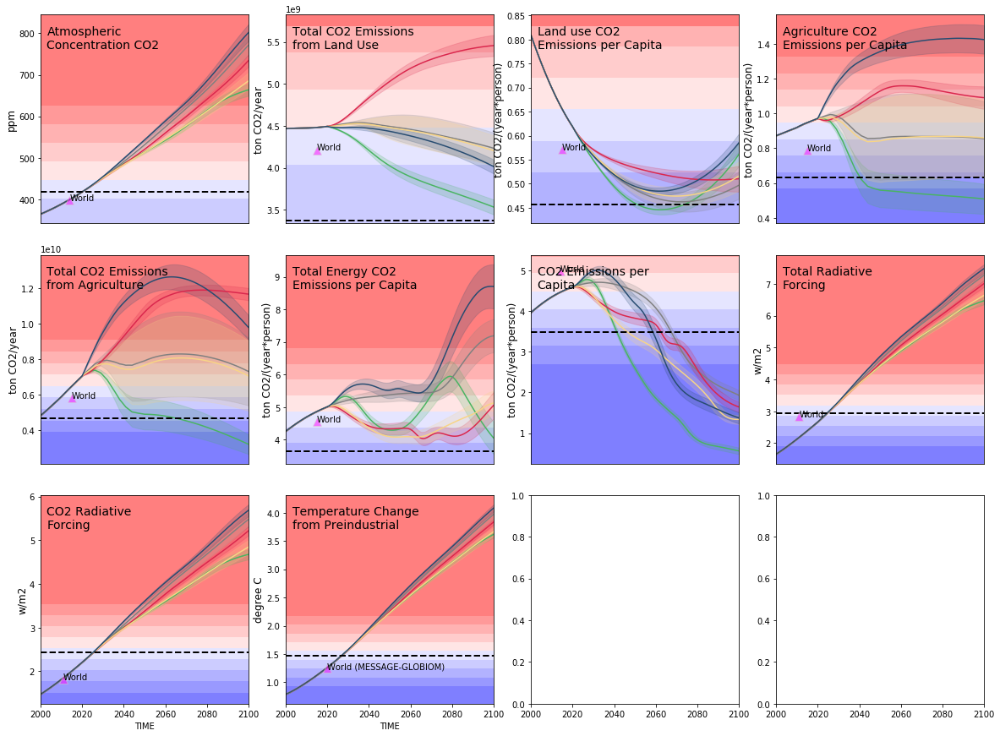

In [12]:
# Flatten 2D arrays in outcomes[indicator] to 1D array and create a long-format dataframe for plotting the uncertainty
# Why we convert outcomes to long-format dataframe? because it's the accepted format of sns.lineplot which draws uncertainty
from textwrap import wrap
import math


# Specify what SDG number are your plotting. 
SDG_number = '13'
outcomes_dict = {}

for i in scenarios:
    outcomes_df = pd.DataFrame(columns=(['TIME']+indicator_list))
    for key in (['TIME']+indicator_list): 
        outcomes_df[key] = outcomes[i][key][:, 100:].ravel()
    outcomes_dict[i] = outcomes_df

# The plots will be in 4 column and a certain number of rows, depending on the number of indicators
fig_rows = 3
fig_cols = 4

fig, axes = plt.subplots(fig_rows, fig_cols, figsize=(20, 15), sharex='col')
fig.subplots_adjust(hspace=0.15, wspace=0.18)

i = 0
j = 0
for v, var in enumerate(sdg_inds[SDG_number]):
    if var in indicator_list:
        if j == fig_cols:
            j = 0
            i += 1
        for s, sc in enumerate(scenarios):
            sns.lineplot(x='TIME', y=var, ci='sd', data=outcomes_dict[sc], ax=axes[i,j], marker='',color=sc_colors[sc])
        #axes[i,j].legend().set_visible(False)
        axes[i,j].set_ylabel(inds_unit[var], size=12, labelpad=2)
        axes[i,j].annotate('\n'.join(wrap(var, 20)), size= 14, xy=(0.03, .95), xycoords='axes fraction', ha='left', va='top')

        # Create 10% improvement (increase or decrease) increment from the red threshold (which in most case except 
        # is model reference value in 2015. For the exception, see the blue rows in the ScenarioFramework target spreadsheets.
        improv_incr = targets[var][3]*.1
        # For indicators wehre reduction in value is desired
        if targets[var][1] < targets[var][3]:
            # This if statement is to fix the y axis limit, in case the green and red targets are above and bellow the axis y limits, respectively.
            # Thus helps to have at least a narrow area for green and red targets, even if the results are not observed in those areas.
            if targets[var][1] < axes[i,j].get_ylim()[0]:
                y_min = targets[var][1]- targets[var][1]*.05
            else:
                y_min = axes[i,j].get_ylim()[0]
            if targets[var][3] > axes[i,j].get_ylim()[1]:
                y_max = targets[var][3] + targets[var][3]*.05
            else:
                y_max = axes[i,j].get_ylim()[1]
            for c in range(5):
                if (targets[var][3]-improv_incr*(c+1)) > y_min:
                    axes[i,j].axhspan(targets[var][3]-improv_incr*(c+1), targets[var][3]-improv_incr*(c), facecolor='blue', alpha=0.1+(0.1*c), zorder=-100)
                    x = c
            axes[i,j].axhspan(y_min, targets[var][3]-improv_incr*(x+1), facecolor='blue', alpha=0.1+(0.1*x), zorder=-100)
            for c in range(5):
                if (targets[var][3]+improv_incr*c) < y_max:
                    axes[i,j].axhspan(targets[var][3]+improv_incr*c, targets[var][3]+improv_incr*(c+1), facecolor='red', alpha=0.1+(0.1*c), zorder=-100)
                    x = c
            axes[i,j].axhspan(targets[var][3]+improv_incr*(x+1), y_max, facecolor='red', alpha=0.1+(0.1*x), zorder=-100)

        # For indicators where increase in value is desired
        if targets[var][1] > targets[var][3]:         
            # This if statement is to fix the y axis limit, in case the green and red targets are above and bellow the axis y limits, respectively.
            # Thus helps to have at least a narrow area for green and red targets, even if the results are not observed in those areas.
            if targets[var][1] > axes[i,j].get_ylim()[1]:
                y_max = targets[var][1] + targets[var][1]*.05
            else:
                y_max = axes[i,j].get_ylim()[1]

            if targets[var][3] < axes[i,j].get_ylim()[0]:
                y_min = targets[var][3] - targets[var][3]*.05
            else:
                y_min = axes[i,j].get_ylim()[0]
            for c in range(5):
                if (targets[var][3]+improv_incr*(c+1)) < y_max:
                    axes[i,j].axhspan(targets[var][3]+improv_incr*c, targets[var][3]+improv_incr*(c+1), facecolor='blue', alpha=0.1+(0.1*c), zorder=-100)
                    x = c
            axes[i,j].axhspan(targets[var][3]+improv_incr*(x+1), y_max, facecolor='blue', alpha=0.1+(0.1*x), zorder=-100)
            for c in range(5):
                if (targets[var][3]-improv_incr*(c+1)) > y_min:
                    axes[i,j].axhspan(targets[var][3]-improv_incr*(c+1), targets[var][3]-improv_incr*c, facecolor='red', alpha=0.1+(0.1*c), zorder=-100)
                    x = c
            axes[i,j].axhspan(y_min, targets[var][3]-improv_incr*(x+1), facecolor='red', alpha=0.1+(0.1*x), zorder=-100)

        # Remove the whitespace at the beginning and end of  x and y axes
        axes[i,j].margins(x=0)
        axes[i,j].margins(y=0)

        axes[i,j].axhline(targets[var][1], ls='--', lw=2, color='black')

        j += 1
    

# Removing ticks for inner plots                
for i in range(fig_rows-1):
    for j in range(fig_cols):
        axes[i, j].tick_params(bottom=False)

i = 0
j = 0
for v, var in enumerate(sdg_inds[SDG_number]):
    if var in indicator_list:
        if j == fig_cols:
            j = 0
            i += 1
        if var in df_ind1['Target indicator'].to_list():
            var_indx = df_hist.index[df_hist['Target indicator'] == var]
            #data_region = [df_hist['World/region/country'].loc[var_indx].item()]
            data_year = [df_hist['Data reference year'].loc[var_indx].item()]
            data_value = [df_hist['Data reference value'].loc[var_indx].item()]
            axes[i,j].plot(data_year, data_value, linestyle="None", marker='^', alpha=0.5, markersize=10,  
                           markeredgecolor='lightgrey',color='fuchsia')
            axes[i,j].annotate(df_hist['Scale'].loc[var_indx].item(), (data_year[0], data_value[0]))
        j += 1

In [ ]:
outcomes_norm['SSP1']

C:\ProgramData\Anaconda3\envs\python37\lib\site-packages\ipykernel_launcher.py:78: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


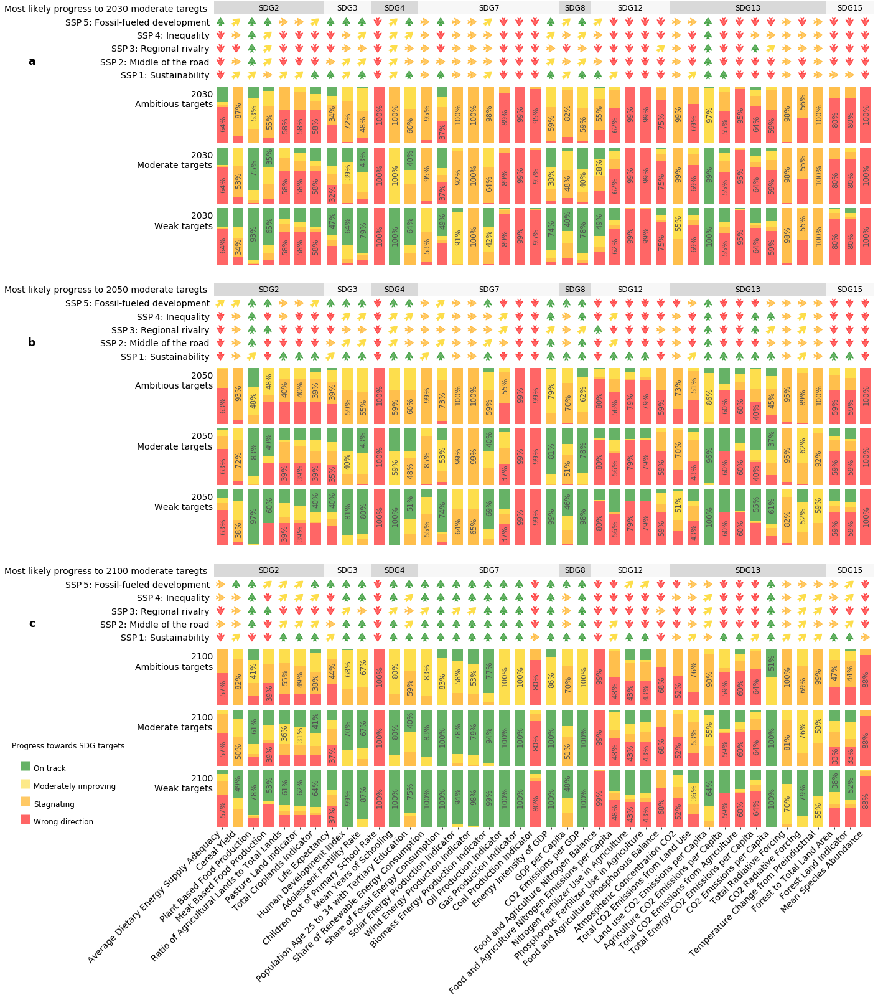

In [192]:
import matplotlib.patches as patches
from matplotlib.path import Path
from matplotlib.patches import BoxStyle

# this class expands any textboxes to the width size of the subplot. We used it for drawing the SDG boxes on the top
class ExtendedTextBox(BoxStyle._Base):
    """
    An Extended Text Box that expands to the axes limits 
                        if set in the middle of the axes
    """

    def __init__(self, pad=0.3, width=500.):
        """
        width: 
            width of the textbox. 
            Use `ax.get_window_extent().width` 
                   to get the width of the axes.
        pad: 
            amount of padding (in vertical direction only)
        """
        self.width=width
        self.pad = pad
        super(ExtendedTextBox, self).__init__()

    def transmute(self, x0, y0, width, height, mutation_size):
        """
        x0 and y0 are the lower left corner of original text box
        They are set automatically by matplotlib
        """
        # padding
        pad = mutation_size * self.pad

        # we add the padding only to the box height
        height = height + 2.*pad
        # boundary of the padded box
        y0 = y0 - pad
        y1 = y0 + height
        _x0 = x0
        x0 = _x0 +width /2. - self.width/2.
        x1 = _x0 +width /2. + self.width/2.

        cp = [(x0, y0),
              (x1, y0), (x1, y1), (x0, y1),
              (x0, y0)]

        com = [Path.MOVETO,
               Path.LINETO, Path.LINETO, Path.LINETO,
               Path.CLOSEPOLY]

        path = Path(cp, com)

        return path

dpi = 300

# register the custom style
BoxStyle._style_list["ext"] = ExtendedTextBox


target_year = {130:'2030', 150:'2050', 200:'2100'}


#Set the width ratio of subplots
width_ratios = [7,3,3,9,2,5,10,3]
fig = plt.figure(figsize=(19, 24))

grid = plt.GridSpec(14, 8, hspace=0.08, wspace=0, width_ratios= width_ratios, height_ratios= [1.2,1,1,1,.4,1.2,1,1,1,.4,1.2,1,1,1])

all_targets = [targets_2030, targets_2050, targets_2100]

# We used GridSpec for creating subplots with shared axis because we have the SSP arrows subplot on the top of other subplots with differnet ratio.
axes = {}
axes_arr = {}
for y, year in enumerate([130,150,200]):
    for r in range(1,4):
        axes[r+y*5,0] = fig.add_subplot(grid[r+y*5, 0])
    for c in range(8):
        axes[3+y*5,c] = fig.add_subplot(grid[3+y*5, c])
    for r in range(1,3):
        for c in range(1,8):
            axes[r+y*5,c] = fig.add_subplot(grid[r+y*5, c], sharex=axes[3+y*5,c], sharey=axes[r+y*5,0])

    #Create a dictionary of dataframes for the normalised value of outcomes in year 2030 
    #in different scenarios based on aambitious, moderate, and weak targets.
    for t in [0,1,2]:
        outcomes_norm = {}
        for s, scenario in enumerate(scenarios):
            outcomes_norm[scenario] = pd.DataFrame(columns=indicator_list)
            for i, ind in enumerate(indicator_list):
                out_norm = outcomes[scenario][ind][:, year]
                #For indicators where reduction in indicator value is desired
                if all_targets[y][ind][t] < all_targets[y][ind][3]:
                    outcomes_norm[scenario][ind] = np.where(out_norm > all_targets[y][ind][3],
                                                            -(abs(out_norm - all_targets[y][ind][3])/abs(all_targets[y][ind][t]-all_targets[y][ind][3]))*100, 
                                                            (abs(out_norm - all_targets[y][ind][3])/abs(all_targets[y][ind][t]-all_targets[y][ind][3]))*100)
                #For indicators where increase in indicator value is desired
                if all_targets[y][ind][t] > all_targets[y][ind][3]:
                    outcomes_norm[scenario][ind] = np.where(out_norm < all_targets[y][ind][3],
                                                            -(abs(out_norm - all_targets[y][ind][3])/abs(all_targets[y][ind][t]-all_targets[y][ind][3]))*100, 
                                                            (abs(out_norm - all_targets[y][ind][3])/abs(all_targets[y][ind][t]-all_targets[y][ind][3]))*100)

        # Identify in each indicators, how many futures meet the ambitious target at different levels (green, yellow, orange, red).
        df_count = {}
        df_sum = {}

        for group_name in ['green', 'yellow', 'orange', 'red']:
            df_count[group_name] = pd.DataFrame(index=scenarios, columns=indicator_list)
            df_sum[group_name] = pd.DataFrame(columns=indicator_list)

        # Count scenarios for differnet levels of achivemengts.
        for s, sc in enumerate(scenarios):
            for i, ind in enumerate(indicator_list):
                df_count['green'].loc[sc][ind] = outcomes_norm[sc][outcomes_norm[sc][ind] >= 100].count()[ind]
                df_count['yellow'].loc[sc][ind] = outcomes_norm[sc][(outcomes_norm[sc][ind] < 100) & (outcomes_norm[sc][ind] >= 50)].count()[ind]
                df_count['orange'].loc[sc][ind] = outcomes_norm[sc][(outcomes_norm[sc][ind] < 50) & (outcomes_norm[sc][ind] > 0)].count()[ind]
                df_count['red'].loc[sc][ind] = outcomes_norm[sc][outcomes_norm[sc][ind] <= 0].count()[ind]

        # Combine the count of scenarios across the SSPs.
        for i, ind in enumerate(indicator_list):
            for group_name in ['green', 'yellow','orange', 'red']:
                df_sum[group_name][ind] = [df_count[group_name][ind].sum()]



         # Develop the stacked bar charts.
        for g, sdg in enumerate(['2','3', '4', '7', '8', '12','13', '15']): #
            x = sdg_inds[sdg]
            y_green = []
            y_red = []
            y_yellow = []
            y_orange = []
            for i, ind in enumerate(sdg_inds[sdg]):
                y_green.append(df_sum['green'][ind][0])
                y_yellow.append(df_sum['yellow'][ind][0])
                y_orange.append(df_sum['orange'][ind][0])
                y_red.append(df_sum['red'][ind][0])

            # Set the y position of each bar to start from
            bottom_yellow = [sum(x) for x in zip(y_red, y_orange)]
            bottom_green = [sum(x) for x in zip(y_red, y_yellow, y_orange)]
            axes[t+1+y*5, g].bar(x, y_red, width=.7, color='red', bottom=0, alpha=.6) # red
            axes[t+1+y*5, g].bar(x, y_orange, bottom=y_red, width=.7, color='orange', alpha=.7) # orange
            axes[t+1+y*5, g].bar(x, y_yellow, bottom=bottom_yellow, width=.7, color='#fddb3a', alpha=.9) # yellow
            axes[t+1+y*5, g].bar(x, y_green, bottom=bottom_green, width=.7, color='green',alpha=.6) # green



            # Get the y position of the bottom of each bar (stacked on the top of another)
            h = []
            for p in axes[t+1+y*5, g].patches:
                b = p.get_bbox()
                h.append(b.y0)

            # The iteration annotates all red bars at the bottom first and then all orange bars on the the top of red bars, and so on.
            bar_annot = []
            for p, pa in enumerate(axes[t+1+y*5, g].patches):      
                #if pa.get_height() > 1000: # Only annotate bars with enough height for annotation
                    # Convert the bar height to a percentage of total scenarios
                bar_annot.append((pa.get_height()/(number_sc*5))*100)

            bar_annot_inmax = []
            for p in range(len(sdg_inds[sdg])):
                # Create a list of percentage achivements per each indicator 
                bar_annot_list = [bar_annot[p], bar_annot[p+len(sdg_inds[sdg])],bar_annot[p+len(sdg_inds[sdg])*2],
                                  bar_annot[p+len(sdg_inds[sdg])*3]]
                # Find the index of the level of achivement with highest percentage for annotation per each indicator
                index_max = max(range(len(bar_annot_list)), key=bar_annot_list.__getitem__)
                bar_annot_inmax.append(p+len(sdg_inds[sdg])*index_max) # 4 is the number for levels achivements.

            for p, pa in enumerate(axes[t+1+y*5, g].patches):
                #if (bar_annot[p] > bar_annot[p+len(sdg_inds[sdg])])
                if p in bar_annot_inmax:
                    axes[t+1+y*5, g].annotate(str(int((pa.get_height()/(number_sc*5))*100))+'%', (pa.get_x()+pa.get_width()/2., pa.get_height()/2+h[p]), 
                                     ha='center', va='center', rotation=90, xytext=(1, 2),textcoords='offset points', 
                                          fontsize=12, fontweight='normal',color='#525252')

            # Remove all ticks and spines
            [s.set_visible(False) for s in axes[t+1+y*5, g].spines.values()]
            [t.set_visible(False) for t in axes[t+1+y*5, g].get_yticklines()]
            [t.set_visible(False) for t in axes[t+1+y*5, g].get_xticklines()]
            [l.set_visible(False) for l in axes[t+1+y*5, g].get_yticklabels()]

            # Change the x axis label font size and rotate the label
            #axes[t+1+y*5, g].tick_params(axis='x', rotation=90, labelsize=13)
            
            if (t == 2) and (y == 2):
                axes[t+1+y*5, g].set_xticklabels(sdg_inds[sdg], fontsize=14, rotation=45, ha='right')
                axes[t+1+y*5, g].tick_params(axis='x', pad=0)
                axes[t+1+y*5, g].xaxis.tick_bottom()
            else:
                axes[t+1+y*5, g].tick_params(labelbottom=False)
                
                

            # Reduce the x margines in plots. The margines should be proportional to the width ratio of the subplot.
            axes[t+1+y*5, g].margins(x=.2/width_ratios[g], y=0)
            
            facecolor = {'2':'#d9d9d9','3':'#f7f7f7', '4':'#d9d9d9', '7':'#f7f7f7', '8':'#d9d9d9', 
                         '12':'#f7f7f7','13':'#d9d9d9', '15':'#f7f7f7'}
            
            if t == 0: # only use titles for the subplot for the ambitious level targets. 
                title = axes[t+1+y*5, g].set_title(sdg_names[sdg], size=12, pad=122, 
                                                      bbox=dict(facecolor=facecolor[sdg], edgecolor='none'), color='black')
                # set the box style of the xlabel text box toour custom box
                bb = title.get_bbox_patch()
                # use the axes' width as width of the text box
                bb.set_boxstyle("ext", pad=0.4, width=axes[t+1+y*5, g].get_window_extent().width )

    
    
        # Now we develop the SSP arrow scatter plot on the top of stacked bar charts.
        # Here we want to show if the world unfolds according to each SSP, what would be the most likely level of target achivement.
        #Note that that it's 'the most likely' level of achivement that has the maximum scenarios in the respective SSP. Therefore, that SSP can also lead to other achivement level, but the number of scenarios is smaller. 
        if t == 1: # Only draw arrows for the ambitious level of achivemengt.
            arrow_color = {0:'green', 1:'#fddb3a', 2:'orange', 3:'red'} # Here define the arrow colour
            ssp_ind = {}
            for s, sc in enumerate(scenarios):
                for ind, indx in enumerate(indicator_list):
                    ssp_char = []
                    for group_name in ['green', 'yellow','orange', 'red']:
                        ssp_char.append(df_count[group_name].loc[sc][indx])
                        maxind = max(range(len(ssp_char)), key=ssp_char.__getitem__)
                        ssp_ind[(sc,indx)] = arrow_color[maxind]

            # Create an empty scatterplot with indicators in x axis and SSPs in y axis to use for annotaing arrows. Both indictors and arrows are represneted by indicative numbers to assit the positionning of arrows.
            axes_arr[y] = fig.add_subplot(grid[y*5, :])
            sc_list = [[0,1,2,3,4]]*len(indicator_list)
            for xe, ye in zip ([i for i in range(len(indicator_list))], sc_list):
                axes_arr[y].scatter([xe] * len(ye), ye, color='')



            for s, sc in enumerate(scenarios):
                for ind, indx in enumerate(indicator_list):
                    if ssp_ind[(sc,indx)] == arrow_color[0]: # green color
                        axes_arr[y].annotate("",xy=(ind, s+.4), xycoords='data', xytext=(ind, s-.4), textcoords='data',
                                    arrowprops=dict(arrowstyle="fancy,head_length=1,head_width=1.2,tail_width=.5",
                                                    connectionstyle="arc3", color=ssp_ind[(sc,indx)], alpha=.6))
                    if ssp_ind[(sc,indx)] == arrow_color[1]: # yellow color
                        axes_arr[y].annotate("",xy=(ind+.3, s+.3), xycoords='data', xytext=(ind-.3, s-.3), textcoords='data',
                                    arrowprops=dict(arrowstyle="fancy,head_length=1,head_width=1.2,tail_width=.5",
                                                    connectionstyle="arc3", color=ssp_ind[(sc,indx)], alpha=.9))
                    if ssp_ind[(sc,indx)] == arrow_color[2]: # orange color
                        axes_arr[y].annotate("",xy=(ind+.35, s), xycoords='data', xytext=(ind-.35, s), textcoords='data',
                                    arrowprops=dict(arrowstyle="fancy,head_length=1,head_width=1.2,tail_width=.5",
                                                    connectionstyle="arc3", color=ssp_ind[(sc,indx)], alpha=.6))
                    if ssp_ind[(sc,indx)] == arrow_color[3]: # red color
                        axes_arr[y].annotate("",xy=(ind, s-.4), xycoords='data', xytext=(ind, s+.4), textcoords='data',
                                    arrowprops=dict(arrowstyle="fancy,head_length=1,head_width=1.2,tail_width=.5",
                                                    connectionstyle="arc3", color=ssp_ind[(sc,indx)], alpha=.6))
            axes_arr[y].set_yticks(np.arange(len(scenarios)))
            axes_arr[y].set_yticklabels(['SSP 1: Sustainability', 'SSP 2: Middle of the road', 
                                         'SSP 3: Regional rivalry', 'SSP 4: Inequality', 
                                         'SSP 5: Fossil-fueled development'], fontsize=14, ha='right')
            axes_arr[y].set_title('Most likely progress to '+target_year[year]+' moderate taregts', loc='left', ha='right', 
                                  size=14, pad=5, position=(-.0098, 1))
            axes_arr[y].margins(y=.1) 
            axes_arr[y].margins(x=0.01)
            #axes_arr[y].set_facecolor('#f0f0f0')


            # Remove all ticks and spines
            [s.set_visible(False) for s in axes_arr[y].spines.values()]
            [t.set_visible(False) for t in axes_arr[y].get_xticklines()]
            [t.set_visible(False) for t in axes_arr[y].get_yticklines()]
            [l.set_visible(False) for l in axes_arr[y].get_xticklabels()]


    # Set y-axis label to annoate the achivement levels
    target_label = {1:'2030\nAmbitious targets', 2:'2030\nModerate targets', 3:'2030\nWeak targets',
                    4:'2050\nAmbitious targets', 5:'2050\nModerate targets', 6:'2050\nWeak targets', 
                    7:'2100\nAmbitious targets', 8:'2100\nModerate targets', 9:'2100\nWeak targets'}
    for r in range(1,4):
        axes[r+y*5,0].set_ylabel(target_label[r+y*3], size=14, labelpad=2, rotation='horizontal', ha='right', position=(-0,.6))


# Create legend
legend_elements = []

legend_colors = ['green', '#fddb3a', 'orange', 'red']
legend_labels = ['On track', 'Moderately improving', 'Stagnating', 'Wrong direction']

for i in range(4):
    legend_elements.append(Line2D([0], [0], marker="s", color='none', label=legend_labels[i], 
                                  markersize=15, markeredgecolor='none', markerfacecolor=legend_colors[i], alpha=0.6))
    
fig.legend(handles=legend_elements, loc='upper left', bbox_to_anchor=(-.12, .16, .5, .05), frameon=False, 
           bbox_transform=fig.transFigure, ncol=1, title="Progress towards SDG targets\n", title_fontsize='large',
           handlelength=1, columnspacing=1, handletextpad=.7, labelspacing=.01, fontsize=12, handleheight=3.3)
 
        
        
# Add all subplot labels
axes_arr[0].text(-12, 1, 'a', fontsize=17, fontweight='heavy', rotation=0,
                    horizontalalignment='center', verticalalignment='center')
axes_arr[1].text(-12, 1, 'b', fontsize=17, fontweight='heavy', rotation=0,
                    horizontalalignment='center', verticalalignment='center')
axes_arr[2].text(-12, 1, 'c', fontsize=17, fontweight='heavy', rotation=0,
                    horizontalalignment='center', verticalalignment='center')

plt.savefig('{}/SSPs_SDGs_boxarrows_300dpi.pdf'.format(r'C:/Users/moallemie/EM_analysis/Fig/'), dpi=600,  bbox_inches='tight') 


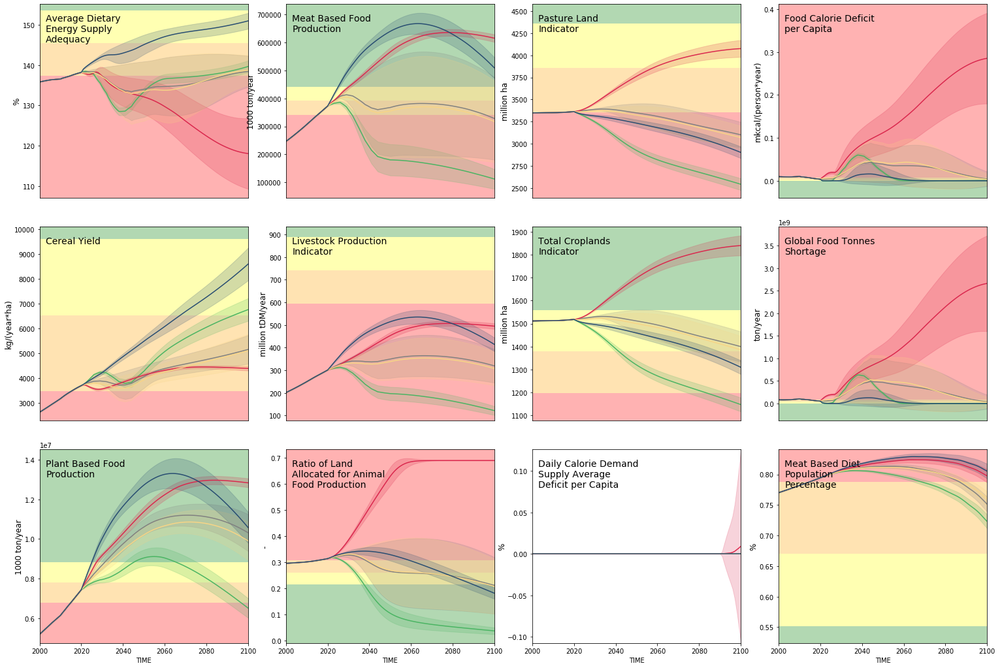

In [226]:
# Flatten 2D arrays in outcomes[indicator] to 1D array and create a long-format dataframe for plotting the uncertainty
# Why we convert outcomes to long-format dataframe? because it's the accepted format of sns.lineplot which draws uncertainty
from textwrap import wrap
import math


# Specify what SDG number are your plotting. 
SDG_number = '2'
outcomes_dict = {}

for i in scenarios:
    outcomes_df = pd.DataFrame(columns=(['TIME']+indicator_list))
    for key in (['TIME']+indicator_list): 
        outcomes_df[key] = outcomes[i][key][:, 100:].ravel()
    outcomes_dict[i] = outcomes_df

# The plots will be in 4 column and a certain number of rows, depending on the number of indicators
fig_rows = math.ceil(len(sdg_inds[SDG_number])/4)
fig_cols = 4

fig, axes = plt.subplots(fig_rows, fig_cols, figsize=(26, 18), sharex='col')
fig.subplots_adjust(hspace=0.15, wspace=0.18)

i = 0
j = 0
for v, var in enumerate(sdg_inds[SDG_number]):
    if i == fig_rows:
        i = 0
        j += 1
    for s, sc in enumerate(scenarios):
        sns.lineplot(x='TIME', y=var, ci='sd', data=outcomes_dict[sc], ax=axes[i,j], marker='',color=sc_colors[sc])
    #axes[i,j].legend().set_visible(False)
    axes[i,j].set_ylabel(inds_unit[var], size=12, labelpad=2)
    axes[i,j].annotate('\n'.join(wrap(var, 20)), size= 14, xy=(0.03, .95), xycoords='axes fraction', ha='left', va='top')
    
    # For indicators wehre reduction in value is desired
    if targets[var][1] < targets[var][3]:
        # This if statement is to fix the y axis limit, in case the green and red targets are above and bellow the axis y limits, respectively.
        # Thus helps to have at least a narrow area for green and red targets, even if the results are not observed in those areas.
        if targets[var][1] < axes[i,j].get_ylim()[0]:
            y_min = targets[var][1]- targets[var][1]*.05
        else:
            y_min = axes[i,j].get_ylim()[0]
        if targets[var][3] > axes[i,j].get_ylim()[1]:
            y_max = targets[var][3] + targets[var][3]*.05
        else:
            y_max = axes[i,j].get_ylim()[1]
        axes[i,j].axhspan(y_min, targets[var][1], facecolor='green', alpha=0.3, zorder=-100)
        axes[i,j].axhspan(targets[var][1], targets[var][2], facecolor='yellow', alpha=0.3, zorder=-100)
        axes[i,j].axhspan(targets[var][2], targets[var][3], facecolor='orange', alpha=0.3, zorder=-100)
        axes[i,j].axhspan(targets[var][3], y_max, facecolor='red', alpha=0.3, zorder=-100)
    
    # For indicators where increase in value is desired
    if targets[var][1] > targets[var][3]:     
        # This if statement is to fix the y axis limit, in case the green and red targets are above and bellow the axis y limits, respectively.
        # Thus helps to have at least a narrow area for green and red targets, even if the results are not observed in those areas.
        if targets[var][1] > axes[i,j].get_ylim()[1]:
            y_max = targets[var][1] + targets[var][1]*.05
        else:
            y_max = axes[i,j].get_ylim()[1]
            
        if targets[var][3] < axes[i,j].get_ylim()[0]:
            y_min = targets[var][3] - targets[var][3]*.05
        else:
            y_min = axes[i,j].get_ylim()[0]
        axes[i,j].axhspan(targets[var][1], y_max, facecolor='green', alpha=0.3, zorder=-100)
        axes[i,j].axhspan(targets[var][2], targets[var][1], facecolor='yellow', alpha=0.3, zorder=-100)
        axes[i,j].axhspan(targets[var][3], targets[var][2], facecolor='orange', alpha=0.3, zorder=-100)
        axes[i,j].axhspan(y_min, targets[var][3], facecolor='red', alpha=0.3, zorder=-100)

    # Remove the whitespace at the beginning and end of  x and y axes
    axes[i,j].margins(x=0)
    axes[i,j].margins(y=0)
  
    i += 1
    

# Removing ticks for inner plots                
for i in range(fig_rows-1):
    for j in range(fig_cols):
        axes[i, j].tick_params(bottom=False)


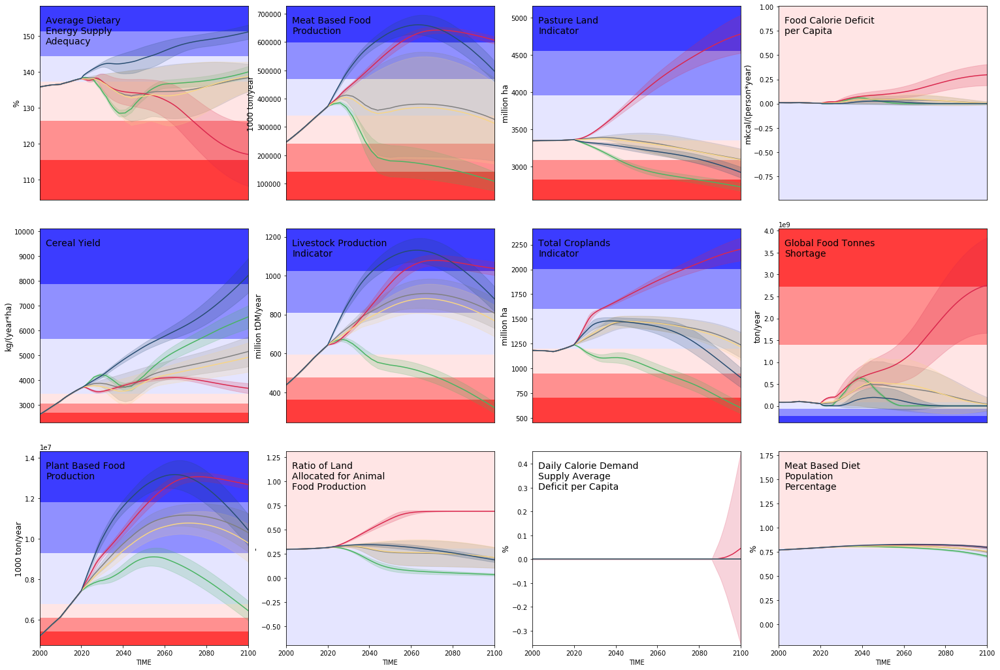

In [154]:
# Flatten 2D arrays in outcomes[indicator] to 1D array and create a long-format dataframe for plotting the uncertainty
# Why we convert outcomes to long-format dataframe? because it's the accepted format of sns.lineplot which draws uncertainty
from textwrap import wrap
import math


# Specify what SDG number are your plotting. 
SDG_number = '2'
outcomes_dict = {}

for i in scenarios:
    outcomes_df = pd.DataFrame(columns=(['TIME']+indicator_list))
    for key in (['TIME']+indicator_list): 
        outcomes_df[key] = outcomes[i][key][:, 100:].ravel()
    outcomes_dict[i] = outcomes_df

# The plots will be in 4 column and a certain number of rows, depending on the number of indicators
fig_rows = math.ceil(len(sdg_inds[SDG_number])/4)
fig_cols = 4

fig, axes = plt.subplots(fig_rows, fig_cols, figsize=(26, 18), sharex='col')
fig.subplots_adjust(hspace=0.15, wspace=0.18)

i = 0
j = 0
for v, var in enumerate(sdg_inds[SDG_number]):
    if i == fig_rows:
        i = 0
        j += 1
    for s, sc in enumerate(scenarios):
        sns.lineplot(x='TIME', y=var, ci='sd', data=outcomes_dict[sc], ax=axes[i,j], marker='',color=sc_colors[sc])
    #axes[i,j].legend().set_visible(False)
    axes[i,j].set_ylabel(inds_unit[var], size=12, labelpad=2)
    axes[i,j].annotate('\n'.join(wrap(var, 20)), size= 14, xy=(0.03, .95), xycoords='axes fraction', ha='left', va='top')
    
    # For indicators wehre reduction in value is desired
    if targets[var][1] < targets[var][3]:      
        # This if statement is to fix the y axis limit, in case the green and red targets are above and bellow the axis y limits, respectively.
        # Thus helps to have at least a narrow area for green and red targets, even if the results are not observed in those areas.
        if targets[var][1] < axes[i,j].get_ylim()[0]:
            y_min = targets[var][1]- targets[var][1]*.05
        else:
            y_min = axes[i,j].get_ylim()[0]
        if targets[var][3] > axes[i,j].get_ylim()[1]:
            y_max = targets[var][3] + targets[var][3]*.05
        else:
            y_max = axes[i,j].get_ylim()[1]      
        # Create improvement (increase or decrease) increment from the red threshold (which in most case except 
        # is model reference value in 2015. For the exception, see the blue rows in the ScenarioFramework target spreadsheets. 
        # The size of increments is defined based the number of incremenets, the size will differ for each variable based on the distance between y_max (or y_min) and the red threshold
        incr_number = 3
        incr_up = math.ceil((y_max - targets[var][3])/incr_number)
        incr_down = math.ceil((targets[var][3] - y_min)/incr_number)
        for c in range(incr_number):
            if (targets[var][3]-incr_down*c) > y_min:
                axes[i,j].axhspan(targets[var][3]-incr_down*c, targets[var][3]-incr_down*(c+1), facecolor='blue', alpha=0.1+(c/incr_number), zorder=-100)
            if (targets[var][3]+incr_up*c) < y_max:
                axes[i,j].axhspan(targets[var][3]+incr_up*c, targets[var][3]+incr_up*(c+1), facecolor='red', alpha=0.1+(c/incr_number), zorder=-100)

    
    # For indicators where increase in value is desired
    if targets[var][1] > targets[var][3]:     
        # This if statement is to fix the y axis limit, in case the green and red targets are above and bellow the axis y limits, respectively.
        # Thus helps to have at least a narrow area for green and red targets, even if the results are not observed in those areas.
        if targets[var][1] > axes[i,j].get_ylim()[1]:
            y_max = targets[var][1] + targets[var][1]*.05
        else:
            y_max = axes[i,j].get_ylim()[1]
            
        if targets[var][3] < axes[i,j].get_ylim()[0]:
            y_min = targets[var][3] - targets[var][3]*.05
        else:
            y_min = axes[i,j].get_ylim()[0]
        # Create improvement (increase or decrease) increment from the red threshold (which in most case except 
        # is model reference value in 2015. For the exception, see the blue rows in the ScenarioFramework target spreadsheets. 
        # The size of increments is defined based the number of incremenets, the size will differ for each variable based on the distance between y_max (or y_min) and the red threshold
        incr_number = 3
        incr_up = math.ceil((y_max - targets[var][3])/incr_number)
        incr_down = math.ceil((targets[var][3] - y_min)/incr_number)
        for c in range(incr_number):
            if (targets[var][3]+incr_up*c) < y_max:
                axes[i,j].axhspan(targets[var][3]+incr_up*c, targets[var][3]+incr_up*(c+1), facecolor='blue', alpha=0.1+(c/incr_number), zorder=-100)
            if (targets[var][3]-incr_down*c) > y_min:
                axes[i,j].axhspan(targets[var][3]-incr_down*c, targets[var][3]-incr_down*(c+1), facecolor='red', alpha=0.1+(c/incr_number), zorder=-100)
    
    # Remove the whitespace at the beginning and end of  x and y axes
    axes[i,j].margins(x=0)
    axes[i,j].margins(y=0)
  
    i += 1
    

# Removing ticks for inner plots                
for i in range(fig_rows-1):
    for j in range(fig_cols):
        axes[i, j].tick_params(bottom=False)


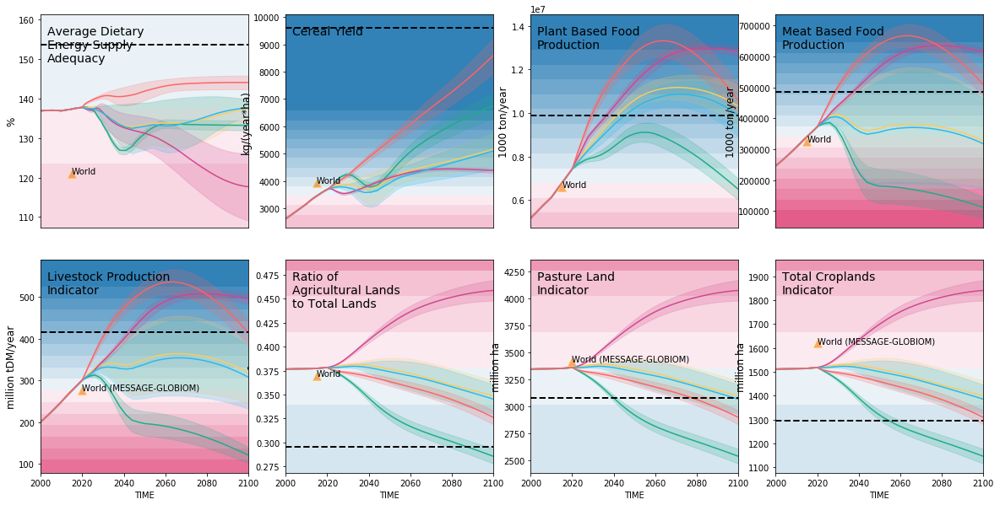

In [46]:
# Flatten 2D arrays in outcomes[indicator] to 1D array and create a long-format dataframe for plotting the uncertainty
# Why we convert outcomes to long-format dataframe? because it's the accepted format of sns.lineplot which draws uncertainty
from textwrap import wrap
import math


# Specify what SDG number are your plotting. 
SDG_number = '2'
outcomes_dict = {}

for i in scenarios:
    outcomes_df = pd.DataFrame(columns=(['TIME']+indicator_list))
    for key in (['TIME']+indicator_list): 
        outcomes_df[key] = outcomes[i][key][:, 100:].ravel()
    outcomes_dict[i] = outcomes_df

# The plots will be in 4 column and a certain number of rows, depending on the number of indicators
fig_rows = 2
fig_cols = 4

fig, axes = plt.subplots(fig_rows, fig_cols, figsize=(20, 10), sharex='col')
fig.subplots_adjust(hspace=0.15, wspace=0.18)

i = 0
j = 0
for v, var in enumerate(sdg_inds[SDG_number]):
    if var in indicator_list:
        if j == fig_cols:
            j = 0
            i += 1
        for s, sc in enumerate(scenarios):
            sns.lineplot(x='TIME', y=var, ci='sd', data=outcomes_dict[sc], ax=axes[i,j], marker='',color=sc_colors[sc])
        #axes[i,j].legend().set_visible(False)
        axes[i,j].set_ylabel(inds_unit[var], size=12, labelpad=2)
        axes[i,j].annotate('\n'.join(wrap(var, 20)), size= 14, xy=(0.03, .95), xycoords='axes fraction', ha='left', va='top')

        # Create 10% improvement (increase or decrease) increment from the red threshold (which in most case except 
        # is model reference value in 2015. For the exception, see the blue rows in the ScenarioFramework target spreadsheets.
        improv_incr = targets[var][3]*.1
        # For indicators wehre reduction in value is desired
        if targets[var][1] < targets[var][3]:
            # This if statement is to fix the y axis limit, in case the green and red targets are above and bellow the axis y limits, respectively.
            # Thus helps to have at least a narrow area for green and red targets, even if the results are not observed in those areas.
            if targets[var][1] < axes[i,j].get_ylim()[0]:
                y_min = targets[var][1]- targets[var][1]*.05
            else:
                y_min = axes[i,j].get_ylim()[0]
            if targets[var][3] > axes[i,j].get_ylim()[1]:
                y_max = targets[var][3] + targets[var][3]*.05
            else:
                y_max = axes[i,j].get_ylim()[1]
            for c in range(10):
                if (targets[var][3]-improv_incr*(c+1)) > y_min:
                    axes[i,j].axhspan(targets[var][3]-improv_incr*(c+1), targets[var][3]-improv_incr*(c), facecolor='#3282b8', alpha=0.1+(0.1*c), zorder=-100)
                    x = c
            axes[i,j].axhspan(y_min, targets[var][3]-improv_incr*(x+1), facecolor='#3282b8', alpha=0.1+(0.1*x), zorder=-100)
            for c in range(10):
                if (targets[var][3]+improv_incr*c) < y_max:
                    axes[i,j].axhspan(targets[var][3]+improv_incr*c, targets[var][3]+improv_incr*(c+1), facecolor='#dd356e', alpha=0.1+(0.1*c), zorder=-100)
                    x = c
            axes[i,j].axhspan(targets[var][3]+improv_incr*(x+1), y_max, facecolor='#dd356e', alpha=0.1+(0.1*x), zorder=-100)

        # For indicators where increase in value is desired
        if targets[var][1] > targets[var][3]:         
            # This if statement is to fix the y axis limit, in case the green and red targets are above and bellow the axis y limits, respectively.
            # Thus helps to have at least a narrow area for green and red targets, even if the results are not observed in those areas.
            if targets[var][1] > axes[i,j].get_ylim()[1]:
                y_max = targets[var][1] + targets[var][1]*.05
            else:
                y_max = axes[i,j].get_ylim()[1]

            if targets[var][3] < axes[i,j].get_ylim()[0]:
                y_min = targets[var][3] - targets[var][3]*.05
            else:
                y_min = axes[i,j].get_ylim()[0]
            for c in range(10):
                if (targets[var][3]+improv_incr*(c+1)) < y_max:
                    axes[i,j].axhspan(targets[var][3]+improv_incr*c, targets[var][3]+improv_incr*(c+1), facecolor='#3282b8', alpha=0.1+(0.1*c), zorder=-100)
                    x = c
            axes[i,j].axhspan(targets[var][3]+improv_incr*(x+1), y_max, facecolor='#3282b8', alpha=0.1+(0.1*x), zorder=-100)
            for c in range(10):
                if (targets[var][3]-improv_incr*(c+1)) > y_min:
                    axes[i,j].axhspan(targets[var][3]-improv_incr*(c+1), targets[var][3]-improv_incr*c, facecolor='#dd356e', alpha=0.1+(0.1*c), zorder=-100)
                    x = c
            axes[i,j].axhspan(y_min, targets[var][3]-improv_incr*(x+1), facecolor='#dd356e', alpha=0.1+(0.1*x), zorder=-100)

        # Remove the whitespace at the beginning and end of  x and y axes
        axes[i,j].margins(x=0)
        axes[i,j].margins(y=0)

        axes[i,j].axhline(targets[var][1], ls='--', lw=2, color='black')

        j += 1
    

# Removing ticks for inner plots                
for i in range(fig_rows-1):
    for j in range(fig_cols):
        axes[i, j].tick_params(bottom=False)

i = 0
j = 0
for v, var in enumerate(sdg_inds[SDG_number]):
    if var in indicator_list:
        if j == fig_cols:
            j = 0
            i += 1
        if var in df_ind1['Target indicator'].to_list():
            var_indx = df_hist.index[df_hist['Target indicator'] == var]
            #data_region = [df_hist['World/region/country'].loc[var_indx].item()]
            data_year = [df_hist['Data reference year'].loc[var_indx].item()]
            data_value = [df_hist['Data reference value'].loc[var_indx].item()]
            axes[i,j].plot(data_year, data_value, linestyle="None", marker='^', alpha=0.5, markersize=10,  
                           markeredgecolor='#ffdd00',color='#f75f00')
            axes[i,j].annotate(df_hist['Scale'].loc[var_indx].item(), (data_year[0], data_value[0]))
        j += 1

plt.savefig('{}/SSPs_SDGs_timeseries_300dpi.png'.format(r'C:/Users/moallemie/EM_analysis/Fig/'), dpi=300,  bbox_inches='tight') 


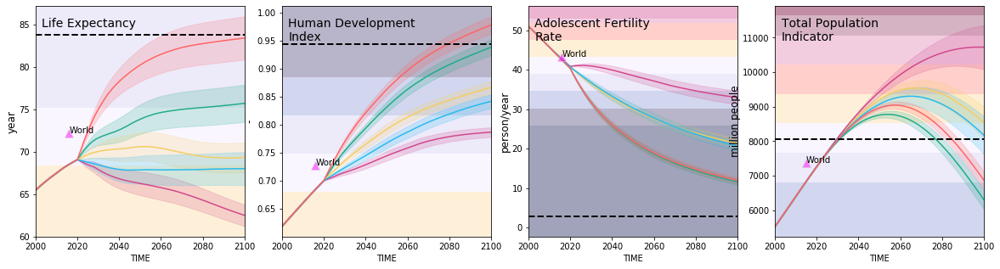

In [64]:
# Flatten 2D arrays in outcomes[indicator] to 1D array and create a long-format dataframe for plotting the uncertainty
# Why we convert outcomes to long-format dataframe? because it's the accepted format of sns.lineplot which draws uncertainty
from textwrap import wrap
import math


# Specify what SDG number are your plotting. 
SDG_number = '3'
outcomes_dict = {}

for i in scenarios:
    outcomes_df = pd.DataFrame(columns=(['TIME']+indicator_list))
    for key in (['TIME']+indicator_list): 
        outcomes_df[key] = outcomes[i][key][:, 100:].ravel()
    outcomes_dict[i] = outcomes_df

# The plots will be in 4 column and a certain number of rows, depending on the number of indicators
fig_rows = 1
fig_cols = 4

fig, axes = plt.subplots(fig_rows, fig_cols, figsize=(20, 5))
fig.subplots_adjust(hspace=0.15, wspace=0.18)

i = 0
for v, var in enumerate(sdg_inds[SDG_number]):
    if var in indicator_list:
        for s, sc in enumerate(scenarios):
            sns.lineplot(x='TIME', y=var, ci='sd', data=outcomes_dict[sc], ax=axes[i], marker='',color=sc_colors[sc])
        #axes[i,j].legend().set_visible(False)
        axes[i].set_ylabel(inds_unit[var], size=12, labelpad=2)
        axes[i].annotate('\n'.join(wrap(var, 20)), size= 14, xy=(0.03, .95), xycoords='axes fraction', ha='left', va='top')

        # Create 10% improvement (increase or decrease) increment from the red threshold (which in most case except 
        # is model reference value in 2015. For the exception, see the blue rows in the ScenarioFramework target spreadsheets.
        improv_incr = targets[var][3]*.1
        
        # For indicators wehre reduction in value is desired
        if targets[var][1] < targets[var][3]:
            # This if statement is to fix the y axis limit, in case the green and red targets are above and bellow the axis y limits, respectively.
            # Thus helps to have at least a narrow area for green and red targets, even if the results are not observed in those areas.
            if targets[var][1] < axes[i].get_ylim()[0]:
                y_min = targets[var][1]- targets[var][1]*.05
                # This line is only to avoid the sdg target line to appear very close to the x axis of the plot. The value is the green target value of the inteneded Variable.
                if targets[var][1] < 3:
                    y_min = - targets[var][2]*.1
            else:
                y_min = axes[i].get_ylim()[0]
            if targets[var][3] > axes[i].get_ylim()[1]:
                y_max = targets[var][3] + targets[var][3]*.05
            else:
                y_max = axes[i].get_ylim()[1]
            for c in range(5):
                if (targets[var][3]-improv_incr*(c+1)) > y_min:
                    axes[i].axhspan(targets[var][3]-improv_incr*(c+1), targets[var][3]-improv_incr*(c), facecolor=incrs_colors[c], alpha=.5, zorder=-100)
                    x = c
            axes[i].axhspan(y_min, targets[var][3]-improv_incr*(x+1), facecolor=incrs_colors[x], alpha=.5, zorder=-100)
            for c in range(5):
                if (targets[var][3]+improv_incr*c) < y_max:
                    axes[i].axhspan(targets[var][3]+improv_incr*c, targets[var][3]+improv_incr*(c+1), facecolor=decrs_colors[c], alpha=.5, zorder=-100)
                    x = c
            axes[i].axhspan(targets[var][3]+improv_incr*(x+1), y_max, facecolor=decrs_colors[x], alpha=.5, zorder=-100)

        # For indicators where increase in value is desired
        if targets[var][1] > targets[var][3]:         
            # This if statement is to fix the y axis limit, in case the green and red targets are above and bellow the axis y limits, respectively.
            # Thus helps to have at least a narrow area for green and red targets, even if the results are not observed in those areas.
            if targets[var][1] > axes[i].get_ylim()[1]:
                y_max = targets[var][1] + targets[var][1]*.05
            else:
                y_max = axes[i].get_ylim()[1]

            if targets[var][3] < axes[i].get_ylim()[0]:
                y_min = targets[var][3] - targets[var][3]*.05
            else:
                y_min = axes[i].get_ylim()[0]
            for c in range(5):
                if (targets[var][3]+improv_incr*(c+1)) < y_max:
                    axes[i].axhspan(targets[var][3]+improv_incr*c, targets[var][3]+improv_incr*(c+1), facecolor=incrs_colors[c], alpha=.5, zorder=-100)
                    x = c
            axes[i].axhspan(targets[var][3]+improv_incr*(x+1), y_max, facecolor=incrs_colors[x], alpha=.5, zorder=-100)
            for c in range(5):
                if (targets[var][3]-improv_incr*(c+1)) > y_min:
                    axes[i].axhspan(targets[var][3]-improv_incr*(c+1), targets[var][3]-improv_incr*c, facecolor=decrs_colors[c], alpha=.5, zorder=-100)
                    x = c
            axes[i].axhspan(y_min, targets[var][3]-improv_incr*(x+1), facecolor=decrs_colors[x], alpha=.5, zorder=-100)

        # Remove the whitespace at the beginning and end of  x and y axes
        axes[i].margins(x=0)
        axes[i].margins(y=0)

        axes[i].axhline(targets[var][1], ls='--', lw=2, color='black')

        i += 1
    

# Removing ticks for inner plots                
for i in range(fig_rows-1):
    for j in range(fig_cols):
        axes[i, j].tick_params(bottom=False)

i = 0
for v, var in enumerate(sdg_inds[SDG_number]):
    if var in indicator_list:
        if var in df_ind1['Target indicator'].to_list():
            var_indx = df_hist.index[df_hist['Target indicator'] == var]
            #data_region = [df_hist['World/region/country'].loc[var_indx].item()]
            data_year = [df_hist['Data reference year'].loc[var_indx].item()]
            data_value = [df_hist['Data reference value'].loc[var_indx].item()]
            axes[i].plot(data_year, data_value, linestyle="None", marker='^', alpha=0.5, markersize=10,  
                           markeredgecolor='lightgrey',color='fuchsia')
            axes[i].annotate(df_hist['Scale'].loc[var_indx].item(), (data_year[0], data_value[0]))
        i += 1

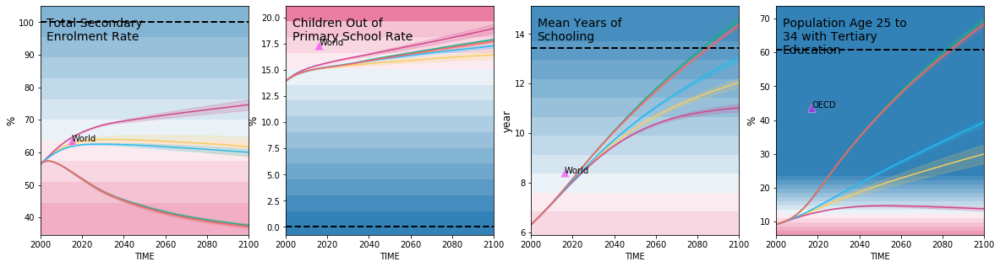

In [39]:
# Flatten 2D arrays in outcomes[indicator] to 1D array and create a long-format dataframe for plotting the uncertainty
# Why we convert outcomes to long-format dataframe? because it's the accepted format of sns.lineplot which draws uncertainty
from textwrap import wrap
import math


# Specify what SDG number are your plotting. 
SDG_number = '4'
outcomes_dict = {}

for i in scenarios:
    outcomes_df = pd.DataFrame(columns=(['TIME']+indicator_list))
    for key in (['TIME']+indicator_list): 
        outcomes_df[key] = outcomes[i][key][:, 100:].ravel()
    outcomes_dict[i] = outcomes_df

# The plots will be in 4 column and a certain number of rows, depending on the number of indicators
fig_rows = 1
fig_cols = 4

fig, axes = plt.subplots(fig_rows, fig_cols, figsize=(20, 5))
fig.subplots_adjust(hspace=0.15, wspace=0.18)

i = 0
for v, var in enumerate(sdg_inds[SDG_number]):
    if var in indicator_list:
        for s, sc in enumerate(scenarios):
            sns.lineplot(x='TIME', y=var, ci='sd', data=outcomes_dict[sc], ax=axes[i], marker='',color=sc_colors[sc])
        #axes[i,j].legend().set_visible(False)
        axes[i].set_ylabel(inds_unit[var], size=12, labelpad=2)
        axes[i].annotate('\n'.join(wrap(var, 20)), size= 14, xy=(0.03, .95), xycoords='axes fraction', ha='left', va='top')

        # Create 10% improvement (increase or decrease) increment from the red threshold (which in most case except 
        # is model reference value in 2015. For the exception, see the blue rows in the ScenarioFramework target spreadsheets.
        improv_incr = targets[var][3]*.1
        # For indicators wehre reduction in value is desired
        if targets[var][1] < targets[var][3]:
            # This if statement is to fix the y axis limit, in case the green and red targets are above and bellow the axis y limits, respectively.
            # Thus helps to have at least a narrow area for green and red targets, even if the results are not observed in those areas.
            if targets[var][1] < axes[i].get_ylim()[0]:
                y_min = targets[var][1]- targets[var][1]*.05
                # This line is only to avoid the sdg target line to appear very close to the x axis of the plot. The value is the green target value of the inteneded Variable.
                if targets[var][1] == 0:
                    y_min = - targets[var][2]*.1
            else:
                y_min = axes[i].get_ylim()[0]
            if targets[var][3] > axes[i].get_ylim()[1]:
                y_max = targets[var][3] + targets[var][3]*.05
            else:
                y_max = axes[i].get_ylim()[1]
            for c in range(10):
                if (targets[var][3]-improv_incr*(c+1)) > y_min:
                    axes[i].axhspan(targets[var][3]-improv_incr*(c+1), targets[var][3]-improv_incr*(c), facecolor='#3282b8', alpha=0.1+(0.1*c), zorder=-100)
                    x = c
            axes[i].axhspan(y_min, targets[var][3]-improv_incr*(x+1), facecolor='#3282b8', alpha=0.1+(0.1*x), zorder=-100)
            for c in range(10):
                if (targets[var][3]+improv_incr*c) < y_max:
                    axes[i].axhspan(targets[var][3]+improv_incr*c, targets[var][3]+improv_incr*(c+1), facecolor='#dd356e', alpha=0.1+(0.1*c), zorder=-100)
                    x = c
            axes[i].axhspan(targets[var][3]+improv_incr*(x+1), y_max, facecolor='#dd356e', alpha=0.1+(0.1*x), zorder=-100)

        # For indicators where increase in value is desired
        if targets[var][1] > targets[var][3]:         
            # This if statement is to fix the y axis limit, in case the green and red targets are above and bellow the axis y limits, respectively.
            # Thus helps to have at least a narrow area for green and red targets, even if the results are not observed in those areas.
            if targets[var][1] > axes[i].get_ylim()[1]:
                y_max = targets[var][1] + targets[var][1]*.05
            else:
                y_max = axes[i].get_ylim()[1]

            if targets[var][3] < axes[i].get_ylim()[0]:
                y_min = targets[var][3] - targets[var][3]*.05
            else:
                y_min = axes[i].get_ylim()[0]
            for c in range(10):
                if (targets[var][3]+improv_incr*(c+1)) < y_max:
                    axes[i].axhspan(targets[var][3]+improv_incr*c, targets[var][3]+improv_incr*(c+1), facecolor='#3282b8', alpha=0.1+(0.1*c), zorder=-100)
                    x = c
            axes[i].axhspan(targets[var][3]+improv_incr*(x+1), y_max, facecolor='#3282b8', alpha=0.1+(0.1*x), zorder=-100)
            for c in range(10):
                if (targets[var][3]-improv_incr*(c+1)) > y_min:
                    axes[i].axhspan(targets[var][3]-improv_incr*(c+1), targets[var][3]-improv_incr*c, facecolor='#dd356e', alpha=0.1+(0.1*c), zorder=-100)
                    x = c
            axes[i].axhspan(y_min, targets[var][3]-improv_incr*(x+1), facecolor='#dd356e', alpha=0.1+(0.1*x), zorder=-100)

        # Remove the whitespace at the beginning and end of  x and y axes
        axes[i].margins(x=0)
        axes[i].margins(y=0)

        axes[i].axhline(targets[var][1], ls='--', lw=2, color='black')

        i += 1
    

# Removing ticks for inner plots                
for i in range(fig_rows-1):
    for j in range(fig_cols):
        axes[i, j].tick_params(bottom=False)

i = 0
for v, var in enumerate(sdg_inds[SDG_number]):
    if var in indicator_list:
        if var in df_ind1['Target indicator'].to_list():
            var_indx = df_hist.index[df_hist['Target indicator'] == var]
            #data_region = [df_hist['World/region/country'].loc[var_indx].item()]
            data_year = [df_hist['Data reference year'].loc[var_indx].item()]
            data_value = [df_hist['Data reference value'].loc[var_indx].item()]
            axes[i].plot(data_year, data_value, linestyle="None", marker='^', alpha=0.5, markersize=10,  
                           markeredgecolor='lightgrey',color='fuchsia')
            axes[i].annotate(df_hist['Scale'].loc[var_indx].item(), (data_year[0], data_value[0]))
        i += 1

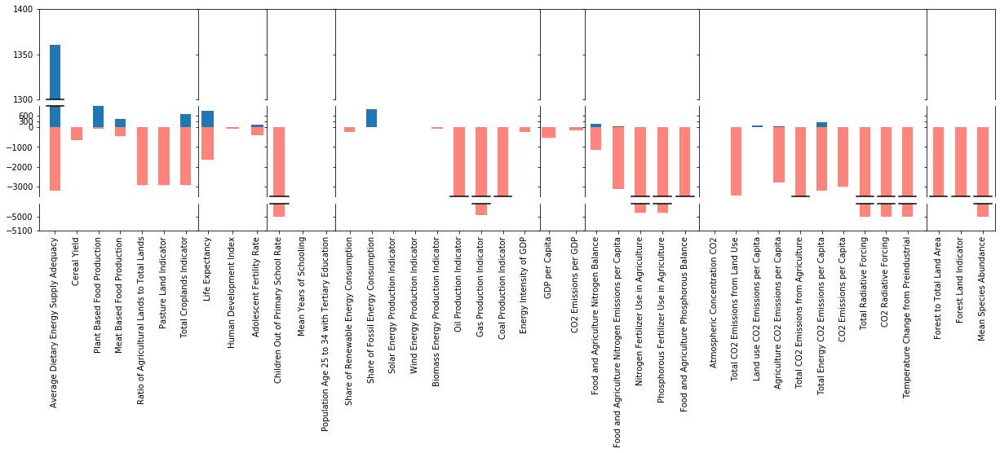

In [425]:
import matplotlib.patches as patches

# Identify per each indicators, how many futures meet the ambitious target.
# In each column of each SSP normalised outcomes, count values beyond or equal to 100. 
#Record the count in dataframe. Each row is for one SSP.
df_count = {}
df_count['positive'] = pd.DataFrame(index=scenarios, columns=indicator_list)
df_count['negative'] = pd.DataFrame(index=scenarios, columns=indicator_list)

for s, sc in enumerate(scenarios):
    for i, ind in enumerate(indicator_list):
        df_count['positive'].loc[sc][ind] = outcomes_norm[sc][outcomes_norm[sc][ind] > 100].count()[ind]
        df_count['negative'].loc[sc][ind] = outcomes_norm[sc][outcomes_norm[sc][ind] <= 0].count()[ind]

# Combine the values > 100 and < 0 across the SSPs and save them in a new dataframe 2.
df_sum = {}
df_sum['positive'] = pd.DataFrame(columns=indicator_list)
df_sum['negative'] = pd.DataFrame(columns=indicator_list)
for i, ind in enumerate(indicator_list):
    df_sum['positive'][ind] = [df_count['positive'][ind].sum()]
    df_sum['negative'][ind] = [-df_count['negative'][ind].sum()]
    

def add_value_labels(ax, spacing=5):
    """Add labels to the end of each bar in a bar chart.

    Arguments:
        ax (matplotlib.axes.Axes): The matplotlib object containing the axes
            of the plot to annotate.
        spacing (int): The distance between the labels and the bars.
    """

    # For each bar: Place a label
    for rect in ax.patches:
        # Get X and Y placement of label from rect.
        y_value = int(rect.get_height())
        x_value = rect.get_x() + rect.get_width() / 2

        # Number of points between bar and label. Change to your liking.
        space = spacing
        # Vertical alignment for positive values
        va = 'bottom'

        # If value of bar is negative: Place label below bar
        if y_value < 0:
            # Invert space to place label below
            space *= -1
            # Vertically align label at top
            va = 'top'

        # Use Y value as label and format number with one decimal place
        label = "{:.1f}".format(y_value)

        # Create annotation
        ax.annotate(
            label,                      # Use `label` as label
            (x_value, y_value),         # Place label at end of the bar
            xytext=(0, space),          # Vertically shift label by `space`
            textcoords="offset points", # Interpret `xytext` as offset in points
            ha='center',                # Horizontally center label
            va=va)                      # Vertically align label differently for
                                        # positive and negative values.

# Draw the bar chart for the combined value.
fig, axes = plt.subplots(3, 8, figsize=(21, 5), sharex='col', sharey='row', 
                         gridspec_kw={'width_ratios': [7,3,3,9,2,5,10,3], 'height_ratios':[1,1,.3]})
fig.subplots_adjust(hspace=0, wspace=0)

for g, sdg in enumerate(['2', '3', '4', '7', '8', '12','13', '15']):
    x = sdg_inds[sdg]
    y_positive = []
    y_negative = []
    for i, ind in enumerate(sdg_inds[sdg]):
        y_positive.append(df_sum['positive'][ind][0])
        y_negative.append(df_sum['negative'][ind][0])
    
    bsp = 1062
    tsp = 1300
    bsn = -3500
    tsn = -4900

    for yp in [0,1]:
        axes[yp,g].spines['bottom'].set_visible(False)
        axes[yp,g].tick_params(axis='x',which='both',bottom=False)
    for yp in [1,2]:
        axes[yp,g].spines['top'].set_visible(False)
    axes[1, g].set_ylim(bsn,bsp)
    axes[0, g].set_ylim(tsp,1400)
    axes[2, g].set_ylim(-5100, tsn)


    bars1_p = axes[0, g].bar(x=x, height=y_positive, width=.5)
    bars2_p = axes[1, g].bar(x=x, height=y_positive, width=.5)
    bars1_n = axes[1, g].bar(x=x, height=y_negative, width=.5, color='#ff847c')
    bars2_n = axes[2, g].bar(x=x, height=y_negative, width=.5, color='#ff847c')
    
    for k in range(3):
        axes[k, g].tick_params(axis='x', rotation=90)

    plt.subplots_adjust(hspace=0.1)


    d = .1  # how big to make the diagonal lines in axes coordinates
    '''kwargs = dict(transform=axes[0, g].transAxes, color='k', clip_on=False)
    axes[0, g].plot((-d, +d), (-d, +d), **kwargs)      # top-left diagonal
    axes[0, g].plot((1 - d, 1 + d), (-d, +d), **kwargs) # bottom-left diagona
    kwargs.update(transform=axes[1, g].transAxes)  
    axes[1, g].plot((-d, +d), (1 - d, 1 + d), **kwargs)  # top-right diagonal
    axes[1, g].plot((1 - d, 1 + d), (1 - d, 1 + d), **kwargs) # bottom-right diagonal'''

    
    for b1, b2 in zip(bars1_p, bars2_p):
        posx = b2.get_x() + b2.get_width()/2.
        if b2.get_height() > bsp:
            axes[1, g].plot((posx-4*d, posx+4*d), (1 , 1), color='k', clip_on=False,
                     transform=axes[1, g].get_xaxis_transform())
            
        if b1.get_height() > tsp:
            axes[0, g].plot((posx-4*d, posx+4*d), (0, 0), color='k', clip_on=False,
                     transform=axes[0, g].get_xaxis_transform())
            
    for b1, b2 in zip(bars1_n, bars2_n):
        posx = b2.get_x() + b2.get_width()/2.
        if b2.get_height() < tsn:
            axes[2, g].plot((posx-4*d, posx+4*d), (1 , 1), color='k', clip_on=False,
                     transform=axes[2, g].get_xaxis_transform())
            
        if b1.get_height() < bsn:
            axes[1, g].plot((posx-4*d, posx+4*d), (0, 0), color='k', clip_on=False,
                     transform=axes[1, g].get_xaxis_transform())

    axes[1, g].tick_params(axis='x', rotation=90)
    #add_value_labels(axes[0,g])
    #add_value_labels(axes[1,g])
    #add_value_labels(axes[2,g])
    
    axes[0,g].set_yticks(np.arange(1300,1401,50))
    axes[2,g].set_yticks(np.arange(-5100,-4900,100))
    axes[1,g].set_yticks([-3000, -2000, -1000, 0, 300, 600])


In [21]:
#Create a dictionary of dataframes for the normalised value of outcomes in year 2030 in different scenarios
outcomes_norm = {}
for s, scenario in enumerate(scenarios):
    for y, year in enumerate(target_year):
        outcomes_norm[scenario] = pd.DataFrame(columns=indicator_list)
        for i, ind in enumerate(indicator_list):
            # 0 < Normalised value <+100 means towards the ambitious target 
            out_norm = ((outcomes[scenario][ind][:, year] - targets_2030[ind][0])/(targets_2030[ind][0]-targets_2030[ind][3]))*100
            # Normalised value >+100 means beyond the ambitious target, therefore replace it with 100
            out_norm[out_norm > 100] = 100
            # Normalised value <0 means below the current value target, therefore replace it with 0 
            out_norm[out_norm < 0] = 0
            outcomes_norm[scenario][ind] = out_norm

In [287]:
#Create a dictionary of dataframes for the normalised value of outcomes in year 2030 in different scenarios
outcomes_norm = {}
for s, scenario in enumerate(scenarios):
    for y, year in enumerate(target_year):
        outcomes_norm[scenario] = pd.DataFrame(columns=indicator_list)
        for i, ind in enumerate(indicator_list):
            out_norm = outcomes[scenario][ind][:, year]
            #For indicators where reduction in indicator value is desired
            if targets_2030[ind][0] < targets_2030[ind][3]:
                outcomes_norm[scenario][ind] = np.where(out_norm > targets_2030[ind][3],-(abs(out_norm - targets_2030[ind][3])/abs(targets_2030[ind][0]-targets_2030[ind][3]))*100, 
                                                        (abs(out_norm - targets_2030[ind][3])/abs(targets_2030[ind][0]-targets_2030[ind][3]))*100)
            if targets_2030[ind][0] > targets_2030[ind][3]:
                outcomes_norm[scenario][ind] = np.where(out_norm < targets_2030[ind][3],-(abs(out_norm - targets_2030[ind][3])/abs(targets_2030[ind][0]-targets_2030[ind][3]))*100, 
                                                        (abs(out_norm - targets_2030[ind][3])/abs(targets_2030[ind][0]-targets_2030[ind][3]))*100)


C:\ProgramData\Anaconda3\envs\python37\lib\site-packages\ipykernel_launcher.py:78: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


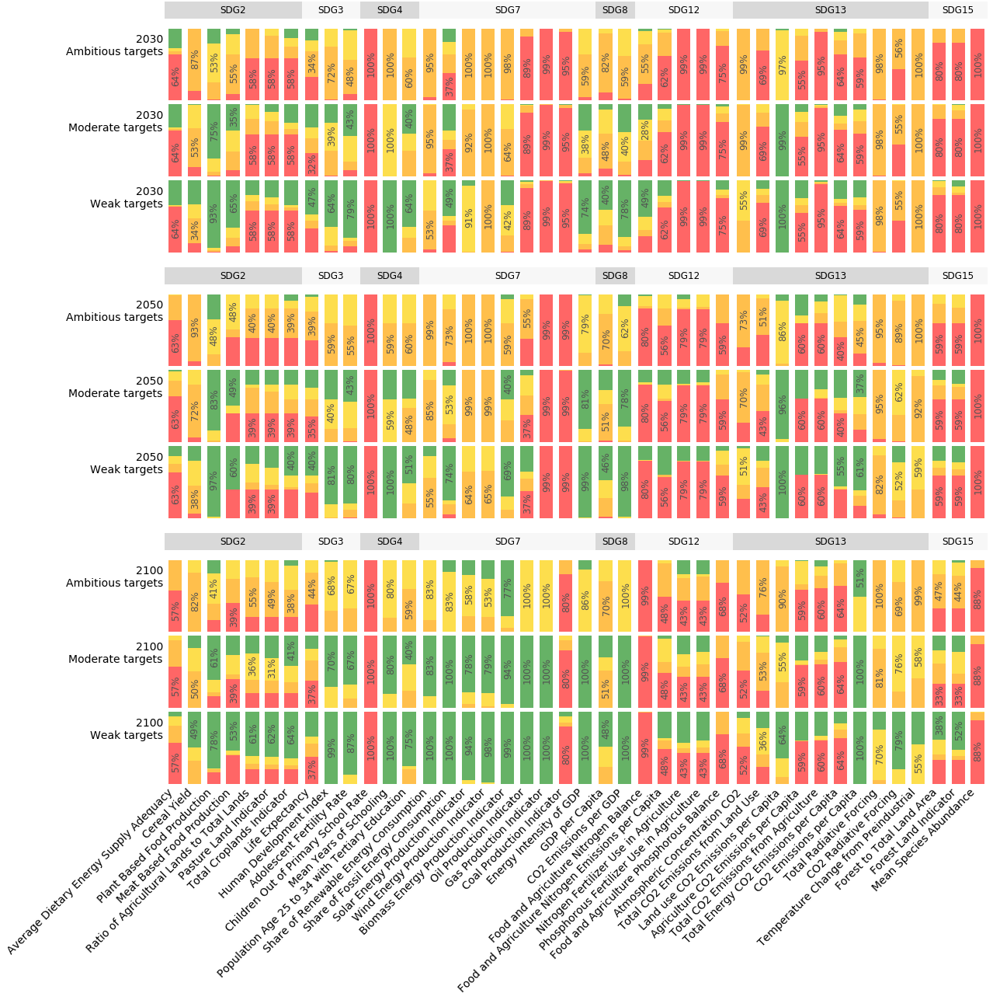

In [84]:
import matplotlib.patches as patches
from matplotlib.path import Path
from matplotlib.patches import BoxStyle

# this class expands any textboxes to the width size of the subplot. We used it for drawing the SDG boxes on the top
class ExtendedTextBox(BoxStyle._Base):
    """
    An Extended Text Box that expands to the axes limits 
                        if set in the middle of the axes
    """

    def __init__(self, pad=0.3, width=500.):
        """
        width: 
            width of the textbox. 
            Use `ax.get_window_extent().width` 
                   to get the width of the axes.
        pad: 
            amount of padding (in vertical direction only)
        """
        self.width=width
        self.pad = pad
        super(ExtendedTextBox, self).__init__()

    def transmute(self, x0, y0, width, height, mutation_size):
        """
        x0 and y0 are the lower left corner of original text box
        They are set automatically by matplotlib
        """
        # padding
        pad = mutation_size * self.pad

        # we add the padding only to the box height
        height = height + 2.*pad
        # boundary of the padded box
        y0 = y0 - pad
        y1 = y0 + height
        _x0 = x0
        x0 = _x0 +width /2. - self.width/2.
        x1 = _x0 +width /2. + self.width/2.

        cp = [(x0, y0),
              (x1, y0), (x1, y1), (x0, y1),
              (x0, y0)]

        com = [Path.MOVETO,
               Path.LINETO, Path.LINETO, Path.LINETO,
               Path.CLOSEPOLY]

        path = Path(cp, com)

        return path

dpi = 300

# register the custom style
BoxStyle._style_list["ext"] = ExtendedTextBox


target_year = {130:'2030', 150:'2050', 200:'2100'}


#Set the width ratio of subplots
width_ratios = [7,3,3,9,2,5,10,3]
fig = plt.figure(figsize=(19, 18))

grid = plt.GridSpec(14, 8, hspace=0.08, wspace=0, width_ratios= width_ratios, height_ratios= [.01,1,1,1,.4,.01,1,1,1,.4,.01,1,1,1])

all_targets = [targets_2030, targets_2050, targets_2100]

# We used GridSpec for creating subplots with shared axis because we have the SSP arrows subplot on the top of other subplots with differnet ratio.
axes = {}
#axes_arr = {}
for y, year in enumerate([130,150,200]):
    for r in range(1,4):
        axes[r+y*5,0] = fig.add_subplot(grid[r+y*5, 0])
    for c in range(8):
        axes[3+y*5,c] = fig.add_subplot(grid[3+y*5, c])
    for r in range(1,3):
        for c in range(1,8):
            axes[r+y*5,c] = fig.add_subplot(grid[r+y*5, c], sharex=axes[3+y*5,c], sharey=axes[r+y*5,0])

    #Create a dictionary of dataframes for the normalised value of outcomes in year 2030 
    #in different scenarios based on aambitious, moderate, and weak targets.
    for t in [0,1,2]:
        outcomes_norm = {}
        for s, scenario in enumerate(scenarios):
            outcomes_norm[scenario] = pd.DataFrame(columns=indicator_list)
            for i, ind in enumerate(indicator_list):
                out_norm = outcomes[scenario][ind][:, year]
                #For indicators where reduction in indicator value is desired
                if all_targets[y][ind][t] < all_targets[y][ind][3]:
                    outcomes_norm[scenario][ind] = np.where(out_norm > all_targets[y][ind][3],
                                                            -(abs(out_norm - all_targets[y][ind][3])/abs(all_targets[y][ind][t]-all_targets[y][ind][3]))*100, 
                                                            (abs(out_norm - all_targets[y][ind][3])/abs(all_targets[y][ind][t]-all_targets[y][ind][3]))*100)
                #For indicators where increase in indicator value is desired
                if all_targets[y][ind][t] > all_targets[y][ind][3]:
                    outcomes_norm[scenario][ind] = np.where(out_norm < all_targets[y][ind][3],
                                                            -(abs(out_norm - all_targets[y][ind][3])/abs(all_targets[y][ind][t]-all_targets[y][ind][3]))*100, 
                                                            (abs(out_norm - all_targets[y][ind][3])/abs(all_targets[y][ind][t]-all_targets[y][ind][3]))*100)

        # Identify in each indicators, how many futures meet the ambitious target at different levels (green, yellow, orange, red).
        df_count = {}
        df_sum = {}

        for group_name in ['green', 'yellow', 'orange', 'red']:
            df_count[group_name] = pd.DataFrame(index=scenarios, columns=indicator_list)
            df_sum[group_name] = pd.DataFrame(columns=indicator_list)

        # Count scenarios for differnet levels of achivemengts.
        for s, sc in enumerate(scenarios):
            for i, ind in enumerate(indicator_list):
                df_count['green'].loc[sc][ind] = outcomes_norm[sc][outcomes_norm[sc][ind] >= 100].count()[ind]
                df_count['yellow'].loc[sc][ind] = outcomes_norm[sc][(outcomes_norm[sc][ind] < 100) & (outcomes_norm[sc][ind] >= 50)].count()[ind]
                df_count['orange'].loc[sc][ind] = outcomes_norm[sc][(outcomes_norm[sc][ind] < 50) & (outcomes_norm[sc][ind] > 0)].count()[ind]
                df_count['red'].loc[sc][ind] = outcomes_norm[sc][outcomes_norm[sc][ind] <= 0].count()[ind]

        # Combine the count of scenarios across the SSPs.
        for i, ind in enumerate(indicator_list):
            for group_name in ['green', 'yellow','orange', 'red']:
                df_sum[group_name][ind] = [df_count[group_name][ind].sum()]



         # Develop the stacked bar charts.
        for g, sdg in enumerate(['2','3', '4', '7', '8', '12','13', '15']): #
            x = sdg_inds[sdg]
            y_green = []
            y_red = []
            y_yellow = []
            y_orange = []
            for i, ind in enumerate(sdg_inds[sdg]):
                y_green.append(df_sum['green'][ind][0])
                y_yellow.append(df_sum['yellow'][ind][0])
                y_orange.append(df_sum['orange'][ind][0])
                y_red.append(df_sum['red'][ind][0])

            # Set the y position of each bar to start from
            bottom_yellow = [sum(x) for x in zip(y_red, y_orange)]
            bottom_green = [sum(x) for x in zip(y_red, y_yellow, y_orange)]
            axes[t+1+y*5, g].bar(x, y_red, width=.7, color='red', bottom=0, alpha=.6) # red
            axes[t+1+y*5, g].bar(x, y_orange, bottom=y_red, width=.7, color='orange', alpha=.7) # orange
            axes[t+1+y*5, g].bar(x, y_yellow, bottom=bottom_yellow, width=.7, color='#fddb3a', alpha=.9) # yellow
            axes[t+1+y*5, g].bar(x, y_green, bottom=bottom_green, width=.7, color='green',alpha=.6) # green



            # Get the y position of the bottom of each bar (stacked on the top of another)
            h = []
            for p in axes[t+1+y*5, g].patches:
                b = p.get_bbox()
                h.append(b.y0)

            # The iteration annotates all red bars at the bottom first and then all orange bars on the the top of red bars, and so on.
            bar_annot = []
            for p, pa in enumerate(axes[t+1+y*5, g].patches):      
                #if pa.get_height() > 1000: # Only annotate bars with enough height for annotation
                    # Convert the bar height to a percentage of total scenarios
                bar_annot.append((pa.get_height()/(number_sc*5))*100)

            bar_annot_inmax = []
            for p in range(len(sdg_inds[sdg])):
                # Create a list of percentage achivements per each indicator 
                bar_annot_list = [bar_annot[p], bar_annot[p+len(sdg_inds[sdg])],bar_annot[p+len(sdg_inds[sdg])*2],
                                  bar_annot[p+len(sdg_inds[sdg])*3]]
                # Find the index of the level of achivement with highest percentage for annotation per each indicator
                index_max = max(range(len(bar_annot_list)), key=bar_annot_list.__getitem__)
                bar_annot_inmax.append(p+len(sdg_inds[sdg])*index_max) # 4 is the number for levels achivements.

            for p, pa in enumerate(axes[t+1+y*5, g].patches):
                #if (bar_annot[p] > bar_annot[p+len(sdg_inds[sdg])])
                if p in bar_annot_inmax:
                    axes[t+1+y*5, g].annotate(str(int((pa.get_height()/(number_sc*5))*100))+'%', (pa.get_x()+pa.get_width()/2., pa.get_height()/2+h[p]), 
                                     ha='center', va='center', rotation=90, xytext=(1, 2),textcoords='offset points', 
                                          fontsize=12, fontweight='normal',color='#525252')

            # Remove all ticks and spines
            [s.set_visible(False) for s in axes[t+1+y*5, g].spines.values()]
            [t.set_visible(False) for t in axes[t+1+y*5, g].get_yticklines()]
            [t.set_visible(False) for t in axes[t+1+y*5, g].get_xticklines()]
            [l.set_visible(False) for l in axes[t+1+y*5, g].get_yticklabels()]

            # Change the x axis label font size and rotate the label
            #axes[t+1+y*5, g].tick_params(axis='x', rotation=90, labelsize=13)
            
            if (t == 2) and (y == 2):
                axes[t+1+y*5, g].set_xticklabels(sdg_inds[sdg], fontsize=14, rotation=45, ha='right')
                axes[t+1+y*5, g].tick_params(axis='x', pad=0)
            else:
                axes[t+1+y*5, g].tick_params(labelbottom=False)
                
                

            # Reduce the x margines in plots. The margines should be proportional to the width ratio of the subplot.
            axes[t+1+y*5, g].margins(x=.2/width_ratios[g], y=0)
            
            facecolor = {'2':'#d9d9d9','3':'#f7f7f7', '4':'#d9d9d9', '7':'#f7f7f7', '8':'#d9d9d9', 
                         '12':'#f7f7f7','13':'#d9d9d9', '15':'#f7f7f7'}
            
            if t == 0: # only use titles for the subplot for the ambitious level targets. 
                title = axes[t+1+y*5, g].set_title(sdg_names[sdg], size=12, pad=20, 
                                                      bbox=dict(facecolor=facecolor[sdg], edgecolor='none'), color='black')
                # set the box style of the xlabel text box toour custom box
                bb = title.get_bbox_patch()
                # use the axes' width as width of the text box
                bb.set_boxstyle("ext", pad=0.4, width=axes[t+1+y*5, g].get_window_extent().width )

    
    
        '''# Now we develop the SSP arrow scatter plot on the top of stacked bar charts.
        # Here we want to show if the world unfolds according to each SSP, what would be the most likely level of target achivement.
        #Note that that it's 'the most likely' level of achivement that has the maximum scenarios in the respective SSP. Therefore, that SSP can also lead to other achivement level, but the number of scenarios is smaller. 
        if t == 0: # Only draw arrows for the ambitious level of achivemengt.
            arrow_color = {0:'green', 1:'#fddb3a', 2:'#eb8242', 3:'red'} # Here define the arrow colour
            ssp_ind = {}
            for s, sc in enumerate(scenarios):
                for ind, indx in enumerate(indicator_list):
                    ssp_char = []
                    for group_name in ['green', 'yellow','orange', 'red']:
                        ssp_char.append(df_count[group_name].loc[sc][indx])
                        maxind = max(range(len(ssp_char)), key=ssp_char.__getitem__)
                        ssp_ind[(sc,indx)] = arrow_color[maxind]

            # Create an empty scatterplot with indicators in x axis and SSPs in y axis to use for annotaing arrows. Both indictors and arrows are represneted by indicative numbers to assit the positionning of arrows.
            axes_arr[y] = fig.add_subplot(grid[y*5, :])
            sc_list = [[0,1,2,3,4]]*len(indicator_list)
            for xe, ye in zip ([i for i in range(len(indicator_list))], sc_list):
                axes_arr[y].scatter([xe] * len(ye), ye, color='')



            for s, sc in enumerate(scenarios):
                for ind, indx in enumerate(indicator_list):
                    if ssp_ind[(sc,indx)] == arrow_color[0]: # green color
                        axes_arr[y].annotate("",xy=(ind, s+.4), xycoords='data', xytext=(ind, s-.4), textcoords='data',
                                    arrowprops=dict(arrowstyle="fancy,head_length=1,head_width=1.2,tail_width=.5",
                                                    connectionstyle="arc3", color=ssp_ind[(sc,indx)], alpha=.6))
                    if ssp_ind[(sc,indx)] == arrow_color[1]: # yellow color
                        axes_arr[y].annotate("",xy=(ind+.3, s+.3), xycoords='data', xytext=(ind-.3, s-.3), textcoords='data',
                                    arrowprops=dict(arrowstyle="fancy,head_length=1,head_width=1.2,tail_width=.5",
                                                    connectionstyle="arc3", color=ssp_ind[(sc,indx)], alpha=.9))
                    if ssp_ind[(sc,indx)] == arrow_color[2]: # orange color
                        axes_arr[y].annotate("",xy=(ind+.35, s), xycoords='data', xytext=(ind-.35, s), textcoords='data',
                                    arrowprops=dict(arrowstyle="fancy,head_length=1,head_width=1.2,tail_width=.5",
                                                    connectionstyle="arc3", color=ssp_ind[(sc,indx)], alpha=.6))
                    if ssp_ind[(sc,indx)] == arrow_color[3]: # red color
                        axes_arr[y].annotate("",xy=(ind, s-.4), xycoords='data', xytext=(ind, s+.4), textcoords='data',
                                    arrowprops=dict(arrowstyle="fancy,head_length=1,head_width=1.2,tail_width=.5",
                                                    connectionstyle="arc3", color=ssp_ind[(sc,indx)], alpha=.6))
            axes_arr[y].set_yticks(np.arange(len(scenarios)))
            axes_arr[y].set_yticklabels(['SSP 1: Sustainability', 'SSP 2: Middle of the road', 
                                         'SSP 3: Regional rivalry', 'SSP 4: Inequality', 
                                         'SSP 5: Fossil-fueled development'], fontsize=14, ha='right')
            axes_arr[y].set_title('SSP scenarios for '+target_year[year]+' ambitious taregts', loc='left', ha='right', 
                                  size=14, pad=5, position=(-.0098, 1))
            axes_arr[y].margins(y=.1) 
            axes_arr[y].margins(x=0.01)
            #axes_arr[y].set_facecolor('#f0f0f0')


            # Remove all ticks and spines
            [s.set_visible(False) for s in axes_arr[y].spines.values()]
            [t.set_visible(False) for t in axes_arr[y].get_xticklines()]
            [t.set_visible(False) for t in axes_arr[y].get_yticklines()]
            [l.set_visible(False) for l in axes_arr[y].get_xticklabels()]
'''

    # Set y-axis label to annoate the achivement levels
    target_label = {1:'2030\nAmbitious targets', 2:'2030\nModerate targets', 3:'2030\nWeak targets',
                    4:'2050\nAmbitious targets', 5:'2050\nModerate targets', 6:'2050\nWeak targets', 
                    7:'2100\nAmbitious targets', 8:'2100\nModerate targets', 9:'2100\nWeak targets'}
    for r in range(1,4):
        axes[r+y*5,0].set_ylabel(target_label[r+y*3], size=14, labelpad=2, rotation='horizontal', ha='right', position=(-0,.6))

#plt.savefig('{}/SSPs_SDGs_boxarrows_300dpi.pdf'.format(r'C:/Users/moallemie/EM_analysis/Fig/'), dpi=600,  bbox_inches='tight') 


In [ ]:
# For each indicator, for each level of achievment, identify what what SSP scenario has the highest share of scenarios.

for t in [0]:
    outcomes_norm = {}
    for s, scenario in enumerate(scenarios):
        for y, year in enumerate([130]): # Currently, we get the indictaor value in 2030. For other years, this should change.
            outcomes_norm[scenario] = pd.DataFrame(columns=indicator_list)
            for i, ind in enumerate(indicator_list):
                out_norm = outcomes[scenario][ind][:, year]
                #For indicators where reduction in indicator value is desired
                if targets_2030[ind][t] < targets_2030[ind][3]:
                    outcomes_norm[scenario][ind] = np.where(out_norm > targets_2030[ind][3],
                                                            -(abs(out_norm - targets_2030[ind][3])/abs(targets_2030[ind][t]-targets_2030[ind][3]))*100, 
                                                            (abs(out_norm - targets_2030[ind][3])/abs(targets_2030[ind][t]-targets_2030[ind][3]))*100)
                #For indicators where increase in indicator value is desired
                if targets_2030[ind][t] > targets_2030[ind][3]:
                    outcomes_norm[scenario][ind] = np.where(out_norm < targets_2030[ind][3],
                                                            -(abs(out_norm - targets_2030[ind][3])/abs(targets_2030[ind][t]-targets_2030[ind][3]))*100, 
                                                            (abs(out_norm - targets_2030[ind][3])/abs(targets_2030[ind][t]-targets_2030[ind][3]))*100)

    # Identify in each indicators, how many futures meet the ambitious target at different levels (green, yellow, orange, red).
    df_count = {}
    df_sum = {}

    for group_name in ['green', 'yellow', 'orange', 'red']:
        df_count[group_name] = pd.DataFrame(index=scenarios, columns=indicator_list)
        df_sum[group_name] = pd.DataFrame(columns=indicator_list)

    # Count scenarios for differnet types of achivemengts.
    for s, sc in enumerate(scenarios):
        for i, ind in enumerate(indicator_list):
            df_count['green'].loc[sc][ind] = outcomes_norm[sc][outcomes_norm[sc][ind] >= 100].count()[ind]
            df_count['yellow'].loc[sc][ind] = outcomes_norm[sc][(outcomes_norm[sc][ind] < 100) & (outcomes_norm[sc][ind] > 50)].count()[ind]
            df_count['orange'].loc[sc][ind] = outcomes_norm[sc][(outcomes_norm[sc][ind] < 50) & (outcomes_norm[sc][ind] > 0)].count()[ind]
            df_count['red'].loc[sc][ind] = outcomes_norm[sc][outcomes_norm[sc][ind] <= 0].count()[ind]

    # Combine the count of scenarios across the SSPs.
    for i, ind in enumerate(indicator_list):
        for group_name in ['green', 'yellow','orange', 'red']:
            df_sum[group_name][ind] = [df_count[group_name][ind].sum()]


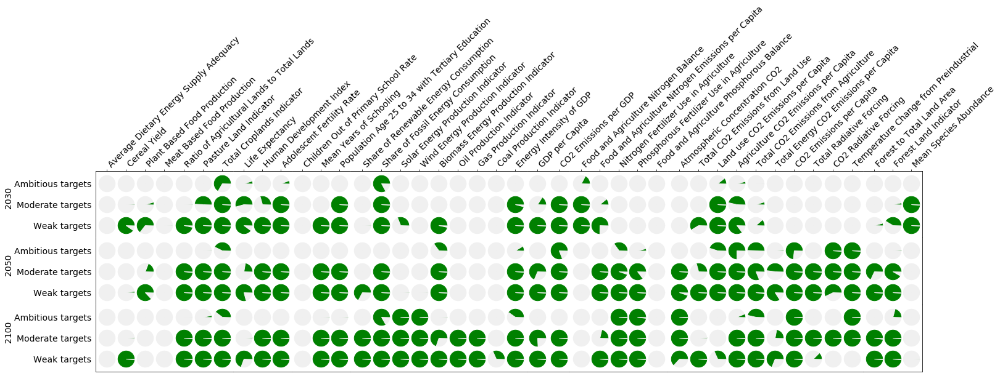

In [1205]:
# Function for drawing pie chart scatter plot
def draw_pie(dist, 
             xpos, 
             ypos, 
             size, 
             ax=None):
    if ax is None:
        fig, ax = plt.subplots(figsize=(10,8))

    # for incremental pie slices
    cumsum = np.cumsum(dist)
    cumsum = cumsum/ cumsum[-1]
    pie = [0] + cumsum.tolist()

    i = 0
    for r1, r2 in zip(pie[:-1], pie[1:]):
        angles = np.linspace(2 * np.pi * r1, 2 * np.pi * r2)
        x = [0] + np.cos(angles).tolist()
        y = [0] + np.sin(angles).tolist()

        xy = np.column_stack([x, y])
        slice_color = {0:'green', 1:'#f0f0f0'}
        ax.scatter([xpos], [ypos], marker=xy, color=slice_color[i], s=size)
        i =+ 1

    return ax

#Set the width ratio of subplots
fig = plt.figure(figsize=(24, 6))

width_ratios = [7,3,3,9,2.2,5,10,3]
grid = plt.GridSpec(3, 8, hspace=0, wspace=0, width_ratios= width_ratios, height_ratios= [1,1,1])

axes = {}
for c in range(1,8):
    axes[2,c] = fig.add_subplot(grid[2, c])
        
for r in range(3):
    axes[r,0] = fig.add_subplot(grid[r, 0])

for c in range(1,8):
    for r in range(0,2):
        axes[r,c] = fig.add_subplot(grid[r, c],sharex=axes[2,c], sharey=axes[r,0])

all_targets = [targets_2030, targets_2050, targets_2100]
      
for ssp in ['SSP1']:
    for y, year in enumerate([130,150,200]):
        # Iterate between ambitious, moderate, and weak targets and develop the stacked bar charts.
        for t in [0,1,2]:
            outcomes_norm = {}
            outcomes_norm[ssp] = pd.DataFrame(columns=indicator_list)
            for i, ind in enumerate(indicator_list):
                out_norm = outcomes[ssp][ind][:, year]
                #For indicators where reduction in indicator value is desired
                if all_targets[y][ind][t] < all_targets[y][ind][3]:
                    outcomes_norm[ssp][ind] = np.where(out_norm > all_targets[y][ind][3],
                                                            -(abs(out_norm - all_targets[y][ind][3])/abs(all_targets[y][ind][t]-all_targets[y][ind][3]))*100, 
                                                            (abs(out_norm - all_targets[y][ind][3])/abs(all_targets[y][ind][t]-all_targets[y][ind][3]))*100)
                #For indicators where increase in indicator value is desired
                if all_targets[y][ind][t] > all_targets[y][ind][3]:
                    outcomes_norm[ssp][ind] = np.where(out_norm < all_targets[y][ind][3],
                                                            -(abs(out_norm - all_targets[y][ind][3])/abs(all_targets[y][ind][t]-all_targets[y][ind][3]))*100, 
                                                            (abs(out_norm - all_targets[y][ind][3])/abs(all_targets[y][ind][t]-all_targets[y][ind][3]))*100)

            # Identify in each indicators, how many futures meet the ambitious target at different levels (green, yellow, orange, red).
            df_count = {}
            for group_name in ['green', 'yellow', 'orange', 'red']:
                df_count[group_name] = pd.DataFrame(index=['SSP1'], columns=indicator_list)

            # Count scenarios for differnet types of achivemengts.
            for i, ind in enumerate(indicator_list):
                df_count['green'].loc[ssp][ind] = outcomes_norm[ssp][outcomes_norm[ssp][ind] >= 100].count()[ind]
                df_count['yellow'].loc[ssp][ind] = outcomes_norm[ssp][(outcomes_norm[ssp][ind] < 100) & (outcomes_norm[ssp][ind] > 50)].count()[ind]
                df_count['orange'].loc[ssp][ind] = outcomes_norm[ssp][(outcomes_norm[ssp][ind] < 50) & (outcomes_norm[ssp][ind] > 0)].count()[ind]
                df_count['red'].loc[ssp][ind] = outcomes_norm[ssp][outcomes_norm[ssp][ind] <= 0].count()[ind]

            for g, sdg in enumerate(['2','3', '4', '7', '8', '12','13', '15']): #
                #x_val = list(range(len(sdg_inds[sdg]))) # Corresonding to SDG indicators in each each SDG
                #y_val = [0,1,2] # Corresponding to 'Ambitious', 'Moderate', 'Weak'
                for ind, indx in enumerate(sdg_inds[sdg]):
                    green_slice = df_count['green'].loc[ssp][indx].item()
                    grey_slice = df_count['yellow'].loc[ssp][indx].item() + df_count['orange'].loc[ssp][indx].item() + df_count['red'].loc[ssp][indx].item()
                    draw_pie([green_slice,grey_slice,10],ind,2-t,700,ax=axes[y,g])

        
                # Reduce the x margines in plots. The margines should be proportional to the width ratio of the subplot.
                axes[y, g].margins(x=.15/width_ratios[g], y=.25)
                axes[y, g].set_ylim(bottom=-.6, top=2.6)
                
                if (y == 0):
                    axes[y, g].set_xticks(np.arange(len(sdg_inds[sdg]))) # This helps to displace all label values
                    axes[y, g].set_xticklabels(sdg_inds[sdg], fontsize=14, rotation=45, ha='left')
                    axes[y, g].xaxis.tick_top()
                    axes[y, g].tick_params(axis='x', pad=0)
                else:
                    axes[y, g].tick_params(labelbottom=False)
                
                    
                # Remove all ticks and spines
                [s.set_visible(False) for s in axes[y, g].spines.values()]
                [t.set_visible(False) for t in axes[y, g].get_yticklines()]
                [t.set_visible(False) for t in axes[y, g].get_xticklines() if y != 0]
                axes[0, g].spines["top"].set_visible(True)
                axes[2, g].spines["bottom"].set_visible(True)
                
                if g != 0:
                    [l.set_visible(False) for l in axes[y, g].get_yticklabels()]
                    
        axes[y, 0].spines["left"].set_visible(True)
        axes[y, 7].spines["right"].set_visible(True)
        
        target_label = ['Weak targets','Moderate targets','Ambitious targets', 'Moderate targets']
        year_label = ['2030', '2050', '2100']
        axes[y,0].set_yticks(np.arange(3)) # This helps to displace all label values
        axes[y, 0].set_yticklabels(target_label, fontsize=14)
        axes[y,0].set_ylabel(year_label[y], size=14, labelpad=2, rotation='vertical', ha='center', position=(0,.6))
       

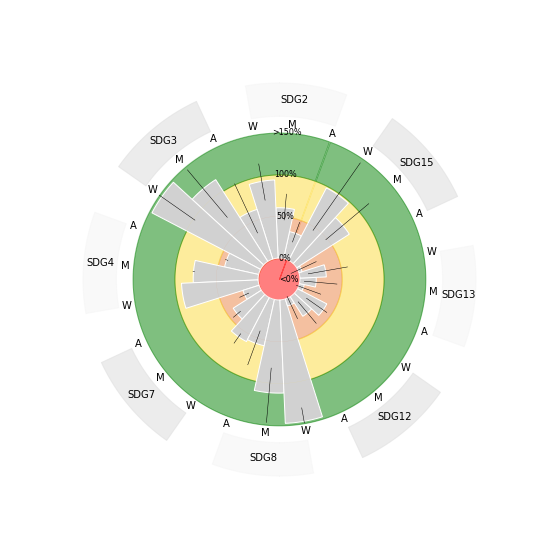

In [1807]:

fig, axes = plt.subplots(1, 3, figsize=(30, 10), subplot_kw ={'projection':'polar'})

all_targets = [targets_2030, targets_2050, targets_2100]
target_year = {130:'2030', 150:'2050', 200:'2100'}
target_level = {0: 'A', 1:'M', 2:'W'}

for ssp in ['SSP1']:
    x_bar_label = []
    y_bar = []
    err_bar = []
    outcomes_norm_dict = {}
    for y, year in enumerate([130,150,200]):
        # Iterate between ambitious, moderate, and weak targets and develop the stacked bar charts.
        
        for t in [0,1,2]:
            outcomes_norm = {}
            outcomes_norm[ssp] = pd.DataFrame(columns=indicator_list)
            for i, ind in enumerate(indicator_list):
                out_norm = outcomes[ssp][ind][:, year]
                #For indicators where reduction in indicator value is desired
                if all_targets[y][ind][t] < all_targets[y][ind][3]:
                    outcomes_norm[ssp][ind] = np.where(out_norm > all_targets[y][ind][3],
                                                            -(abs(out_norm - all_targets[y][ind][3])/abs(all_targets[y][ind][t]-all_targets[y][ind][3]))*100, 
                                                            (abs(out_norm - all_targets[y][ind][3])/abs(all_targets[y][ind][t]-all_targets[y][ind][3]))*100)
                #For indicators where increase in indicator value is desired
                if all_targets[y][ind][t] > all_targets[y][ind][3]:
                    outcomes_norm[ssp][ind] = np.where(out_norm < all_targets[y][ind][3],
                                                            -(abs(out_norm - all_targets[y][ind][3])/abs(all_targets[y][ind][t]-all_targets[y][ind][3]))*100, 
                                                            (abs(out_norm - all_targets[y][ind][3])/abs(all_targets[y][ind][t]-all_targets[y][ind][3]))*100)
            outcomes_norm[ssp][outcomes_norm[ssp] >= 150] = 150
            outcomes_norm[ssp][outcomes_norm[ssp] <= -25] = -25
            outcomes_norm_dict[(ssp, target_year[year], target_level[t])] = outcomes_norm[ssp]
    
    # Calculate the mean and error bars
    for g, sdg in enumerate(list(sdg_names.keys())):
        for y, year in enumerate([130]):
            for t in [0,1,2]:
                norm_df = outcomes_norm_dict[(ssp, target_year[year], target_level[t])]
                sdg_norm = norm_df[sdg_inds[sdg]].sum(axis=1)/len(sdg_inds[sdg])
                bar_data = np.mean(sdg_norm)
                error = (np.mean(sdg_norm)-np.amin(sdg_norm),np.amax(sdg_norm)-np.mean(sdg_norm))
                y_bar.append(bar_data)
                err_bar.append(error)
                x_bar_label.append(target_level[t])
    
    
    # Set the zero location of theta
    ax.set_theta_zero_location("N", offset=-20)
    
    N = len(x_bar_label)
    N_t = 8 # the numbre of SDGs
    theta = np.linspace(0.0, 2 * np.pi, N, endpoint=False)
    values = y_bar
    yerr = np.array(err_bar).T
    width = 2*np.pi/N
    metriclabels =  x_bar_label
    metrictitle = list(sdg_names.values())
    ax.bar(theta, values, yerr=yerr, width=width, bottom=0.0, color='#d1d1d1',
           edgecolor='white',zorder=1,alpha=1, error_kw = {'elinewidth':.5, 'ecolor ':'black', 'linestyle':'.'})

    # Show the metric label
    for n in range(N):
        ax.text(theta[n], 150+10, metriclabels[n], rotation=0,
                horizontalalignment='center', verticalalignment='center')
        #ax.text(theta[n], 150+50, metriclabels[n], rotation=(n+4.75)*360/N,
                #horizontalalignment='center', verticalalignment='center')
        
    # Annotate the SDG label
    for n in range(N_t):
        ax.text(theta[n*3+1], 150+40, metrictitle[n], rotation=0,
                horizontalalignment='center', verticalalignment='center')  
        
    # Draw the circles arounds the SDG label
    for n in range(N_t):
        theta_c = np.linspace(theta[n*3],  theta[n*3+2], 1000, endpoint=False)
        r_c = 170+0*theta_c
        r_c_2 = 210+0*theta_c
        if (n % 2) == 0:
            ax.plot(theta_c, r_c, lw=.1, color='none')
            ax.plot(theta_c, r_c_2, lw=.1, color='none')
            ax.fill_between(theta_c, r_c, r_c_2, color='#f4f4f4',alpha=0.5,zorder=-100)
        else:
            ax.plot(theta_c, r_c, lw=.1, color='none')
            ax.plot(theta_c, r_c_2, lw=.1, color='none')
            ax.fill_between(theta_c, r_c, r_c_2, color='#dbdbdb',alpha=0.5,zorder=-100)
    
    
    
    theta_2 = np.linspace(0.0, 2 * np.pi, 1000, endpoint=False)
    r = -25+0*theta_2
    r2 = 0 + 0*theta_2
    r3 = 50 + 0*theta_2
    r4 = 100 + 0*theta_2
    r5 = 150 + 0*theta_2
    ax.plot(theta_2, r, lw=.1, color='none')
    ax.plot(theta_2, r2, lw=.1, color='red',alpha=.5)
    ax.plot(theta_2, r3, lw=.1, color='#eb8242',alpha=.5)
    ax.plot(theta_2, r4, lw=.1,color='#fddb3a',alpha=.5)
    ax.plot(theta_2, r5, lw=.1,color='green',alpha=.5)
    ax.fill_between(theta_2, r, r2, color='red', alpha=0.5,zorder=-100)
    ax.fill_between(theta_2, r2, r3, color='#eb8242', alpha=0.5,zorder=-100)
    ax.fill_between(theta_2, r3, r4, color='#fddb3a',alpha=0.5,zorder=-100)
    ax.fill_between(theta_2, r4, r5, color='green',alpha=0.5,zorder=-100)
    
    ax.spines['polar'].set_visible(False)
    ax.grid(False)
    ax.set_thetagrids([], visible=False)
    ax.set_ylim(bottom=-25, top=300)
    ax.set_rgrids([-25,0,50,100, 150])
    #thetaticks = np.arange(0,360,N)
    #ax.set_thetagrids(thetaticks)
    #ax.tick_params(pad=0)
    #ax.set_thetalim(0, 2*np.pi)
    ax.set_yticklabels(['<0%', '0%', '50%', '100%', '>150%'],fontsize=8, rotation='vertical', va='center', zorder=120)



Text(1.0471975511965976, 250, 'D')

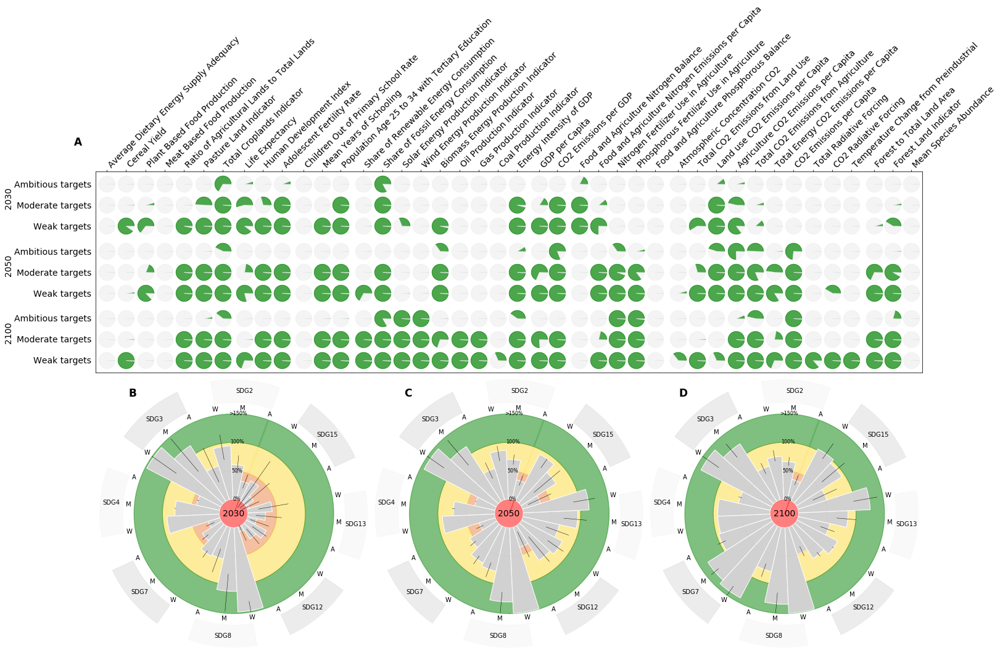

In [101]:
# Specify the name of the SSP to plot
SSP_list = ['SSP1']


# Create the figure
fig = plt.figure(figsize=(24, 14.2))

# Set the width ratio of subplots
width_ratios = [7,3,3,9,2,5,10,3]
g_lim = [0, 7,10,13,22,24,29,39,42]

grid = plt.GridSpec(5, 42, hspace=0, wspace=0, height_ratios= [2,2,2,.2,8])

axes = {}
# Create the subplots with the shared axis for scatter pie chart
for c in range(1,8):
    axes[2,c] = fig.add_subplot(grid[2, g_lim[c]:g_lim[c+1]])
        
for r in range(3):
    axes[r,0] = fig.add_subplot(grid[r, g_lim[0]:g_lim[1]])

for c in range(1,8):
    for r in range(0,2):
        axes[r,c] = fig.add_subplot(grid[r, g_lim[c]:g_lim[c+1]],sharex=axes[2,c], sharey=axes[r,0])

# Create the subplots for the bar polar charts
axes[4,0] = fig.add_subplot(grid[4,0:14], projection='polar')
axes[4,1] = fig.add_subplot(grid[4,14:28], projection='polar')
axes[4,2] = fig.add_subplot(grid[4,28:42], projection='polar')
     

        
"""
Firstly I develop the scatter pie chart
"""
# Function for drawing pie chart scatter plot
def draw_pie(dist, 
             xpos, 
             ypos, 
             size,
             alpha,
             ax=None):
    if ax is None:
        fig, ax = plt.subplots(figsize=(10,8))

    # for incremental pie slices
    cumsum = np.cumsum(dist)
    cumsum = cumsum/ cumsum[-1]
    pie = [0] + cumsum.tolist()

    i = 0
    for r1, r2 in zip(pie[:-1], pie[1:]):
        angles = np.linspace(2 * np.pi * r1, 2 * np.pi * r2)
        x = [0] + np.cos(angles).tolist()
        y = [0] + np.sin(angles).tolist()

        xy = np.column_stack([x, y])
        slice_color = {0:'green', 1:'#f0f0f0'}
        ax.scatter([xpos], [ypos], marker=xy, color=slice_color[i], alpha=alpha, s=size)
        i =+ 1

    return ax


all_targets = [targets_2030, targets_2050, targets_2100]
      
for ssp in SSP_list:
    for y, year in enumerate([130,150,200]):
        # Iterate between ambitious, moderate, and weak targets and develop the stacked bar charts.
        for t in [0,1,2]:
            outcomes_norm = {}
            outcomes_norm[ssp] = pd.DataFrame(columns=indicator_list)
            for i, ind in enumerate(indicator_list):
                out_norm = outcomes[ssp][ind][:, year]
                #For indicators where reduction in indicator value is desired
                if all_targets[y][ind][t] < all_targets[y][ind][3]:
                    outcomes_norm[ssp][ind] = np.where(out_norm > all_targets[y][ind][3],
                                                            -(abs(out_norm - all_targets[y][ind][3])/abs(all_targets[y][ind][t]-all_targets[y][ind][3]))*100, 
                                                            (abs(out_norm - all_targets[y][ind][3])/abs(all_targets[y][ind][t]-all_targets[y][ind][3]))*100)
                #For indicators where increase in indicator value is desired
                if all_targets[y][ind][t] > all_targets[y][ind][3]:
                    outcomes_norm[ssp][ind] = np.where(out_norm < all_targets[y][ind][3],
                                                            -(abs(out_norm - all_targets[y][ind][3])/abs(all_targets[y][ind][t]-all_targets[y][ind][3]))*100, 
                                                            (abs(out_norm - all_targets[y][ind][3])/abs(all_targets[y][ind][t]-all_targets[y][ind][3]))*100)

            # Identify in each indicators, how many futures meet the ambitious target at different levels (green, yellow, orange, red).
            df_count = {}
            for group_name in ['green', 'yellow', 'orange', 'red']:
                df_count[group_name] = pd.DataFrame(index=SSP_list, columns=indicator_list)

            # Count scenarios for differnet types of achivemengts.
            for i, ind in enumerate(indicator_list):
                df_count['green'].loc[ssp][ind] = outcomes_norm[ssp][outcomes_norm[ssp][ind] >= 100].count()[ind]
                df_count['yellow'].loc[ssp][ind] = outcomes_norm[ssp][(outcomes_norm[ssp][ind] < 100) & (outcomes_norm[ssp][ind] > 50)].count()[ind]
                df_count['orange'].loc[ssp][ind] = outcomes_norm[ssp][(outcomes_norm[ssp][ind] < 50) & (outcomes_norm[ssp][ind] > 0)].count()[ind]
                df_count['red'].loc[ssp][ind] = outcomes_norm[ssp][outcomes_norm[ssp][ind] <= 0].count()[ind]

            for g, sdg in enumerate(['2','3', '4', '7', '8', '12','13', '15']): #
                #x_val = list(range(len(sdg_inds[sdg]))) # Corresonding to SDG indicators in each each SDG
                #y_val = [0,1,2] # Corresponding to 'Ambitious', 'Moderate', 'Weak'
                for ind, indx in enumerate(sdg_inds[sdg]):
                    green_slice = df_count['green'].loc[ssp][indx].item()
                    grey_slice = df_count['yellow'].loc[ssp][indx].item() + df_count['orange'].loc[ssp][indx].item() + df_count['red'].loc[ssp][indx].item()
                    draw_pie([green_slice,grey_slice,10],ind,2-t,700, alpha=.7, ax=axes[y,g])

        
                # Reduce the x margines in plots. The margines should be proportional to the width ratio of the subplot.
                axes[y, g].margins(x=.15/width_ratios[g], y=.25)
                axes[y, g].set_ylim(bottom=-.6, top=2.6)
                
                if (y == 0):
                    axes[y, g].set_xticks(np.arange(len(sdg_inds[sdg]))) # This helps to displace all label values
                    axes[y, g].set_xticklabels(sdg_inds[sdg], fontsize=14, rotation=45, ha='left')
                    axes[y, g].xaxis.tick_top()
                    axes[y, g].tick_params(axis='x', pad=0)
                else:
                    axes[y, g].tick_params(labelbottom=False)
                
                    
                # Remove all ticks and spines
                [s.set_visible(False) for s in axes[y, g].spines.values()]
                [t.set_visible(False) for t in axes[y, g].get_yticklines()]
                [t.set_visible(False) for t in axes[y, g].get_xticklines() if y != 0]
                axes[0, g].spines["top"].set_visible(True)
                axes[2, g].spines["bottom"].set_visible(True)
                
                if g != 0:
                    [l.set_visible(False) for l in axes[y, g].get_yticklabels()]
                    
        axes[y, 0].spines["left"].set_visible(True)
        axes[y, 7].spines["right"].set_visible(True)
        
        target_label = ['Weak targets','Moderate targets','Ambitious targets', 'Moderate targets']
        year_label = ['2030', '2050', '2100']
        axes[y,0].set_yticks(np.arange(3)) # This helps to displace all label values
        axes[y, 0].set_yticklabels(target_label, fontsize=14)
        axes[y,0].set_ylabel(year_label[y], size=14, labelpad=2, rotation='vertical', ha='center', position=(0,.6))

        
        
"""
Second, I develop bar chart on the polar cordinate system.
"""

all_targets = [targets_2030, targets_2050, targets_2100]
target_year = {130:'2030', 150:'2050', 200:'2100'}
target_level = {0: 'A', 1:'M', 2:'W'}

for ssp in SSP_list:
    outcomes_norm_dict = {}
    for y, year in enumerate([130,150,200]):
        # Iterate between ambitious, moderate, and weak targets and develop the stacked bar charts.
        for t in [0,1,2]:
            outcomes_norm = {}
            outcomes_norm[ssp] = pd.DataFrame(columns=indicator_list)
            for i, ind in enumerate(indicator_list):
                out_norm = outcomes[ssp][ind][:, year]
                #For indicators where reduction in indicator value is desired
                if all_targets[y][ind][t] < all_targets[y][ind][3]:
                    outcomes_norm[ssp][ind] = np.where(out_norm > all_targets[y][ind][3],
                                                            -(abs(out_norm - all_targets[y][ind][3])/abs(all_targets[y][ind][t]-all_targets[y][ind][3]))*100, 
                                                            (abs(out_norm - all_targets[y][ind][3])/abs(all_targets[y][ind][t]-all_targets[y][ind][3]))*100)
                #For indicators where increase in indicator value is desired
                if all_targets[y][ind][t] > all_targets[y][ind][3]:
                    outcomes_norm[ssp][ind] = np.where(out_norm < all_targets[y][ind][3],
                                                            -(abs(out_norm - all_targets[y][ind][3])/abs(all_targets[y][ind][t]-all_targets[y][ind][3]))*100, 
                                                            (abs(out_norm - all_targets[y][ind][3])/abs(all_targets[y][ind][t]-all_targets[y][ind][3]))*100)
            outcomes_norm[ssp][outcomes_norm[ssp] >= 150] = 150
            outcomes_norm[ssp][outcomes_norm[ssp] <= -25] = -25
            outcomes_norm_dict[(ssp, target_year[year], target_level[t])] = outcomes_norm[ssp]
    
    # Calculate the mean and error bars
    for y, year in enumerate([130,150,200]):
        x_bar_label = []
        y_bar = []
        err_bar = []
        for g, sdg in enumerate(list(sdg_names.keys())):
            for t in [0,1,2]:
                norm_df = outcomes_norm_dict[(ssp, target_year[year], target_level[t])]
                sdg_norm = norm_df[sdg_inds[sdg]].sum(axis=1)/len(sdg_inds[sdg])
                bar_data = np.mean(sdg_norm)
                error = (np.mean(sdg_norm)-np.amin(sdg_norm),np.amax(sdg_norm)-np.mean(sdg_norm))
                y_bar.append(bar_data)
                err_bar.append(error)
                x_bar_label.append(target_level[t])


        # Set the zero location of theta
        axes[4,y].set_theta_zero_location("N", offset=-20)

        N = len(x_bar_label)
        N_t = 8 # the numbre of SDGs
        theta = np.linspace(0.0, 2 * np.pi, N, endpoint=False)
        values = y_bar
        yerr = np.array(err_bar).T
        width = 2*np.pi/N
        metriclabels =  x_bar_label
        metrictitle = list(sdg_names.values())
        axes[4,y].bar(theta, values, yerr=yerr, width=width, bottom=0.0, color='#d1d1d1',
               edgecolor='white',zorder=1,alpha=1, error_kw = {'elinewidth':.5, 'ecolor ':'black', 'linestyle':'.'})

        # Show the metric label
        for n in range(N):
            axes[4,y].text(theta[n], 150+10, metriclabels[n], rotation=0,
                    horizontalalignment='center', verticalalignment='center')
            #ax.text(theta[n], 150+50, metriclabels[n], rotation=(n+4.75)*360/N,
                    #horizontalalignment='center', verticalalignment='center')

        # Annotate the SDG label
        for n in range(N_t):
            axes[4,y].text(theta[n*3+1], 150+40, metrictitle[n], rotation=0,
                    horizontalalignment='center', verticalalignment='center')
        
        # Annotate each plot title at the center 
        axes[4,y].text(theta[0], -25, target_year[year], fontsize=14, rotation=0,
                    horizontalalignment='center', verticalalignment='center')

        # Draw the circles arounds the SDG label
        for n in range(N_t):
            theta_c = np.linspace(theta[n*3],  theta[n*3+2], 1000, endpoint=False)
            r_c = 170+0*theta_c
            r_c_2 = 210+0*theta_c
            if (n % 2) == 0:
                axes[4,y].plot(theta_c, r_c, lw=.1, color='none')
                axes[4,y].plot(theta_c, r_c_2, lw=.1, color='none')
                axes[4,y].fill_between(theta_c, r_c, r_c_2, color='#f4f4f4',alpha=0.5,zorder=-100)
            else:
                axes[4,y].plot(theta_c, r_c, lw=.1, color='none')
                axes[4,y].plot(theta_c, r_c_2, lw=.1, color='none')
                axes[4,y].fill_between(theta_c, r_c, r_c_2, color='#dbdbdb',alpha=0.5,zorder=-100)



        theta_2 = np.linspace(0.0, 2 * np.pi, 1000, endpoint=False)
        r = -25+0*theta_2
        r2 = 0 + 0*theta_2
        r3 = 50 + 0*theta_2
        r4 = 100 + 0*theta_2
        r5 = 150 + 0*theta_2
        axes[4,y].plot(theta_2, r, lw=.1, color='none')
        axes[4,y].plot(theta_2, r2, lw=.1, color='red',alpha=.5)
        axes[4,y].plot(theta_2, r3, lw=.1, color='#eb8242',alpha=.5)
        axes[4,y].plot(theta_2, r4, lw=.1,color='#fddb3a',alpha=.5)
        axes[4,y].plot(theta_2, r5, lw=.1,color='green',alpha=.5)
        axes[4,y].fill_between(theta_2, r, r2, color='red', alpha=0.5,zorder=-100)
        axes[4,y].fill_between(theta_2, r2, r3, color='#eb8242', alpha=0.5,zorder=-100)
        axes[4,y].fill_between(theta_2, r3, r4, color='#fddb3a',alpha=0.5,zorder=-100)
        axes[4,y].fill_between(theta_2, r4, r5, color='green',alpha=0.5,zorder=-100)

        axes[4,y].spines['polar'].set_visible(False)
        axes[4,y].grid(False)
        axes[4,y].set_thetagrids([], visible=False)
        axes[4,y].set_ylim(bottom=-25, top=210)
        axes[4,y].set_rgrids([-25,0,50,100, 150])
        #thetaticks = np.arange(0,360,N)
        #ax.set_thetagrids(thetaticks)
        #ax.tick_params(pad=0)
        #ax.set_thetalim(0, 2*np.pi)
        axes[4,y].set_yticklabels(['', '0%', '50%', '100%', '>150%'],fontsize=8, rotation='vertical', va='center', zorder=120)

# Add all subplot labels
axes[0,0].text(-1.5, 4, 'A', fontsize=17, fontweight='heavy', rotation=0,
                    horizontalalignment='center', verticalalignment='center')
axes[4,0].text(theta[4], 250, 'B', fontsize=17, fontweight='heavy', rotation=0,
                    horizontalalignment='center', verticalalignment='center')
axes[4,1].text(theta[4], 250, 'C', fontsize=17, fontweight='heavy', rotation=0,
                    horizontalalignment='center', verticalalignment='center')
axes[4,2].text(theta[4], 250, 'D', fontsize=17, fontweight='heavy', rotation=0,
                    horizontalalignment='center', verticalalignment='center')